In [6]:
import json
import yaml
import pandas as pd
import seaborn as sns
from pymoo.indicators.hv.exact import ExactHypervolume
from pymoo.indicators.hv.exact_2d import ExactHypervolume2D
from pymoo.indicators.igd_plus import IGDPlus
from pymoo.indicators.hv import HV
import numpy as np
import matplotlib.pyplot as plt
import pydotplus
from collections import defaultdict

In [2]:
def get_dot_full(dot_path):
    graph_output = {}
    succ = defaultdict(list)
    preds = defaultdict(list)
    if "https" in dot_path:
        urllib.request.urlretrieve(dot_path, "tmp")

    graph = pydotplus.graphviz.graph_from_dot_file(dot_path)
    nodes = graph.get_nodes()
    for node in nodes:
        if node.get("size"):
            st = node.get("size").replace("'", "").replace('"', "")
            graph_output[node.get_name()] = float(st)
    edges = graph.get_edges()
    for edge in edges:
        succ[edge.get_source()].append(edge.get_destination())
        preds[edge.get_destination()].append(edge.get_source())

    return graph_output, succ, preds

In [3]:
def read_json(filename):
    try:
        with open(filename, "r") as stream:
            return json.load(stream)
    except:
        print(filename)
        filename = filename.replace("json", "yml")
        return read_yaml(filename)

def read_yaml(filename):
    try:
        with open(filename, "r") as stream:
            try:
                return yaml.safe_load(stream)
            except yaml.YAMLError as exc:
                print(exc)
    except:
        #print(filename)
        return None
    
def add_in_list(dcx, column, value):
    l = dcx.get(column, [])
    l.append(value)
    dcx[column] = l

In [4]:
def dominates(s1, s2):
    better = 0
    eq = 0
    worse = 0
    for i in range(len(s1)):
        if s1[i] < s2[i]:
            better = better + 1
        elif s1[i] == s2[i]:
            eq = eq + 1
        else:
            worse = worse + 1

    if better == len(s1):
        # fullly dominates
        return 1
    if worse == len(s1):
        # fully dominated
        return -1
    if eq == len(s1):
        # exactly the same
        return 0

    if better > 0 and worse == 0:
        # dominates a little
        return 1
    if worse > 0 and better == 0:
        # is dominated a little
        return -1
    return 0


def remove_dominated(pop):
    returning = {}
    for idi, datai in pop.items():
        dominated = False
        for idj, dataj in pop.items():
            if idi != idj:
                if dominates(datai, dataj) == -1:
                    dominated = True
                    break
        if not dominated:
            returning[idi]=datai
    return returning


def normalize(pops, row, obj_name):
    problem_name = row['problem']
    all_solutions = list(pops[problem_name].values())
    if "1" in obj_name:
        min_value_obj = min([el[0] for el in all_solutions])
        max_value_obj = max([el[0] for el in all_solutions])
    elif "2" in obj_name:
        min_value_obj = min([el[1] for el in all_solutions])
        max_value_obj = max([el[1] for el in all_solutions])
        
    value = row[obj_name]
    val = (value - min_value_obj)/(max_value_obj - min_value_obj)
    print(value, min_value_obj,max_value_obj, val)
    return val

    

In [62]:
def validate(succ, s):
    tasks = {}
    for machine_name, tasks_in_machine in s['x_aws_tasks'].items():
        for task, task_data in tasks_in_machine.items():
            task_data['machine'] = machine_name
            tasks[task] = task_data

    for task, task_data in tasks.items():         
        for p in succ.get(task, []):
                if not task_data['AFT'] <= tasks[p]['EST']:
                    #print(task, p, task_data, tasks[p], task_data['EST'], tasks[p]['AFT'])
                    return False
    return True



        

In [438]:
def validade_population(data, succs, perregion):
    if succs.get(data['problem_file_path']):
        succ = succs.get(data['problem_file_path'])
    else:
        graph_output, succ, preds=get_dot_full('datasets/'+data['problem_file_path'])
        succs[data['problem_file_path']] = succ
    npop = []
    for s in data['population']:
        r=validate(succ, s)
        if r:
            npop.append(s)
            perregion[s['region']] = perregion.get(s['region'], 0 ) + 1
    len1=len(data['population'])
    len2=len(npop)
    if len1!=len2:
        print(len1, len2, data['algorithm_name'], data['heuristic_name'], data['problem_name'], data['execution_id'])
    
    data['population'] = npop

In [ ]:
data

In [37]:
succ['ID00002']

['ID00003',
 'ID00005',
 'ID00007',
 'ID00009',
 'ID00011',
 'ID00013',
 'ID00015',
 'ID00017',
 'ID00019',
 'ID00021',
 'ID00023',
 'ID00025',
 'ID00027',
 'ID00029',
 'ID00031',
 'ID00033',
 'ID00035',
 'ID00037',
 'ID00039',
 'ID00041',
 'ID00043',
 'ID00045']

In [38]:
tasks['ID00003']

{'machine_type': 'c5.9xlarge',
 'AFT': 3.855063829787227,
 'EST': 3.700399345335512,
 'machine': 'host0'}

In [35]:
tasks['ID00002']

{'machine_type': 'c5.9xlarge',
 'AFT': 1.8692405891980286,
 'EST': 1.3279836333878876,
 'machine': 'host0'}

In [59]:
data

{'seed': 9890,
 'algorithm_name': 'NSGA2',
 'heuristic_name': 'PEFT',
 'n_gen': 700,
 'pop_size': 50,
 'problem_name': 'Montage_50',
 'problem_file_path': 'Montage_50.dot',
 'verbose': False,
 'eager_aws': False,
 'execution_id': 1,
 'starting_region': 'us-east-1',
 'population': [{'X': {'m1.small': 1},
   'F': [534.0719999999999, 0.044],
   'region': 'us-east-1',
   'x_aws_tasks': {'host0': {'root': {'machine_type': 'm1.small',
      'AFT': 0,
      'EST': 0,
      'machine': 'host0'},
     'ID00000': {'machine_type': 'm1.small',
      'AFT': 13.734000000000002,
      'EST': 0,
      'machine': 'host0'},
     'ID00003': {'machine_type': 'm1.small',
      'AFT': 27.709500000000006,
      'EST': 13.734000000000002,
      'machine': 'host0'},
     'ID00001': {'machine_type': 'm1.small',
      'AFT': 41.8635,
      'EST': 27.709500000000006,
      'machine': 'host0'},
     'ID00007': {'machine_type': 'm1.small',
      'AFT': 55.692,
      'EST': 41.8635,
      'machine': 'host0'},
     'I

In [439]:
problems=['CyberShake_100.dot', 'Epigenomics_100.dot', 'Inspiral_100.dot', 'Montage_100.dot', 'Sipht_100.dot', 'Epigenomics_24.dot', 'CyberShake_30.dot', 'Epigenomics_46.dot', 'Inspiral_30.dot', 'Montage_25.dot', 'Sipht_30.dot', 'CyberShake_50.dot', 'Inspiral_50.dot']
#, 'Sipht_60.dot' 'Montage_50.dot'
#problems=['CyberShake_100.dot', 'Epigenomics_100.dot', 'Inspiral_100.dot', 'Montage_100.dot', 'Sipht_100.dot', 'Epigenomics_24.dot', 'CyberShake_30.dot', 'Epigenomics_46.dot', 'Inspiral_30.dot']
algs=['AGEMOEA', 'NSGA2', 'SMSEMOA']

problems=['CyberShake_100.dot', 'Epigenomics_100.dot']
problems=['CyberShake_100.dot', 'Epigenomics_100.dot', 
          "Epigenomics_24.dot","CyberShake_30.dot","Epigenomics_46.dot",
          "Inspiral_30.dot","Montage_25.dot","Sipht_30.dot",
          "CyberShake_50.dot","Sipht_60.dot","Sipht_100.dot", 
          'Inspiral_100.dot', 'Montage_100.dot', 'Inspiral_50.dot', 'Montage_50.dot']

problems=list(set(problems))
 

heurs=['DLS', 'HCPT', 'HEFT', 'PEFT']
heurs=['DLS', 'HEFT', 'PEFT']
heurs=['HEFT', 'PEFT', 'HSIP', 'MPEFT']
#problems=['Inspiral_100.dot', 'Montage_100.dot', 'CyberShake_100.dot']
algs=['NSGA2', 'AGEMOEA']
#problems=['CyberShake_100.dot', 'Montage_100.dot', 'Inspiral_100.dot']
#NSGA2 ['DLS', 'HEFT', 'PEFT'] funciona ate
pop=100
gen=700
qtdExp=21
pops = {}

succs = {}
perregion = {}
dire="outputf/"
#dire="outputf/"
for problem_name in problems:
    problem_name = problem_name.replace(".dot", "")
    pop = {}
    for algorithm_name in algs:
        for heuristic_name in heurs:
            for execution_id in range(qtdExp):

                filename = (
                        dire
                        + algorithm_name
                        + "_"
                        + str(execution_id)
                        + "_"
                        + problem_name
                        + "_"
                        + heuristic_name
                    )
                data = read_json(filename+".json")
                if data:
                    validade_population(data, succs, perregion)
                    for idnum, el in enumerate(data['population']):
                        idx = (
                            algorithm_name
                            + "_"
                            + str(execution_id)
                            + "_"
                            + heuristic_name
                            + "_"
                            + str(idnum)    
                        )
                        #el['F'][1] = el['F'][1] * 3600
                        pop[idx] = el['F']
                
                        
                #filename = (
                #        'resp2/'
                #        + problem_name
                #        + '_pysim'
                #)
                #data = read_json(filename+".json")
                #for id_sol, solution in enumerate(data):
                #    idx = (
                #        'NSGA2'
                #        + "_"
                #        + str(666)
                #        + "_"
                #        + "Zhu"
                #        + "_"
                #        + str(id_sol)    
                #    )
                #    pop[idx] = solution[1:3]
    pops[problem_name] = pop

outputf/NSGA2_13_Sipht_100_PEFT.json
outputf/NSGA2_13_Sipht_100_HSIP.json
outputf/NSGA2_13_Sipht_100_MPEFT.json
outputf/AGEMOEA_13_Sipht_100_PEFT.json
outputf/AGEMOEA_13_Sipht_100_HSIP.json
outputf/AGEMOEA_12_Sipht_100_MPEFT.json
outputf/AGEMOEA_13_Sipht_100_MPEFT.json
70 68 NSGA2 PEFT Montage_50 1
62 61 NSGA2 PEFT Montage_50 2
62 61 NSGA2 PEFT Montage_50 3
68 67 NSGA2 PEFT Montage_50 5
63 62 NSGA2 PEFT Montage_50 6
55 54 NSGA2 PEFT Montage_50 7
64 63 NSGA2 PEFT Montage_50 8
66 64 NSGA2 PEFT Montage_50 9
65 64 NSGA2 PEFT Montage_50 11
71 69 NSGA2 PEFT Montage_50 12
outputf/NSGA2_13_Montage_50_PEFT.json
60 57 NSGA2 PEFT Montage_50 14
58 57 NSGA2 PEFT Montage_50 15
67 66 NSGA2 PEFT Montage_50 16
56 55 NSGA2 PEFT Montage_50 20
outputf/NSGA2_13_Montage_50_HSIP.json
outputf/NSGA2_13_Montage_50_MPEFT.json
54 53 AGEMOEA PEFT Montage_50 2
59 58 AGEMOEA PEFT Montage_50 3
61 60 AGEMOEA PEFT Montage_50 4
56 55 AGEMOEA PEFT Montage_50 5
62 60 AGEMOEA PEFT Montage_50 6
61 60 AGEMOEA PEFT Montage_50

In [103]:

sorted(list(pops['Inspiral_30'].keys()))

['AGEMOEA_0_HEFT_0',
 'AGEMOEA_0_HEFT_1',
 'AGEMOEA_0_HEFT_10',
 'AGEMOEA_0_HEFT_11',
 'AGEMOEA_0_HEFT_12',
 'AGEMOEA_0_HEFT_13',
 'AGEMOEA_0_HEFT_14',
 'AGEMOEA_0_HEFT_15',
 'AGEMOEA_0_HEFT_16',
 'AGEMOEA_0_HEFT_17',
 'AGEMOEA_0_HEFT_18',
 'AGEMOEA_0_HEFT_19',
 'AGEMOEA_0_HEFT_2',
 'AGEMOEA_0_HEFT_20',
 'AGEMOEA_0_HEFT_21',
 'AGEMOEA_0_HEFT_22',
 'AGEMOEA_0_HEFT_23',
 'AGEMOEA_0_HEFT_24',
 'AGEMOEA_0_HEFT_25',
 'AGEMOEA_0_HEFT_26',
 'AGEMOEA_0_HEFT_27',
 'AGEMOEA_0_HEFT_28',
 'AGEMOEA_0_HEFT_29',
 'AGEMOEA_0_HEFT_3',
 'AGEMOEA_0_HEFT_30',
 'AGEMOEA_0_HEFT_31',
 'AGEMOEA_0_HEFT_32',
 'AGEMOEA_0_HEFT_33',
 'AGEMOEA_0_HEFT_34',
 'AGEMOEA_0_HEFT_35',
 'AGEMOEA_0_HEFT_36',
 'AGEMOEA_0_HEFT_37',
 'AGEMOEA_0_HEFT_38',
 'AGEMOEA_0_HEFT_39',
 'AGEMOEA_0_HEFT_4',
 'AGEMOEA_0_HEFT_40',
 'AGEMOEA_0_HEFT_41',
 'AGEMOEA_0_HEFT_42',
 'AGEMOEA_0_HEFT_43',
 'AGEMOEA_0_HEFT_44',
 'AGEMOEA_0_HEFT_45',
 'AGEMOEA_0_HEFT_46',
 'AGEMOEA_0_HEFT_47',
 'AGEMOEA_0_HEFT_48',
 'AGEMOEA_0_HEFT_49',
 'AGEMOEA_0_HEF

In [104]:
nds = {}
for problem, pop in pops.items():
    nds[problem]=remove_dominated(pop)
    #nds[problem]=pop
    print(len(nds[problem]))

2607
1745
4135
3252
1267
1513
3491
3365
1266
3210
3248
1622
2715
3064
3773


In [105]:
nds['CyberShake_100']

{'NSGA2_0_HEFT_0': [2348.4404999999974, 0.044],
 'NSGA2_0_HEFT_1': [106.24281818181817, 0.21400000000000002],
 'NSGA2_0_HEFT_37': [44.628818181818176, 0.42500000000000004],
 'NSGA2_0_HEFT_47': [1.4364472847959187, 37.079],
 'NSGA2_0_HEFT_50': [1.9026535785659218, 21.588],
 'NSGA2_0_HEFT_51': [1.6791632873037696, 26.853],
 'NSGA2_0_HEFT_57': [44.628818181818176, 0.42500000000000004],
 'NSGA2_1_HEFT_0': [2348.4404999999974, 0.044],
 'NSGA2_1_HEFT_1': [106.24281818181817, 0.21400000000000002],
 'NSGA2_1_HEFT_3': [53.33430498248181, 0.384],
 'NSGA2_1_HEFT_51': [1.6791632873037696, 26.853],
 'NSGA2_1_HEFT_58': [44.628818181818176, 0.42500000000000004],
 'NSGA2_2_HEFT_0': [2348.4404999999974, 0.044],
 'NSGA2_2_HEFT_16': [11.358841596130674, 2.04],
 'NSGA2_2_HEFT_31': [44.628818181818176, 0.42500000000000004],
 'NSGA2_2_HEFT_47': [1.6791632873037696, 26.853],
 'NSGA2_2_HEFT_54': [44.628818181818176, 0.42500000000000004],
 'NSGA2_2_HEFT_58': [11.358841596130674, 2.04],
 'NSGA2_2_HEFT_67': [3.7

In [106]:
dcx={}
for problem in problems:
    problem = problem.replace('.dot','')
    for ids, data in nds[problem].items():
        id_arr = ids.split('_')
        add_in_list(dcx, 'alg', id_arr[0])
        add_in_list(dcx, 'heu', id_arr[2])
        add_in_list(dcx, 'problem', problem)
        add_in_list(dcx, 'exec', int(id_arr[1]))
        add_in_list(dcx, 'obj1', data[0])
        add_in_list(dcx, 'obj2', data[1])
        

In [107]:
df =pd.DataFrame(dcx)
df['algorithm']=df['alg']+"_"+df['heu']
df['obj1_n']=df.apply(lambda row : normalize(pops, row, 'obj1'), axis=1)
df['obj2_n']=df.apply(lambda row : normalize(pops, row, 'obj2'), axis=1)

40.75966801963993 11.390829793939396 1658.974502727273 0.017825400134860947
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
14.259666264680707 11.390829793939396 1658.974502727273 0.0017412387108896733
12.684488581818183 11.390829793939396 1658.974502727273 0.0007851854865589777
13.066059915151516 11.390829793939396 1658.974502727273 0.0010167799965081989
13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
64.27057089273633 11.390829793939396 1658.974502727273 0.0320953296439571
15.093428581818184 11.390829793939396 1658.974502727273 0.00224729028862415
18.661967054545457 11.390829793939396 1658.974502727273 0.00441321274303516
52.67706052385913 11.390829793939396 1658.974502727273 0.025058654930959802
27.52540321232764 11.390829793939396 1658.974502727273 0.009792870421969215
44.23932007272726 11.390829793939396 1658.974502727273 0.019937373025981073
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
43.

52.67706052385913 11.390829793939396 1658.974502727273 0.025058654930959802
27.52540321232764 11.390829793939396 1658.974502727273 0.009792870421969215
561.8245788636369 11.390829793939396 1658.974502727273 0.33408545988423977
40.75966801963993 11.390829793939396 1658.974502727273 0.017825400134860947
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
14.259666264680707 11.390829793939396 1658.974502727273 0.0017412387108896733
12.684488581818183 11.390829793939396 1658.974502727273 0.0007851854865589777
13.512995854545457 11.390829793939396 1658.974502727273 0.0012880475179920833
13.066059915151516 11.390829793939396 1658.974502727273 0.0010167799965081989
13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
15.093428581818184 11.390829793939396 1658.974502727273 0.00224729028862415
18.661967054545457 11.390829793939396 1658.974502727273 0.00441321274303516
55.17116222490932 11.390829793939396 1658.974502727273 0.026572448580425703


349.9118822727272 11.390829793939396 1658.974502727273 0.20546516576975418
44.01453644498186 11.390829793939396 1658.974502727273 0.019800940727313532
413.63660954545446 11.390829793939396 1658.974502727273 0.24414285378014378
13.512995854545457 11.390829793939396 1658.974502727273 0.0012880475179920833
12.684488581818183 11.390829793939396 1658.974502727273 0.0007851854865589777
13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
18.446412509090912 11.390829793939396 1658.974502727273 0.004282382030765006
38.3267923878788 11.390829793939396 1658.974502727273 0.016348767614322746
19.76905675151515 11.390829793939396 1658.974502727273 0.005085160222945937
29.52141614545455 11.390829793939396 1658.974502727273 0.011004349368937193
18.661967054545457 11.390829793939396 1658.974502727273 0.00441321274303516
52.67706052385913 11.390829793939396 1658.974502727273 0.025058654930959802
27.271131091115517 11.390829793939396 1658.974502727273 0.009638540098484388
203.98

13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
15.093428581818184 11.390829793939396 1658.974502727273 0.00224729028862415
18.661967054545457 11.390829793939396 1658.974502727273 0.00441321274303516
52.67706052385913 11.390829793939396 1658.974502727273 0.025058654930959802
27.271131091115517 11.390829793939396 1658.974502727273 0.009638540098484388
27.52540321232764 11.390829793939396 1658.974502727273 0.009792870421969215
19.604449114714583 11.390829793939396 1658.974502727273 0.004985251708735243
63.30236267024539 11.390829793939396 1658.974502727273 0.03150767619824944
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
55.17116222490932 11.390829793939396 1658.974502727273 0.026572448580425703
251.57276116959068 11.390829793939396 1658.974502727273 0.1457782905483853
145.63834596491228 11.390829793939396 1658.974502727273 0.0814814557684713
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
561.8234

14.259666264680707 11.390829793939396 1658.974502727273 0.0017412387108896733
561.8245788636369 11.390829793939396 1658.974502727273 0.33408545988423977
281.83397704545445 11.390829793939396 1658.974502727273 0.16414531880497582
561.8245788636369 11.390829793939396 1658.974502727273 0.33408545988423977
40.75966801963993 11.390829793939396 1658.974502727273 0.017825400134860947
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
15.093428581818184 11.390829793939396 1658.974502727273 0.00224729028862415
14.259666264680707 11.390829793939396 1658.974502727273 0.0017412387108896733
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
12.684488581818183 11.390829793939396 1658.974502727273 0.0007851854865589777
13.066059915151516 11.390829793939396 1658.974502727273 0.0010167799965081989
43.02843129696971 11.390829793939396 1658.974502727273 0.0192024247525488
52.

13.066059915151516 11.390829793939396 1658.974502727273 0.0010167799965081989
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
15.093428581818184 11.390829793939396 1658.974502727273 0.00224729028862415
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
14.259666264680707 11.390829793939396 1658.974502727273 0.0017412387108896733
281.83397704545445 11.390829793939396 1658.974502727273 0.16414531880497582
145.63834596491228 11.390829793939396 1658.974502727273 0.0814814557684713
561.8245788636369 11.390829793939396 1658.974502727273 0.33408545988423977
807.4852695454542 11.390829793939396 1658.974502727273 0.48318908036649827
829.487251363636 11.390829793939396 1658.974502727273 0.4965431710749901
58.50659355155483 11.390829793939396 1658.974502727273 0.028596886781313648
25.26668211288138 11.390829793939396 1658.974502727273 0.008421940898599477
49.32387694704051 11.390829793939396 1658.974502727273 0.02302344201163737
829.48725136

13.767719114244018 11.390829793939396 1658.974502727273 0.0014426516597320024
12.684488581818183 11.390829793939396 1658.974502727273 0.0007851854865589777
19.76905675151515 11.390829793939396 1658.974502727273 0.005085160222945937
36.92583493333334 11.390829793939396 1658.974502727273 0.015498457261312746
55.17116222490932 11.390829793939396 1658.974502727273 0.026572448580425703
11.476769003908938 11.390829793939396 1658.974502727273 5.21607560097613e-05
11.390829793939396 11.390829793939396 1658.974502727273 0.0
13.512995854545457 11.390829793939396 1658.974502727273 0.0012880475179920833
19.604449114714583 11.390829793939396 1658.974502727273 0.004985251708735243
27.4090468440145 11.390829793939396 1658.974502727273 0.009722247988508232
76.2974443613707 11.390829793939396 1658.974502727273 0.039395033850919706
36.49172366612111 11.390829793939396 1658.974502727273 0.015234973667523943
119.2338829906542 11.390829793939396 1658.974502727273 0.06545528155466158
426.87063228070167 11.3

43.02843129696971 11.390829793939396 1658.974502727273 0.0192024247525488
561.8234462523819 11.390829793939396 1658.974502727273 0.3340847724464643
11.577398884848487 11.390829793939396 1658.974502727273 0.00011323800664819992
13.066059915151516 11.390829793939396 1658.974502727273 0.0010167799965081989
77.58304411214954 11.390829793939396 1658.974502727273 0.040175327909363484
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
63.30236267024539 11.390829793939396 1658.974502727273 0.03150767619824944
251.57276116959068 11.390829793939396 1658.974502727273 0.1457782905483853
145.63834596491228 11.390829793939396 1658.974502727273 0.0814814557684713
40.75966801963993 11.390829793939396 1658.974502727273 0.017825400134860947
29.10753402660217 11.390829793939396 1658.974502727273 0.010753143845568837
561.8234462523819 11.390829793939396 1658.974502727273 0.3340847724464643
43.02843129696971 11.390829793939396 1658.974502727273 0.0192024247525488
12.684488581818183

0.6194890875163634 0.32818545454545445 534.0719999999999 0.0005457742554243711
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
0.5051731718690908 0.32818545454545445 534.0719999999999 0.00033159675578509925
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
0.5051731718690908 0.32818545454545445 534.0719999999999 0.00033159675578509925
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.044867619

0.3360766523563635 0.32818545454545445 534.0719999999999 1.4784616881470298e-05
0.4697130159927272 0.32818545454545445 534.0719999999999 0.00026516009664261884
0.5172470378297275 0.32818545454545445 534.0719999999999 0.0003542178440892681
1.0723490909090907 0.32818545454545445 534.0719999999999 0.0013942337430127953
0.6275290330761977 0.32818545454545445 534.0719999999999 0.00056083755984258
5.393303314322855 0.32818545454545445 534.0719999999999 0.009489792146988989
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
16.91072727272727 0.32818545454545445 534.0719999999999 0.031068354079763525
7.591684210526315 0.32818545454545445 534.0719999999999 0.013608586288098875
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
16.91072727272727 0.32818545454545445 534.0719999999999 0.031068354079763525
24.275999999999996 0.32818545454545445 534.0719999999999 0.044867619

0.36379907102545456 0.32818545454545445 534.0719999999999 6.672417648592197e-05
0.4494688919672725 0.32818545454545445 534.0719999999999 0.0002272315558824886
0.6122839250836363 0.32818545454545445 534.0719999999999 0.0005322749656220841
0.6712230657489897 0.32818545454545445 534.0719999999999 0.0006427008648253321
0.4512534175381817 0.32818545454545445 534.0719999999999 0.00023057496806315982
1.2947199999999992 0.32818545454545445 534.0719999999999 0.0018108585413353453
1.1056263919200673 0.32818545454545445 534.0719999999999 0.0014565806969335936
12.492912280701749 0.32818545454545445 534.0719999999999 0.02279132140672391
0.32818545454545445 0.32818545454545445 534.0719999999999 0.0
0.33679090569818165 0.32818545454545445 534.0719999999999 1.6122811952501517e-05
0.36379907102545456 0.32818545454545445 534.0719999999999 6.672417648592197e-05
0.4223166523563636 0.32818545454545445 534.0719999999999 0.00017636025982066498
0.6712230657489897 0.32818545454545445 534.0719999999999 0.000642

10.335192982456139 0.32818545454545445 534.0719999999999 0.01874870912824128
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
3.9618860443919997 0.32818545454545445 534.0719999999999 0.006807948852655216
2.192684401451027 0.32818545454545445 534.0719999999999 0.003493246940001379
0.749167639476768 0.32818545454545445 534.0719999999999 0.0007887345454107591
0.5905202887199998 0.32818545454545445 534.0719999999999 0.000491499530346697
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
8.59264059416061 0.32818545454545445 534.0719999999999 0.015483936140137397
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082

5.874633815851197 0.32818545454545445 534.0719999999999 0.010391592764459846
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
534.0719999999997 0.32818545454545445 534.0719999999999 0.9999999999999996
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
0.3623963636363636 0.32818545454545445 534.0719999999999 6.409612281885419e-05
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
0.4425021069018181 0.32818545454545445 534.0719999999999 0.0002141788799064917
1.2139781818181816 0.32818545454545445 534.0719999999999 0.001659584060992039
0.5624586239835219 0.32818545454545445 534.0719999999999 0.00043892437355471465
3.9618860443919997 0.32818545454545445 534.0719999999999 0.006807948852655216
3.3252430246532714 0.32818545454545445 534.0719999999999 0.005615161222355641
5.092990654205607 0.32818545454545445 534.0719999999999 0.008927138956575908
1.6938565958287441 0.32818545454545445 534.0719999999999 0.002558664

5.393303314322855 0.32818545454545445 534.0719999999999 0.009489792146988989
3.7737196261682255 0.32818545454545445 534.0719999999999 0.006455408152236945
2.0534631751227503 0.32818545454545445 534.0719999999999 0.0032324078959988928
0.4697130159927272 0.32818545454545445 534.0719999999999 0.00026516009664261884
0.4767130159927271 0.32818545454545445 534.0719999999999 0.0002782750027253455
0.9296763636363634 0.32818545454545445 534.0719999999999 0.0011269281117630358
0.9574472727272725 0.32818545454545445 534.0719999999999 0.0011789585209857811
7.591684210526315 0.32818545454545445 534.0719999999999 0.013608586288098875
16.91072727272727 0.32818545454545445 534.0719999999999 0.031068354079763525
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
6.4925614035087715 0.32818545454545445 534.0719999999999 0.011549315947039137
48.55199999999999 0.32818545454545445 534.0719999999999 0.090350

7.591684210526315 0.32818545454545445 534.0719999999999 0.013608586288098875
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
16.91072727272727 0.32818545454545445 534.0719999999999 0.031068354079763525
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
3.7737196261682255 0.32818545454545445 534.0719999999999 0.006455408152236945
0.7327854545454544 0.32818545454545445 534.0719999999999 0.0007580415715816105
4.371794392523366 0.32818545454545445 534.0719999999999 0.007575935922407869
5.393303314322855 0.32818545454545445 534.0719999999999 0.009489792146988989
1.2406799999999991 0.32818545454545445 534.0719999999999 0.001709611466376694
0.9294981818181816 0.32818545454545445 534.0719999999999 0.00112659427779

1.4390714202329264 0.32818545454545445 534.0719999999999 0.00208130930123007
0.6203545420618181 0.32818545454545445 534.0719999999999 0.0005473957347218719
4.544264977442515 0.32818545454545445 534.0719999999999 0.007899069568586096
12.492912280701749 0.32818545454545445 534.0719999999999 0.02279132140672391
0.8711845081285979 0.32818545454545445 534.0719999999999 0.001017340227250354
4.544264977442515 0.32818545454545445 534.0719999999999 0.007899069568586096
0.6712230657489897 0.32818545454545445 534.0719999999999 0.0006427008648253321
12.492912280701749 0.32818545454545445 534.0719999999999 0.02279132140672391
4.544264977442515 0.32818545454545445 534.0719999999999 0.007899069568586096
0.9377282232986911 0.32818545454545445 534.0719999999999 0.001142013737943425
0.7746728757260833 0.32818545454545445 534.0719999999999 0.0008365200851289778
1.2947199999999992 0.32818545454545445 534.0719999999999 0.0018108585413353453
12.492912280701749 0.32818545454545445 534.0719999999999 0.0227913

6.755614035087718 0.32818545454545445 534.0719999999999 0.012042160312463713
10.335192982456139 0.32818545454545445 534.0719999999999 0.01874870912824128
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
534.0719999999997 0.32818545454545445 534.0719999999999 0.9999999999999996
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
3.955008851409543 0.32818545454545445 534.0719999999999 0.006795064032644115
0.4425021069018181 0.32818545454545445 534.0719999999999 0.0002141788799064917
0.504485451152727 0.32818545454545445 534.0719999999999 0.00033030827112706256
1.2677636363636358 0.32818545454545445 534.0719999999999 0.001760354230274954
5.092990654205607 0.32818545454545445 534.0719999999999 0.00892713895657590

0.4425021069018181 0.32818545454545445 534.0719999999999 0.0002141788799064917
5.292447646467463 0.32818545454545445 534.0719999999999 0.009300833202441251
6.755614035087718 0.32818545454545445 534.0719999999999 0.012042160312463713
10.335192982456139 0.32818545454545445 534.0719999999999 0.01874870912824128
8.59264059416061 0.32818545454545445 534.0719999999999 0.015483936140137397
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
5.650976446556778 0.32818545454545445 534.0719999999999 0.009972557708316124
4.602999184233333 0.32818545454545445 534.0719999999999 0.008009111512286816
48.55199999999999 0.32818545454545445 534.0719999999999 0.09035011410206745
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
24.275999999999996 0.32818545454545445 534.0719999999999 0.04486761980717082
3.955008851409543 0.32818545454545445 534.0719999999999 0.006795064032644115


55.14166284779051 17.258059828745452 1691.4689090909096 0.022627737142989258
162.24993146417444 17.258059828745452 1691.4689090909096 0.08660311316183852
101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
44.94351393939393 17.258059828745452 1691.4689090909096 0.016536420202299874
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
21.41132 17.258059828745452 1691.4689090909096 0.002480727067970511
45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
28.55541575757576 17.258059828745452 1691.4689090909096 0.006747869262589671
28.51611393939394 17.258059828745452 1691.4689090909096 0.006724394430731342
151.8802429906542 17.258059828745452 1691.4689090909096 0.08040933626803198
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
231.01806230529593 17.258059828745452 1691.4689090909096 0.1276780655021773
121.36955482815058 17.258059828745452 1691.4689090909096 0.06218541412826691
364.522666

45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
28.51611393939394 17.258059828745452 1691.4689090909096 0.006724394430731342
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
28.55541575757576 17.258059828745452 1691.4689090909096 0.006747869262589671
104.95811838006229 17.258059828745452 1691.4689090909096 0.05238292332770799
121.36955482815058 17.258059828745452 1691.4689090909096 0.06218541412826691
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
285.1085263157895 17.258059828745452 1691.4689090909096 0.15998610127576676
89.66964691656588 17.258059828745452 1691.4689090909096 0.04325117539390735
842.6908863636363 17.258059828745452 1691.4689090909096 0.4930279999670678
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
19.265177404503028 17.258059828745452 1691.4689090909096 0.0011988439667812007
18.

20.37982303030303 17.258059828745452 1691.4689090909096 0.001864617711044794
21.41132 17.258059828745452 1691.4689090909096 0.002480727067970511
27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
77.35247642079807 17.258059828745452 1691.4689090909096 0.0358941746307143
162.24993146417444 17.258059828745452 1691.4689090909096 0.08660311316183852
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
44.94351393939393 17.258059828745452 1691.4689090909096 0.016536420202299874
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
55.035528641571204 17.258059828745452 1691.4689090909096 0.022564343570867753
151.8802429906542 17.258059828745452 1691.4689090909096 0.08040933626803198
104.9581

57.093343504126054 17.258059828745452 1691.4689090909096 0.023793468841117757
35.847417132751765 17.258059828745452 1691.4689090909096 0.011103354940149125
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
141.0328043155623 17.258059828745452 1691.4689090909096 0.07393020093100293
67.61847560196804 17.258059828745452 1691.4689090909096 0.030080091641633288
71.50645600907461 17.258059828745452 1691.4689090909096 0.032402368079406954
89.9935090689238 17.258059828745452 1691.4689090909096 0.043444617069727715
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
435.23176608187134 17.258059828745452 1691.4689090909096 0.24965416180245736
651.2551990344 17.258059828745452 1691.4689090909096 0.3786841660266754
308.35721814041074 17.258059828745452 1691.4689090909096 0.17387245963670264
1691.4

845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
28.866551415180016 17.258059828745452 1691.4689090909096 0.006933709449768829
27.441426666666665 17.258059828745452 1691.4689090909096 0.006082487664208537
45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
35.847417132751765 17.258059828745452 1691.4689090909096 0.011103354940149125
55.28716797704246 17.258059828745452 1691.4689090909096 0.022714646823043038
141.0328043155623 17.258059828745452 1691.4689090909096 0.07393020093100293
89.9935090689238 17.258059828745452 1691.4689090909096 0.043444617069727715
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
67.61847560196804 17.258059828745452 1691.4689090909096 0.030080091641633288
7

89.66964691656588 17.258059828745452 1691.4689090909096 0.04325117539390735
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
842.6908863636363 17.258059828745452 1691.4689090909096 0.4930279999670678
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
17.258059828745452 17.258059828745452 1691.4689090909096 0.0
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
18.339878730689286 17.258059828745452 1691.4689090909096 0.0006461664624981963
19.291751949957572 17.258059828745452 1691.4689090909096 0.0012147168453175306
25.996629016949985 17.258059828745452 1691.4689090909096 0.005219515326910991
38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
55.14166284779051 17.258059828745452 1691.4689090909096 0.022627737142989258
162.24993146417444 17.258059828745452 1691.4689090909096 0.08660311316183852
44.943513939393

435.23176608187134 17.258059828745452 1691.4689090909096 0.24965416180245736
285.1085263157895 17.258059828745452 1691.4689090909096 0.15998610127576676
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
89.9935090689238 17.258059828745452 1691.4689090909096 0.043444617069727715
89.66964691656588 17.258059828745452 1691.4689090909096 0.04325117539390735
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
18.220036798442422 17.258059828745452 1691.4689090909096 0.000574585315894303
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
19.265177404503028 17.258059828745452 1691.4689090909096 0.0011988439667812007
20.37982303030303 17.258059828745452 1691.4689090909096 0.001864617711044794
21.4

77.35247642079807 17.258059828745452 1691.4689090909096 0.0358941746307143
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
18.339878730689286 17.258059828745452 1691.4689090909096 0.0006461664624981963
20.37982303030303 17.258059828745452 1691.4689090909096 0.001864617711044794
20.21374703926815 17.258059828745452 1691.4689090909096 0.0017654211306928802
34.694557196462824 17.258059828745452 1691.4689090909096 0.010414755928383663
21.41132 17.258059828745452 1691.4689090909096 0.002480727067970511
25.996629016949985 17.258059828745452 1691.4689090909096 0.005219515326910991
38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
55.035528641571204 17.258059828745452 1691.4689090909096 0.022564343570867753
104.95811838006229 17.258059828745452 1691.4689090909096 0.05238292332770799
77.352

27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
231.01806230529593 17.258059828745452 1691.4689090909096 0.1276780655021773
151.8802429906542 17.258059828745452 1691.4689090909096 0.08040933626803198
28.55541575757576 17.258059828745452 1691.4689090909096 0.006747869262589671
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
44.94351393939393 17.258059828745452 1691.4689090909096 0.016536420202299874
38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
121.36955482815058 17.258059828745452 1691.4689090909096 0.06218541412826691
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
140.80147721275856 17.258059828745452 1691.4689090909096 0.07379203010090367
3

28.55541575757576 17.258059828745452 1691.4689090909096 0.006747869262589671
27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
285.1085263157895 17.258059828745452 1691.4689090909096 0.15998610127576676
89.66964691656588 17.258059828745452 1691.4689090909096 0.04325117539390735
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
842.6908863636363 17.258059828745452 1691.4689090909096 0.4930279999670678
21.41132 17.258059828745452 1691.4689090909096 0.002480727067970511
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
28.5554157

67.61847560196804 17.258059828745452 1691.4689090909096 0.030080091641633288
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
57.093343504126054 17.258059828745452 1691.4689090909096 0.023793468841117757
55.28716797704246 17.258059828745452 1691.4689090909096 0.022714646823043038
28.866551415180016 17.258059828745452 1691.4689090909096 0.006933709449768829
651.2551990344 17.258059828745452 1691.4689090909096 0.3786841660266754
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
435.23176608187134 17.258059828745452 1691.4689090909096 0.24965416180245736
89.9935090689238 17.258059828745452 1691.4689090909096 0.043444617069727715
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
651.2551990344 17.258059828745452 1691.4689090909096 0.3786841660266754
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
121.807908346

104.95811838006229 17.258059828745452 1691.4689090909096 0.05238292332770799
85.24096235679215 17.258059828745452 1691.4689090909096 0.040605938348809066
19.291751949957572 17.258059828745452 1691.4689090909096 0.0012147168453175306
140.80147721275856 17.258059828745452 1691.4689090909096 0.07379203010090367
101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
89.9935090689238 17.258059828745452 1691.4689090909096 0.043444617069727715
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
285.1085263157895 17.258059828745452 1691.4689090909096 0.15998610127576676
435.23176608187134 17.258059828745452 1691.4689090909096 0.24965416180245736
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
845.7344545454546 17.258059828745452 1691.4689090909096 0.49484591207960704
89.99

101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
25.996629016949985 17.258059828745452 1691.4689090909096 0.005219515326910991
45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
21.41132 17.258059828745452 1691.4689090909096 0.002480727067970511
231.01806230529593 17.258059828745452 1691.4689090909096 0.1276780655021773
23.453674502664427 17.258059828745452 1691.4689090909096 0.003700617921959724
44.94351393939393 17.258059828745452 1691.4689090909096 0.016536420202299874
121.36955482815058 17.258059828745452 1691.4689090909096 0.06218541412826691
27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
20.37982303030303 17.258059828745452 1691.4689090909096 0.001864617711044794
28.51611393939394 17.258059828745452 1691.4689090909096 0.006724394430731342
1691.4689090909092 17.258059828745452 1691.4689090909096 0.9999999999999998
364.522

19.265177404503028 17.258059828745452 1691.4689090909096 0.0011988439667812007
18.339878730689286 17.258059828745452 1691.4689090909096 0.0006461664624981963
85.24096235679215 17.258059828745452 1691.4689090909096 0.040605938348809066
55.14166284779051 17.258059828745452 1691.4689090909096 0.022627737142989258
364.52266666666674 17.258059828745452 1691.4689090909096 0.2074198760514323
285.1085263157895 17.258059828745452 1691.4689090909096 0.15998610127576676
89.66964691656588 17.258059828745452 1691.4689090909096 0.04325117539390735
121.80790834697218 17.258059828745452 1691.4689090909096 0.06244724107737239
842.6908863636363 17.258059828745452 1691.4689090909096 0.4930279999670678
162.24993146417444 17.258059828745452 1691.4689090909096 0.08660311316183852
101.9124844517185 17.258059828745452 1691.4689090909096 0.05056377735234532
151.8802429906542 17.258059828745452 1691.4689090909096 0.08040933626803198
77.35247642079807 17.258059828745452 1691.4689090909096 0.0358941746307143
85.2

38.769998787878784 17.258059828745452 1691.4689090909096 0.012849002244020689
44.94351393939393 17.258059828745452 1691.4689090909096 0.016536420202299874
20.419124848484845 17.258059828745452 1691.4689090909096 0.0018880925429031207
193.982953271028 17.258059828745452 1691.4689090909096 0.10555713070439508
77.35247642079807 17.258059828745452 1691.4689090909096 0.0358941746307143
151.8802429906542 17.258059828745452 1691.4689090909096 0.08040933626803198
231.01806230529593 17.258059828745452 1691.4689090909096 0.1276780655021773
231.85243613707166 17.258059828745452 1691.4689090909096 0.12817643393178307
27.401468313593938 17.258059828745452 1691.4689090909096 0.006058620686467749
20.37982303030303 17.258059828745452 1691.4689090909096 0.001864617711044794
45.10583757575757 17.258059828745452 1691.4689090909096 0.01663337551496863
19.265177404503028 17.258059828745452 1691.4689090909096 0.0011988439667812007
162.24993146417444 17.258059828745452 1691.4689090909096 0.08660311316183852


1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
354.3937894736842 25.6176096969697 1975.9939090909093 0.16857063935758373
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
633.4653684210527 25.6176096969697 1975.9939090909093 0.31165665769880707
449.94573099415203 25.6176096969697 1975.9939090909093 0.21756218091300544
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1967.7075 25.6176096969697 1975.9939090909093 0.9957513793140923
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
32.51870961451394 25.6176096969697 1975.9939090909093 0.0035383427904085414
34.11196242424242 25.6176096969697 1975.9939090909093 0.004355237873795051
129.64449334945584 25.6176096969697 1975.99390

1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
633.4653684210527 25.6176096969697 1975.9939090909093 0.31165665769880707
354.3937894736842 25.6176096969697 1975.9939090909093 0.16857063935758373
533.041590643275 25.6176096969697 1975.9939090909093 0.26016722060454817
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1967.7075 25.6176096969697 1975.9939090909093 0.9957513793140923
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
32.865986666666664 25.6176096969697 1975.9939090909093 0.0037163992261130974
36.728083636363635 25.6176096969697 1975.9939

46.00507272727273 25.6176096969697 1975.9939090909093 0.010453092070816405
40.9629762811806 25.6176096969697 1975.9939090909093 0.007867900460531296
53.506187878787884 25.6176096969697 1975.9939090909093 0.014299075614528483
115.54688029020555 25.6176096969697 1975.9939090909093 0.046108676885163395
45.94792727272728 25.6176096969697 1975.9939090909093 0.010423792363594156
43.361455757575754 25.6176096969697 1975.9939090909093 0.009097652625352236
53.5479587878788 25.6176096969697 1975.9939090909093 0.014320492460653969
43.32714303030303 25.6176096969697 1975.9939090909093 0.009080059749924357
32.59537870542303 25.6176096969697 1975.9939090909093 0.00357765268713612
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
504.5434970760234 25.61760969696

442.49039252336456 25.6176096969697 1975.9939090909093 0.213739668060945
77.5784787878788 25.6176096969697 1975.9939090909093 0.026641458423718248
43.32714303030303 25.6176096969697 1975.9939090909093 0.009080059749924357
46.00507272727273 25.6176096969697 1975.9939090909093 0.010453092070816405
334.246722741433 25.6176096969697 1975.9939090909093 0.1582408036543342
65.7387515151515 25.6176096969697 1975.9939090909093 0.02057097485785131
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
633.4653684210527 25.6176096969697 1975.9939090909093 0.31165665769880707
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1967.7075 25.6176096969697 1975.9939090909093 0.9957513793140923
36.728083636363635 25.6176096969697 1975.993909090909

29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
32.51870961451394 25.6176096969697 1975.9939090909093 0.0035383427904085414
35.07970303030304 25.6176096969697 1975.9939090909093 0.004851419357522745
36.728083636363635 25.6176096969697 1975.9939090909093 0.005696579651242894
55.09409212121212 25.6176096969697 1975.9939090909093 0.01511322837208489
490.79075389408104 25.6176096969697 1975.9939090909093 0.2385043052162085
442.49039252336456 25.6176096969697 1975.9939090909093 0.213739668060945
97.44508484848484 25.6176096969697 1975.9939090909093 0.03682749589083646
43.32714303030303 25.6176096969697 1975.9939090909093 0.009080059749924357
250.66887085048643 25.6176096969697 1975.9939090909093 0.11538863614341972
53.506187878787884 25.6176096969697 1975.9939090909093 0.014299075614528483
77.5784787878788 25.6176096969697 1975.9939090909093 0.026641458423718248
46.00507272727273 25.6176096969697 1975.9939090909093 0.010453092070816405
180.7012091898428 25.61760

40.9629762811806 25.6176096969697 1975.9939090909093 0.007867900460531296
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
533.041590643275 25.6176096969697 1975.9939090909093 0.26016722060454817
713.8363016778048 25.6176096969697 1975.9939090909093 0.35286456884996625
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
25.6176096969697 25.6176096969697 1975.9939090909093 0.0
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
31.554672038756365 25.6176096969697 1975.9939090909093 0.0030440599301947775
32.51870961451394 25.6176096969697 1975.9939090909093 0.0035383427904085414
34.11196242424242 25.6176096969697 1975.993909090

1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
533.041590643275 25.6176096969697 1975.9939090909093 0.26016722060454817
713.8363016778048 25.6176096969697 1975.9939090909093 0.35286456884996625
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
354.3937894736842 25.6176096969697 1975.9939090909093 0.16857063935758373
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
25.6176096969697 25.6176096969697 1975.9939090909093 0.0
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
359.8756199376948 25.6176096969697 1975.9939090909093 0.1713812920842981
32.59537870542303 25.6176096969697 1975.9939090909093 0.00357765268713612
31.554672038756365 25.6176096969697 1975.9939090909093 

36.728083636363635 25.6176096969697 1975.9939090909093 0.005696579651242894
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
32.51870961451394 25.6176096969697 1975.9939090909093 0.0035383427904085414
25.6176096969697 25.6176096969697 1975.9939090909093 0.0
442.49039252336456 25.6176096969697 1975.9939090909093 0.213739668060945
490.79075389408104 25.6176096969697 1975.9939090909093 0.2385043052162085
348.1748909657321 25.6176096969697 1975.9939090909093 0.1653820759455465
268.7755077881621 25.6176096969697 1975.9939090909093 0.124672299477158
334.246722741433 25.6176096969697 1975.9939090909093 0.1582408036543342
45.94792727272728 25.6176096969697 1975.9939090909093 0.010423792363594156
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
31.554672038756365 25.6176096969697 1975.9939090909093 0.0030440599301947775
141.5101354292624 25.6176096969697 1975.9939090909093 0.05942059784478778
55.24249212121213 25.6176096969697 1975.9939090909

36.728083636363635 25.6176096969697 1975.9939090909093 0.005696579651242894
334.246722741433 25.6176096969697 1975.9939090909093 0.1582408036543342
43.361455757575754 25.6176096969697 1975.9939090909093 0.009097652625352236
348.1748909657321 25.6176096969697 1975.9939090909093 0.1653820759455465
65.7387515151515 25.6176096969697 1975.9939090909093 0.02057097485785131
55.09409212121212 25.6176096969697 1975.9939090909093 0.01511322837208489
32.59537870542303 25.6176096969697 1975.9939090909093 0.00357765268713612
74.71361818181819 25.6176096969697 1975.9939090909093 0.025172582593474192
53.506187878787884 25.6176096969697 1975.9939090909093 0.014299075614528483
58.07365212121212 25.6176096969697 1975.9939090909093 0.016640913055766635
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
633.4653684210527 25.6176096969697 19

86.57686060606059 25.6176096969697 1975.9939090909093 0.03125512288476505
53.5479587878788 25.6176096969697 1975.9939090909093 0.014320492460653969
334.246722741433 25.6176096969697 1975.9939090909093 0.1582408036543342
175.9030979443773 25.6176096969697 1975.9939090909093 0.07705461161218342
35.07970303030304 25.6176096969697 1975.9939090909093 0.004851419357522745
136.28089721886334 25.6176096969697 1975.9939090909093 0.05673945461513308
504.5434970760234 25.6176096969697 1975.9939090909093 0.24555563330413485
633.4653684210527 25.6176096969697 1975.9939090909093 0.31165665769880707
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
449.94573099415203 25.6176096969697 1975.9939090909093 0.21756218091300544
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
180.7012091898428 25.6176096969697 1975.9

65.7387515151515 25.6176096969697 1975.9939090909093 0.02057097485785131
141.5101354292624 25.6176096969697 1975.9939090909093 0.05942059784478778
32.865986666666664 25.6176096969697 1975.9939090909093 0.0037163992261130974
175.9727255139057 25.6176096969697 1975.9939090909093 0.07709031116900743
268.7755077881621 25.6176096969697 1975.9939090909093 0.124672299477158
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
35.116841212121216 25.6176096969697 1975.9939090909093 0.004870460904443572
86.57686060606059 25.6176096969697 1975.9939090909093 0.03125512288476505
830.6398596491229 25.6176096969697 1975.9939090909093 0.4127522725754543
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
633.4653684210527 25.6176096969697 1975.9939090909093 0.31165665769880707
1016.8857543859651 25.6176096969697 1975.9939090909093 0.508244560291787
1400.880340909091 25.6176096969697 1975.9939090909093 0.7051268678969647
1967.7075 25.6176096969697 1975.99390

1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
36.728083636363635 25.6176096969697 1975.9939090909093 0.005696579651242894
1975.9939090909088 25.6176096969697 1975.9939090909093 0.9999999999999998
283.9567352024922 25.6176096969697 1975.9939090909093 0.1324560422446678
25.6176096969697 25.6176096969697 1975.9939090909093 0.0
359.8756199376948 25.6176096969697 1975.9939090909093 0.1713812920842981
53.506187878787884 25.6176096969697 1975.9939090909093 0.014299075614528483
32.59537870542303 25.6176096969697 1975.9939090909093 0.00357765268713612
103.63426919457284 25.6176096969697 1975.9939090909093 0.04000082421112586
29.846444848484847 25.6176096969697 1975.9939090909093 0.0021682150018071974
40.9629762811806 25.6176096969697 1975.9939090909093 0.007867900460531296
35.07970303030304 25.6176096969697 1975.993909090

0.7062369915163635 0.4296784056909092 1133.3069999999998 0.00024412050674317576
0.5613249317408159 0.4296784056909092 1133.3069999999998 0.00011620545626656141
1.4190654545454544 0.4296784056909092 1133.3069999999998 0.0008733399724713102
21.337964912280697 0.4296784056909092 1133.3069999999998 0.018455914076526275
49.99622727272728 0.4296784056909092 1133.3069999999998 0.043752794695617096
1.1503183542395592 0.4296784056909092 1133.3069999999998 0.00063611472735149
2.1760437864056414 0.4296784056909092 1133.3069999999998 0.0015415308854952237
1.0791206278800007 0.4296784056909092 1133.3069999999998 0.0005732679168430394
4.984263251942991 0.4296784056909092 1133.3069999999998 0.004020368983856409
6.972130841121495 0.4296784056909092 1133.3069999999998 0.0057750758274720615
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
21.337964912280697 0.4296784056909092 1133.3069999999998 0.018455914076526275
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09

1.5771976223055402 0.4296784056909092 1133.3069999999998 0.0010129245194878795
1.0200527429408819 0.4296784056909092 1133.3069999999998 0.000521128215735781
0.8172625470698044 0.4296784056909092 1133.3069999999998 0.0003421236651056307
0.5960983024036365 0.4296784056909092 1133.3069999999998 0.0001469001925808904
0.5721393365418183 0.4296784056909092 1133.3069999999998 0.00012575141909489587
18.062210526315774 0.4296784056909092 1133.3069999999998 0.01556437911195048
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
0.5986202238727273 0.4296784056909092 1133.3069999999998 0.00014912631311576145
3.2345078597339794 0.4296784056909092 1133.3069999999998 0.002475845707720415
0.7671133314604177 0.4296784056909092 1133.3069999999998 0.0002978565457508084
0.6577750336778225 0.4296784056909092 1133.3069999999998 0.00020134274350722356
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
35.105795454545444 0.4296784056909092 1133.3069999999998

0.8555818345963638 0.4296784056909092 1133.3069999999998 0.00037594841099482576
1.7653028805872724 0.4296784056909092 1133.3069999999998 0.0011789665566053758
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
15.702059585218022 0.4296784056909092 1133.3069999999998 0.013481054734182646
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
35.101022727272735 0.4296784056909092 1133.3069999999998 0.030604676835430444
0.7073649559236365 0.4296784056909092 1133.3069999999998 0.00024511617007385797
0.6448027500983708 0.4296784056909092 1133.3069999999998 0.00018989200357962427
1.6563501492542574 0.4296784056909092 1133.3069999999998 0.0010827930969939815
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056

0.8555818345963638 0.4296784056909092 1133.3069999999998 0.00037594841099482576
0.7073649559236365 0.4296784056909092 1133.3069999999998 0.00024511617007385797
21.33599999999999 0.4296784056909092 1133.3069999999998 0.018454179632519628
1.514430653998516 0.4296784056909092 1133.3069999999998 0.0009575196074902664
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
35.101022727272735 0.4296784056909092 1133.3069999999998 0.030604676835430444
0.6448027500983708 0.4296784056909092 1133.3069999999998 0.00018989200357962427
0.8149504407002207 0.4296784056909092 1133.3069999999998 0.000340082750060805
0.8604613331119962 0.4296784056909092 1133.3069999999998 0.00038025558390986433
21.33599999999999 0.4296784056909092 1133.3069999999998 0.018454

0.5960983024036365 0.4296784056909092 1133.3069999999998 0.0001469001925808904
18.062210526315774 0.4296784056909092 1133.3069999999998 0.01556437911195048
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
0.5721393365418183 0.4296784056909092 1133.3069999999998 0.00012575141909489587
0.5960983024036365 0.4296784056909092 1133.3069999999998 0.0001469001925808904
8.105278180028046 0.4296784056909092 1133.3069999999998 0.006775314173943559
3.1782260287864044 0.4296784056909092 1133.3069999999998 0.0024261652790678505
1.7545819484300031 0.4296784056909092 1133.3069999999998 0.0011695031028377768
18.062210526315774 0.4296784056909092 1133.3069999999998 0.01556437911195048
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030

35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
0.5160426653781818 0.4296784056909092 1133.3069999999998 7.623443248535626e-05
0.5960983024036365 0.4296784056909092 1133.3069999999998 0.0001469001925808904
0.5721393365418183 0.4296784056909092 1133.3069999999998 0.00012575141909489587
3.203372095564083 0.4296784056909092 1133.3069999999998 0.0024483619161602857
35.105795454545444 0.4296784056909092 1133.3069999999998 0.030608889760503383
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
18.062210526315774 0.4296784056909092 1133.3069999999998 0.01556437911195048
0.9301686481147119 0.4296784056909092 1133.3069999999998 0.00044178679622561257
8.758504672897192 0.4296784056909092 1133.3069999999998 0.007351922497208302
2.2730145454545485 0.4296784056909092 1133.3069999999998 0.0016271277609913623
2.2108192450185915 0.4296784056909092 1133.3069999999998 0.00

0.7661346660400001 0.4296784056909092 1133.3069999999998 0.0002969926698467164
11.281545429349118 0.4296784056909092 1133.3069999999998 0.009579031036111019
103.02790909090908 0.4296784056909092 1133.3069999999998 0.09056429035125421
15.702059585218022 0.4296784056909092 1133.3069999999998 0.013481054734182646
10.398561403508767 0.4296784056909092 1133.3069999999998 0.00879961387503861
7.965263157894733 0.4296784056909092 1133.3069999999998 0.006651721778311287
51.513954545454524 0.4296784056909092 1133.3069999999998 0.0450925048688169
35.101022727272735 0.4296784056909092 1133.3069999999998 0.030604676835430444
2.1036145454545463 0.4296784056909092 1133.3069999999998 0.001477597007068595
2.4153309090909123 0.4296784056909092 1133.3069999999998 0.0017527515694334631
0.9118648316540524 0.4296784056909092 1133.3069999999998 0.0004256298689822458
0.9971523291485475 0.4296784056909092 1133.3069999999998 0.0005009138347469317
11.281545429349118 0.4296784056909092 1133.3069999999998 0.009579

44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
3.774563106796151 1.3308491564118166 2348.440499999999 0.0010411588352960102
11.487719626168243 1.3308491564118166 2348.440499999999 0.004327394958350537
44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
1.3558005925463208 1.3308491564118166 2348.440499999999 1.06307074854966e-05
1.3658046411293343 1.3308491564118166 2348.440499999999 1.4892991771796521e-05
1.9026535785659218 1.3308491564118166 2348.440499999999 0.00024362066848840656
1.6791632873037696 1.3308491564118166 2348.440499999999 0.00014840130318017467
44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
3.681456310679664 1.3308491564118166 2348.440499999999 0.0010014901320

2.818123636363623 1.3308491564118166 2348.440499999999 0.000633662121161343
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
27.77421027572273 1.3308491564118166 2348.440499999999 0.011266350981858374
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
2348.4404999999974 1.3308491564118166 2348.440499999999 0.9999999999999994
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
7.423620294598976 1.3308491564118166 2348.440499999999 0.0025958613122302678
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
10.706597339782405 1.3308491564118166 2348.440499999999 0.003994593171222658
2.847167272727262 1.3308491564118166 2348.440499999999 0.0006460363348471843
14.0820397831

213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
2.514031083901814 1.3308491564118166 2348.440499999999 0.0005041016839859799
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
5.287545454545466 1.3308491564118166 2348.440499999999 0.0016857739461433139
10.706597339782405 1.3308491564118166 2348.440499999999 0.003994593171222658
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
27.774210275

38.42435087719292 1.3308491564118166 2348.440499999999 0.015803906608048385
25.068350877192927 1.3308491564118166 2348.440499999999 0.010113503522193559
2.362996363636327 1.3308491564118166 2348.440499999999 0.00043975244482231203
9.722619105199584 1.3308491564118166 2348.440499999999 0.003575363403142089
10.971158878504696 1.3308491564118166 2348.440499999999 0.004107311185324472
1.6774738545132244 1.3308491564118166 2348.440499999999 0.00014768151031070305
2.362996363636327 1.3308491564118166 2348.440499999999 0.00043975244482231203
2.362996363636327 1.3308491564118166 2348.440499999999 0.00043975244482231203
3.6622922221359517 1.3308491564118166 2348.440499999999 0.0009933251584075668
2.362996363636327 1.3308491564118166 2348.440499999999 0.00043975244482231203
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
9.722619105199584 1.3308491564118166 2348.440499999999 0.003575363403142089
9.353100362757019 1.3308491564118166 2348.440499999999 0.003417927749332

1.5279592914064046 1.3308491564118166 2348.440499999999 8.397994312866622e-05
1.5312808990662237 1.3308491564118166 2348.440499999999 8.539513379034885e-05
1.9035370737115795 1.3308491564118166 2348.440499999999 0.0002439970868399481
73.98395454545454 1.3308491564118166 2348.440499999999 0.030954286845069248
5.65654171704962 1.3308491564118166 2348.440499999999 0.0018429869942731836
10.463243812991223 1.3308491564118166 2348.440499999999 0.0038909109565022177
3.6713300970874343 1.3308491564118166 2348.440499999999 0.0009971757986826108
73.97778225520909 1.3308491564118166 2348.440499999999 0.030951657104169316
2.4877759035509186 1.3308491564118166 2348.440499999999 0.0004929155085376113
2.667152727272722 1.3308491564118166 2348.440499999999 0.0005693400691274127
44.62598680066368 1.3308491564118166 2348.440499999999 0.01844615040830791
2.7257490909090905 1.3308491564118166 2348.440499999999 0.0005943053977030538
2.685912727272708 1.3308491564118166 2348.440499999999 0.00057733287849328

44.62598680066368 1.3308491564118166 2348.440499999999 0.01844615040830791
2.7257490909090905 1.3308491564118166 2348.440499999999 0.0005943053977030538
2.685912727272708 1.3308491564118166 2348.440499999999 0.0005773328784932825
6.505256522075143 1.3308491564118166 2348.440499999999 0.0022045869752201673
2.2858526076921497 1.3308491564118166 2348.440499999999 0.00040688488965016624
33.76947368421045 1.3308491564118166 2348.440499999999 0.013820668547010447
30.32985706296236 1.3308491564118166 2348.440499999999 0.01235519946676878
27.633758439373327 1.3308491564118166 2348.440499999999 0.01120651064321083
2.2921467131454514 1.3308491564118166 2348.440499999999 0.00040956653064254145
1.5279592914064046 1.3308491564118166 2348.440499999999 8.397994312866622e-05
2.2289351319639974 1.3308491564118166 2348.440499999999 0.0003826348612342823
2.2053309090908897 1.3308491564118166 2348.440499999999 0.00037257814195632954
73.98395454545454 1.3308491564118166 2348.440499999999 0.0309542868450692

1.9026535785659218 1.3308491564118166 2348.440499999999 0.00024362066848840656
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
10.362616822429914 1.3308491564118166 2348.440499999999 0.0038480382298168056
44.628818181818176 1.3308491564118166 2348.440499999999 0.018447356735056843
3.774563106796151 1.3308491564118166 2348.440499999999 0.0010411588352960102
2348.4404999999974 1.3308491564118166 2348.440499999999 0.9999999999999994
1.3658046411293343 1.3308491564118166 2348.440499999999 1.4892991771796521e-05
1.3491690135989574 1.3308491564118166 2348.440499999999 7.805283907616486e-06
1.3558005925463208 1.3308491564118166 2348.440499999999 1.06307074854966e-05
1.6791632873037696 1.3308491564118166 2348.440499999999 0.00014840130318017467
53.33430498248181 1.3308491564118166 2348.440499999999 0.02215638106527284
106.24281818181817 1.3308491564118166 2348.440499999999 0.04469836719716072
2348.4404999999974 1.3308491564118166 2348.440499999999 0.999999999999999

106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
2348.4404999999974 1.3308491564118166 2348.440499999999 0.9999999999999994
2.4968962662399945 1.3308491564118166 2348.440499999999 0.0004968012932029327
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
2.5405163636363284 1.3308491564118166 2348.440499999999 0.0005153858946426891
2.847167272727262 1.3308491564118166 2348.440499999999 0.0006460363348471843
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
27.77421027572273 1.3308491564118166 2348.440499999999 0.011266350981858374
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
53.38009

53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
5.334916363636353 1.3308491564118166 2348.440499999999 0.0017059566031716554
2.818123636363623 1.3308491564118166 2348.440499999999 0.000633662121161343
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
106.74729545454544 1.3308491564118166 2348.440499999999 0.04491330273395848
53.38009090909092 1.3308491564118166 2348.440499999999 0.02217588843110581
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
213.49459090909093 1.3308491564118166 2348.440499999999 0.09039362165138906
38.42435087719292 1.3308491564118166 2348.440499999999 0.015803906608048385
21.644245614035057 1.3308491564118166 2348.440499999999 0.00865464314814704
25.068350877192927 1.3308491564118166 2348.440499999999 0.010113503522193559
23.255964912

20.32071427839532 1.3308491564118166 2348.440499999999 0.00809074476565603
23.152152278813542 1.3308491564118166 2348.440499999999 0.009297095734133605
1.6774738545132244 1.3308491564118166 2348.440499999999 0.00014768151031070305
2.200942324275651 1.3308491564118166 2348.440499999999 0.0003707083593436335
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
2.362996363636327 1.3308491564118166 2348.440499999999 0.00043975244482231203
18.457757009345826 1.3308491564118166 2348.440499999999 0.007297020762016098
4.772498181818165 1.3308491564118166 2348.440499999999 0.001466334998098349
5.0571054545454075 1.3308491564118166 2348.440499999999 0.001587593616171412
5.315519999999992 1.3308491564118166 2348.440499999999 0.0016976926673008329
23.152152278813542 1.3308491564118166 2348.440499999999 0.009297095734133605
38.42435087719292 1.3308491564118166 2348.440499999999 0.015803906608048385
1.6774738545132244 1.3308491564118166 2348.440499999999 0.0001476815103107030

2.2921467131454514 1.3308491564118166 2348.440499999999 0.00040956653064254145
33.76947368421045 1.3308491564118166 2348.440499999999 0.013820668547010447
30.32985706296236 1.3308491564118166 2348.440499999999 0.01235519946676878
1.960747572815535 1.3308491564118166 2348.440499999999 0.00026837195960458145
2.2053309090908897 1.3308491564118166 2348.440499999999 0.00037257814195632954
5.619772672309566 1.3308491564118166 2348.440499999999 0.0018273213244878628
73.98395454545454 1.3308491564118166 2348.440499999999 0.030954286845069248
11.358841596130674 1.3308491564118166 2348.440499999999 0.004272485708588282
3.6502961165048617 1.3308491564118166 2348.440499999999 0.0009882141463903914
73.97778225520909 1.3308491564118166 2348.440499999999 0.030951657104169316
44.62598680066368 1.3308491564118166 2348.440499999999 0.01844615040830791
2.685912727272708 1.3308491564118166 2348.440499999999 0.0005773328784932825
2.7596799999999746 1.3308491564118166 2348.440499999999 0.0006087618629468863

14.632485981308434 1.3308491564118166 2348.440499999999 0.005667241332383345
9.008365175332585 1.3308491564118166 2348.440499999999 0.0032710512762628503
2.2858526076921497 1.3308491564118166 2348.440499999999 0.00040688488965016624
2.228969112546555 1.3308491564118166 2348.440499999999 0.00038264933886320154
9.999250302297511 1.3308491564118166 2348.440499999999 0.003693223766844527
73.97778225520909 1.3308491564118166 2348.440499999999 0.030951657104169316
44.62598680066368 1.3308491564118166 2348.440499999999 0.01844615040830791
2.7596799999999746 1.3308491564118166 2348.440499999999 0.0006087618629468863
2.799058181818154 1.3308491564118166 2348.440499999999 0.0006255391710730859
8.513840746235074 1.3308491564118166 2348.440499999999 0.0030603562075770855
30.32985706296236 1.3308491564118166 2348.440499999999 0.01235519946676878
33.76947368421045 1.3308491564118166 2348.440499999999 0.013820668547010447
2.2858526076921497 1.3308491564118166 2348.440499999999 0.00040688488965016624


14.118263745454545 11.222716751515152 529.4348904545454 0.005587570383089324
37.05040693944353 11.222716751515152 529.4348904545454 0.04983999122091128
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
70.52273719626169 11.222716751515152 529.4348904545454 0.11443193242837509
13.833487931741814 11.222716751515152 529.4348904545454 0.005038035215519282
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
108.28937216374268 11.222716751515152 529.4348904545454 0.18731064289480223
132.38478736842106 11.222716751515152 529.4348904545454 0.23380784312940464
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
210.42593909090905 11.222716751515152 529.4348904545

37.94404320785597 11.222716751515152 529.4348904545454 0.05156445142034409
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
18.320653349514565 11.222716751515152 529.4348904545454 0.013696970002227306
18.777483883495147 11.222716751515152 529.4348904545454 0.014578521145104117
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
18.32065334951456

529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
18.315371067961166 11.222716751515152 529.4348904545454 0.01368677672267609
18.847196747572813 11.222716751515152 529.4348904545454 0.014713046861818783
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
38.12624415711947 11.222716751515152 529.4348904545454 0.05191604669060093
11.222716751515152 11.222716751515152 529.4348904545454 0.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
11.732553353366326 11.222716751515152 529.4348904545454 0.0009838375625334946
13.719877963636364 11.222716751515152 529.4348904545454 0.004818800751586066
57.686861806853585 11.222716751515152 529.4348904545454 0.08966239585480183
22.85831431680774 11.222716751515152 529.4348904

18.847196747572813 11.222716751515152 529.4348904545454 0.014713046861818783
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
38.12624415711947 11.222716751515152 529.4348904545454 0.05191604669060093
257.29037522727276 11.222716751515152 529.4348904545454 0.47483959459580466
11.222716751515152 11.222716751515152 529.4348904545454 0.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
11.732553353366326 11.222716751515152 529.4348904545454 0.0009838375625334946
13.719877963636364 11.222716751515152 529.4348904545454 0.004818800751586066
22.78975519709643 11.222716751515152 529.4348904545454 0.022321047309494413
57.686861806853585 11.222716751515152 529.4348904545454 0.08966239585480183
22.85831431680774 11.222716751515152 529.4348904545454 0.022453346632417305
14.118263745454545 11.222716751515152 529.4348904545454 0.005587570383089324
72.57051457943925 11.222716751515152 529.4348904545454 0.11838355202956005
38.12624415711947 11.22271675

70.52273719626169 11.222716751515152 529.4348904545454 0.11443193242837509
13.833487931741814 11.222716751515152 529.4348904545454 0.005038035215519282
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
108.28937216374268 11.222716751515152 529.4348904545454 0.18731064289480223
132.38478736842106 11.222716751515152 529.4348904545454 0.23380784312940464
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
264.7174452272727 11.222716751515152 529.43489045454

136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
529.4348904545454 11.222716751515152 529.4348904545454 1.0
18.315371067961166 11.222716751515152 529.4348904545454 0.01368677672267609
257.29037522727276 11.222716751515152 529.4348904545454 0.47483959459580466
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
11.732553353366326 11.222716751515152 529.4348904545454 0.0009838375625334946
70.52273719626169 11.222716751515152 529.4348904545454 0.11443193242837509
11.222716751515152 11.222716751515152 529.4348904545454 0.0
13.719877963636364 11.222716751515152 529.434890454

257.29037522727276 11.222716751515152 529.4348904545454 0.47483959459580466
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
37.05040693944353 11.222716751515152 529.4348904545454 0.04983999122091128
57.686861806853585 11.222716751515152 529.4348904545454 0.08966239585480183
11.732553353366326 11.222716751515152 529.4348904545454 0.0009838375625334946
14.118263745454545 11.222716751515152 529.4348904545454 0.005587570383089324
13.719877963636364 11.222716751515152 529.4348904545454 0.004818800751586066
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
22.85831431680774 11.222716751515152 529.4348904545454 0.022453346632417305
11.222716751515152 11.222716751515152 529.4348904545454 0.0
13.833487931741814 11.222716751515152 529.4348904545454 0.005038035215519282
70.52273719626169 11.222716751515152 529.4348904545454 0.11443193242837509
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
22.78975519709643 11.222716751

264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
18.320653349514565 11.222716751515152 529.4348904545454 0.013696970002227306
18.777483883495147 11.222716751515152 529.4348904545454 0.014578521145104117
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
529.4348904545454 11.222716751515152 529.4348904545454 1.0
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
18.320653349514565

529.4348904545454 11.222716751515152 529.4348904545454 1.0
108.28937216374268 11.222716751515152 529.4348904545454 0.18731064289480223
132.38478736842106 11.222716751515152 529.4348904545454 0.23380784312940464
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
529.4348904545454 11.222716751515152 529.4348904545454 1.0
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
18.847196747572813 11.222716751515152 529.4348904545454 0.014713046861818783
18.315371067961166 11.222716751515152 529.4348904545454 0.01368677672267609
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
257.29037522727276 11.222716751515152 529.4348904545454 0.47483959459580466
38.12624415711947 11.222716751515152 529.434890454

264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
132.38478736842106 11.222716751515152 529.4348904545454 0.23380784312940464
529.4348904545454 11.222716751515152 529.4348904545454 1.0
136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
529.4348904545454 11.222716751515152 529.4348904545454 1.0
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
18.847196747572813 11.222716751515152 529.4348904545454 0.014713046861818783
18.315371067961166 11.222716751515152 529.4348904545454 0.01368677672267609
257.29037522727276 11.222716751515152 529.4348904545454 0.47483959459580466
38.12624415711947 11.222716751515152 529.4348904545454 0.05191604669060093
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
13.719877963636364 11.222716751515152 529.4348904545454 0.004818800751586066
11.222716751515152 11.222716751515152 529.4348904

11.222716751515152 11.222716751515152 529.4348904545454 0.0
57.686861806853585 11.222716751515152 529.4348904545454 0.08966239585480183
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
14.118263745454545 11.222716751515152 529.4348904545454 0.005587570383089324
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
136.22886070175434 11.222716751515152 529.4348904545454 0.24122579571408514
264.7174452272727 11.222716751515152 529.4348904545454 0.4891716971146007
108.28937216374268 11.222716751515152 529.4348904545454 0.18731064289480223
529.4348904545454 11.222716751515152 529.4348904545454 1.0
132.38478736842106 11.222716751515152 529.4348904545454 0.23380784312940464
27.373396178960096 11.222716751515152 529.4348904545454 0.031166152103366727
28.16824084643289 11.222716751515152 529.4348904545454 0.03269997301265377
210.42593909090905 11.222716751515152 529.4348904545454 0.3844047524316757
529.4348904545454 11.222716751515152 529.43489045

0.23247310235727017 0.19693393559272726 239.13750000000005 0.0001487364299411729
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
1.644280373831776 0.19693393559272726 239.13750000000005 0.006057349164598995
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
10.869886363636363 0.19693393559272726 239.1375000000000

0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.8638527004909982 0.19693393559272726 239.13750000000005 0.0027911491794093283
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.20457673266922358 0.19693393559272726 239.13750000000005 3.198618469178721e-05
0.31349818181818184 0.19693393559272726 239.1375000000

1.2551194762684121 0.19693393559272726 239.13750000000005 0.00442865587080951
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
2.101770793944368 0.19693393559272726 239.13750000000005 0.007972011156273
0.3461127646168963 0.19693393559272726 239.13750000000005 0.0006243344589045517
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.050609431680774 0.19693393559272726 239.13750000000005 0.003572752463714911
1.1032744860943169 0.19693393559272726 239.13750000000005 0.003793163151112993
239.1375 0.19693393559272726 239.13750000000005 0.999999999999

2.3862803738317764 0.19693393559272726 239.13750000000005 0.009162723912058125
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
5.593859649122805 0.19693393559272726 239.13750000000005 0.022586895990174046
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.4907594108019637 0.19693393559272726 239.13750000000005 0.005414842261905754
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.23082181818181824 0.19693393559272726 239.13750000000005 

10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
5.593859649122805 0.19693393559272726 239.13750000000005 0.022586895990174046
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
239.1375 0.19693393559272726 239.13750000000005 0.9999999999999998
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.2253236363636364 0.19693393559272726 239.13750000000005 0.00011881490547426168
0.23082181818181824 0.19693393559272726 239.13750000000005 0.00014182557255663474
2.3862803738317764 0.19693393559272726 239.13750000000005 0.009162723912058125
0.5095824797031776 0.19693393559272726 239.13750000000005 0.00130

0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
1.9688423778631576 0.19693393559272726 239.13750000000005 0.007415686969590613
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.8638527004909982 0.19693393559272726 239.13750000000005 0.0027911491794093283
10.869886363636363 0.19693393559272726 239.13750000000005

21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.8638527004909982 0.19693393559272726 239.13750000000005 0.0027911491794093283
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.23082181818181824 0.19693393559272726 239.13750000000005 0.00014182557255663474
0.2594294659936338 0.19693393559272726 239.13750000000005 0.0002615526171644737
0.31349818181818184 0.19693393559272726 239.13750000000005 0.00048783782572120574
1.644280373831776 0.19693393559272726 239.13750000000005 0.006057349164598995
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
0.34917801681151023 0.19693393559272726 239.1

0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
0.9757312993381372 0.19693393559272726 239.13750000000005 0.0032593769093837432
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.19693393559272726 0.19693393559272726 239.13750000000005 0.0
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
2.9799065420560744 0.19693393559272726 239.13750000000005 0.01164713322773826
0.40169470913215416 0.19693393559272726 239.13750000000005 0.0008569527431530102
2.1567256134733217 0.19693393559272726 239.13750000000005 0.008202004833923115
0.31988727272727274 0.19693393559272726 239.13750000000005 0.0005145

10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1032744860943169 0.19693393559272726 239.13750000000005 0.003793163151112993
0.8638527004909982 0.19693393559272726 239.13750000000005 0.0027911491794093283
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
239.1375 0.19693393559272726 239.13750000000005 0.9999999999999998
0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
0.5529745454545456 0.19693393559272726 239.13750000000005 0.001490080

0.31988727272727274 0.19693393559272726 239.13750000000005 0.000514577073117852
1.1032744860943169 0.19693393559272726 239.13750000000005 0.003793163151112993
2.3447563169836867 0.19693393559272726 239.13750000000005 0.008988939872235868
2.9799065420560744 0.19693393559272726 239.13750000000005 0.01164713322773826
0.34917801681151023 0.19693393559272726 239.13750000000005 0.0006371629720578506
0.3461127646168963 0.19693393559272726 239.13750000000005 0.0006243344589045517
0.2040437454036364 0.19693393559272726 239.13750000000005 2.9755557743981675e-05
2.101770793944368 0.19693393559272726 239.13750000000005 0.007972011156273
0.20457673266922358 0.19693393559272726 239.13750000000005 3.198618469178721e-05
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
21.739772727272726 0.19693393559272726 239.13750000

1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
239.1375 0.19693393559272726 239.13750000000005 0.9999999999999998
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
1.644280373831776 0.19693393559272726 239.13750000000005 0.006057349164598995
0.695615477629988 0.19693393559272726 239.13750000000005 0.002087052651841627
0.3461127646168963 0.19693393559272726 239.13750000000005 0.0006243344589045517
0.31988727272727274 0.19693393559272726 239.13750000000005 0.000514577073117852
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
2.3447563169836867 0.19693393559272726 239.13750000000005 0.008988939872235868
2.9799065420560744 0.19693393559272726 239.13750000000005 0.01164713322773826
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.8638527004909982 0.19693393559272726 239.13750000000005 0.00279

0.23082181818181824 0.19693393559272726 239.13750000000005 0.00014182557255663474
0.2253236363636364 0.19693393559272726 239.13750000000005 0.00011881490547426168
1.4907594108019637 0.19693393559272726 239.13750000000005 0.005414842261905754
5.593859649122805 0.19693393559272726 239.13750000000005 0.022586895990174046
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
1.4907594108019637 0.19693393559272726 239.13750000000005 0.005414842261905754
10.869886363636363 0.19693393559272726 239.13750000000

10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.5262727272727274 0.19693393559272726 239.13750000000005 0.0013783293356358153
0.4473983012269485 0.19693393559272726 239.13750000000005 0.0010482287280038822
0.41899142026400565 0.19693393559272726 239.13750000000005 0.0009293419210006475
0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
0.5095824797031776 0.19693393559272726 239.13750000000005 0.0013084782934103152
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
2.8375514018691597 0.19693393559272726 239.13750000000005 0.01105135686991151
2.3862803738317764 0.19693393559272726 239.13750000000005 0.009162723912058125
0.8620419767964775 0.19693393559272726 239.13750000000005 0.002783571045129557
0.2253236363636364 0.19693393559272726 239.13750000000005 0.00011881490547426168
7.853698213063635 0.19693393559272726 239.13750000000005 0.03204463939960282
21.739772727272726 0.19693393559272726 239.13750

0.8638527004909982 0.19693393559272726 239.13750000000005 0.0027911491794093283
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.5529745454545456 0.19693393559272726 239.13750000000005 0.001490080214197895
0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
0.2594294659936338 0.19693393559272726 239.13750000000005 0.0002615526171644737
2.3447563169836867 0.19693393559272726 239.13750000000005 0.008988939872235868
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.23082181818181824 0.19693393559272726 239.13750000000005 0.00014182557255663474
0.2767928762658057 0.19693393559272726 239.13750000000005 0.0003342209403302081
0.31988727272727274 0.19693393559272726 239.13750000000005 0.000514577073117852
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
1.050609431680774 0.19693393559272726 239.13

10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
2.0363810385430563 0.19693393559272726 239.13750000000005 0.0076983457989067425
2.3447563169836867 0.19693393559272726 239.13750000000005 0.008988939872235868
1.2551194762684121 0.19693393559272726 239.13750000000005 0.00442865587080951
0.5262663460627359 0.19693393559272726 239.13750000000005 0.0013783026293711714
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1032744860943169 0.19693393559272726 239.13750000000005 0.003793163151112993
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1566505441354291 0.19693393559272726 239.137500000000

2.3447563169836867 0.19693393559272726 239.13750000000005 0.008988939872235868
1.644280373831776 0.19693393559272726 239.13750000000005 0.006057349164598995
1.2551194762684121 0.19693393559272726 239.13750000000005 0.00442865587080951
1.5655482815057276 0.19693393559272726 239.13750000000005 0.005727844243677255
0.5529745454545456 0.19693393559272726 239.13750000000005 0.001490080214197895
0.8707988523477364 0.19693393559272726 239.13750000000005 0.0028202198055116614
0.31349818181818184 0.19693393559272726 239.13750000000005 0.00048783782572120574
4.07238541034944 0.19693393559272726 239.13750000000005 0.016219311515785356
4.60143686446539 0.19693393559272726 239.13750000000005 0.018433466536968913
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
1.1566505441354291 0.19693393559272726 239.13750000000005 0.004016549489064183
21.739772727272726 0.19693393559272726 239.137500000000

10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
0.40169470913215416 0.19693393559272726 239.13750000000005 0.0008569527431530102
0.31988727272727274 0.19693393559272726 239.13750000000005 0.000514577073117852
0.5797272727272729 0.19693393559272726 239.13750000000005 0.001602044154492219
2.9799065420560744 0.19693393559272726 239.13750000000005 0.01164713322773826
1.3290843847495328 0.19693393559272726 239.13750000000005 0.004738209454361258
1.8666258215924378 0.19693393559272726 239.13750000000005 0.006987896251780198
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
2.1567256134733217 0.19693393559272726 239.13750000000005 0.008202004833923115
0.19693393559272726 0.19693393559272726 239.13750000000005 0.0
21.739772727272726 0.19693393559272726 239.13750000000005 0.09015982152596494
10.869886363636363 0.19693393559272726 239.13750000000005 0.044667812602263206
3.8260091519446564 0.19693393559272726 239.13750000000005 0.0151881

502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
168.48156818181815 6.800105454545452 2522.8752000000004 0.06425939475247716
11.29544469323629 6.800105454545452 2522.8752000000004 0.0017866474845827083
203.87181818181818 6.800105454545452 2522.8752000000004 0.0783250520441541
10.873163636363634 6.800105454545452 2522.8752000000004 0.001618814235969378
16.803960726375795 6.800105454545452 2522.8752000000004 0.003975976429923528
8.985683636363632 6.800105454545452 2522.8752000000004 0.000868645847079941
17.624930909090903 6.800105454545452 2522.8752000000004 0.004302266445867358
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
290.68390909090914 6.800105454545452 2522.8752000000004 0.11282803293581707
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
251.6110227272727

110.47087850411131 6.800105454545452 2522.8752000000004 0.04120336999253778
22.402138181818177 6.800105454545452 2522.8752000000004 0.0062009408070116965
15.464112653370906 6.800105454545452 2522.8752000000004 0.0034434612931895266
32.25327636363636 6.800105454545452 2522.8752000000004 0.010116220682073554
13.30117090909091 6.800105454545452 2522.8752000000004 0.0025838121718381843
24.189632727272716 6.800105454545452 2522.8752000000004 0.006911370535174266
17.624930909090903 6.800105454545452 2522.8752000000004 0.004302266445867358
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
168.48156818181815 6.800105454545452 2522.8752000000004 0.06425939475247716
203.87181818181818 6.800105454545452 2522.8752000000004 0.0783250520441541
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
6.800105454545452 6.800105454545452 2522.8752000000004 0.0
502.4884772727274 6.80010545

22.402138181818177 6.800105454545452 2522.8752000000004 0.0062009408070116965
18.944198655231016 6.800105454545452 2522.8752000000004 0.0048266020465813925
24.713818181818176 6.800105454545452 2522.8752000000004 0.007119705117747668
26.317556363636363 6.800105454545452 2522.8752000000004 0.007757101905027545
129.22564912280694 6.800105454545452 2522.8752000000004 0.04865734887391286
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
203.87181818181818 6.800105454545452 2522.8752000000004 0.0783250520441541
8.563341818181815 6.800105454545452 2522.8752000000004 0.0007007884492234929
8.985683636363632 6.800105454545452 2522.8752000000004 0.000868645847079941
8.85255590349818 6.800105454545452 2522.8752000000004 0.0008157349728560132
14.377541818181816 6.800105454545452 2522.8752000000004 0.0030116097806712227
30.97543272727273 6.800105454545452 2522.8752000000004 0.009608348862534527
13.30117090909091 6.800105454545452 2522.8752000000004 0.0025838121718381843
57.65

19.187407272727274 6.800105454545452 2522.8752000000004 0.004923263953860513
12.43439272727272 6.800105454545452 2522.8752000000004 0.0022393160223801415
12.837312727272728 6.800105454545452 2522.8752000000004 0.002399454327025138
53.73823630166729 6.800105454545452 2522.8752000000004 0.018655298066769948
402.68359419904556 6.800105454545452 2522.8752000000004 0.15734168252876368
402.68359419904556 6.800105454545452 2522.8752000000004 0.15734168252876368
961.6086136363638 6.800105454545452 2522.8752000000004 0.3794833112301485
7.982392727272725 6.800105454545452 2522.8752000000004 0.00046989347626798873
10.568141818181815 6.800105454545452 2522.8752000000004 0.0014975850171582744
12.503374545454538 6.800105454545452 2522.8752000000004 0.002266732460916242
8.806775744116363 6.800105454545452 2522.8752000000004 0.0007975399040835976
38.815363966142684 6.800105454545452 2522.8752000000004 0.01272428576595445
54.04846060073271 6.800105454545452 2522.8752000000004 0.01877859498256469
24.251

334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
10.377538181818178 6.800105454545452 2522.8752000000004 0.0014218306659559425
10.24324 6.800105454545452 2522.8752000000004 0.0013684546033299423
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
224.7558409090909 6.800105454545452 2522.8752000000004 0.08662529028924731
189.0902045454545 6.800105454545452 2522.8752000000004 0.07245018222472446
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
31.4228053204353 6.800105454545452 2522.8752000000004 0.009786154602169413
16.46316 6.800105454545452 2522.8752000000004 0.003840527083791288
10.377538181818178 6.800105454545452 2522.8752000000004 0.0014218306659559425
61.615308411214976 6.800105454545452 2522.8752000000004 0.021785996401896834
10.04304 6.800105454545452 2522.8752000000004 0.0012888862309733263
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
669.830318181818 6.800105454545452 2522

110.47087850411131 6.800105454545452 2522.8752000000004 0.04120336999253778
8.49583636363636 6.800105454545452 2522.8752000000004 0.0006739587831726672
253.57404545454548 6.800105454545452 2522.8752000000004 0.09807892480434147
207.49275754210913 6.800105454545452 2522.8752000000004 0.07976417417852152
290.68390909090914 6.800105454545452 2522.8752000000004 0.11282803293581707
17.92790568319225 6.800105454545452 2522.8752000000004 0.004422682078436576
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
203.87181818181818 6.800105454545452 2522.8752000000004 0.0783250520441541
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
8.563341818181815 6.800105454545452 2522.8752000000004 0.0007007884492234929
8.985683636363632 6.800105454545452 2522.8752000000004 0.000868645847079941
34.21597454545454 6.800105454545452 2522.8752000000004 0.010896284117411026
8.85255590349818 6.800105454545452 2522.8752000000004 0.0008157349728560132
14.377541818181

127.04484210526313 6.800105454545452 2522.8752000000004 0.047790599299438095
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
290.68390909090914 6.800105454545452 2522.8752000000004 0.11282803293581707
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
203.87181818181818 6.800105454545452 2522.8752000000004 0.0783250520441541
502.4884772727274 6.800105454545452 2522.8752000000004 0.1970085761322363
251.6110227272727 6.800105454545452 2522.8752000000004 0.09729873238022488
13.116214973920526 6.800105454545452 2522.8752000000004 0.0025103024679460607
290.68390909090914 6.800105454545452 2522.8752000000004 0.11282803293581707
253.57404545454548 6.800105454545452 2522.8752000000004 0.09807892480434147
207.49275754210913 6.800105454545452 2522.8752000000004 0.07976417417852152
17.92790568319225 6.800105454545452 2522.8752000000004 0.004422682078436576
8.985683636363632 6.800105454545452 2522.8752000000004 0.000868645847079941
8.56334181818181

37.10666909090908 6.800105454545452 2522.8752000000004 0.012045174526811451
10.776359999999997 6.800105454545452 2522.8752000000004 0.00158034017111595
74.35337599394103 6.800105454545452 2522.8752000000004 0.026848670250678473
12.856149090909083 6.800105454545452 2522.8752000000004 0.002406940734595878
54.04846060073271 6.800105454545452 2522.8752000000004 0.01877859498256469
33.38834545454546 6.800105454545452 2522.8752000000004 0.01056734755557975
402.68359419904556 6.800105454545452 2522.8752000000004 0.15734168252876368
402.68359419904556 6.800105454545452 2522.8752000000004 0.15734168252876368
12.986120000000001 6.800105454545452 2522.8752000000004 0.00245859694683401
16.90016363636364 6.800105454545452 2522.8752000000004 0.004014211739432534
17.297712727272724 6.800105454545452 2522.8752000000004 0.004172215406243163
402.68359419904556 6.800105454545452 2522.8752000000004 0.15734168252876368
961.6086136363638 6.800105454545452 2522.8752000000004 0.3794833112301485
9.367885588681

11.986978181818179 6.800105454545452 2522.8752000000004 0.002061493609041016
14.240734685162103 6.800105454545452 2522.8752000000004 0.002957236549396729
61.615308411214976 6.800105454545452 2522.8752000000004 0.021785996401896834
2006.8325454545452 6.800105454545452 2522.8752000000004 0.7949017278283255
669.830318181818 6.800105454545452 2522.8752000000004 0.26351765659325566
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
669.830318181818 6.800105454545452 2522.8752000000004 0.26351765659325566
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
9.916734545454545 6.800105454545452 2522.8752000000004 0.0012386868331813968
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
8.138479999999996 6.800105454545452 2522.8752000000004 0.0005319294914352822
10.07536967748 6

334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
9.473392727272731 6.800105454545452 2522.8752000000004 0.0010624831025602697
9.916734545454545 6.800105454545452 2522.8752000000004 0.0012386868331813968
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
14.137596130592502 6.800105454545452 2522.8752000000004 0.0029162447066678724
189.0902045454545 6.800105454545452 2522.8752000000004 0.07245018222472446
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
224.7558409090909 6.800105454545452 2522.8752000000004 0.08662529028924731
334.915159090909 6.800105454545452 2522.8752000000004 0.13040749632142423
9.566352727272724 6.800105454545452 2522.8752000000004 0.0010994295355985836
1003.4162727272726 6.800105454545452 2522.8752000000004 0.39609953193895914
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
40.57537440261866

11.810204703030303 11.810204703030303 1113.8510518181824 0.0
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
12.709086124685227 11.810204703030303 1113.8510518181824 0.0008156516376030475
11.923842884848485 11.810204703030303 1113.8510518181824 0.0001031161250652878
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
39.46368741433021 11.810204703030303 1113.8510518181824 0.02509297435180313
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
29.7026947151515 11.810204703030303 1113.8510518181824 0.016235777520369546
65.57908100684365 11.810204703030303 1113.8510518181824 0.04879027528295876
17.4151000

556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
11.923842884848485 11.810204703030303 1113.8510518181824 0.0001031161250652878
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
15.025184096969

11.810204703030303 11.810204703030303 1113.8510518181824 0.0
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
11.923842884848485 11.810204703030303 1113.8510518181824 0.0001031161250652878
12.709086124685227 11.810204703030303 1113.8510518181824 0.0008156516376030475
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
77.23225470404984 11.810204703030303 1113.8510518181824 0.05936445112018936
39.46368741433021 11.810204703030303 1113.8510518181824 0.02509297435180313
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
29.7026947151515 11.810204703030303 1113.8510518181824 0.016235777520369546
65.57908100684365 11.810204703030303 1113.8510518181824 0.04879027528295876
17.415100096

34.34562839177751 11.810204703030303 1113.8510518181824 0.020448809812938343
111.59572054821899 11.810204703030303 1113.8510518181824 0.0905461137002321
111.59893385601899 11.810204703030303 1113.8510518181824 0.09054902947945065
28.47622495757576 11.810204703030303 1113.8510518181824 0.01512286980847637
21.758923139393936 11.810204703030303 1113.8510518181824 0.009027540551157167
216.5923613476719 11.810204703030303 1113.8510518181824 0.18582084065278198
406.4048088636363 11.810204703030303 1113.8510518181824 0.3580580567349649
21.758923139393936 11.810204703030303 1113.8510518181824 0.009027540551157167
43.24500989117291 11.810204703030303 1113.8510518181824 0.028524174281226066
34.34562839177751 11.810204703030303 1113.8510518181824 0.020448809812938343
87.74058 11.810204703030303 1113.8510518181824 0.06889978306678475
111.59893385601899 11.810204703030303 1113.8510518181824 0.09054902947945065
76.89978916530279 11.810204703030303 1113.8510518181824 0.059062769436050926
28.476224957

25.655340977898952 11.810204703030303 1113.8510518181824 0.012563178861392939
420.9214404545454 11.810204703030303 1113.8510518181824 0.3712305554031493
241.33690912280701 11.810204703030303 1113.8510518181824 0.20827422596958736
420.9214404545454 11.810204703030303 1113.8510518181824 0.3712305554031493
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
25.01127967272727 11.810204703030303 1113.8510518181824 0.011978752878583262
124.61243641724377 11.810204703030303 1113.8510518181824 0.10235757776991615
49.90158580411125 11.810204703030303 1113.8510518181824 0.034564400403845265
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
25.655340977898952 11.810204703030303 1113.8510518181824 0.012563178861392939
420.9214404545454 11.810204703030303 1113.8510518181824 0.3712305554031493
241.336909122807

11.923842884848485 11.810204703030303 1113.8510518181824 0.0001031161250652878
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
77.23225470404984 11.810204703030303 1113.8510518181824 0.05936445112018936
39.46368741433021 11.810204703030303 1113.8510518181824 0.02509297435180313
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
29.7026947151515 11.810204703030303 1113.8510518181824 0.016235777520369546
65.57908100684365 11.810204703030303 1113.8510518181824 0.04879027528295876
17.415100096056317 11.810204703030303 1113.8510518181824 0.005085923455285826
19.76341040916531 11.810204703030303 1113.8510518181824 0.00721679756876

281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
77.23225470404984 11.810204703030303 1113.8510518181824 0.05936445112018936
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
29.7026947151515 11.810204703030303 1113.8510518181824 0.016235777520369546
18.38465803386319 11.810204703030303 1113.8510518181824 0.005965707485383182
59.261724643289014 11.810204703030303 1113.8510518181824 0.04305785948358818
39.46368741433021 11.810204703030303 1113.8510518181824 0.02509297435180313
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968

241.33690912280701 11.810204703030303 1113.8510518181824 0.20827422596958736
115.05462432748539 11.810204703030303 1113.8510518181824 0.09368474852336128
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
59.261724643289014 11.810204703030303 1113.8510518181824 0.04305785948358818
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
11.923842884848485 11.810204703030303 1113.8510518181824 0.0001031161250652878
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.97388004

241.33690912280701 11.810204703030303 1113.8510518181824 0.20827422596958736
1113.851051818181 11.810204703030303 1113.8510518181824 0.9999999999999988
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
115.05462432748539 11.810204703030303 1113.8510518181824 0.09368474852336128
144.97984654970762 11.810204703030303 1113.8510518181824 0.12083911607748457
1113.851051818181 11.810204703030303 1113.8510518181824 0.9999999999999988
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
40.575374

1113.851051818181 11.810204703030303 1113.8510518181824 0.9999999999999988
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
17.415100096056317 11.810204703030303 1113.8510518181824 0.005085923455285826
17.806439703257624 11.810204703030303 1113.8510518181824 0.005441027903751352
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
18.3846580338631

281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
1113.851051818181 11.810204703030303 1113.8510518181824 0.9999999999999988
1113.851051818181 11.810204703030303 1113.8510518181824 0.9999999999999988
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
556.9255259090905 11.810204703030303 1113.8510518181824 0.49464166653443575
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
17.806439703257624 11.810204703030303 1113.8510518181824 0.005441027903751352
17.41510

543.799991590909 11.810204703030303 1113.8510518181824 0.482731459800683
406.4048088636363 11.810204703030303 1113.8510518181824 0.3580580567349649
43.24500989117291 11.810204703030303 1113.8510518181824 0.028524174281226066
87.74058 11.810204703030303 1113.8510518181824 0.06889978306678475
34.34562839177751 11.810204703030303 1113.8510518181824 0.020448809812938343
111.59572054821899 11.810204703030303 1113.8510518181824 0.0905461137002321
76.89978916530279 11.810204703030303 1113.8510518181824 0.059062769436050926
21.758923139393936 11.810204703030303 1113.8510518181824 0.009027540551157167
111.59893385601899 11.810204703030303 1113.8510518181824 0.09054902947945065
28.47622495757576 11.810204703030303 1113.8510518181824 0.01512286980847637
21.67492313939394 11.810204703030303 1113.8510518181824 0.00895131833106443
209.14399520467833 11.810204703030303 1113.8510518181824 0.17906213823037054
216.5923613476719 11.810204703030303 1113.8510518181824 0.18582084065278198
167.51548486706648

19.76341040916531 11.810204703030303 1113.8510518181824 0.00721679756876015
420.9214404545454 11.810204703030303 1113.8510518181824 0.3712305554031493
241.33690912280701 11.810204703030303 1113.8510518181824 0.20827422596958736
420.9214404545454 11.810204703030303 1113.8510518181824 0.3712305554031493
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
25.01127967272727 11.810204703030303 1113.8510518181824 0.011978752878583262
18.38465803386319 11.810204703030303 1113.8510518181824 0.005965707485383182
25.655340977898952 11.810204703030303 1113.8510518181824 0.012563178861392939
124.61243641724377 11.810204703030303 1113.8510518181824 0.10235757776991615
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
19.76341040916531 11.810204703030303 1113.8510518181824 0.00721679756876015
17.41510009605631

19.76341040916531 11.810204703030303 1113.8510518181824 0.00721679756876015
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
59.261724643289014 11.810204703030303 1113.8510518181824 0.04305785948358818
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
29.7026947151515 11.810204703030303 1113.8510518181824 0.016235777520369546
33.95644641571196 11.810204703030303 1113.8510518181824 0.020095663214893155
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
77.23225470404984 11.810204703030303 1113.8510518181824 0.05936445112018936
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
2

144.97984654970762 11.810204703030303 1113.8510518181824 0.12083911607748457
115.05462432748539 11.810204703030303 1113.8510518181824 0.09368474852336128
59.261724643289014 11.810204703030303 1113.8510518181824 0.04305785948358818
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
13.301557863292308 11.810204703030303 1113.8510518181824 0.0013532648668749146
17.415100096056317 11.810204703030303 1113.8510518181824 0.005085923455285826
18.38465803386319 11.810204703030303 1113.8510518181824 0.005965707485383182
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
15.025184096969697 11.810204703030303 1113.8510518181824 0.0029172960352198828
13.97388004848485 11.810204703030303 1113.8510518181824 0.00196333498083

76.89006180032735 11.810204703030303 1113.8510518181824 0.05905394275326425
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
13.97388004848485 11.810204703030303 1113.8510518181824 0.0019633349808389306
17.806439703257624 11.810204703030303 1113.8510518181824 0.005441027903751352
11.810204703030303 11.810204703030303 1113.8510518181824 0.0
241.33690912280701 11.810204703030303 1113.8510518181824 0.20827422596958736
144.97984654970762 11.810204703030303 1113.8510518181824 0.12083911607748457
115.05462432748539 11.810204703030303 1113.8510518181824 0.09368474852336128
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
281.7222018181818 11.810204703030303 1113.8510518181824 0.24492013868787968
59.261724643289014 11.810204703030303 1113.8510518181824 0.04305785948358818
20.05789139158576 11.810204703030303 1113.8510518181824 0.0074840117860836925
40.575374402618664 11.810204703030303 1113.8510518181824 0.026101727331512142
76.890061800327

315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
7.479900461698183 4.668140461698183 3473.9617500000004 0.0008104704635749155
11.520090909090909 4.668140461698183 3473.9617500000004 0.0019750275469779545
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
36.40340186915887 4.668140461698183 3473.9617500000004 0.009147470632122156
23.994897288485042 4.668140461698183 3473.9617500000004 0.005570804608076654
7.094792727272728 4.668140461698183 3473.9617500000004 0.0006994658102452987
8.367958806355187 4.668140461698183 3473.9617500000004 0.001066447167943615
9.504625454545456 4.668140461698183 3473.9617500000004 0.0013940835043624107
38.67396270904579 4.668140461698183 3473.9617500000004 0.009801944163461319
20.279334067486666 4.668140461698183 3473.9617500000004 0.004499819087916874
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
9.

19.326480527616347 4.668140461698183 3473.9617500000004 0.004225165614584266
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
48.70303354074673 4.668140461698183 3473.9617500000004 0.012692754789615159
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
4.668140461698183 4.668140461698183 3473.9617500000004 0.0
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
5.11981371753546 4.668140461698183 3473

14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
75.28224670803381 4.668140461698183 3473.9617500000004 0.020354030011237083
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
87.29266497806539 4.668140461698183 3473.9617500000004 0.023815950396704238
68.45852631578948 4.668140461698183 3473.9617500000004 0.018387139583317252
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
4.668140461698183 4.668140461698183 3473.9617500000004 0.0
315.81470454545445 4.668140461

16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
59.137433769875436 4.668140461698183 3473.9617500000004 0.01570039882425117
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
8.84441090909091 4.668140461698183 3473.9617500000004 0.0012037812066152888
6.129250087025455 4.668140461698183 3473.9617500000004 0.0004211547910820147
31.50321504549439 4.668140461698183 3473.9617500000004 0.0077350255135561884
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470

9.504625454545456 4.668140461698183 3473.9617500000004 0.0013940835043624107
15.840516363636361 4.668140461698183 3473.9617500000004 0.003220360442028143
10.252098181818184 4.668140461698183 3473.9617500000004 0.0016095373723249446
16.58182909090909 4.668140461698183 3473.9617500000004 0.0034340387323967066
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
5.11981371753546 4.668140461698183 3473.9617500000004 0.00013019170663315129
10.41456888316746 4.668140461698183 3473.9617500000004 0.0016563684335250076
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
8.367958806355187 4.668140461698183 3473.9617500000004 0.001066447167943615
14.670116363

95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
5.11981371753546 4.668140461698183 3473.9617500000004 0.00013019170663315129
7.479900461698183 4.668140461698183 3473.9617500000004 0.0008104704635749155
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
8.367958806355187 4.668140461698183 3473.9617500000004 0.001066447167943615
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
14.670116363636364 4.668140461698183 3473.9617500000004 0.002883000699173817
13.016054545454546 4.668140461698183 3473.9617500000004 0.002406228766802852
16.491159999999994 4.668140461698183 3473.9617500000004 0.003407903991116864
10.252098181818184 4.668140461698183 3473.9617500000004 0.0016095373723249446
9.504625454545456 4.668140461698183 3473.9617500000004 0.0013940835043624107
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
7

315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
21.8909590856264 4.668140461698183 3473.9617500000004 0.0049643589048147035
19.47205320435308 4.668140461698183 3473.9617500000004 0.004267125936517383
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
13.016054545454546 4.668140461698183 3473.9617500000004 0.002406228766802852
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
38.67396270904579 4.668140461698183 3473.9617500000004 0.009801944163461319
35.679196261682236 4.668140461698183 3473.9617500000004 0.008938723351267766
9.60848 4.668140461698183 3473.9617500000004 0.0014240188621450474
15.840516363636361 4.668140461698183 3473.9617500000004 0.003220360442028143
8.367958806355187 4.668140461698183 3473.9617500000004 0.001066447167943615
9.58162545454

68.45852631578948 4.668140461698183 3473.9617500000004 0.018387139583317252
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
222.4754318181818 4.668140461698183 3473.9617500000004 0.06278145232725624
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
4.668140461698183 4.668140461698183 3473.9617500000004 0.0
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
5.304885916243638 4.668140461698183 3473.9617500000004 0.00018353749385604577
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
23.994897288485042 4.668140461698183 3473.9617500000004 0.005570804608076654
21.370326687011193 4.668140461698183 3473.9617500000004 0.004814290199997157
11.520090909090909 4.668140461698183 3473.9617500000004 0.0019750275469779545
8.335275007152728 4.6681

113.28136842105265 4.668140461698183 3473.9617500000004 0.031307015255422226
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
222.4754318181818 4.668140461698183 3473.9617500000004 0.06278145232725624
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
5.304885916243638 4.668140461698183 3473.9617500000004 0.00018353749385604577
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
6.715647272727274 4.668140461698183 3473.9617500000004 0.0005901797430461863
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
7.479900461698183 4.668140461698183 3473.9617500000004 0.0008104704635749155
14.6701

8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
38.67396270904579 4.668140461698183 3473.9617500000004 0.009801944163461319
13.016054545454546 4.668140461698183 3473.9617500000004 0.002406228766802852
23.994897288485042 4.668140461698183 3473.9617500000004 0.005570804608076654
14.248957330703456 4.668140461698183 3473.9617500000004 0.002761604507230018
15.840516363636361 4.668140461698183 3473.9617500000004 0.003220360442028143
11.520090909090909 4.668140461698183 3473.9617500000004 0.0019750275469779545
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
9.504625454545456 4.668140461698183 3473.9617500000004 0.0013940835043624107
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
44.93150326004903 4.668140461698183 3473.9617500000004 0.011605637149779646
35.679196261682236 4.668140461698183 3473.9617500000004 0.008938723351267766


5.11981371753546 4.668140461698183 3473.9617500000004 0.00013019170663315129
14.670116363636364 4.668140461698183 3473.9617500000004 0.002883000699173817
19.326480527616347 4.668140461698183 3473.9617500000004 0.004225165614584266
19.039614698788334 4.668140461698183 3473.9617500000004 0.004142478514236426
35.679196261682236 4.668140461698183 3473.9617500000004 0.008938723351267766
75.28224670803381 4.668140461698183 3473.9617500000004 0.020354030011237083
68.45852631578948 4.668140461698183 3473.9617500000004 0.018387139583317252
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470

5.304885916243638 4.668140461698183 3473.9617500000004 0.00018353749385604577
6.715647272727274 4.668140461698183 3473.9617500000004 0.0005901797430461863
10.252098181818184 4.668140461698183 3473.9617500000004 0.0016095373723249446
14.670116363636364 4.668140461698183 3473.9617500000004 0.002883000699173817
38.67396270904579 4.668140461698183 3473.9617500000004 0.009801944163461319
13.016054545454546 4.668140461698183 3473.9617500000004 0.002406228766802852
14.248957330703456 4.668140461698183 3473.9617500000004 0.002761604507230018
36.40340186915887 4.668140461698183 3473.9617500000004 0.009147470632122156
19.125191489361704 4.668140461698183 3473.9617500000004 0.004167145435000378
75.28224670803381 4.668140461698183 3473.9617500000004 0.020354030011237083
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
58.407629593795505 4.668140461698183 3473.9617500000004 0.01549003779453796
68.45852631578948 4.668140461698183 3473.9617500000004 0.018387139583317252
133

16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
8.84441090909091 4.668140461698183 3473.9617500000004 0.0012037812066152888
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
59.137433769875436 4.668140461698183 3473.9617500000004 0.01570039882425117
85.34080701754387 4.668140461698183 3473.9617500000004 0.023253340776361014
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
8.844410909

309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
13.016054545454546 4.668140461698183 3473.9617500000004 0.002406228766802852
14.670116363636364 4.668140461698183 3473.9617500000004 0.002883000699173817
16.491159999999994 4.668140461698183 3473.9617500000004 0.003407903991116864
11.520090909090909 4.668140461698183 3473.9617500000004 0.0019750275469779545
30.163191347737733 4.668140461698183 3473.9617500000004 0.0073487729075292834
12.175621818181819 4.668140461698183 3473.9617500000004 0.0021639798187858598
14.371273120177145 4.668140461698183 3473.9617500000004 0.002796861191512202
35.679196261682236 4.668140461698183 3473.9617500000004 0.008938723351267766
5.11981371753546 4.668140461698183 3473.9617500000004 0.00013019170663315129
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
75.28224670803381 4.668140461698183 3473.9617500000004 0.020354030011237083
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
95.937824

19.039614698788334 4.668140461698183 3473.9617500000004 0.004142478514236426
15.840516363636361 4.668140461698183 3473.9617500000004 0.003220360442028143
16.843450909090905 4.668140461698183 3473.9617500000004 0.0035094494204579666
9.504625454545456 4.668140461698183 3473.9617500000004 0.0013940835043624107
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
14.670116363636364 4.668140461698183 3473.9617500000004 0.002883000699173817
8.367958806355187 4.668140461698183 3473.9617500000004 0.001066447167943615
75.28224670803381 4.668140461698183 3473.9617500000004 0.020354030011237083
162.5245263157895 4.668140461698183 3473.9617500000004 0.04550101652396582
95.93782456140349 4.668140461698183 3473.9617500000004 0.026307858132495043
14.158631914228312 4.668140461698183 3473.9617500000004 0.0027355688277398743
309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
5.11981371753546 4.668140461698183 3473.9617500000004 0.00013019170663315129
9.5046254545

113.28136842105265 4.668140461698183 3473.9617500000004 0.031307015255422226
222.4754318181818 4.668140461698183 3473.9617500000004 0.06278145232725624
58.407629593795505 4.668140461698183 3473.9617500000004 0.01549003779453796
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
71.8191557989429 4.668140461698183 3473.9617500000004 0.01935581789694106
222.4754318181818 4.668140461698183 3473.9617500000004 0.06278145232725624
133.02736363636362 4.668140461698183 3473.9617500000004 0.03699866244291374
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
7.094792727272728 4.6681

315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
631.6294090909089 4.668140461698183 3473.9617500000004 0.18071726962096113
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
309.20925 4.668140461698183 3473.9617500000004 0.08778187833425564
315.81470454545445 4.668140461698183 3473.9617500000004 0.08968585513440129
5.304885916243638 4.668140461698183 3473.9617500000004 0.00018353749385604577
7.479900461698183 4.668140461698183 3473.9617500000004 0.0008104704635749155
14.248833910883455 4.668140461698183 3473.9617500000004 0.0027615689323165367
7.068727272727274 4.668140461698183 3473.9617500000004 0.0006919526224096564
8.335275007152728 4.668140461698183 3473.9617500000004 0.0010570262878219095
4.668140461698183 4.668140461698183 3473.9617500000004 0.0
35.679196261682236 4.668140461698183 3473.9617500000004 0.008938723351267766
11.520090909090909 4.668140461698183 3473.9617500000004 0.0019750275469779545
6.715647272727274 4.668140461

221.90211871900001 143.91407508263637 38506.38327272728 0.002032925545917464
1798.1009821776174 143.91407508263637 38506.38327272728 0.04311992793197325
2181.293543581126 143.91407508263637 38506.38327272728 0.05310866352220047
38506.38327272728 143.91407508263637 38506.38327272728 1.0
231.53755151515156 143.91407508263637 38506.38327272728 0.002284093757914181
182.45108225540346 143.91407508263637 38506.38327272728 0.0010045497064910815
1632.8020872274142 143.91407508263637 38506.38327272728 0.038811057872056666
267.3618799311213 143.91407508263637 38506.38327272728 0.003217931677246267
1427.340716510903 143.91407508263637 38506.38327272728 0.03345526678212531
1307.4996072013093 143.91407508263637 38506.38327272728 0.03033135135603091
410.7645478099091 143.91407508263637 38506.38327272728 0.006956029638041564
226.17321811293945 143.91407508263637 38506.38327272728 0.0021442609078811217
1379.881571563855 143.91407508263637 38506.38327272728 0.03221814242752403
226.1619672038485 143.914

351.5277175068788 143.91407508263637 38506.38327272728 0.005411894665971848
2977.6311345027507 143.91407508263637 38506.38327272728 0.07386690999530596
211.20839873736136 143.91407508263637 38506.38327272728 0.001754170809705249
511.09021521342646 143.91407508263637 38506.38327272728 0.009571233234208337
600.8714075128249 143.91407508263637 38506.38327272728 0.011911572481842344
343.8164012121213 143.91407508263637 38506.38327272728 0.005210882675449849
338.2018265977879 143.91407508263637 38506.38327272728 0.005064526751762899
2186.5943861734163 143.91407508263637 38506.38327272728 0.05324684134816314
343.8164012121213 143.91407508263637 38506.38327272728 0.005210882675449849
338.2018265977879 143.91407508263637 38506.38327272728 0.005064526751762899
511.09021521342646 143.91407508263637 38506.38327272728 0.009571233234208337
1594.777171339564 143.91407508263637 38506.38327272728 0.037819856922713585
759.5887564369743 143.91407508263637 38506.38327272728 0.016048880435259854
2977.6311

2358.1651379239406 143.91407508263637 38506.38327272728 0.05771920080100718
1372.5696400996806 143.91407508263637 38506.38327272728 0.03202754125880094
2508.0449532710286 143.91407508263637 38506.38327272728 0.061626139496087064
2537.761682242991 143.91407508263637 38506.38327272728 0.06240076974261423
221.90211871900001 143.91407508263637 38506.38327272728 0.002032925545917464
409.1170666666667 143.91407508263637 38506.38327272728 0.006913084510220032
1632.8020872274142 143.91407508263637 38506.38327272728 0.038811057872056666
401.7222702341516 143.91407508263637 38506.38327272728 0.006720323288453601
1452.94363991347 143.91407508263637 38506.38327272728 0.034122661867427566
812.7284075273171 143.91407508263637 38506.38327272728 0.017434079360192596
267.3618799311213 143.91407508263637 38506.38327272728 0.003217931677246267
182.45108225540346 143.91407508263637 38506.38327272728 0.0010045497064910815
410.7579550826364 143.91407508263637 38506.38327272728 0.0069558577844719
506.0051554

3401.563111111111 143.91407508263637 38506.38327272728 0.08491760577883985
182.45108225540346 143.91407508263637 38506.38327272728 0.0010045497064910815
1651.4444733340388 143.91407508263637 38506.38327272728 0.039297011630939564
2508.0449532710286 143.91407508263637 38506.38327272728 0.061626139496087064
368.2309818181818 143.91407508263637 38506.38327272728 0.005847301058225884
278.63648841596967 143.91407508263637 38506.38327272728 0.0035118285175867897
1060.7626723095527 143.91407508263637 38506.38327272728 0.02389962420049876
321.2330037494061 143.91407508263637 38506.38327272728 0.0046221980069431155
765.5036072112736 143.91407508263637 38506.38327272728 0.016203063700779747
394.3560823553637 143.91407508263637 38506.38327272728 0.006528307809970266
263.58153939393947 143.91407508263637 38506.38327272728 0.0031193889969587866
307.87105811293947 143.91407508263637 38506.38327272728 0.004273890248972024
231.53755151515156 143.91407508263637 38506.38327272728 0.002284093757914181
18

221.90211871900001 143.91407508263637 38506.38327272728 0.002032925545917464
1443.4566369844156 143.91407508263637 38506.38327272728 0.03387536279811643
506.0051554026788 143.91407508263637 38506.38327272728 0.00943868024903553
264.70269447657574 143.91407508263637 38506.38327272728 0.003148614307687876
2181.293543581126 143.91407508263637 38506.38327272728 0.05310866352220047
3138.03218685598 143.91407508263637 38506.38327272728 0.07804810728807765
184.92770153405812 143.91407508263637 38506.38327272728 0.0010691080972947348
231.53755151515156 143.91407508263637 38506.38327272728 0.002284093757914181
182.45108225540346 143.91407508263637 38506.38327272728 0.0010045497064910815
613.545641988795 143.91407508263637 38506.38327272728 0.01224195357411959
1148.8257073760578 143.91407508263637 38506.38327272728 0.026195175996521106
340.23253437089903 143.91407508263637 38506.38327272728 0.005117461503242239
833.5793575757577 143.91407508263637 38506.38327272728 0.017977604072875082
409.11706

2508.0449532710286 143.91407508263637 38506.38327272728 0.061626139496087064
182.45108225540346 143.91407508263637 38506.38327272728 0.0010045497064910815
757.6769818181817 143.91407508263637 38506.38327272728 0.015999045931413318
401.7222702341516 143.91407508263637 38506.38327272728 0.006720323288453601
190.06903548082914 143.91407508263637 38506.38327272728 0.0012031279884618731
231.53755151515156 143.91407508263637 38506.38327272728 0.002284093757914181
951.9922945990185 143.91407508263637 38506.38327272728 0.021064291126651355
1308.0731487303506 143.91407508263637 38506.38327272728 0.03034630194552728
221.90211871900001 143.91407508263637 38506.38327272728 0.002032925545917464
709.0832060606061 143.91407508263637 38506.38327272728 0.014732344992346573
267.3618799311213 143.91407508263637 38506.38327272728 0.003217931677246267
833.5793575757577 143.91407508263637 38506.38327272728 0.017977604072875082
231.53755151515156 143.91407508263637 38506.38327272728 0.002284093757914181
1382

1651.4444733340388 143.91407508263637 38506.38327272728 0.039297011630939564
663.0755115151518 143.91407508263637 38506.38327272728 0.013533055804040645
232.980072909194 143.91407508263637 38506.38327272728 0.002321696170485972
384.01781762648926 143.91407508263637 38506.38327272728 0.006258818776936147
482.72110296142426 143.91407508263637 38506.38327272728 0.00883173150646908
313.16183629475756 143.91407508263637 38506.38327272728 0.004411805724499938
264.719341749303 143.91407508263637 38506.38327272728 0.0031490482545394587
900.4688004836759 143.91407508263637 38506.38327272728 0.019721220797943056
171.0149175068788 143.91407508263637 38506.38327272728 0.0007064415557981428
175.89060962809089 143.91407508263637 38506.38327272728 0.0008335369233067455
190.06903548082914 143.91407508263637 38506.38327272728 0.0012031279884618731
613.545641988795 143.91407508263637 38506.38327272728 0.01224195357411959
1074.7082031438936 143.91407508263637 38506.38327272728 0.024263144357725686
663.06

200.29187803726148 143.91407508263637 38506.38327272728 0.0014696082951325394
143.91407508263637 143.91407508263637 38506.38327272728 0.0
851.7009238459826 143.91407508263637 38506.38327272728 0.01844998154620356
304.52296720384857 143.91407508263637 38506.38327272728 0.004186615081885114
633.5686303030304 143.91407508263637 38506.38327272728 0.012763895689239356
1379.881571563855 143.91407508263637 38506.38327272728 0.03221814242752403
263.58153939393947 143.91407508263637 38506.38327272728 0.0031193889969587866
752.0671272727274 143.91407508263637 38506.38327272728 0.01585281304644045
801.365591900586 143.91407508263637 38506.38327272728 0.017137883211602953
221.8956278099091 143.91407508263637 38506.38327272728 0.002032756346456984
275.6966338705152 143.91407508263637 38506.38327272728 0.003435194906483494
482.7125247796061 143.91407508263637 38506.38327272728 0.00883150789777033
358.89138174930304 143.91407508263637 38506.38327272728 0.0056038443604632645
401.7222702341516 143.9140

14.893505454545453 6.861297396010908 1122.7315909090912 0.007198155650552222
10.124519999999999 6.861297396010908 1122.7315909090912 0.002924374475204935
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
73.67912323484386 6.861297396010908 1122.7315909090912 0.05987956326758304
97.13468876521658 6.861297396010908 1122.7315909090912 0.08089953813986668
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
279.71140909090906 6.861297396010908 1122.7315909090912 0.24451776633992792
9.273573759647272 6.861297

17.082825454545453 6.861297396010908 1122.7315909090912 0.00916013995350144
10.124519999999999 6.861297396010908 1122.7315909090912 0.002924374475204935
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
10.719239999999997 6.861297396010908 1122.7315909090912 0.0034573396445954107
9.38554309372907 6.861297396010908 1122.7315909090912 0.0022621318197934195
52.04192523364486 6.861297396010908 1122.7315909090912 0.04048913937424784
50.738933039729915 6.861297396010908 1122.7315909090912 0.03932144793063681
18.129848339917675 6.861297396010908 1122.7315909090912 0.010098441556706498
18.50668138705849 6.861297396010908 1122.7315909090912 0.010436144826819043
11.861130123283637 6.861297396010908 1122.7315909090912 0.004480657614364676
12.973722850556364 6.861297396010908 1122.7315909090912 0.005477720385674741
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
376.553553135

10.719239999999997 6.861297396010908 1122.7315909090912 0.0034573396445954107
9.273573759647272 6.861297396010908 1122.7315909090912 0.0021617892130113303
14.183365646357217 6.861297396010908 1122.7315909090912 0.006561755692316474
9.85810550423612 6.861297396010908 1122.7315909090912 0.0026856240601140107
85.30841121495328 6.861297396010908 1122.7315909090912 0.0703012834690386
10.124519999999999 6.861297396010908 1122.7315909090912 0.002924374475204935
26.950718691997057 6.861297396010908 1122.7315909090912 0.01800336599403402
35.26801715187945 6.861297396010908 1122.7315909090912 0.025457008687305428
18.129848339917675 6.861297396010908 1122.7315909090912 0.010098441556706498
12.973722850556364 6.861297396010908 1122.7315909090912 0.005477720385674741
11.187119214192727 6.861297396010908 1122.7315909090912 0.0038766349846655465
7.610607673008572 6.861297396010908 1122.7315909090912 0.0006715030244587122
39.249774161225254 6.861297396010908 1122.7315909090912 0.029025306035566304
376

561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
1122.7315909090908 6.861297396010908 1122.7315909090912 0.9999999999999996
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
1122.7315909090908 6.861297396010908 1122.7315909090912 0.9999999999999996
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
1122.7315909090908 6.861297396010908 1122.7315909090912 0.9999999999999996
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908

63.00183177570094 6.861297396010908 1122.7315909090912 0.05031098569972994
233.43679349002727 6.861297396010908 1122.7315909090912 0.20304823724690405
233.43679349002727 6.861297396010908 1122.7315909090912 0.20304823724690405
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
7.293888249408572 6.861297396010908 1122.7315909090912 0.0003876712696022614
9.610363636363635 6.861297396010908 1122.7315909090912 0.0024636073353094443
11.861130123283637 6.861297396010908 1122.7315909090912 0.004480657614364676
25.070919999999994 6.861297396010908 1122.7315909090912 0.01631876277184507
23.306410909090907 6.861297396010908 1122.7315909090912 0.014737477651910651
10.156480917010443 6.861297396010908 1122.7315909090912 0.0029530166186478093
19.67720211086827 6.861297396010908 1122.7315909090912 0.011485120438603317
18.414961919102023 6.861297396010908 1122.7315909090912 0.010353949370510492
12.973722850556364 6.861297396010908 1122.7315909090912 0.005477720385674741
14.1100

283.5995862931273 6.861297396010908 1122.7315909090912 0.24800220106753154
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
97.13468876521658 6.861297396010908 1122.7315909090912 0.08089953813986668
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
283.5995862931273 6.861297396010908 1122.7315909090912 0.24800220106753154
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
7.516080976681299 6.861297396010908 1122.7315909090912 0.0005867918381525725
7.6359209766813 6.861297396010908 1122.7315909090912 0.0006941878327378483
9.275597907371699 6.861297396010908 1122.7315909090912 0.0021636031762794577
9.992487272727272 6.861297396010908 1122.7315909090912 0.002806051827814574
189.83474999999999 6.8

73.67912323484386 6.861297396010908 1122.7315909090912 0.05987956326758304
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
187.64645454545453 6.861297396010908 1122.7315909090912 0.1620126982503316
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
279.71140909090906 6.861297396010908 1122.7315909090912 0.24451776633992792
10.719239999999997 6.861297396010908 1122.7315909090912 0.0034573396445954107
7.6359209766813 6.861297396010908 1122.7315909090912 0.0006941878327378483
52.04192523364486 6.861297396010908 1122.7315909090912 0.04048913937424784
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
6.861297396010908 6.861297396010908 1122.7315909090912 0.0
94.10625303652284 6.861297396010908 112

21.4010892156227 6.861297396010908 1122.7315909090912 0.013030001698348247
14.095363097094587 6.861297396010908 1122.7315909090912 0.006482891195453158
19.085384215732976 6.861297396010908 1122.7315909090912 0.010954756023871852
26.294386940749693 6.861297396010908 1122.7315909090912 0.017415186745009435
97.13468876521658 6.861297396010908 1122.7315909090912 0.08089953813986668
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
279.71140909090906 6.861297396010908 1122.7315909090912 0.24451776633992792
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
8.866387541275444 6.86129

561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
1122.7315909090908 6.861297396010908 1122.7315909090912 0.9999999999999996
1122.7315909090908 6.861297396010908 1122.7315909090912 0.9999999999999996
561.3657954545454 6.861297396010908 1122.7315909090912 0.4969255847046479
549.1084772727272 6.861297396010908 1122.7315909090912 0.4859410480133551
16.903294545454546 6.861297396010908 1122.7315909090912 0.008999251264077069
7.425446486919999 6.861297396010908 1122.7315909090912 0.0005055686975347179
7.293888249408572 6.861297396010908 1122.7315909090912 0.0003876712696022614
10.719239999999997 6.861297396010908 1122.7315909090912 0.0034573396445954107
21.4010892156227 6.861297396010908 1122.7315909090912 0.013030001698348247
59.85 6.86129739601090

143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
39.249774161225254 6.861297396010908 1122.7315909090912 0.029025306035566304
25.03233090909091 6.861297396010908 1122.7315909090912 0.016284180714115408
18.37218443852115 6.861297396010908 1122.7315909090912 0.01031561383919511
12.973722850556364 6.861297396010908 1122.7315909090912 0.005477720385674741
17.082825454545453 6.861297396010908 1122.7315909090912 0.00916013995350144
34.874067714631195 6.861297396010908 1122.7315909090912 0.025103966367298874
29.568 6.861297396010908 1122.7315909090912 0.02034887274622382
9.275597907371699 6.861297396010908 1122.7315909090912 0.0021636031762794577
21.4010892156227 6.861297396010908 1122.7315909090912 0.013030001698348247
73.67912323484386 6.861297396010908 1122.7315909090912 0.05987956326758304
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
283.5995862931273 6.861297396010908 1122.7315909090912 0.24800220106753154
97.13468876521658 6.8612973960

11.813250123283638 6.861297396010908 1122.7315909090912 0.004437749401574765
7.6359209766813 6.861297396010908 1122.7315909090912 0.0006941878327378483
38.005022974607016 6.861297396010908 1122.7315909090912 0.027909807940622484
94.10625303652284 6.861297396010908 1122.7315909090912 0.07818557062383993
14.095363097094587 6.861297396010908 1122.7315909090912 0.006482891195453158
14.893505454545453 6.861297396010908 1122.7315909090912 0.007198155650552222
18.414961919102023 6.861297396010908 1122.7315909090912 0.010353949370510492
20.060952766264784 6.861297396010908 1122.7315909090912 0.011829023002931253
143.17163439911818 6.861297396010908 1122.7315909090912 0.12215607655793324
73.67912323484386 6.861297396010908 1122.7315909090912 0.05987956326758304
283.5995862931273 6.861297396010908 1122.7315909090912 0.24800220106753154
376.5535531356 6.861297396010908 1122.7315909090912 0.331303967753897
189.83474999999999 6.861297396010908 1122.7315909090912 0.16397376439508582
283.599586293127

2.7729419477751343 1.2088872727272673 1389.129 0.0011269054037804011
3.9145237315875505 1.2088872727272673 1389.129 0.0019494180061586461
4.289567921440252 1.2088872727272673 1389.129 0.002219638306602118
6.51330108827085 1.2088872727272673 1389.129 0.003821843755200271
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
12.703428365998601 1.2088872727272673 1389.129 0.008281846330971081
11.484250795905165 1.2088872727272673 1389.129 0.007403425765613222
3.3134436363636155 1.2088872727272673 1389.129 0.0015163382563142488
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
21.939891221310205 1.2088872727272673 1389.129 0.014936741501530928
16.248842105263172 1.2088872727272673 1389.129 0.010836326020942437
20.054999999999996 1.2088872727272673 1389.129 0.013578672543508277
15.274736842105249 1.2088872727272673 1389.129 0.010134480681123994
2.684737864077661 1.2088872727272673 1389.129 0.001

6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
1.5643108803299413 1.2088872727272673 1389.129 0.000256083620622994
1389.129 1.2088872727272673 1389.129 1.0
4.636703764320785 1.2088872727272673 1389.129 0.0024697505714920687
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
1.716985454545437 1.2088872727272673 1389.129 0.0003660860428196788
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
4.388828150572834 1.2088872727272673 1389.129 0.0022911555562063015
4.636703764320785 1.2088872727272673 1389.129 0.0024697505714920687
5.965060289082981 1.2088872727272673 1389.129 0.0034268348536356324
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
12.436448598130838 1.2088872727272673 1389.129 0.008089486723656836
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
2.2486650485436734 1.2088872727272673 1389.129 0.0007491625535804331
63.1422272727273

4.388828150572834 1.2088872727272673 1389.129 0.0022911555562063015
5.965060289082981 1.2088872727272673 1389.129 0.0034268348536356324
12.436448598130838 1.2088872727272673 1389.129 0.008089486723656836
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
2.2486650485436734 1.2088872727272673 1389.129 0.0007491625535804331
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
27.014596491228083 1.2088872727272673 1389.129 0.018593079660609874
1.61806538114827 1.2088872727272673 1389.129 0.0002948138762950591
1.6251963636363485 1.2088872727272673 1389.129 0.000299951767462344
2.292092233009697 1.2088872727272673 1389.129 0.0007804519513402861
1389.129 1.2088872727272673 1389.129 1.0
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
62.76422727272728 1.2088872727272673 1389.129 0.04435078030466995
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
3.9145237315875505 1.2

5.8087980652962585 1.2088872727272673 1389.129 0.00331424752072375
7.771831775700932 1.2088872727272673 1389.129 0.00472861834250491
3.25879272727272 1.2088872727272673 1389.129 0.0014769621361833097
3.3394072727272572 1.2088872727272673 1389.129 0.0015350451228878753
13.205925233644862 1.2088872727272673 1389.129 0.008643896612567514
11.543522164172861 1.2088872727272673 1389.129 0.007446130938428412
5.920171704957653 1.2088872727272673 1389.129 0.003394492513674061
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
11.959394825658356 1.2088872727272673 1389.129 0.007745768257372008
126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
27.281863636363667 1.2088872727272673 1389.129 0.01878564632398245
6.718882708585227 1.2088872727272673 1389.129 0.00396996583977

3.2108618181818116 1.2088872727272673 1389.129 0.0014424277932831814
3.1811818181817983 1.2088872727272673 1389.129 0.0014210432771803838
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
5.882317650153993 1.2088872727272673 1389.129 0.003367218570126059
3.25879272727272 1.2088872727272673 1389.129 0.0014769621361833097
3.3394072727272572 1.2088872727272673 1389.129 0.0015350451228878753
13.205925233644862 1.2088872727272673 1389.129 0.008643896612567514
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
11.959394825658356 1.2088872727272673 1389.129 0.007745768257372008
11.525663551401891 1.2088872727272673 1389.129 0.007433263762135478
5.937591293833108 1.2088872727272673 1389.129 0.0034070433721245705
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
1389.129 1.2088872727272673 1389.129 1.0
63.1422272727

13.788513637259168 1.2088872727272673 1389.129 0.00906365305119244
20.054999999999996 1.2088872727272673 1389.129 0.013578672543508277
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
16.248842105263172 1.2088872727272673 1389.129 0.010836326020942437
21.939891221310205 1.2088872727272673 1389.129 0.014936741501530928
14.387824561403491 1.2088872727272673 1389.129 0.009495458108737628
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
1389.129 1.2088872727272673 1389.129 1.0
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
11.484250795905165 1.2088872727272673 1389.129 0.007403425765613222
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
12.30361046808783 1.2088872727272673 1389.129 0.007993776510349255
12.703428365998601 1.2088872727272673 1389.129 0.008281846330971081
2.7729419477751343 1.2088872727272673 1389.129 0.0011269054037804011
3.3675854545454342 1.

12.436448598130838 1.2088872727272673 1389.129 0.008089486723656836
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
4.388828150572834 1.2088872727272673 1389.129 0.0022911555562063015
5.965060289082981 1.2088872727272673 1389.129 0.0034268348536356324
1.716985454545437 1.2088872727272673 1389.129 0.0003660860428196788
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
4.636703764320785 1.2088872727272673 1389.129 0.0024697505714920687
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
2.2486650485436734 1.2088872727272673 1389.129 0.0007491625535804331
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
27.014596491228083 1.2088872727272673 1389.129 0.018593079660609874
2.292092233009697 1.2088872727272673 1389.129 0.0007804519513402861
1.61806538114827 1.2088872727272673 1389.129 0.0002948138762950591
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
4.636703764320785 1.2088872727272673 1389.129 0.00246975057

6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
62.76422727272728 1.2088872727272673 1389.129 0.04435078030466995
1389.129 1.2088872727272673 1389.129 1.0
8.755364485981318 1.2088872727272673 1389.129 0.005437256182148099
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
3.3134436363636155 1.2088872727272673 1389.129 0.0015163382563142488
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
2.6522524271844503 1.2088872727272673 1389.129 0.0010399482947335927
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
13.788513637259168 1.2088872727272673 1389.129 0.00906365305119244
42.096409090909106 1.2088872727272673 1389.129 0.02945956431010829
1.4423818181818149 1.2088872727272673 1389.129 0.0001682334187057274
42.096409090909106 1.2088872727272673 1389.129 0.02945956431010829
63.1422272727273 1.2

6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
62.76422727272728 1.2088872727272673 1389.129 0.04435078030466995
1389.129 1.2088872727272673 1389.129 1.0
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
3.9145237315875505 1.2088872727272673 1389.129 0.0019494180061586461
8.755364485981318 1.2088872727272673 1389.129 0.005437256182148099
3.3134436363636155 1.2088872727272673 1389.129 0.0015163382563142488
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
42.096409090909106 1.2088872727272673 1389.129 0.02945956431010829
1.4206945454545519 1.2088872727272673 1389.129 0.00015260768309717903
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
42.096409090909106 1.2088872727272673 1389.129 0.02945956431010829
63.1422272727273 1.

63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
6.522137847642057 1.2088872727272673 1389.129 0.0038282106629856493
27.281863636363667 1.2088872727272673 1389.129 0.01878564632398245
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
6.487704957678332 1.2088872727272673 1389.129 0.003803401677477064
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
1389.129 1.2088872727272673 1389.129 1.0
5.477291560644269 1.2088872727272673 1389.129 0.00307539623410281
13.205925233644862 1.2088872727272673 1389.129 0.008643896612567514
5.387731559854899 1.2088872727272673 1389.129 0.003010868023892365
3.3675854545454342 1.2088872727272673 1389.129 0.0015553475751398328
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.208887

63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.522137847642057 1.2088872727272673 1389.129 0.0038282106629856493
6.487704957678332 1.2088872727272673 1389.129 0.003803401677477064
6.433110036275679 1.2088872727272673 1389.129 0.003764065896619062
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
1389.129 1.2088872727272673 1389.129 1.0
31.57493181818184 1.2088872727272673 1389.129 0.021878812956881995
6.367850060459489 1.2088872727272673 1389.129 0.0037170459167097333
3.3394072727272572 1.2088872727272673 1389.129 0.0015350451228878753
11.525663551401891 1.2088872727272673 1389.129 0.007433263762135478
5.8087980652962585 1.2088872727272673 1389.129 0.00331424752072375
13.205925233644862 1.2088872727272673 1389.129 0.008643896612567514
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
5.387731559854899 1.2

126.28445454545458 1.2088872727272673 1389.129 0.09011726692752722
63.1422272727273 1.2088872727272673 1389.129 0.04462313027390358
6.718882708585227 1.2088872727272673 1389.129 0.003969965839770691
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.4097648898156478 1.0929198786217025 870.0825 0.0003646131305161211
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.4098776249313028 1.0929198786217025 870.0825 0.00036474286177899673
1.4098569369642235 1.0929198786217025 870.0825 0.0003647190548570814
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
3.8073209982838 1.0929198786217025 870.0825 0.003123629076522364
2.8127391355030533 1.0929198786217025 870.0825 0.0019791022772000684
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
3.43876635514016 1.0929198786217025 870.0825 0.0026995104776639505
10.842149532710252 1.0929198786217025 870.0825 0.011219

18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
17.480608411753803 1.0929198786217025 870.0825 0.018858325701492425
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
2.774990291262128 1.0929198786217025 870.0825 0.0019356623498356313
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
39.48668181818185 1.0929198786217025 870.0825 0.04418207400622388
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
1.4097648898156478 1.0929198786217025 870.0825 0.0003646131305161211
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.4098776249313028 1.0929198786217025 870.0825 0.00036474286177899673
1.4098569369642235 1.0929198786217025 870.0825 0.00036471

39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.4098776249313028 1.0929198786217025 870.0825 0.00036474286177899673
1.4098569369642235 1.0929198786217025 870.0825 0.0003647190548570814
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
3.8073209982838 1.0929198786217025 870.0825 0.003123629076522364
2.8127391355030533 1.0929198786217025 870.0825 0.0019791022772000684
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
3.43876635514016 1.0929198786217025 870.0825 0.0026995104776639505
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
2.078710344361099 1.0929198786217025 870.0825 0.0011344099955740592
9.551816759379019 1.0929198786217025 870.0825 0.0097

1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
3.8073209982838 1.0929198786217025 870.0825 0.003123629076522364
3.43876635514016 1.0929198786217025 870.0825 0.0026995104776639505
2.8127391355030533 1.0929198786217025 870.0825 0.0019791022772000684
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
2.078710344361099 1.0929198786217025 870.0825 0.0011344099955740592
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
9.551816759379019 1.0929198786217025 870.0825 0.00973417527005997
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.0442540227

5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
5.64009819967265 1.0929198786217025 870.0825 0.005232719039526123
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
13.450807017543866 1.0929198786217025 870.0825 0.01422098425759725
1.1665842930776702 1.0929198786217025 870.0825 8.477019303922892e-05
1.3061139807247315 1.0929198786217025 870.0825 0.00024533562539754577
1.2343148050847528 1.0929198786217025 870.0825 0.00016271187790686814
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
4.174556227327656 1.0929198786217025 870.0825 0.003546229344056713
2.7721019417475787 1.0929198786217025 870.0825 0.001932338547593784
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
2.789058252427182 1.0929198786217025 870.0825 0.0019518512219313
5.607584288052365 1.0929198786217025 870.0825 0.00519

5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
5.64009819967265 1.0929198786217025 870.0825 0.005232719039526123
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
2.0781248898156406 1.0929198786217025 870.0825 0.0011337362768565386
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
13.450807017543866 1.0929198786217025 870.0825 0.01422098425759725
1.1665842930776702 1.0929198786217025 870.0825 8.477019303922892e-05
1.2375903443610952 1.0929198786217025 870.0825 0.00016648124332996662
1.3061139807247315 1.0929198786217025 870.0825 0.00024533562539754577
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
4.174556227327656 1.0929198786217025 870.0825 0.003546229344056713
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
5.607584288052365 1.0929198786217025 870.0825 0.00

7.075887850467268 1.0929198786217025 870.0825 0.00688497090035289
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
9.887663551401872 1.0929198786217025 870.0825 0.01012065492379292
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
1.884430702742256 1.0929198786217025 870.0825 0.0009108404084776222
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
39.54920454545457 1.0929198786217025 870.0825 0.0442540227714369

4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
6.426558756360044 1.0929198786217025 870.0825 0.006137747793239767
2.078710344361099 1.0929198786217025 870.0825 0.0011344099955740592
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
7.075887850467268 1.0929198786217025 870.0825 0.00688497090035289
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143

39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
7.255307859911454 1.0929198786217025 870.0825 0.007091440590609849
5.081037643207836 1.0929198786217025 870.0825 0.004589373515881609
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
2.0827576170883617 1.0929198786217025 870.0825 0.0011390674423603574
2.0932448898156366 1.0929198786217025 870.0825 0.0011511357950393505
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
20.35280701754388 1.0929198786217025 870.0825 0.0221635420

3.8073209982838 1.0929198786217025 870.0825 0.003123629076522364
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
17.480608411753803 1.0929198786217025 870.0825 0.018858325701492425
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
39.48668181818185 1.0929198786217025 870.0825 0.0441820740062238

9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
9.551816759379019 1.0929198786217025 870.0825 0.00973417527005997
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
2.8127391355030533 1.0929198786217025 870.0825 0.0019791022772000684
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
3.43876635514016 1.0929198786217025 870.0825 0.0026995104776639505
1.4098776249313028 1.0929198786217025 870.0825 0.00036474286177899673
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
1.4097648898156478 1.0929198786217025 870.0825 0.0003646131305161211
1.4098569369642235 1.0929198786217025 870.0825 0.0003647190548570814
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
39.54920454545457 1.0929198786217025 870.0825 0.04425

39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
17.480608411753803 1.0929198786217025 870.0825 0.018858325701492425
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
39.48668181818185 1.0929198786217025 870.0825 0.04418207400622388
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809

2.774990291262128 1.0929198786217025 870.0825 0.0019356623498356313
39.48668181818185 1.0929198786217025 870.0825 0.04418207400622388
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
6.891425318942761 1.0929198786217025 870.0825 0.0066726984683880075
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
3.8073209982838 1.0929198786217025 870.0825 0.003123629076522364
2.8127391355030533 1.0929198786217025 870.0825 0.0019791022772000684
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
1.4098776249313028 1.0929198786217025 870.0825 0.0003647428

4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
5.607584288052365 1.0929198786217025 870.0825 0.0051953032725663584
13.450807017543866 1.0929198786217025 870.0825 0.01422098425759725
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
1.3061139807247315 1.0929198786217025 870.0825 0.00024533562539754577
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
4.174556227327656 1.0929198786217025 870.0825 0.003546229344056713
26.366454545454552 1.0929198786217025 870.0825 0.029083817855793743
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
2.7721019417475787 1.0929198786217025 870.0825 0.001932338547593784
1.1622665149640998 1.0929198786217025 870.0825 7.980145899184566e-05
5.607584288052365 1.0929198786217025 870.0825 0.0051953032725663584
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
39.54920454545457 1.0929198786217025 870.0825 0.044

7.075887850467268 1.0929198786217025 870.0825 0.00688497090035289
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
9.887663551401872 1.0929198786217025 870.0825 0.01012065492379292
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
3.6158324320744106 1.0929198786217025 870.0825 0.002903271352345001
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
13.163872684886915 1.0929198786217025 870.0825 0.0138907911

9.887663551401872 1.0929198786217025 870.0825 0.01012065492379292
1.4097648898156478 1.0929198786217025 870.0825 0.0003646131305161211
2.078710344361099 1.0929198786217025 870.0825 0.0011344099955740592
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
7.075887850467268 1.0929198786217025 870.0825 0.00688497090035289
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
6.426558756360044 1.0929198786217025 870.0825 0.006137747793239767
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
13.163872684886915 1.0929198786217025 870.0825 0.013890791192892294
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
18.015052631578953 1.0929198786217025 870.0825 0.019473343685655713
20.35280701754388 1.0929198786217025 870.0825 0.0221635420947

2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
1.884430702742256 1.0929198786217025 870.0825 0.0009108404084776222
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
39.48668181818185 1.0929198786217025 870.0825 0.04418207400622388
870.0824999999999 1.0929198786217025 870.0825 0.9999999999999999
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
9.887663551401872 1.0929198786217025 870.0825 0.01012065492379292
7.075887850467268 1.0929198786217025 870.0825 0.00688497090035289
10.348878504672882 1.0929198786217025 870.0825 0.01065140346649304
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
3.191593618934898 1.0929198786217025 870.0825 0.0024150735386494026
9.370971962616807 1.0929198786217025 870.0825 0.009526065989006275
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756

2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
2.0827576170883617 1.0929198786217025 870.0825 0.0011390674423603574
7.255307859911454 1.0929198786217025 870.0825 0.007091440590609849
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
79.09840909090909 1.0929198786217025 870.0825 0.08976573597279702
20.35280701754388 1.0929198786217025 870.0825 0.022163542094753318
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
1.884430702742256 1.0929198786217025 870.0825 0.0009108404084776222
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
39.54920454545457 1.0929198786217025 870.0825 0.04425402277

39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
4.208379685610623 1.0929198786217025 870.0825 0.003585152087271013
1.884430702742256 1.0929198786217025 870.0825 0.0009108404084776222
2.815800970873795 1.0929198786217025 870.0825 0.0019826257203353864
870.0824999999999 1.0929198786217025 870.0825 0.9999999999999999
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
1.806618657937804 1.0929198786217025 870.0825 0.0008212972809368025
39.54920454545457 1.0929198786217025 870.0825 0.04425402277143691
5.081037643207836 1.0929198786217025 870.0825 0.004589373515881609
2.1092812534519965 1.0929198786217025 870.0825 0.0011695898294756667
7.255307859911454 1.0929198786217025 870.0825 0.007091440590609849
10.842149532710252 1.0929198786217025 870.0825 0.011219040914997857
5.696121112929589 1.0929198786217025 870.0825 0.005297188067162926
4.208379685610623 1.0929198786217025 870.0825 0.0035851520872

12.24 0.085 45.744 0.2662125758338991
13.77 0.085 45.744 0.2997218511136906
18.36 0.085 45.744 0.40024967695306507
16.32 0.085 45.744 0.3555706432466764
14.28 0.085 45.744 0.31089160954028777
10.296 0.085 45.744 0.223636084890164
2.816 0.085 45.744 0.05981296130007227
6.8 0.085 45.744 0.14706848595019603
6.216 0.085 45.744 0.1342780174773867
0.255 0.085 45.744 0.0037232528088657216
0.51 0.085 45.744 0.009308132022164305
0.595 0.085 45.744 0.011169758426597166
1.02 0.085 45.744 0.02047789044876147
0.255 0.085 45.744 0.0037232528088657216
4.59 0.085 45.744 0.09866619943494163
20.4 0.085 45.744 0.4449287106594537
18.36 0.085 45.744 0.40024967695306507
15.984 0.085 45.744 0.3482117435773889
16.32 0.085 45.744 0.3555706432466764
14.28 0.085 45.744 0.31089160954028777
12.24 0.085 45.744 0.2662125758338991
10.296 0.085 45.744 0.223636084890164
13.77 0.085 45.744 0.2997218511136906
2.816 0.085 45.744 0.05981296130007227
1.7440000000000002 0.085 45.744 0.03633456711710726
2.04 0.085 45.744 0.04

0.9460000000000001 0.085 45.744 0.018857180402549335
0.085 0.085 45.744 0.0
0.17 0.085 45.744 0.0018616264044328612
0.68 0.085 45.744 0.01303138483103003
0.935 0.085 45.744 0.01861626404432861
0.085 0.085 45.744 0.0
0.17 0.085 45.744 0.0018616264044328612
0.384 0.085 45.744 0.006548544646181475
14.28 0.085 45.744 0.31089160954028777
18.36 0.085 45.744 0.40024967695306507
9.69 0.085 45.744 0.21036378370091327
6.12 0.085 45.744 0.13217547471473315
10.296 0.085 45.744 0.223636084890164
6.97 0.085 45.744 0.15079173875906174
0.776 0.085 45.744 0.015133927593683613
1.1600000000000001 0.085 45.744 0.02354409864429795
0.34 0.085 45.744 0.005584879213298583
0.42500000000000004 0.085 45.744 0.007446505617731445
0.8500000000000001 0.085 45.744 0.016754637639895754
1.7 0.085 45.744 0.03537090168422436
0.384 0.085 45.744 0.006548544646181475
14.28 0.085 45.744 0.31089160954028777
18.36 0.085 45.744 0.40024967695306507
9.69 0.085 45.744 0.21036378370091327
11.219999999999999 0.085 45.744 0.243873058

4.59 0.085 45.744 0.09866619943494163
20.4 0.085 45.744 0.4449287106594537
0.266 0.085 45.744 0.003964169167086445
18.36 0.085 45.744 0.40024967695306507
16.32 0.085 45.744 0.3555706432466764
14.28 0.085 45.744 0.31089160954028777
12.24 0.085 45.744 0.2662125758338991
2.04 0.085 45.744 0.0428174073019558
10.296 0.085 45.744 0.223636084890164
2.72 0.085 45.744 0.0577104185374187
3.5700000000000003 0.085 45.744 0.07632668258174731
6.8 0.085 45.744 0.14706848595019603
4.08 0.085 45.744 0.08749644100834447
6.216 0.085 45.744 0.1342780174773867
10.2 0.085 45.744 0.22153354212751042
4.272 0.085 45.744 0.09170152653365164
4.59 0.085 45.744 0.09866619943494163
20.4 0.085 45.744 0.4449287106594537
0.266 0.085 45.744 0.003964169167086445
16.32 0.085 45.744 0.3555706432466764
18.36 0.085 45.744 0.40024967695306507
15.984 0.085 45.744 0.3482117435773889
14.28 0.085 45.744 0.31089160954028777
12.24 0.085 45.744 0.2662125758338991
10.296 0.085 45.744 0.223636084890164
6.97 0.085 45.744 0.15079173875

13.77 0.085 45.744 0.2997218511136906
10.296 0.085 45.744 0.223636084890164
4.272 0.085 45.744 0.09170152653365164
10.2 0.085 45.744 0.22153354212751042
12.24 0.085 45.744 0.2662125758338991
1.7440000000000002 0.085 45.744 0.03633456711710726
6.97 0.085 45.744 0.15079173875906174
5.706 0.085 45.744 0.12310825905078956
3.5700000000000003 0.085 45.744 0.07632668258174731
18.36 0.085 45.744 0.40024967695306507
16.32 0.085 45.744 0.3555706432466764
20.4 0.085 45.744 0.4449287106594537
14.28 0.085 45.744 0.31089160954028777
6.216 0.085 45.744 0.1342780174773867
1.02 0.085 45.744 0.02047789044876147
0.255 0.085 45.744 0.0037232528088657216
4.59 0.085 45.744 0.09866619943494163
1.7440000000000002 0.085 45.744 0.03633456711710726
12.24 0.085 45.744 0.2662125758338991
16.32 0.085 45.744 0.3555706432466764
20.4 0.085 45.744 0.4449287106594537
18.36 0.085 45.744 0.40024967695306507
14.28 0.085 45.744 0.31089160954028777
6.216 0.085 45.744 0.1342780174773867
5.706 0.085 45.744 0.12310825905078956


0.68 0.085 45.744 0.01303138483103003
0.085 0.085 45.744 0.0
0.085 0.085 45.744 0.0
0.17 0.085 45.744 0.0018616264044328612
0.21400000000000002 0.085 45.744 0.002825291837315754
0.17 0.085 45.744 0.0018616264044328612
0.9460000000000001 0.085 45.744 0.018857180402549335
11.729999999999999 0.085 45.744 0.2550428174073019
0.17 0.085 45.744 0.0018616264044328612
4.176 0.085 45.744 0.08959898377099805
3.2 0.085 45.744 0.06822313235068662
8.84 0.085 45.744 0.19174751965658465
0.17 0.085 45.744 0.0018616264044328612
0.085 0.085 45.744 0.0
0.68 0.085 45.744 0.01303138483103003
0.765 0.085 45.744 0.01489301123546289
0.17 0.085 45.744 0.0018616264044328612
0.21400000000000002 0.085 45.744 0.002825291837315754
0.17 0.085 45.744 0.0018616264044328612
8.84 0.085 45.744 0.19174751965658465
0.17 0.085 45.744 0.0018616264044328612
7.65 0.085 45.744 0.16568474999452465
4.464 0.085 45.744 0.09590661205895881
3.104 0.085 45.744 0.06612058958803303
0.9460000000000001 0.085 45.744 0.018857180402549335
0.1

18.36 0.085 45.744 0.40024967695306507
14.28 0.085 45.744 0.31089160954028777
9.69 0.085 45.744 0.21036378370091327
8.16 0.085 45.744 0.17685450842112177
2.38 0.085 45.744 0.050263912919687244
0.776 0.085 45.744 0.015133927593683613
1.7 0.085 45.744 0.03537090168422436
6.97 0.085 45.744 0.15079173875906174
4.76 0.085 45.744 0.10238945224380736
0.42500000000000004 0.085 45.744 0.007446505617731445
0.8500000000000001 0.085 45.744 0.016754637639895754
0.34 0.085 45.744 0.005584879213298583
0.384 0.085 45.744 0.006548544646181475
1.7 0.085 45.744 0.03537090168422436
18.36 0.085 45.744 0.40024967695306507
6.12 0.085 45.744 0.13217547471473315
1.8399999999999999 0.085 45.744 0.03843710987976084
15.984 0.085 45.744 0.3482117435773889
3.4000000000000004 0.085 45.744 0.07260342977288159
14.28 0.085 45.744 0.31089160954028777
0.776 0.085 45.744 0.015133927593683613
9.69 0.085 45.744 0.21036378370091327
4.856 0.085 45.744 0.10449199500646093
1.1600000000000001 0.085 45.744 0.02354409864429795
24.

4.08 0.085 45.744 0.08749644100834447
23.808 0.085 45.744 0.519568978733656
6.8 0.085 45.744 0.14706848595019603
10.296 0.085 45.744 0.223636084890164
0.595 0.085 45.744 0.011169758426597166
1.02 0.085 45.744 0.02047789044876147
0.266 0.085 45.744 0.003964169167086445
14.28 0.085 45.744 0.31089160954028777
2.424 0.085 45.744 0.05122757835257014
18.36 0.085 45.744 0.40024967695306507
2.04 0.085 45.744 0.0428174073019558
2.816 0.085 45.744 0.05981296130007227
6.216 0.085 45.744 0.1342780174773867
20.4 0.085 45.744 0.4449287106594537
12.24 0.085 45.744 0.2662125758338991
4.272 0.085 45.744 0.09170152653365164
16.32 0.085 45.744 0.3555706432466764
24.144 0.085 45.744 0.5269278784029435
15.984 0.085 45.744 0.3482117435773889
13.77 0.085 45.744 0.2997218511136906
23.808 0.085 45.744 0.519568978733656
4.08 0.085 45.744 0.08749644100834447
1.8399999999999999 0.085 45.744 0.03843710987976084
0.595 0.085 45.744 0.011169758426597166
1.02 0.085 45.744 0.02047789044876147
4.59 0.085 45.744 0.098666

1.7440000000000002 0.085 45.744 0.03633456711710726
6.216 0.085 45.744 0.1342780174773867
2.04 0.085 45.744 0.0428174073019558
2.816 0.085 45.744 0.05981296130007227
3.5700000000000003 0.085 45.744 0.07632668258174731
1.02 0.085 45.744 0.02047789044876147
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
5.144 0.044 51.162000000000006 0.09976916154779138
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
11.729999999999999 0.044 51.162000000000006 0.22860831800931172
2.52 0.044 51.162000000000006 0.048436949802417924
1.36 0.044 51.162000000000006 0.025744356195469303
8.16 0.044 51.162000000000006 0.1587699049258578
4.76 0.044 51.162000000000006 0.09225713056066355
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000

0.595 0.044 51.162000000000006 0.010778981963300596
0.085 0.044 51.162000000000006 0.0008020658085214602
0.17 0.044 51.162000000000006 0.002464885167651316
0.255 0.044 51.162000000000006 0.004127704526781173
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
12.624 0.044 51.162000000000006 0.2460972651512187
11.219999999999999 0.044 51.162000000000006 0.2186314018545326
9.18 0.044 51.162000000000006 0.17872373723541604
5.4399999999999995 0.044 51.162000000000006 0.1055596854337024
0.8500000000000001 0.044 51.162000000000006 0.015767440040690167
0.17 0.044 51.162000000000006 0.002464885167651316
0.255 0.044 51.162000000000006 0.004127704526781173
3.6639999999999993 0.044 51.162000000000006 0.07081654211823621
0.68 0.044 51.162000000000006 0.012441801322430453
0.085 0.044 51.162000000000006 0.0008020658085214602
0.17 0.044 51.162000000000006 0.002464885167651316
0.255 0.044 51.162000000000006 0.004127704526781173
0.17 0.044 51.1620000000

8.544 0.044 51.162000000000006 0.16628193591298562
13.6 0.044 51.162000000000006 0.26519034391016855
4.08 0.044 51.162000000000006 0.0789545756876247
0.34 0.044 51.162000000000006 0.005790523885911029
20.4 0.044 51.162000000000006 0.398215892640557
18.36 0.044 51.162000000000006 0.3583082280214405
14.664 0.044 51.162000000000006 0.28600492977033526
16.32 0.044 51.162000000000006 0.318400563402324
13.6 0.044 51.162000000000006 0.26519034391016855
9.69 0.044 51.162000000000006 0.18870065339019518
8.544 0.044 51.162000000000006 0.16628193591298562
13.304 0.044 51.162000000000006 0.25939982002425754
4.08 0.044 51.162000000000006 0.0789545756876247
4.76 0.044 51.162000000000006 0.09225713056066355
0.34 0.044 51.162000000000006 0.005790523885911029
20.4 0.044 51.162000000000006 0.398215892640557
18.36 0.044 51.162000000000006 0.3583082280214405
16.32 0.044 51.162000000000006 0.318400563402324
14.664 0.044 51.162000000000006 0.28600492977033526
8.544 0.044 51.162000000000006 0.166281935912985

1.3599999999999999 0.044 51.162000000000006 0.0257443561954693
0.935 0.044 51.162000000000006 0.01743025939982002
0.765 0.044 51.162000000000006 0.014104620681560308
0.17 0.044 51.162000000000006 0.002464885167651316
0.044 0.044 51.162000000000006 0.0
0.17 0.044 51.162000000000006 0.002464885167651316
17.85 0.044 51.162000000000006 0.3483313118666614
0.17 0.044 51.162000000000006 0.002464885167651316
14.28 0.044 51.162000000000006 0.27849289878320743
4.464 0.044 51.162000000000006 0.08646660667475253
10.584 0.044 51.162000000000006 0.20618960053210214
1.234 0.044 51.162000000000006 0.023279471027817984
1.456 0.044 51.162000000000006 0.027622363942251257
0.9460000000000001 0.044 51.162000000000006 0.01764544778747212
3.104 0.044 51.162000000000006 0.05986149692867482
2.04 0.044 51.162000000000006 0.03904691106850815
0.17 0.044 51.162000000000006 0.002464885167651316
0.085 0.044 51.162000000000006 0.0008020658085214602
0.17 0.044 51.162000000000006 0.002464885167651316
0.044 0.044 51.162

5.4399999999999995 0.044 51.162000000000006 0.1055596854337024
0.085 0.044 51.162000000000006 0.0008020658085214602
0.255 0.044 51.162000000000006 0.004127704526781173
0.68 0.044 51.162000000000006 0.012441801322430453
0.595 0.044 51.162000000000006 0.010778981963300596
0.17 0.044 51.162000000000006 0.002464885167651316
0.085 0.044 51.162000000000006 0.0008020658085214602
0.255 0.044 51.162000000000006 0.004127704526781173
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
1.33 0.044 51.162000000000006 0.02515747877459994
8.102 0.044 51.162000000000006 0.15763527524551035
1.116 0.044 51.162000000000006 0.020971086505731835
0.8500000000000001 0.044 51.162000000000006 0.015767440040690167
4.42 0.044 51.162000000000006 0.08560585312414414
6.062 0.044 51.162000000000006 0.11772761062639382
0.68 0.044 51.162000000000006 0.012441801322430453
0.255 0.044 51.162000000000006 0.00412770452678117

0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316
4.25 0.044 51.162000000000006 0.08228021440588441
4.176 0.044 51.162000000000006 0.08083258343440666
4.634 0.044 51.162000000000006 0.08979224539301224
2.986 0.044 51.162000000000006 0.05755311240658867
0.9460000000000001 0.044 51.162000000000006 0.01764544778747212
1.234 0.044 51.162000000000006 0.023279471027817984
0.765 0.044 51.162000000000006 0.014104620681560308
0.51 0.044 51.162000000000006 0.009116162604170742
0.935 0.044 51.162000000000006 0.01743025939982002
0.6799999999999999 0.044 51.162000000000006 0.012441801322430451
0.42500000000000004 0.044 51.162000000000006 0.0074533432450408854
0.085 0.044 51.162000000000006 0.0008020658085214602
0.17 0.044 51.162000000000006 0.002464885167651316
0.085 0.044 51.162000000000006 0.0008020658085214602
0.044 0.044 51.162000000000006 0.0
0.17 0.044 51.162000000000006 0.002464885167651316
0.17 0.044 51.162000000000006 0.002464885167651316

4.76 0.085 28.184 0.16637602761664116
1.9140000000000001 0.085 28.184 0.06509128438734475
1.02 0.085 28.184 0.03327520552332824
2.424 0.085 28.184 0.08324139649097832
0.68 0.085 28.184 0.021175130787572514
4.08 0.085 28.184 0.14217587814512972
1.234 0.085 28.184 0.0408911349158333
7.65 0.085 28.184 0.2692266628705648
4.176 0.085 28.184 0.14559236983522547
0.776 0.085 28.184 0.024591622477668246
7.746 0.085 28.184 0.2726431545606605
10.2 0.085 28.184 0.3599772233887326
1.6260000000000001 0.085 28.184 0.05484180931705755
0.42500000000000004 0.085 28.184 0.01210007473575572
0.595 0.085 28.184 0.01815011210363358
2.125 0.085 28.184 0.07260044841453432
0.21400000000000002 0.085 28.184 0.004590910708566142
1.53 0.085 28.184 0.051425317626961814
8.67 0.085 28.184 0.30552688707783193
4.76 0.085 28.184 0.16637602761664116
7.65 0.085 28.184 0.2692266628705648
4.176 0.085 28.184 0.14559236983522547
1.02 0.085 28.184 0.03327520552332824
1.234 0.085 28.184 0.0408911349158333
1.6260000000000001 0.08

7.140000000000001 0.085 28.184 0.25107655076693125
8.16 0.085 28.184 0.28737677497419833
6.12 0.085 28.184 0.21477632655966405
4.08 0.085 28.184 0.14217587814512972
3.5700000000000003 0.085 28.184 0.12402576604149615
5.61 0.085 28.184 0.19662621445603048
0.68 0.085 28.184 0.021175130787572514
1.36 0.085 28.184 0.04537528025908396
3.4000000000000004 0.085 28.184 0.11797572867361829
1.53 0.085 28.184 0.051425317626961814
3.104 0.085 28.184 0.10744154596248977
2.72 0.085 28.184 0.09377557920210684
3.152 0.085 28.184 0.10914979180753764
2.04 0.085 28.184 0.0695754297305954
0.085 0.085 28.184 0.0
0.17 0.085 28.184 0.00302501868393893
0.255 0.085 28.184 0.0060500373678778595
0.34 0.085 28.184 0.00907505605181679
0.51 0.085 28.184 0.01512509341969465
0.085 0.085 28.184 0.0
0.17 0.085 28.184 0.00302501868393893
0.255 0.085 28.184 0.0060500373678778595
2.04 0.085 28.184 0.0695754297305954
0.17 0.085 28.184 0.00302501868393893
1.53 0.085 28.184 0.051425317626961814
0.17 0.085 28.184 0.0030250186

0.17 0.085 28.184 0.00302501868393893
0.255 0.085 28.184 0.0060500373678778595
2.04 0.085 28.184 0.0695754297305954
1.53 0.085 28.184 0.051425317626961814
16.32 0.085 28.184 0.5777785686323357
0.17 0.085 28.184 0.00302501868393893
10.296 0.085 28.184 0.3633937150788284
12.24 0.085 28.184 0.432577671803267
12.336 0.085 28.184 0.43599416349336273
14.28 0.085 28.184 0.5051781202178013
9.69 0.085 28.184 0.3418271112850991
8.256 0.085 28.184 0.29079326666429406
0.68 0.085 28.184 0.021175130787572514
4.76 0.085 28.184 0.16637602761664116
1.02 0.085 28.184 0.03327520552332824
1.6260000000000001 0.085 28.184 0.05484180931705755
4.176 0.085 28.184 0.14559236983522547
1.9140000000000001 0.085 28.184 0.06509128438734475
3.74 0.085 28.184 0.130075803409374
4.08 0.085 28.184 0.14217587814512972
0.8500000000000001 0.085 28.184 0.027225168155450376
7.65 0.085 28.184 0.2692266628705648
10.2 0.085 28.184 0.3599772233887326
2.424 0.085 28.184 0.08324139649097832
0.776 0.085 28.184 0.024591622477668246
0

0.776 0.085 28.184 0.024591622477668246
0.8500000000000001 0.085 28.184 0.027225168155450376
7.65 0.085 28.184 0.2692266628705648
2.424 0.085 28.184 0.08324139649097832
0.085 0.085 28.184 0.0
0.17 0.085 28.184 0.00302501868393893
0.34 0.085 28.184 0.00907505605181679
0.42500000000000004 0.085 28.184 0.01210007473575572
0.595 0.085 28.184 0.01815011210363358
0.085 0.085 28.184 0.0
0.17 0.085 28.184 0.00302501868393893
2.04 0.085 28.184 0.0695754297305954
2.125 0.085 28.184 0.07260044841453432
0.17 0.085 28.184 0.00302501868393893
0.21400000000000002 0.085 28.184 0.004590910708566142
1.53 0.085 28.184 0.051425317626961814
16.32 0.085 28.184 0.5777785686323357
0.17 0.085 28.184 0.00302501868393893
12.336 0.085 28.184 0.43599416349336273
14.28 0.085 28.184 0.5051781202178013
10.296 0.085 28.184 0.3633937150788284
9.18 0.085 28.184 0.3236769991814655
8.256 0.085 28.184 0.29079326666429406
4.76 0.085 28.184 0.16637602761664116
3.74 0.085 28.184 0.130075803409374
1.02 0.085 28.184 0.033275205

3.74 0.085 28.184 0.130075803409374
1.02 0.085 28.184 0.03327520552332824
2.424 0.085 28.184 0.08324139649097832
1.53 0.085 28.184 0.051425317626961814
10.2 0.085 28.184 0.3599772233887326
0.68 0.085 28.184 0.021175130787572514
4.176 0.085 28.184 0.14559236983522547
1.7440000000000002 0.085 28.184 0.05904124701946689
0.776 0.085 28.184 0.024591622477668246
0.8500000000000001 0.085 28.184 0.027225168155450376
4.08 0.085 28.184 0.14217587814512972
9.69 0.085 28.184 0.3418271112850991
8.256 0.085 28.184 0.29079326666429406
7.746 0.085 28.184 0.2726431545606605
0.42500000000000004 0.085 28.184 0.01210007473575572
0.595 0.085 28.184 0.01815011210363358
0.21400000000000002 0.085 28.184 0.004590910708566142
1.53 0.085 28.184 0.051425317626961814
15.984 0.085 28.184 0.5658208477170006
12.336 0.085 28.184 0.43599416349336273
10.296 0.085 28.184 0.3633937150788284
9.69 0.085 28.184 0.3418271112850991
8.256 0.085 28.184 0.29079326666429406
6.216 0.085 28.184 0.21819281824975978
4.76 0.085 28.184 

2.424 0.085 28.184 0.08324139649097832
4.08 0.085 28.184 0.14217587814512972
4.176 0.085 28.184 0.14559236983522547
1.9140000000000001 0.085 28.184 0.06509128438734475
8.256 0.085 28.184 0.29079326666429406
1.53 0.085 28.184 0.051425317626961814
2.298 0.085 28.184 0.07875725114772768
0.8500000000000001 0.085 28.184 0.027225168155450376
0.776 0.085 28.184 0.024591622477668246
7.65 0.085 28.184 0.2692266628705648
0.68 0.085 28.184 0.021175130787572514
1.6260000000000001 0.085 28.184 0.05484180931705755
10.2 0.085 28.184 0.3599772233887326
1.7440000000000002 0.085 28.184 0.05904124701946689
9.69 0.085 28.184 0.3418271112850991
1.02 0.085 28.184 0.03327520552332824
0.42500000000000004 0.085 28.184 0.01210007473575572
0.595 0.085 28.184 0.01815011210363358
2.125 0.085 28.184 0.07260044841453432
0.21400000000000002 0.085 28.184 0.004590910708566142
1.53 0.085 28.184 0.051425317626961814
1.234 0.085 28.184 0.0408911349158333
0.8500000000000001 0.085 28.184 0.027225168155450376
1.02 0.085 28.1

0.17 0.085 28.184 0.00302501868393893
2.04 0.085 28.184 0.0695754297305954
0.17 0.085 28.184 0.00302501868393893
1.53 0.085 28.184 0.051425317626961814
0.17 0.085 28.184 0.00302501868393893
0.68 0.085 28.184 0.021175130787572514
8.16 0.085 28.184 0.28737677497419833
5.61 0.085 28.184 0.19662621445603048
4.08 0.085 28.184 0.14217587814512972
2.72 0.085 28.184 0.09377557920210684
1.53 0.085 28.184 0.051425317626961814
1.36 0.085 28.184 0.04537528025908396
0.17 0.085 28.184 0.00302501868393893
3.104 0.085 28.184 0.10744154596248977
2.04 0.085 28.184 0.0695754297305954
3.5700000000000003 0.085 28.184 0.12402576604149615
3.4000000000000004 0.085 28.184 0.11797572867361829
0.34 0.085 28.184 0.00907505605181679
0.085 0.085 28.184 0.0
0.255 0.085 28.184 0.0060500373678778595
0.51 0.085 28.184 0.01512509341969465
0.17 0.085 28.184 0.00302501868393893
2.04 0.085 28.184 0.0695754297305954
0.085 0.085 28.184 0.0
0.255 0.085 28.184 0.0060500373678778595
0.17 0.085 28.184 0.00302501868393893
1.53 0.

3.74 0.085 28.184 0.130075803409374
8.67 0.085 28.184 0.30552688707783193
9.18 0.085 28.184 0.3236769991814655
1.53 0.085 28.184 0.051425317626961814
0.17 0.085 28.184 0.00302501868393893
0.595 0.085 28.184 0.01815011210363358
0.085 0.085 28.184 0.0
0.42500000000000004 0.085 28.184 0.01210007473575572
0.34 0.085 28.184 0.00907505605181679
2.04 0.085 28.184 0.0695754297305954
2.125 0.085 28.184 0.07260044841453432
0.085 0.085 28.184 0.0
0.17 0.085 28.184 0.00302501868393893
0.17 0.085 28.184 0.00302501868393893
0.21400000000000002 0.085 28.184 0.004590910708566142
1.53 0.085 28.184 0.051425317626961814
1.02 0.085 28.184 0.03327520552332824
1.6260000000000001 0.085 28.184 0.05484180931705755
0.8500000000000001 0.085 28.184 0.027225168155450376
16.32 0.085 28.184 0.5777785686323357
4.76 0.085 28.184 0.16637602761664116
0.776 0.085 28.184 0.024591622477668246
7.65 0.085 28.184 0.2692266628705648
4.176 0.085 28.184 0.14559236983522547
10.296 0.085 28.184 0.3633937150788284
8.256 0.085 28.18

0.17 0.085 28.184 0.00302501868393893
0.085 0.085 28.184 0.0
1.53 0.085 28.184 0.051425317626961814
0.21400000000000002 0.085 28.184 0.004590910708566142
0.17 0.085 28.184 0.00302501868393893
1.02 0.085 28.184 0.03327520552332824
4.76 0.085 28.184 0.16637602761664116
7.65 0.085 28.184 0.2692266628705648
1.234 0.085 28.184 0.0408911349158333
1.6260000000000001 0.085 28.184 0.05484180931705755
0.776 0.085 28.184 0.024591622477668246
4.176 0.085 28.184 0.14559236983522547
0.8500000000000001 0.085 28.184 0.027225168155450376
1.9140000000000001 0.085 28.184 0.06509128438734475
0.17 0.085 28.184 0.00302501868393893
0.68 0.085 28.184 0.021175130787572514
4.08 0.085 28.184 0.14217587814512972
8.256 0.085 28.184 0.29079326666429406
2.424 0.085 28.184 0.08324139649097832
9.69 0.085 28.184 0.3418271112850991
1.53 0.085 28.184 0.051425317626961814
1.7440000000000002 0.085 28.184 0.05904124701946689
3.74 0.085 28.184 0.130075803409374
2.298 0.085 28.184 0.07875725114772768
0.42500000000000004 0.085

8.256 0.085 28.184 0.29079326666429406
1.02 0.085 28.184 0.03327520552332824
4.08 0.085 28.184 0.14217587814512972
10.2 0.085 28.184 0.3599772233887326
0.8500000000000001 0.085 28.184 0.027225168155450376
10.296 0.085 28.184 0.3633937150788284
6.216 0.085 28.184 0.21819281824975978
7.65 0.085 28.184 0.2692266628705648
1.6260000000000001 0.085 28.184 0.05484180931705755
0.68 0.085 28.184 0.021175130787572514
0.776 0.085 28.184 0.024591622477668246
1.456 0.085 28.184 0.048791771949179684
2.298 0.085 28.184 0.07875725114772768
1.7440000000000002 0.085 28.184 0.05904124701946689
1.9140000000000001 0.085 28.184 0.06509128438734475
0.42500000000000004 0.085 28.184 0.01210007473575572
0.595 0.085 28.184 0.01815011210363358
2.125 0.085 28.184 0.07260044841453432
1.53 0.085 28.184 0.051425317626961814
7.65 0.085 28.184 0.2692266628705648
2.298 0.085 28.184 0.07875725114772768
6.216 0.085 28.184 0.21819281824975978
2.424 0.085 28.184 0.08324139649097832
8.256 0.085 28.184 0.29079326666429406
10.

0.255 0.17 51.162000000000006 0.0016669281455914651
0.34 0.17 51.162000000000006 0.0033338562911829307
0.42500000000000004 0.17 51.162000000000006 0.005000784436774396
0.68 0.17 51.162000000000006 0.010001568873548791
0.595 0.17 51.162000000000006 0.008334640727957325
0.765 0.17 51.162000000000006 0.011668497019140255
1.105 0.17 51.162000000000006 0.018336209601506115
0.17 0.17 51.162000000000006 0.0
0.17 0.17 51.162000000000006 0.0
0.21400000000000002 0.17 51.162000000000006 0.0008628804518355822
0.17 0.17 51.162000000000006 0.0
16.32 0.17 51.162000000000006 0.3167163476623784
12.92 0.17 51.162000000000006 0.2500392218387198
10.975999999999999 0.17 51.162000000000006 0.21191559460307496
11.559999999999999 0.17 51.162000000000006 0.2233683715092563
0.776 0.17 51.162000000000006 0.011884217132099152
8.256 0.17 51.162000000000006 0.1585738939441481
0.8500000000000001 0.17 51.162000000000006 0.013335425164731723
1.36 0.17 51.162000000000006 0.023336994038280517
3.06 0.17 51.16200000000000

0.765 0.17 51.162000000000006 0.011668497019140255
0.595 0.17 51.162000000000006 0.008334640727957325
0.85 0.17 51.162000000000006 0.013335425164731721
1.105 0.17 51.162000000000006 0.018336209601506115
0.17 0.17 51.162000000000006 0.0
0.255 0.17 51.162000000000006 0.0016669281455914651
0.17 0.17 51.162000000000006 0.0
0.17 0.17 51.162000000000006 0.0
16.32 0.17 51.162000000000006 0.3167163476623784
12.92 0.17 51.162000000000006 0.2500392218387198
13.77 0.17 51.162000000000006 0.2667085032946344
8.936 0.17 51.162000000000006 0.1719093191088798
0.776 0.17 51.162000000000006 0.011884217132099152
8.256 0.17 51.162000000000006 0.1585738939441481
2.424 0.17 51.162000000000006 0.04420301223721368
1.234 0.17 51.162000000000006 0.020866018198933165
10.296 0.17 51.162000000000006 0.19858016943834325
0.8500000000000001 0.17 51.162000000000006 0.013335425164731723
1.36 0.17 51.162000000000006 0.023336994038280517
14.28 0.17 51.162000000000006 0.2767100721681832
3.4000000000000004 0.17 51.16200000

0.595 0.17 51.162000000000006 0.008334640727957325
0.255 0.17 51.162000000000006 0.0016669281455914651
0.21400000000000002 0.17 51.162000000000006 0.0008628804518355822
18.36 0.17 51.162000000000006 0.3567226231565735
17.85 0.17 51.162000000000006 0.34672105428302474
16.416 0.17 51.162000000000006 0.3185989959209287
10.296 0.17 51.162000000000006 0.19858016943834325
10.975999999999999 0.17 51.162000000000006 0.21191559460307496
15.299999999999999 0.17 51.162000000000006 0.2967132099152808
12.92 0.17 51.162000000000006 0.2500392218387198
15.809999999999999 0.17 51.162000000000006 0.3067147787888296
14.376 0.17 51.162000000000006 0.27859272042673355
1.53 0.17 51.162000000000006 0.026670850329463446
13.77 0.17 51.162000000000006 0.2667085032946344
1.234 0.17 51.162000000000006 0.020866018198933165
8.936 0.17 51.162000000000006 0.1719093191088798
6.504 0.17 51.162000000000006 0.124215563225604
6.12 0.17 51.162000000000006 0.11668497019140256
16.32 0.17 51.162000000000006 0.3167163476623784

12.92 0.17 51.162000000000006 0.2500392218387198
1.9140000000000001 0.17 51.162000000000006 0.03420144336366489
10.2 0.17 51.162000000000006 0.1966975211797929
10.879999999999999 0.17 51.162000000000006 0.2100329463445246
5.706 0.17 51.162000000000006 0.10856604957640414
8.936 0.17 51.162000000000006 0.1719093191088798
12.336 0.17 51.162000000000006 0.23858644493253842
10.296 0.17 51.162000000000006 0.19858016943834325
8.256 0.17 51.162000000000006 0.1585738939441481
14.28 0.17 51.162000000000006 0.2767100721681832
8.84 0.17 51.162000000000006 0.17002667085032944
0.17 0.17 51.162000000000006 0.0
0.34 0.17 51.162000000000006 0.0033338562911829307
0.68 0.17 51.162000000000006 0.010001568873548791
0.51 0.17 51.162000000000006 0.0066677125823658605
0.765 0.17 51.162000000000006 0.011668497019140255
0.17 0.17 51.162000000000006 0.0
0.17 0.17 51.162000000000006 0.0
0.17 0.17 51.162000000000006 0.0
18.36 0.17 51.162000000000006 0.3567226231565735
16.32 0.17 51.162000000000006 0.31671634766237

14.376 0.17 51.162000000000006 0.27859272042673355
1.53 0.17 51.162000000000006 0.026670850329463446
12.92 0.17 51.162000000000006 0.2500392218387198
11.73 0.17 51.162000000000006 0.22670222780043928
8.936 0.17 51.162000000000006 0.1719093191088798
12.336 0.17 51.162000000000006 0.23858644493253842
1.7 0.17 51.162000000000006 0.030004706620646374
7.65 0.17 51.162000000000006 0.14668967681204895
2.72 0.17 51.162000000000006 0.05000784436774396
7.183999999999999 0.17 51.162000000000006 0.13755098839033572
4.08 0.17 51.162000000000006 0.0766786946972074
10.975999999999999 0.17 51.162000000000006 0.21191559460307496
1.02 0.17 51.162000000000006 0.01666928145591465
6.119999999999999 0.17 51.162000000000006 0.11668497019140255
10.2 0.17 51.162000000000006 0.1966975211797929
5.528 0.17 51.162000000000006 0.10507530593034199
8.256 0.17 51.162000000000006 0.1585738939441481
10.879999999999999 0.17 51.162000000000006 0.2100329463445246
0.17 0.17 51.162000000000006 0.0
0.34 0.17 51.16200000000000

3.06 0.17 51.162000000000006 0.05667555695010982
0.17 0.17 51.162000000000006 0.0
0.68 0.17 51.162000000000006 0.010001568873548791
0.34 0.17 51.162000000000006 0.0033338562911829307
0.42500000000000004 0.17 51.162000000000006 0.005000784436774396
0.595 0.17 51.162000000000006 0.008334640727957325
0.765 0.17 51.162000000000006 0.011668497019140255
0.255 0.17 51.162000000000006 0.0016669281455914651
0.255 0.17 51.162000000000006 0.0016669281455914651
0.17 0.17 51.162000000000006 0.0
0.21400000000000002 0.17 51.162000000000006 0.0008628804518355822
0.17 0.17 51.162000000000006 0.0
15.809999999999999 0.17 51.162000000000006 0.3067147787888296
12.92 0.17 51.162000000000006 0.2500392218387198
0.17 0.17 51.162000000000006 0.0
16.32 0.17 51.162000000000006 0.3167163476623784
0.8500000000000001 0.17 51.162000000000006 0.013335425164731723
1.234 0.17 51.162000000000006 0.020866018198933165
14.28 0.17 51.162000000000006 0.2767100721681832
9.01 0.17 51.162000000000006 0.17336052714151237
0.776 0.

0.8500000000000001 0.17 51.162000000000006 0.013335425164731723
12.92 0.17 51.162000000000006 0.2500392218387198
1.36 0.17 51.162000000000006 0.023336994038280517
12.336 0.17 51.162000000000006 0.23858644493253842
8.256 0.17 51.162000000000006 0.1585738939441481
0.776 0.17 51.162000000000006 0.011884217132099152
2.38 0.17 51.162000000000006 0.04334013178537809
3.06 0.17 51.162000000000006 0.05667555695010982
10.296 0.17 51.162000000000006 0.19858016943834325
6.8 0.17 51.162000000000006 0.13002039535613427
10.879999999999999 0.17 51.162000000000006 0.2100329463445246
4.464 0.17 51.162000000000006 0.08420928773140884
5.824 0.17 51.162000000000006 0.11088013806087228
5.144 0.17 51.162000000000006 0.09754471289614057
8.16 0.17 51.162000000000006 0.15669124568559772
0.68 0.17 51.162000000000006 0.010001568873548791
0.17 0.17 51.162000000000006 0.0
0.34 0.17 51.162000000000006 0.0033338562911829307
0.17 0.17 51.162000000000006 0.0
0.255 0.17 51.162000000000006 0.0016669281455914651
2.38 0.17

0.21400000000000002 0.17 51.162000000000006 0.0008628804518355822
0.776 0.17 51.162000000000006 0.011884217132099152
17.85 0.17 51.162000000000006 0.34672105428302474
12.92 0.17 51.162000000000006 0.2500392218387198
18.36 0.17 51.162000000000006 0.3567226231565735
0.8500000000000001 0.17 51.162000000000006 0.013335425164731723
8.256 0.17 51.162000000000006 0.1585738939441481
2.21 0.17 51.162000000000006 0.040006275494195165
10.296 0.17 51.162000000000006 0.19858016943834325
14.376 0.17 51.162000000000006 0.27859272042673355
3.4000000000000004 0.17 51.162000000000006 0.06334326953247568
5.144 0.17 51.162000000000006 0.09754471289614057
4.464 0.17 51.162000000000006 0.08420928773140884
10.975999999999999 0.17 51.162000000000006 0.21191559460307496
1.626 0.17 51.162000000000006 0.028553498588013804
5.994 0.17 51.162000000000006 0.11421399435205522
1.9140000000000001 0.17 51.162000000000006 0.03420144336366489
8.936 0.17 51.162000000000006 0.1719093191088798
0.595 0.17 51.162000000000006 0

18.36 0.17 51.162000000000006 0.3567226231565735
2.52 0.17 51.162000000000006 0.04608566049576404
4.464 0.17 51.162000000000006 0.08420928773140884
15.809999999999999 0.17 51.162000000000006 0.3067147787888296
12.336 0.17 51.162000000000006 0.23858644493253842
5.994 0.17 51.162000000000006 0.11421399435205522
13.77 0.17 51.162000000000006 0.2667085032946344
2.298 0.17 51.162000000000006 0.04173203639786633
10.975999999999999 0.17 51.162000000000006 0.21191559460307496
14.28 0.17 51.162000000000006 0.2767100721681832
6.12 0.17 51.162000000000006 0.11668497019140256
0.595 0.17 51.162000000000006 0.008334640727957325
0.255 0.17 51.162000000000006 0.0016669281455914651
0.34 0.17 51.162000000000006 0.0033338562911829307
0.42500000000000004 0.17 51.162000000000006 0.005000784436774396
0.255 0.17 51.162000000000006 0.0016669281455914651
2.38 0.17 51.162000000000006 0.04334013178537809
0.17 0.17 51.162000000000006 0.0
12.92 0.17 51.162000000000006 0.2500392218387198
0.17 0.17 51.16200000000000

0.34 0.17 51.162000000000006 0.0033338562911829307
0.17 0.17 51.162000000000006 0.0
0.17 0.17 51.162000000000006 0.0
14.28 0.17 51.162000000000006 0.2767100721681832
12.92 0.17 51.162000000000006 0.2500392218387198
11.559999999999999 0.17 51.162000000000006 0.2233683715092563
0.17 0.17 51.162000000000006 0.0
16.32 0.17 51.162000000000006 0.3167163476623784
10.296 0.17 51.162000000000006 0.19858016943834325
3.5700000000000003 0.17 51.162000000000006 0.06667712582365862
3.9539999999999997 0.17 51.162000000000006 0.07420771885786005
10.879999999999999 0.17 51.162000000000006 0.2100329463445246
1.36 0.17 51.162000000000006 0.023336994038280517
7.4799999999999995 0.17 51.162000000000006 0.143355820520866
1.02 0.17 51.162000000000006 0.01666928145591465
8.84 0.17 51.162000000000006 0.17002667085032944
1.33 0.17 51.162000000000006 0.022748666457483527
12.336 0.17 51.162000000000006 0.23858644493253842
0.51 0.17 51.162000000000006 0.0066677125823658605
0.34 0.17 51.162000000000006 0.0033338562

8.16 0.044 118.80000000000001 0.06834181009801608
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
0.085 0.044 118.80000000000001 0.00034524571390077134
0.044 0.044 118.80000000000001 0.0
5.779999999999999 0.044 118.80000000000001 0.048300717437434734
23.97 0.044 118.80000000000001 0.2014719256290208
26.009999999999998 0.044 118.80000000000001 0.21865000505237625
10.879999999999999 0.044 118.80000000000001 0.09124591599582335
0.085 0.044 118.80000000000001 0.00034524571390077134
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
0.21400000000000002 0.044 118.80000000000001 0.0014315066186129544
20.4 0.044 118.80000000000001 0.17141028663814878
1.286 0.044 118.80000000000001 0.010458418943042877
25.159999999999997 0.044 118.80000000000001 0.21149247195931148
9.52 0.044 118.80000000000001 0.07979386304691971
26.009999999999998 0.044 118.80000000000001 0.21865000505237625
23.97 0.044 118.80000000000001 0.2014719256290208
0.42500000000000004 0.044 118.80000000

0.17 0.044 118.80000000000001 0.0010609990232072484
0.17 0.044 118.80000000000001 0.0010609990232072484
0.266 0.044 118.80000000000001 0.001869379231365152
1.7440000000000002 0.044 118.80000000000001 0.014315066186129542
0.48 0.044 118.80000000000001 0.0036713934453838117
0.085 0.044 118.80000000000001 0.00034524571390077134
0.085 0.044 118.80000000000001 0.00034524571390077134
0.17 0.044 118.80000000000001 0.0010609990232072484
0.17 0.044 118.80000000000001 0.0010609990232072484
0.266 0.044 118.80000000000001 0.001869379231365152
13.09 0.044 118.80000000000001 0.10985550203779175
24.479999999999997 0.044 118.80000000000001 0.20576644548485964
0.135 0.044 118.80000000000001 0.0007662770723163462
0.17 0.044 118.80000000000001 0.0010609990232072484
0.17 0.044 118.80000000000001 0.0010609990232072484
0.17 0.044 118.80000000000001 0.0010609990232072484
0.266 0.044 118.80000000000001 0.001869379231365152
0.48 0.044 118.80000000000001 0.0036713934453838117
2.306 0.044 118.80000000000001 0.01

18.744 0.044 118.80000000000001 0.15746572804742495
20.4 0.044 118.80000000000001 0.17141028663814878
10.2 0.044 118.80000000000001 0.08551988952137153
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
1.445 0.044 118.80000000000001 0.011797298662804405
25.159999999999997 0.044 118.80000000000001 0.21149247195931148
3.8800000000000003 0.044 118.80000000000001 0.032301525817642895
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
0.085 0.044 118.80000000000001 0.00034524571390077134
2.1719999999999997 0.044 118.80000000000001 0.01791909461416686
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
0.044 0.044 118.80000000000001 0.0
0.21400000000000002 0.044 118.80000000000001 0.0014315066186129544
18.744 0.044 118.80000000000001 0.15746572804742495
0.085 0.044 118.80000000000001 0.00034524571390077134
0.42500000000000004 0.044 118.80000000000001 0.00320825895112668
5.779999999999999 0.044 118.80000000000001 0.048300717437434734
1.286 0.044 118.8

0.595 0.044 118.80000000000001 0.004639765569739633
0.17 0.044 118.80000000000001 0.0010609990232072484
0.266 0.044 118.80000000000001 0.001869379231365152
0.17 0.044 118.80000000000001 0.0010609990232072484
5.24 0.044 118.80000000000001 0.04375357876654653
11.264 0.044 118.80000000000001 0.09447943682845496
7.864 0.044 118.80000000000001 0.0658493044561959
15.98 0.044 118.80000000000001 0.13419111455421198
0.135 0.044 118.80000000000001 0.0007662770723163462
0.17 0.044 118.80000000000001 0.0010609990232072484
0.17 0.044 118.80000000000001 0.0010609990232072484
3.0599999999999996 0.044 118.80000000000001 0.025396611539627464
0.17 0.044 118.80000000000001 0.0010609990232072484
0.266 0.044 118.80000000000001 0.001869379231365152
14.28 0.044 118.80000000000001 0.11987604836808242
1.8400000000000003 0.044 118.80000000000001 0.015123446394287447
7.576 0.044 118.80000000000001 0.06342416383172218
0.48 0.044 118.80000000000001 0.0036713934453838117
16.490000000000002 0.044 118.80000000000001 

26.853 0.044 103.72199999999998 0.2585794479060168
7.28 0.044 103.72199999999998 0.06979301298250354
7.552 0.044 103.72199999999998 0.07241652038040858
0.21400000000000002 0.044 103.72199999999998 0.0016396921236906583
2.0580000000000003 0.044 103.72199999999998 0.01942552904184109
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
26.853 0.044 103.72199999999998 0.2585794479060168
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
3.492 0.044 103.72199999999998 0.03325681436756111
56.96399999999999 0.044 103.72199999999998 0.5490075040027779
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
26.853 0.044 103.72199999999998 0.2585794479060168
21.588 0.044 103.72199999999998 0.20779721831053843
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
0.044 0.044 103.72199999999998 0.0
1.792 0.044 103.72199999999998 0.01685989313065453
21.588 0.044 103.72199999999998 0.20779721831053843
0.42500000000000004 0.044 103.72199999999998

0.34 0.044 103.72199999999998 0.0028549933447790284
0.044 0.044 103.72199999999998 0.0
0.17 0.044 103.72199999999998 0.00121530122108837
0.34 0.044 103.72199999999998 0.0028549933447790284
12.658 0.044 103.72199999999998 0.12166515557784681
1.456 0.044 103.72199999999998 0.013619089874418875
0.085 0.044 103.72199999999998 0.0003954551592430411
0.17 0.044 103.72199999999998 0.00121530122108837
0.17 0.044 103.72199999999998 0.00121530122108837
0.34 0.044 103.72199999999998 0.0028549933447790284
0.044 0.044 103.72199999999998 0.0
0.17 0.044 103.72199999999998 0.00121530122108837
12.658 0.044 103.72199999999998 0.12166515557784681
0.34 0.044 103.72199999999998 0.0028549933447790284
12.24 0.044 103.72199999999998 0.11763344200312507
8.33 0.044 103.72199999999998 0.07992052315823994
2.21 0.044 103.72199999999998 0.020891606705376264
0.085 0.044 103.72199999999998 0.0003954551592430411
0.17 0.044 103.72199999999998 0.00121530122108837
0.34 0.044 103.72199999999998 0.0028549933447790284
0.044 

0.6799999999999999 0.044 103.72199999999998 0.006134377592160342
0.7649999999999999 0.044 103.72199999999998 0.0069542236540056715
17.083000000000002 0.044 103.72199999999998 0.16434537703273602
21.398 0.044 103.72199999999998 0.20596462123111944
16.171 0.044 103.72199999999998 0.15554891105152494
4.335 0.044 103.72199999999998 0.04138775825150949
0.506 0.044 103.72199999999998 0.004456104477324023
17.589 0.044 103.72199999999998 0.1692258724126623
0.266 0.044 103.72199999999998 0.0021412450085842713
0.43600000000000005 0.044 103.72199999999998 0.0037809371322749296
9.024000000000001 0.044 103.72199999999998 0.0866143251220124
2.812 0.044 103.72199999999998 0.026698045872798476
15.636999999999999 0.044 103.72199999999998 0.15039834873357896
0.595 0.044 103.72199999999998 0.005314531530315014
15.552 0.044 103.72199999999998 0.14957850267173364
16.627000000000002 0.044 103.72199999999998 0.15994714404213048
0.255 0.044 103.72199999999998 0.002035147282933699
2.125 0.044 103.7219999999999

7.197 0.044 103.72199999999998 0.06899245741623104
7.28 0.044 103.72199999999998 0.06979301298250354
0.21400000000000002 0.044 103.72199999999998 0.0016396921236906583
0.044 0.044 103.72199999999998 0.0
0.384 0.044 103.72199999999998 0.003279384247381316
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
26.625 0.044 103.72199999999998 0.256380331410714
26.853 0.044 103.72199999999998 0.2585794479060168
7.28 0.044 103.72199999999998 0.06979301298250354
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
26.815 0.044 103.72199999999998 0.25821292849013294
26.853 0.044 103.72199999999998 0.2585794479060168
21.588 0.044 103.72199999999998 0.20779721831053843
0.42500000000000004 0.044 103.72199999999998 0.0036748394066243575
7.197 0.044 103.72199999999998 0.06899245741623104
26.853 0.044 103.72199999999998 0.2585794479060168
7.28 0.044 103.72199999999998 0.06979301298250354
0.21400000000000002 0.044 103.72199999999998 0.0016396921236906583
0.384 0.044 103.721

0.34 0.044 103.72199999999998 0.0028549933447790284
2.132 0.044 103.72199999999998 0.020139277378035846
12.24 0.044 103.72199999999998 0.11763344200312507
4.852 0.044 103.72199999999998 0.046374351357086376
8.16 0.044 103.72199999999998 0.07828083103454929
8.932 0.044 103.72199999999998 0.08572696232566215
0.085 0.044 103.72199999999998 0.0003954551592430411
0.68 0.044 103.72199999999998 0.006134377592160344
0.085 0.044 103.72199999999998 0.0003954551592430411
0.34 0.044 103.72199999999998 0.0028549933447790284
7.338 0.044 103.72199999999998 0.07035243735411564
0.17 0.044 103.72199999999998 0.00121530122108837
0.34 0.044 103.72199999999998 0.0028549933447790284
12.24 0.044 103.72199999999998 0.11763344200312507
8.16 0.044 103.72199999999998 0.07828083103454929
0.17 0.044 103.72199999999998 0.00121530122108837
0.34 0.044 103.72199999999998 0.0028549933447790284
2.04 0.044 103.72199999999998 0.019251914581685608
2.21 0.044 103.72199999999998 0.020891606705376264
0.68 0.044 103.7219999999

15.552 0.044 103.72199999999998 0.14957850267173364
0.595 0.044 103.72199999999998 0.005314531530315014
0.6799999999999999 0.044 103.72199999999998 0.006134377592160342
15.636999999999999 0.044 103.72199999999998 0.15039834873357896
0.7649999999999999 0.044 103.72199999999998 0.0069542236540056715
31.103999999999992 0.044 103.72199999999998 0.29958139624606955
21.398 0.044 103.72199999999998 0.20596462123111944
16.171 0.044 103.72199999999998 0.15554891105152494
0.255 0.044 103.72199999999998 0.002035147282933699
2.465 0.044 103.72199999999998 0.02335114489091225
7.975 0.044 103.72199999999998 0.0764964601940624
0.43600000000000005 0.044 103.72199999999998 0.0037809371322749296
0.266 0.044 103.72199999999998 0.0021412450085842713
10.752000000000002 0.044 103.72199999999998 0.10328131329693864
2.306 0.044 103.72199999999998 0.021817550492872165
1.53 0.044 103.72199999999998 0.014332838210613633
3.662 0.044 103.72199999999998 0.03489650649125176
15.636999999999999 0.044 103.7219999999999

15.636999999999999 0.044 103.72199999999998 0.15039834873357896
32.042 0.044 103.72199999999998 0.3086286386697275
21.398 0.044 103.72199999999998 0.20596462123111944
16.551000000000002 0.044 103.72199999999998 0.1592141052103629
16.589000000000002 0.044 103.72199999999998 0.1595806246262467
0.255 0.044 103.72199999999998 0.002035147282933699
2.125 0.044 103.72199999999998 0.020071760643530934
4.165 0.044 103.72199999999998 0.03974806612781884
0.17 0.085 8.256 0.010402643495288216
0.21400000000000002 0.085 8.256 0.01578754130461388
6.12 0.085 8.256 0.7385876881654633
0.17 0.085 8.256 0.010402643495288216
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
2.816 0.085 8.256 0.33423081630155427
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
4.08 0.085 8.256 0.48892424427854614
1.6260000000000001 0.085 8.256 0.1885938073675193
2.04 0.085 8.256 0.23926080039162895
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
0.085 

0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
0.34 0.085 8.256 0.031207930485864645
0.51 0.085 8.256 0.052013217476441075
0.42500000000000004 0.085 8.256 0.041610573981152865
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
2.04 0.085 8.256 0.23926080039162895
3.727 0.085 8.256 0.44572267776281976
0.17 0.085 8.256 0.010402643495288216
6.12 0.085 8.256 0.7385876881654633
0.17 0.085 8.256 0.010402643495288216
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
2.816 0.085 8.256 0.33423081630155427
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
4.08 0.085 8.256 0.48892424427854614
1.6260000000000001 0.085 8.256 0.1885938073675193
2.04 0.085 8.256 0.23926080039162895
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122

1.574 0.085 8.256 0.18222983722922534
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
3.669 0.085 8.256 0.43862440337779957
3.6439999999999997 0.085 8.256 0.43556480234977357
0.17 0.085 8.256 0.010402643495288216
1.574 0.085 8.256 0.18222983722922534
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
3.669 0.085 8.256 0.43862440337779957
3.586 0.085 8.256 0.42846652796475343
3.6439999999999997 0.085 8.256 0.43556480234977357
0.17 0.085 8.256 0.010402643495288216
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
3.669 0.085 8.256 0.43862440337779957
3.6439999999999997 0.085 8.256 0.43556480234977357
0.17 0.085 8.256 0.010402643495288216
0.17 0.085 8.256 0.010402643495

1.53 0.085 8.256 0.17684493941989968
6.12 0.085 8.256 0.7385876881654633
0.17 0.085 8.256 0.010402643495288216
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
4.08 0.085 8.256 0.48892424427854614
0.68 0.085 8.256 0.07281850446701751
1.53 0.085 8.256 0.17684493941989968
1.6260000000000001 0.085 8.256 0.1885938073675193
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.34 0.085 8.256 0.031207930485864645
0.255 0.085 8.256 0.02080528699057643
0.51 0.085 8.256 0.052013217476441075
0.42500000000000004 0.085 8.256 0.041610573981152865
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
3.727 0.085 8.256 0.44572267776281976
3.528 0.085 8.256 0.42136825357973323
0.17 0.085 8.256 0.010402643495288216
1.53 0.085 8.256 0.176844939419

4.176 0.085 8.256 0.5006731122261657
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.34 0.085 8.256 0.031207930485864645
0.255 0.085 8.256 0.02080528699057643
0.51 0.085 8.256 0.052013217476441075
0.42500000000000004 0.085 8.256 0.041610573981152865
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
2.04 0.085 8.256 0.23926080039162895
3.727 0.085 8.256 0.44572267776281976
0.17 0.085 8.256 0.010402643495288216
0.21400000000000002 0.085 8.256 0.01578754130461388
6.12 0.085 8.256 0.7385876881654633
0.17 0.085 8.256 0.010402643495288216
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
2.816 0.085 8.256 0.33423081630155427
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
4.08 0.085 8.256 0.48892424427854614
1.6260000000000001 0.085 8.256 0.1885938073675193
2.04 0.085 8.256 0.23926080039162895
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.25

4.176 0.085 8.256 0.5006731122261657
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
0.34 0.085 8.256 0.031207930485864645
0.51 0.085 8.256 0.052013217476441075
0.42500000000000004 0.085 8.256 0.041610573981152865
0.085 0.085 8.256 0.0
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
2.04 0.085 8.256 0.23926080039162895
3.727 0.085 8.256 0.44572267776281976
0.17 0.085 8.256 0.010402643495288216
6.12 0.085 8.256 0.7385876881654633
0.17 0.085 8.256 0.010402643495288216
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
2.816 0.085 8.256 0.33423081630155427
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
4.08 0.085 8.256 0.48892424427854614
1.6260000000000001 0.085 8.256 0.1885938073675193
2.04 0.085 8.256 0.23926080039162895
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
0.085 0.085 8.256 0.0
0.17 0.08

5.61 0.085 8.256 0.676171827193734
2.04 0.085 8.256 0.23926080039162895
6.12 0.085 8.256 0.7385876881654633
1.064 0.085 8.256 0.11981397625749604
0.17 0.085 8.256 0.010402643495288216
0.255 0.085 8.256 0.02080528699057643
0.34 0.085 8.256 0.031207930485864645
0.42500000000000004 0.085 8.256 0.041610573981152865
0.085 0.085 8.256 0.0
0.51 0.085 8.256 0.052013217476441075
2.04 0.085 8.256 0.23926080039162895
0.17 0.085 8.256 0.010402643495288216
2.125 0.085 8.256 0.24966344388691716
0.255 0.085 8.256 0.02080528699057643
0.085 0.085 8.256 0.0
3.727 0.085 8.256 0.44572267776281976
0.21400000000000002 0.085 8.256 0.01578754130461388
0.17 0.085 8.256 0.010402643495288216
1.6260000000000001 0.085 8.256 0.1885938073675193
2.72 0.085 8.256 0.3224819483539347
0.776 0.085 8.256 0.08456737241463715
0.17 0.085 8.256 0.010402643495288216
4.08 0.085 8.256 0.48892424427854614
4.25 0.085 8.256 0.5097295312691226
4.176 0.085 8.256 0.5006731122261657
6.12 0.085 8.256 0.7385876881654633
5.61 0.085 8.256 0

1.6260000000000001 0.085 8.256 0.1885938073675193
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
5.61 0.085 8.256 0.676171827193734
1.064 0.085 8.256 0.11981397625749604
4.25 0.085 8.256 0.5097295312691226
4.08 0.085 8.256 0.48892424427854614
2.816 0.085 8.256 0.33423081630155427
0.17 0.085 8.256 0.010402643495288216
6.12 0.085 8.256 0.7385876881654633
2.04 0.085 8.256 0.23926080039162895
2.72 0.085 8.256 0.3224819483539347
0.42500000000000004 0.085 8.256 0.041610573981152865
0.34 0.085 8.256 0.031207930485864645
0.255 0.085 8.256 0.02080528699057643
0.085 0.085 8.256 0.0
0.51 0.085 8.256 0.052013217476441075
0.17 0.085 8.256 0.010402643495288216
2.125 0.085 8.256 0.24966344388691716
2.04 0.085 8.256 0.23926080039162895
0.255 0.085 8.256 0.02080528699057643
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
3.727 0.085 8.256 0.44572267776281976
0.17 0.085 8.256 0.010402643495288216
0.21400000000000002 0.085 8.256 0.01578754130461388
2.816 0.085 8.25

2.125 0.085 8.256 0.24966344388691716
0.085 0.085 8.256 0.0
0.255 0.085 8.256 0.02080528699057643
0.17 0.085 8.256 0.010402643495288216
3.727 0.085 8.256 0.44572267776281976
3.528 0.085 8.256 0.42136825357973323
1.53 0.085 8.256 0.17684493941989968
0.17 0.085 8.256 0.010402643495288216
0.21400000000000002 0.085 8.256 0.01578754130461388
4.25 0.085 8.256 0.5097295312691226
5.61 0.085 8.256 0.676171827193734
6.12 0.085 8.256 0.7385876881654633
1.064 0.085 8.256 0.11981397625749604
2.72 0.085 8.256 0.3224819483539347
1.6260000000000001 0.085 8.256 0.1885938073675193
0.17 0.085 8.256 0.010402643495288216
4.08 0.085 8.256 0.48892424427854614
1.53 0.085 8.256 0.17684493941989968
0.68 0.085 8.256 0.07281850446701751
0.776 0.085 8.256 0.08456737241463715
4.176 0.085 8.256 0.5006731122261657
0.17 0.085 8.256 0.010402643495288216
0.34 0.085 8.256 0.031207930485864645
0.51 0.085 8.256 0.052013217476441075
0.42500000000000004 0.085 8.256 0.041610573981152865
0.255 0.085 8.256 0.02080528699057643
0

1.53 0.085 8.256 0.17684493941989968
0.17 0.085 8.256 0.010402643495288216
6.12 0.085 8.256 0.7385876881654633
5.61 0.085 8.256 0.676171827193734
4.25 0.085 8.256 0.5097295312691226
4.176 0.085 8.256 0.5006731122261657
4.08 0.085 8.256 0.48892424427854614
0.776 0.085 8.256 0.08456737241463715
1.064 0.085 8.256 0.11981397625749604
0.17 0.085 8.256 0.010402643495288216
1.6260000000000001 0.085 8.256 0.1885938073675193
0.68 0.085 8.256 0.07281850446701751
2.72 0.085 8.256 0.3224819483539347
1.53 0.085 8.256 0.17684493941989968
0.42500000000000004 0.085 8.256 0.041610573981152865
0.34 0.085 8.256 0.031207930485864645
0.51 0.085 8.256 0.052013217476441075
0.085 0.085 8.256 0.0
0.255 0.085 8.256 0.02080528699057643
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
0.17 0.085 8.256 0.010402643495288216
3.528 0.085 8.256 0.42136825357973323
3.727 0.085 8.256 0.44572267776281976
1.53 0.085 8.256 0.176844939419

0.21400000000000002 0.085 8.256 0.01578754130461388
0.17 0.085 8.256 0.010402643495288216
4.25 0.085 8.256 0.5097295312691226
1.064 0.085 8.256 0.11981397625749604
0.776 0.085 8.256 0.08456737241463715
0.17 0.085 8.256 0.010402643495288216
4.08 0.085 8.256 0.48892424427854614
2.816 0.085 8.256 0.33423081630155427
6.12 0.085 8.256 0.7385876881654633
5.61 0.085 8.256 0.676171827193734
1.6260000000000001 0.085 8.256 0.1885938073675193
2.04 0.085 8.256 0.23926080039162895
4.176 0.085 8.256 0.5006731122261657
2.72 0.085 8.256 0.3224819483539347
0.255 0.085 8.256 0.02080528699057643
0.085 0.085 8.256 0.0
0.42500000000000004 0.085 8.256 0.041610573981152865
0.17 0.085 8.256 0.010402643495288216
0.34 0.085 8.256 0.031207930485864645
0.51 0.085 8.256 0.052013217476441075
0.17 0.085 8.256 0.010402643495288216
0.085 0.085 8.256 0.0
2.04 0.085 8.256 0.23926080039162895
0.255 0.085 8.256 0.02080528699057643
2.125 0.085 8.256 0.24966344388691716
3.727 0.085 8.256 0.44572267776281976
0.17 0.085 8.256

8.84 0.044 25.152 0.350326589134937
3.06 0.044 25.152 0.12012107694758642
0.68 0.044 25.152 0.025330571929265574
4.08 0.044 25.152 0.16074557909829537
8.16 0.044 25.152 0.3232435877011311
2.21 0.044 25.152 0.08626732515532898
1.9140000000000001 0.044 25.152 0.0744782539429664
7.65 0.044 25.152 0.30293133662577665
12.239999999999998 0.044 25.152 0.4857415963039668
1.53 0.044 25.152 0.05918432372152302
2.72 0.044 25.152 0.10657957623068345
1.36 0.044 25.152 0.05241357336307153
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.42500000000000004 0.044 25.152 0.015174446391588341
0.51 0.044 25.152 0.018559821570814084
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.17 0.044 25.152 0.005018320853911104
1.53 0.044 25.152 0.05918432372152302
0.17 0.044 25.152 0.005018320853911104
14.28 0.044 25.152 0.5669906006053846
15.984 0.044 25.152 0.6348574159630397
3.4000000000000004 0.044 25.152 0.1336625776644894
7.140000000000001 0.044

0.9460000000000001 0.044 25.152 0.035924804843077904
4.08 0.044 25.152 0.16074557909829537
8.16 0.044 25.152 0.3232435877011311
5.144 0.044 25.152 0.2031225107535447
1.36 0.044 25.152 0.05241357336307153
7.65 0.044 25.152 0.30293133662577665
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.42500000000000004 0.044 25.152 0.015174446391588341
0.51 0.044 25.152 0.018559821570814084
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
2.21 0.044 25.152 0.08626732515532898
0.044 0.044 25.152 0.0
0.17 0.044 25.152 0.005018320853911104
3.06 0.044 25.152 0.12012107694758642
1.53 0.044 25.152 0.05918432372152302
0.17 0.044 25.152 0.005018320853911104
15.984 0.044 25.152 0.6348574159630397
14.28 0.044 25.152 0.5669906006053846
3.4000000000000004 0.044 25.152 0.1336625776644894
4.464 0.044 25.152 0.17603950931973875
5.144 0.044 25.152 0.2031225107535447
7.140000000000001 0.044 25.152 0.2826190855504222
0.68 0.044 25.152 0.025330571929265

0.17 0.044 25.152 0.005018320853911104
0.255 0.044 25.152 0.00840369603313685
0.34 0.044 25.152 0.011789071212362594
0.17 0.044 25.152 0.005018320853911104
0.255 0.044 25.152 0.00840369603313685
2.04 0.044 25.152 0.07949657479687748
0.044 0.044 25.152 0.0
0.17 0.044 25.152 0.005018320853911104
0.17 0.044 25.152 0.005018320853911104
12.24 0.044 25.152 0.48574159630396685
5.4399999999999995 0.044 25.152 0.21491158196590726
4.76 0.044 25.152 0.18782858053210133
6.12 0.044 25.152 0.24199458339971325
0.776 0.044 25.152 0.029154054484626414
5.61 0.044 25.152 0.2216823323243588
0.8500000000000001 0.044 25.152 0.03210132228771707
4.08 0.044 25.152 0.16074557909829537
3.104 0.044 25.152 0.12187350645212681
1.7 0.044 25.152 0.0659550740799745
0.085 0.044 25.152 0.0016329456746853595
0.255 0.044 25.152 0.00840369603313685
0.34 0.044 25.152 0.011789071212362594
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.255 0.044 25.152 0.00840369603313685
2.04 0.044 25.152 0

8.16 0.044 25.152 0.3232435877011311
5.144 0.044 25.152 0.2031225107535447
1.1600000000000001 0.044 25.152 0.04444798470606978
4.08 0.044 25.152 0.16074557909829537
2.72 0.044 25.152 0.10657957623068345
0.9460000000000001 0.044 25.152 0.035924804843077904
4.464 0.044 25.152 0.17603950931973875
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.42500000000000004 0.044 25.152 0.015174446391588341
0.51 0.044 25.152 0.018559821570814084
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
2.04 0.044 25.152 0.07949657479687748
2.38 0.044 25.152 0.09303807551378046
0.17 0.044 25.152 0.005018320853911104
1.53 0.044 25.152 0.05918432372152302
3.06 0.044 25.152 0.12012107694758642
0.17 0.044 25.152 0.005018320853911104
10.2 0.044 25.152 0.40449259200254895
12.24 0.044 25.152 0.48574159630396685
9.18 0.044 25.152 0.36386808985184
3.06 0.044 25.152 0.12012107694758642
8.16 0.044 25.152 0.3232435877011311
5.144 0.044 25.152 0.20312251075354

0.17 0.044 25.152 0.005018320853911104
0.42500000000000004 0.044 25.152 0.015174446391588341
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
0.085 0.044 25.152 0.0016329456746853595
2.38 0.044 25.152 0.09303807551378046
3.06 0.044 25.152 0.12012107694758642
1.53 0.044 25.152 0.05918432372152302
0.044 0.044 25.152 0.0
0.17 0.044 25.152 0.005018320853911104
3.4000000000000004 0.044 25.152 0.1336625776644894
1.9140000000000001 0.044 25.152 0.0744782539429664
4.464 0.044 25.152 0.17603950931973875
2.72 0.044 25.152 0.10657957623068345
8.16 0.044 25.152 0.3232435877011311
1.53 0.044 25.152 0.05918432372152302
4.08 0.044 25.152 0.16074557909829537
8.84 0.044 25.152 0.350326589134937
0.17 0.044 25.152 0.005018320853911104
0.68 0.044 25.152 0.025330571929265574
7.65 0.044 25.152 0.30293133662577665
1.36 0.044 25.152 0.05241357336307153
0.9460000000000001 0.044 25.152 0.035924804843077904
3.06 0.044 25.152 0.12012107694758642
1.1600000000000001 0.044 25.152 0.044

0.044 0.044 25.152 0.0
0.17 0.044 25.152 0.005018320853911104
1.53 0.044 25.152 0.05918432372152302
3.06 0.044 25.152 0.12012107694758642
1.1600000000000001 0.044 25.152 0.04444798470606978
8.16 0.044 25.152 0.3232435877011311
4.464 0.044 25.152 0.17603950931973875
1.53 0.044 25.152 0.05918432372152302
4.08 0.044 25.152 0.16074557909829537
3.06 0.044 25.152 0.12012107694758642
0.9460000000000001 0.044 25.152 0.035924804843077904
8.84 0.044 25.152 0.350326589134937
3.4000000000000004 0.044 25.152 0.1336625776644894
7.140000000000001 0.044 25.152 0.2826190855504222
1.36 0.044 25.152 0.05241357336307153
7.65 0.044 25.152 0.30293133662577665
0.68 0.044 25.152 0.025330571929265574
0.17 0.044 25.152 0.005018320853911104
2.21 0.044 25.152 0.08626732515532898
1.9140000000000001 0.044 25.152 0.0744782539429664
1.064 0.044 25.152 0.04062450215070894
14.28 0.044 25.152 0.5669906006053846
0.51 0.044 25.152 0.018559821570814084
0.085 0.044 25.152 0.0016329456746853595
0.42500000000000004 0.044 25.1

5.61 0.044 25.152 0.2216823323243588
4.08 0.044 25.152 0.16074557909829537
4.76 0.044 25.152 0.18782858053210133
5.4399999999999995 0.044 25.152 0.21491158196590726
6.12 0.044 25.152 0.24199458339971325
0.17 0.044 25.152 0.005018320853911104
0.8500000000000001 0.044 25.152 0.03210132228771707
3.104 0.044 25.152 0.12187350645212681
2.04 0.044 25.152 0.07949657479687748
0.776 0.044 25.152 0.029154054484626414
12.24 0.044 25.152 0.48574159630396685
13.77 0.044 25.152 0.5466783495300302
0.34 0.044 25.152 0.011789071212362594
0.17 0.044 25.152 0.005018320853911104
2.04 0.044 25.152 0.07949657479687748
0.17 0.044 25.152 0.005018320853911104
0.255 0.044 25.152 0.00840369603313685
0.085 0.044 25.152 0.0016329456746853595
1.7 0.044 25.152 0.0659550740799745
0.044 0.044 25.152 0.0
0.17 0.044 25.152 0.005018320853911104
5.61 0.044 25.152 0.2216823323243588
6.12 0.044 25.152 0.24199458339971325
4.76 0.044 25.152 0.18782858053210133
4.08 0.044 25.152 0.16074557909829537
0.8500000000000001 0.044 25.

2.04 0.044 25.152 0.07949657479687748
2.21 0.044 25.152 0.08626732515532898
0.17 0.044 25.152 0.005018320853911104
2.38 0.044 25.152 0.09303807551378046
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
3.06 0.044 25.152 0.12012107694758642
9.18 0.044 25.152 0.36386808985184
10.2 0.044 25.152 0.40449259200254895
7.140000000000001 0.044 25.152 0.2826190855504222
4.08 0.044 25.152 0.16074557909829537
12.24 0.044 25.152 0.48574159630396685
8.16 0.044 25.152 0.3232435877011311
7.65 0.044 25.152 0.30293133662577665
9.69 0.044 25.152 0.3841803409271945
2.72 0.044 25.152 0.10657957623068345
0.17 0.044 25.152 0.005018320853911104
8.84 0.044 25.152 0.350326589134937
2.21 0.044 25.152 0.08626732515532898
1.53 0.044 25.152 0.05918432372152302
0.9460000000000001 0.044 25.152 0.035924804843077904
2.04 0.044 25.152 0.07949657479687748
1.36 0.044 25.152 0.05241357336307153
0.42500000000000004 0.044 25.152 0.015174446391588341
0.51 0.044 25.152 0.018559821570814084
0.17 0

0.17 0.044 25.152 0.005018320853911104
1.234 0.044 25.152 0.04739525250916042
0.17 0.044 25.152 0.005018320853911104
4.08 0.044 25.152 0.16074557909829537
0.68 0.044 25.152 0.025330571929265574
6.8 0.044 25.152 0.2690775848335192
2.594 0.044 25.152 0.10156125537677234
8.16 0.044 25.152 0.3232435877011311
2.472 0.044 25.152 0.09670224629600127
1.02 0.044 25.152 0.03887207264616855
0.17 0.044 25.152 0.005018320853911104
0.6799999999999999 0.044 25.152 0.025330571929265567
0.595 0.044 25.152 0.021945196750039826
0.85 0.044 25.152 0.03210132228771706
0.17 0.044 25.152 0.005018320853911104
0.085 0.044 25.152 0.0016329456746853595
0.17 0.044 25.152 0.005018320853911104
4.08 0.044 25.152 0.16074557909829537
2.472 0.044 25.152 0.09670224629600127
0.68 0.044 25.152 0.025330571929265574
1.234 0.044 25.152 0.04739525250916042
6.8 0.044 25.152 0.2690775848335192
0.17 0.044 25.152 0.005018320853911104
16.32 0.044 25.152 0.6482396049068025
1.7440000000000002 0.044 25.152 0.0677075035845149
1.02 0.04

0.8500000000000001 0.085 89.74799999999999 0.008531947403053658
1.02 0.085 89.74799999999999 0.01042793571484336
9.106 0.085 89.74799999999999 0.10061006212149938
9.616 0.085 89.74799999999999 0.10629802705686849
0.595 0.085 89.74799999999999 0.0056879649353691044
0.6799999999999999 0.085 89.74799999999999 0.006635959091263955
0.384 0.085 89.74799999999999 0.0033347088542654162
0.68 0.085 89.74799999999999 0.006635959091263956
0.554 0.085 89.74799999999999 0.005230697166055118
0.8940000000000001 0.085 89.74799999999999 0.009022673789634523
0.34 0.085 89.74799999999999 0.0028439824676845522
26.519999999999996 0.085 89.74799999999999 0.2948261824832985
24.479999999999997 0.085 89.74799999999999 0.27207432274182214
9.106 0.085 89.74799999999999 0.10061006212149938
12.336 0.085 89.74799999999999 0.13663384004550372
25.159999999999997 0.085 89.74799999999999 0.2796582759889809
0.68 0.085 89.74799999999999 0.006635959091263956
16.32 0.085 89.74799999999999 0.18106688377591648
0.8500000000000

0.085 0.085 89.74799999999999 0.0
0.51 0.085 89.74799999999999 0.004739970779474254
1.19 0.085 89.74799999999999 0.01232392402663306
0.17 0.085 89.74799999999999 0.0009479941558948508
0.51 0.085 89.74799999999999 0.004739970779474254
0.17 0.085 89.74799999999999 0.0009479941558948508
0.51 0.085 89.74799999999999 0.004739970779474254
12.75 0.085 89.74799999999999 0.14125112922833274
23.46 0.085 89.74799999999999 0.260698392871084
0.085 0.085 89.74799999999999 0.0
0.17 0.085 89.74799999999999 0.0009479941558948508
0.51 0.085 89.74799999999999 0.004739970779474254
0.765 0.085 89.74799999999999 0.0075839532471588065
2.5500000000000003 0.085 89.74799999999999 0.027491830520950677
0.085 0.085 89.74799999999999 0.0
0.255 0.085 89.74799999999999 0.0018959883117897014
0.17 0.085 89.74799999999999 0.0009479941558948508
22.439999999999998 0.085 89.74799999999999 0.24932246300034572
23.46 0.085 89.74799999999999 0.260698392871084
0.51 0.085 89.74799999999999 0.004739970779474254
18.53 0.085 89.747

0.68 0.085 89.74799999999999 0.006635959091263956
0.34 0.085 89.74799999999999 0.0028439824676845522
1.02 0.085 89.74799999999999 0.01042793571484336
27.54 0.085 89.74799999999999 0.30620211235403677
26.394 0.085 89.74799999999999 0.2934209205580897
28.049999999999997 0.085 89.74799999999999 0.3118900772894059
0.34 0.085 89.74799999999999 0.0028439824676845522
26.009999999999998 0.085 89.74799999999999 0.28913821754792945
16.66 0.085 89.74799999999999 0.1848588603994959
5.609999999999999 0.085 89.74799999999999 0.06161962013316529
0.384 0.085 89.74799999999999 0.0033347088542654162
0.34 0.085 89.74799999999999 0.0028439824676845522
0.7240000000000001 0.085 89.74799999999999 0.007126685477844821
0.8500000000000001 0.085 89.74799999999999 0.008531947403053658
0.68 0.085 89.74799999999999 0.006635959091263956
1.02 0.085 89.74799999999999 0.01042793571484336
24.479999999999997 0.085 89.74799999999999 0.27207432274182214
25.159999999999997 0.085 89.74799999999999 0.2796582759889809
0.34 0.0

2.55 0.085 89.74799999999999 0.02749183052095067
17.340000000000003 0.085 89.74799999999999 0.19244281364665472
3.5700000000000003 0.085 89.74799999999999 0.038867760391688884
6.289999999999999 0.085 89.74799999999999 0.0692035733803241
0.42500000000000004 0.085 89.74799999999999 0.0037919766235794032
0.42500000000000004 0.085 89.74799999999999 0.0037919766235794032
17.0 0.085 89.74799999999999 0.18865083702307528
13.09 0.085 89.74799999999999 0.14504310585191216
12.794 0.085 89.74799999999999 0.14174185561491362
0.42500000000000004 0.085 89.74799999999999 0.0037919766235794032
0.21400000000000002 0.085 89.74799999999999 0.0014387205424757146
23.97 0.085 89.74799999999999 0.26638635780645303
3.4960000000000004 0.085 89.74799999999999 0.03804244783243925
6.6739999999999995 0.085 89.74799999999999 0.07348627639048437
29.239999999999995 0.085 89.74799999999999 0.32516199547193375
20.784 0.085 89.74799999999999 0.23085330626902958
1.275 0.085 89.74799999999999 0.01327191818252791
19.89 0.0

0.765 0.085 89.74799999999999 0.0075839532471588065
0.51 0.085 89.74799999999999 0.004739970779474254
23.799999999999997 0.085 89.74799999999999 0.2644903694946633
4.176 0.085 89.74799999999999 0.045626401079598054
28.559999999999995 0.085 89.74799999999999 0.3175780422247749
10.975999999999999 0.085 89.74799999999999 0.1214659335511861
21.759999999999998 0.085 89.74799999999999 0.24173850975318692
0.255 0.085 89.74799999999999 0.0018959883117897014
0.51 0.085 89.74799999999999 0.004739970779474254
0.085 0.085 89.74799999999999 0.0
0.17 0.085 89.74799999999999 0.0009479941558948508
0.17 0.085 89.74799999999999 0.0009479941558948508
30.599999999999994 0.085 89.74799999999999 0.34032990196625135
30.089999999999996 0.085 89.74799999999999 0.33464193703088224
28.559999999999995 0.085 89.74799999999999 0.3175780422247749
22.439999999999998 0.085 89.74799999999999 0.24932246300034572
0.51 0.085 89.74799999999999 0.004739970779474254
0.17 0.085 89.74799999999999 0.0009479941558948508
0.51 0.0

7.056 0.085 25.68 0.27235788239890607
0.17 0.085 25.68 0.0033209611252197698
0.34 0.085 25.68 0.00996288337565931
3.06 0.085 25.68 0.11623363938269195
1.7 0.085 25.68 0.06309826137917562
14.28 0.085 25.68 0.5546005079117015
0.17 0.085 25.68 0.0033209611252197698
9.69 0.085 25.68 0.3752686071498339
12.24 0.085 25.68 0.47489744090642705
10.2 0.085 25.68 0.39519437390115253
0.34 0.085 25.68 0.00996288337565931
8.16 0.085 25.68 0.31549130689587807
3.06 0.085 25.68 0.11623363938269195
1.36 0.085 25.68 0.04981441687829655
3.4000000000000004 0.085 25.68 0.12951748388357104
3.6660000000000004 0.085 25.68 0.13991013869896465
1.7440000000000002 0.085 25.68 0.06481734713811292
7.3100000000000005 0.085 25.68 0.28228169564368044
1.7 0.085 25.68 0.06309826137917562
4.08 0.085 25.68 0.15608517288532917
7.65 0.085 25.68 0.2955655401445595
0.085 0.085 25.68 0.0
0.17 0.085 25.68 0.0033209611252197698
0.34 0.085 25.68 0.00996288337565931
1.02 0.085 25.68 0.03653057237741747
0.68 0.085 25.68 0.02324672787

1.064 0.085 25.68 0.03824965813635476
1.234 0.085 25.68 0.0448915803867943
4.25 0.085 25.68 0.16272709513576872
0.595 0.085 25.68 0.01992576675131862
0.539 0.085 25.68 0.017737839421762065
0.51 0.085 25.68 0.016604805626098847
2.125 0.085 25.68 0.07970306700527448
0.21400000000000002 0.085 25.68 0.005040046884157062
0.27 0.085 25.68 0.007227974213713616
5.61 0.085 25.68 0.21586247313928503
3.5700000000000003 0.085 25.68 0.13615940613401056
1.234 0.085 25.68 0.0448915803867943
4.25 0.085 25.68 0.16272709513576872
1.112 0.085 25.68 0.04012502441883181
1.6260000000000001 0.085 25.68 0.06020707169369018
1.064 0.085 25.68 0.03824965813635476
0.595 0.085 25.68 0.01992576675131862
0.51 0.085 25.68 0.016604805626098847
2.125 0.085 25.68 0.07970306700527448
0.27 0.085 25.68 0.007227974213713616
2.72 0.085 25.68 0.10294979488181287
3.5700000000000003 0.085 25.68 0.13615940613401056
1.112 0.085 25.68 0.04012502441883181
1.6260000000000001 0.085 25.68 0.06020707169369018
1.064 0.085 25.68 0.038249

1.36 0.085 25.68 0.04981441687829655
3.4000000000000004 0.085 25.68 0.12951748388357104
4.08 0.085 25.68 0.15608517288532917
1.7440000000000002 0.085 25.68 0.06481734713811292
7.746 0.085 25.68 0.2993162727095136
7.3100000000000005 0.085 25.68 0.28228169564368044
1.7 0.085 25.68 0.06309826137917562
0.68 0.085 25.68 0.023246727876538392
0.42500000000000004 0.085 25.68 0.013283844500879079
0.34 0.085 25.68 0.00996288337565931
2.04 0.085 25.68 0.0763821058800547
7.056 0.085 25.68 0.27235788239890607
0.34 0.085 25.68 0.00996288337565931
3.06 0.085 25.68 0.11623363938269195
1.7 0.085 25.68 0.06309826137917562
14.28 0.085 25.68 0.5546005079117015
11.904 0.085 25.68 0.4617698769290877
12.24 0.085 25.68 0.47489744090642705
0.34 0.085 25.68 0.00996288337565931
10.2 0.085 25.68 0.39519437390115253
8.16 0.085 25.68 0.31549130689587807
9.69 0.085 25.68 0.3752686071498339
1.36 0.085 25.68 0.04981441687829655
3.4000000000000004 0.085 25.68 0.12951748388357104
3.6660000000000004 0.085 25.68 0.1399101

2.04 0.085 25.68 0.0763821058800547
3.06 0.085 25.68 0.11623363938269195
0.68 0.085 25.68 0.023246727876538392
0.42500000000000004 0.085 25.68 0.013283844500879079
1.02 0.085 25.68 0.03653057237741747
0.34 0.085 25.68 0.00996288337565931
2.04 0.085 25.68 0.0763821058800547
7.056 0.085 25.68 0.27235788239890607
1.7 0.085 25.68 0.06309826137917562
0.34 0.085 25.68 0.00996288337565931
0.17 0.085 25.68 0.0033209611252197698
3.06 0.085 25.68 0.11623363938269195
7.82 0.085 25.68 0.30220746239499907
7.3100000000000005 0.085 25.68 0.28228169564368044
9.69 0.085 25.68 0.3752686071498339
3.6660000000000004 0.085 25.68 0.13991013869896465
7.65 0.085 25.68 0.2955655401445595
10.2 0.085 25.68 0.39519437390115253
12.24 0.085 25.68 0.47489744090642705
1.7 0.085 25.68 0.06309826137917562
8.16 0.085 25.68 0.31549130689587807
0.17 0.085 25.68 0.0033209611252197698
3.06 0.085 25.68 0.11623363938269195
4.08 0.085 25.68 0.15608517288532917
14.28 0.085 25.68 0.5546005079117015
11.904 0.085 25.68 0.461769876

4.08 0.085 25.68 0.15608517288532917
3.4000000000000004 0.085 25.68 0.12951748388357104
3.06 0.085 25.68 0.11623363938269195
0.42500000000000004 0.085 25.68 0.013283844500879079
0.68 0.085 25.68 0.023246727876538392
0.17 0.085 25.68 0.0033209611252197698
0.34 0.085 25.68 0.00996288337565931
0.085 0.085 25.68 0.0
1.02 0.085 25.68 0.03653057237741747
0.17 0.085 25.68 0.0033209611252197698
0.34 0.085 25.68 0.00996288337565931
7.056 0.085 25.68 0.27235788239890607
0.34 0.085 25.68 0.00996288337565931
1.7 0.085 25.68 0.06309826137917562
3.06 0.085 25.68 0.11623363938269195
0.17 0.085 25.68 0.0033209611252197698
12.24 0.085 25.68 0.47489744090642705
7.82 0.085 25.68 0.30220746239499907
3.4000000000000004 0.085 25.68 0.12951748388357104
11.904 0.085 25.68 0.4617698769290877
10.2 0.085 25.68 0.39519437390115253
14.28 0.085 25.68 0.5546005079117015
7.3100000000000005 0.085 25.68 0.28228169564368044
3.06 0.085 25.68 0.11623363938269195
8.16 0.085 25.68 0.31549130689587807
1.7 0.085 25.68 0.06309

0.51 0.085 25.68 0.016604805626098847
2.125 0.085 25.68 0.07970306700527448
0.27 0.085 25.68 0.007227974213713616
0.21400000000000002 0.085 25.68 0.005040046884157062
1.6260000000000001 0.085 25.68 0.06020707169369018
1.234 0.085 25.68 0.0448915803867943
1.064 0.085 25.68 0.03824965813635476
5.61 0.085 25.68 0.21586247313928503
3.5700000000000003 0.085 25.68 0.13615940613401056
2.72 0.085 25.68 0.10294979488181287
4.176 0.085 25.68 0.15983590545028328
0.51 0.085 25.68 0.016604805626098847
0.595 0.085 25.68 0.01992576675131862
2.125 0.085 25.68 0.07970306700527448
0.27 0.085 25.68 0.007227974213713616
0.21400000000000002 0.085 25.68 0.005040046884157062
1.234 0.085 25.68 0.0448915803867943
2.594 0.085 25.68 0.09802695839031061
1.6260000000000001 0.085 25.68 0.06020707169369018
2.72 0.085 25.68 0.10294979488181287
4.25 0.085 25.68 0.16272709513576872
1.064 0.085 25.68 0.03824965813635476
5.61 0.085 25.68 0.21586247313928503
3.5700000000000003 0.085 25.68 0.13615940613401056
1.112 0.085 2

12.24 0.085 25.68 0.47489744090642705
0.34 0.085 25.68 0.00996288337565931
7.82 0.085 25.68 0.30220746239499907
3.06 0.085 25.68 0.11623363938269195
0.68 0.085 25.68 0.023246727876538392
0.34 0.085 25.68 0.00996288337565931
1.02 0.085 25.68 0.03653057237741747
0.42500000000000004 0.085 25.68 0.013283844500879079
2.04 0.085 25.68 0.0763821058800547
0.34 0.085 25.68 0.00996288337565931
7.056 0.085 25.68 0.27235788239890607
3.06 0.085 25.68 0.11623363938269195
1.7 0.085 25.68 0.06309826137917562
0.34 0.085 25.68 0.00996288337565931
1.7440000000000002 0.085 25.68 0.06481734713811292
12.24 0.085 25.68 0.47489744090642705
10.2 0.085 25.68 0.39519437390115253
8.16 0.085 25.68 0.31549130689587807
2.04 0.085 25.68 0.0763821058800547
9.69 0.085 25.68 0.3752686071498339
11.904 0.085 25.68 0.4617698769290877
7.65 0.085 25.68 0.2955655401445595
1.7 0.085 25.68 0.06309826137917562
3.496 0.085 25.68 0.1332682164485251
14.28 0.085 25.68 0.5546005079117015
3.06 0.085 25.68 0.11623363938269195
4.08 0.08

0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
14.28 0.085 54.096000000000004 0.2628168336079687
0.17 0.085 54.096000000000004 0.0015737534946584956
10.296 0.085 54.096000000000004 0.18905408157597522
8.84 0.085 54.096000000000004 0.162096609949825
1.7440000000000002 0.085 54.096000000000004 0.03071596526633464
4.464 0.085 54.096000000000004 0.0810760770954065
9.69 0.085 54.096000000000004 0.17783414489640995
7.82 0.085 54.096000000000004 0.1432115680139231
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
7.4799999999999995 0.085 54.096000000000004 0.1369165540352891
10.2 0.085 54.096000000000004 0.18727666586436092
1.53 0.085 54.096000000000004 0.026753809409194425
3.6660000000000004 0.085 54.096000000000004 0.06630130899261262
3.9539999999999997 0.085 54.096000000000004 0.0716335561274555
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.595 0.085

0.17 0.085 54.096000000000004 0.0015737534946584956
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
0.17 0.085 54.096000000000004 0.0015737534946584956
10.296 0.085 54.096000000000004 0.18905408157597522
9.01 0.085 54.096000000000004 0.165244116939142
3.6660000000000004 0.085 54.096000000000004 0.06630130899261262
4.76 0.085 54.096000000000004 0.08655644220621725
7.82 0.085 54.096000000000004 0.1432115680139231
7.4799999999999995 0.085 54.096000000000004 0.1369165540352891
1.7440000000000002 0.085 54.096000000000004 0.03071596526633464
4.08 0.085 54.096000000000004 0.07396641424894929
4.464 0.085 54.096000000000004 0.0810760770954065
10.2 0.085 54.096000000000004 0.18727666586436092
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
1.53 0.085 54.096000000000004 0.026753809409194425
5.144 0.085 54.096000000000004 0.09366610505267445
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.42500000000000004 0.085 54.09600000

1.02 0.085 54.096000000000004 0.01731128844124345
0.68 0.085 54.096000000000004 0.01101627446260947
0.17 0.085 54.096000000000004 0.0015737534946584956
0.17 0.085 54.096000000000004 0.0015737534946584956
12.24 0.085 54.096000000000004 0.22504674973616484
0.17 0.085 54.096000000000004 0.0015737534946584956
8.16 0.085 54.096000000000004 0.14950658199255706
2.04 0.085 54.096000000000004 0.0361963303771454
4.08 0.085 54.096000000000004 0.07396641424894929
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.34 0.085 54.096000000000004 0.004721260483975486
0.68 0.085 54.096000000000004 0.01101627446260947
1.02 0.085 54.096000000000004 0.01731128844124345
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.17 0.085 54.096000000000004 0.0015737534946584956
0.17 0.085 54.096000000000004 0.0015737534946584956
12.24 0.085 54.096000000000004 0.22504674973616484
8.16 0.085 54.096000000000004 0.14950658199255706
2.04 0.085 54.

8.84 0.085 54.096000000000004 0.162096609949825
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
4.464 0.085 54.096000000000004 0.0810760770954065
5.144 0.085 54.096000000000004 0.09366610505267445
5.78 0.085 54.096000000000004 0.1054414841421192
0.34 0.085 54.096000000000004 0.004721260483975486
0.595 0.085 54.096000000000004 0.009442520967950972
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
6.8 0.085 54.096000000000004 0.12432652607802114
6.119999999999999 0.085 54.096000000000004 0.11173649812075316
9.01 0.085 54.096000000000004 0.165244116939142
5.144 0.085 54.096000000000004 0.09366610505267445
7.82 0.085 54.096000000000004 0.1432115680139231
12.239999999999998 0.085 54.096000000000004 0.2250467497361648
8.84 0.085 54.096000000000004 0.162096609949825
7.4799999999999995 0.085 54.096000000000004 0.1369165540352891
5.78 0.085 54.096000000000004 0.1054414841421192
4.76 0.085 54.096000000000004 0.08655644220621725
4.25 0.085 54.096000000000004 0.0771

4.464 0.085 54.096000000000004 0.0810760770954065
10.2 0.085 54.096000000000004 0.18727666586436092
3.6660000000000004 0.085 54.096000000000004 0.06630130899261262
5.144 0.085 54.096000000000004 0.09366610505267445
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.595 0.085 54.096000000000004 0.009442520967950972
0.51 0.085 54.096000000000004 0.007868767473292477
0.8500000000000001 0.085 54.096000000000004 0.014163781451926462
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
15.984 0.085 54.096000000000004 0.29436596248912256
0.17 0.085 54.096000000000004 0.00

3.4000000000000004 0.085 54.096000000000004 0.06137638629168133
1.53 0.085 54.096000000000004 0.026753809409194425
7.82 0.085 54.096000000000004 0.1432115680139231
10.2 0.085 54.096000000000004 0.18727666586436092
4.76 0.085 54.096000000000004 0.08655644220621725
7.4799999999999995 0.085 54.096000000000004 0.1369165540352891
5.706 0.085 54.096000000000004 0.10407139286441651
7.65 0.085 54.096000000000004 0.1400640610246061
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.595 0.085 54.096000000000004 0.009442520967950972
0.51 0.085 54.096000000000004 0.007868767473292477
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
0.2140

0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
16.32 0.085 54.096000000000004 0.3005869174797726
0.17 0.085 54.096000000000004 0.0015737534946584956
13.77 0.085 54.096000000000004 0.25337431264001775
10.296 0.085 54.096000000000004 0.18905408157597522
9.01 0.085 54.096000000000004 0.165244116939142
4.76 0.085 54.096000000000004 0.08655644220621725
9.69 0.085 54.096000000000004 0.17783414489640995
10.2 0.085 54.096000000000004 0.18727666586436092
3.104 0.085 54.096000000000004 0.055896021180870566
8.84 0.085 54.096000000000004 0.162096609949825
7.65 0.085 54.096000000000004 0.1400640610246061
5.192 0.085 54.096000000000004 0.09455481290848161
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.09600

9.01 0.085 54.096000000000004 0.165244116939142
9.69 0.085 54.096000000000004 0.17783414489640995
0.17 0.085 54.096000000000004 0.0015737534946584956
1.53 0.085 54.096000000000004 0.026753809409194425
3.9539999999999997 0.085 54.096000000000004 0.0716335561274555
4.76 0.085 54.096000000000004 0.08655644220621725
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
16.32 0.085 54.096000000000004 0.3005869174797726
6.119999999999999 0.085 54.096000000000004 0.11173649812075316
5.144 0.085 54.096000000000004 0.09366610505267445
14.28 0.085 54.096000000000004 0.2628168336079687
13.77 0.085 54.096000000000004 0.25337431264001775
1.7440000000000002 0.085 54.096000000000004 0.03071596526633464
2.38 0.085 54.096000000000004 0.04249134435577937
4.25 0.085 54.096000000000004 0.07711392123826627
3.6660000000000004 0.085 54.096000000000004 0.06630130899261262
0.595 0.085 54.096000000000004 0.009442520967950972
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.085 0.085 

16.32 0.085 54.096000000000004 0.3005869174797726
4.25 0.085 54.096000000000004 0.07711392123826627
1.9140000000000001 0.085 54.096000000000004 0.03386347225565163
14.28 0.085 54.096000000000004 0.2628168336079687
4.76 0.085 54.096000000000004 0.08655644220621725
13.77 0.085 54.096000000000004 0.25337431264001775
3.6660000000000004 0.085 54.096000000000004 0.06630130899261262
15.984 0.085 54.096000000000004 0.29436596248912256
5.144 0.085 54.096000000000004 0.09366610505267445
1.53 0.085 54.096000000000004 0.026753809409194425
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.595 0.085 54.096000000000004 0.009442520967950972
0.8500000000000001 0.085 54.096000000000004 0.014163781451926462
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
4.76 0.085 54.096000000000004 0.086556442206

0.085 0.085 54.096000000000004 0.0
0.68 0.085 54.096000000000004 0.01101627446260947
0.17 0.085 54.096000000000004 0.0015737534946584956
1.02 0.085 54.096000000000004 0.01731128844124345
0.17 0.085 54.096000000000004 0.0015737534946584956
0.17 0.085 54.096000000000004 0.0015737534946584956
4.08 0.085 54.096000000000004 0.07396641424894929
0.17 0.085 54.096000000000004 0.0015737534946584956
8.16 0.085 54.096000000000004 0.14950658199255706
12.24 0.085 54.096000000000004 0.22504674973616484
2.04 0.085 54.096000000000004 0.0361963303771454
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.68 0.085 54.096000000000004 0.01101627446260947
0.34 0.085 54.096000000000004 0.004721260483975486
1.02 0.085 54.096000000000004 0.01731128844124345
0.085 0.085 54.096000000000004 0.0
0.17 0.085 54.096000000000004 0.0015737534946584956
0.17 0.085 54.096000000000004 0.0015737534946584956
8.16 0.085 54.096000000000004 0.14950658199255706
4.08 0.085 54.096000000000004 

9.69 0.085 54.096000000000004 0.17783414489640995
7.82 0.085 54.096000000000004 0.1432115680139231
4.25 0.085 54.096000000000004 0.07711392123826627
5.314 0.085 54.096000000000004 0.09681361204199145
4.76 0.085 54.096000000000004 0.08655644220621725
2.38 0.085 54.096000000000004 0.04249134435577937
8.84 0.085 54.096000000000004 0.162096609949825
0.595 0.085 54.096000000000004 0.009442520967950972
0.34 0.085 54.096000000000004 0.004721260483975486
0.935 0.085 54.096000000000004 0.015737534946584957
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
4.76 0.085 54.096000000000004 0.08655644220621725
14.28 0.085 54.096000000000004 0.2628168336079687
9.01 0.085 54.096000000000004 0.165244116939142
4.25 0.085 54.096000000000004 0.07711392123826627
5.192 0.085 54.096000000000004 0.09455481290848161
7.82 0.085 54.096000000000004 0.1432115680139231
0.34 0.085 54.096000000000004 0.004721260483975486
0.595 0.085 54.096

0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
0.255 0.085 54.096000000000004 0.0031475069893169907
0.085 0.085 54.096000000000004 0.0
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
0.17 0.085 54.096000000000004 0.0015737534946584956
4.464 0.085 54.096000000000004 0.0810760770954065
4.25 0.085 54.096000000000004 0.07711392123826627
1.9140000000000001 0.085 54.096000000000004 0.03386347225565163
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
0.17 0.085 54.096000000000004 0.0015737534946584956
5.314 0.085 54.096000000000004 0.09681361204199145
9.01 0.085 54.096000000000004 0.165244116939142
3.4000000000000004 0.085 54.096000000000004 0.06137638629168133
5.144 0.085 54.096000000000004 0.09366610505267445
7.65 0.085 54.096000000000004 0.1400640610246061
5.706 0.085 54.096000000000004 0.10407139286441651
10.2 0.085 54.096000000000004 0.18727666586436092
3.74 0.085 54.096000000000004 0.

0.935 0.085 54.096000000000004 0.015737534946584957
0.17 0.085 54.096000000000004 0.0015737534946584956
0.8500000000000001 0.085 54.096000000000004 0.014163781451926462
0.6799999999999999 0.085 54.096000000000004 0.011016274462609468
0.765 0.085 54.096000000000004 0.012590027957267965
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
0.085 0.085 54.096000000000004 0.0
0.255 0.085 54.096000000000004 0.0031475069893169907
0.42500000000000004 0.085 54.096000000000004 0.006295013978633982
0.17 0.085 54.096000000000004 0.0015737534946584956
0.21400000000000002 0.085 54.096000000000004 0.0023884023624817165
9.69 0.085 54.096000000000004 0.17783414489640995
6.119999999999999 0.085 54.096000000000004 0.11173649812075316
3.9539999999999997 0.085 54.096000000000004 0.0716335561274555
7.65 0.085 54.096000000000004 0.1400640610246061
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
4.76 0.085 54.096000000000004 0.086

1.9140000000000001 0.085 54.096000000000004 0.03386347225565163
5.4399999999999995 0.085 54.096000000000004 0.0991464701634852
4.464 0.085 54.096000000000004 0.0810760770954065
0.17 0.085 54.096000000000004 0.0015737534946584956
6.119999999999999 0.085 54.096000000000004 0.11173649812075316
4.08 0.085 54.096000000000004 0.07396641424894929
9.69 0.085 54.096000000000004 0.17783414489640995
10.296 0.085 54.096000000000004 0.18905408157597522
7.65 0.085 54.096000000000004 0.1400640610246061
4.76 0.085 54.096000000000004 0.08655644220621725
5.314 0.085 54.096000000000004 0.09681361204199145
3.5700000000000003 0.085 54.096000000000004 0.06452389328099832
3.104 0.085 54.096000000000004 0.055896021180870566
2.38 0.085 54.096000000000004 0.04249134435577937
0.595 0.085 54.096000000000004 0.009442520967950972
0.765 0.085 54.096000000000004 0.012590027957267965
0.8500000000000001 0.085 54.096000000000004 0.014163781451926462
0.255 0.085 54.096000000000004 0.0031475069893169907
0.17 0.085 54.0960

30.089999999999996 0.935 109.47000000000001 0.2686230248306997
19.476 0.935 109.47000000000001 0.1708296862763164
22.025999999999996 0.935 109.47000000000001 0.19432441148016766
4.682 0.935 109.47000000000001 0.0345234256230709
1.5 0.935 109.47000000000001 0.005205694015755285
26.519999999999996 0.935 109.47000000000001 0.2357304095453079
19.89 0.935 109.47000000000001 0.1746441240152946
17.0 0.935 109.47000000000001 0.14801676878426315
8.936 0.935 109.47000000000001 0.07371815543373104
2.306 0.935 109.47000000000001 0.012631869903717693
21.759999999999998 0.935 109.47000000000001 0.19187358916478553
17.68 0.935 109.47000000000001 0.1542820288386235
1.105 0.935 109.47000000000001 0.0015663150135900854
2.04 0.935 109.47000000000001 0.01018104758833556
3.488 0.935 109.47000000000001 0.02352236605703229
26.519999999999996 0.935 109.47000000000001 0.2357304095453079
3.104 0.935 109.47000000000001 0.019984336849864098
21.759999999999998 0.935 109.47000000000001 0.19187358916478553
5.528 0.9

17.68 0.935 109.47000000000001 0.1542820288386235
19.72 0.935 109.47000000000001 0.1730778090017045
21.93 0.935 109.47000000000001 0.19343990417837562
3.104 0.935 109.47000000000001 0.019984336849864098
6.119999999999999 0.935 109.47000000000001 0.04777260791449761
14.959999999999999 0.935 109.47000000000001 0.1292209886211821
4.464 0.935 109.47000000000001 0.03251485695858479
10.879999999999999 0.935 109.47000000000001 0.09162942829502002
21.08 0.935 109.47000000000001 0.18560832911042519
10.2 0.935 109.47000000000001 0.08536416824065968
17.34 0.935 109.47000000000001 0.15114939881144332
3.8800000000000003 0.935 109.47000000000001 0.02713410420601649
14.250000000000002 0.935 109.47000000000001 0.12267932003501175
13.77 0.935 109.47000000000001 0.11825678352605148
2.306 0.935 109.47000000000001 0.012631869903717693
19.72 0.935 109.47000000000001 0.1730778090017045
21.176000000000002 0.935 109.47000000000001 0.18649283641221726
10.879999999999999 0.935 109.47000000000001 0.0916294282950

2.298 0.935 109.47000000000001 0.012558160961901689
10.2 0.935 109.47000000000001 0.08536416824065968
4.634 0.935 109.47000000000001 0.034081171972174876
3.91 0.935 109.47000000000001 0.027410512737826506
19.72 0.935 109.47000000000001 0.1730778090017045
21.25 0.935 109.47000000000001 0.1871746441240153
2.04 0.935 109.47000000000001 0.01018104758833556
26.519999999999996 0.935 109.47000000000001 0.2357304095453079
1.5 0.935 109.47000000000001 0.005205694015755285
2.986 0.935 109.47000000000001 0.01889712995807804
15.809999999999999 0.935 109.47000000000001 0.13705256368913252
19.89 0.935 109.47000000000001 0.1746441240152946
1.5739999999999998 0.935 109.47000000000001 0.005887501727553321
11.264 0.935 109.47000000000001 0.09516745750218822
1.02 0.935 109.47000000000001 0.0007831575067950427
32.63999999999999 0.935 109.47000000000001 0.292117750034551
30.599999999999994 0.935 109.47000000000001 0.27332196987146995
4.42 0.935 109.47000000000001 0.032109457778596764
3.91 0.935 109.4700000

5.4399999999999995 0.935 109.47000000000001 0.04150734786013727
1.7 0.935 109.47000000000001 0.0070484175611553864
22.439999999999998 0.935 109.47000000000001 0.19813884921914587
1.8699999999999999 0.935 109.47000000000001 0.008614732574745472
8.16 0.935 109.47000000000001 0.06656838807757866
13.6 0.935 109.47000000000001 0.1166904685124614
18.53 0.935 109.47000000000001 0.16211360390657392
18.53 0.935 109.47000000000001 0.16211360390657392
2.424 0.935 109.47000000000001 0.013719076795503752
6.799999999999999 0.935 109.47000000000001 0.054037867968857956
12.92 0.935 109.47000000000001 0.11042520845810105
3.9539999999999997 0.935 109.47000000000001 0.027815911917814524
5.4399999999999995 0.935 109.47000000000001 0.04150734786013727
1.19 0.935 109.47000000000001 0.002349472520385128
8.16 0.935 109.47000000000001 0.06656838807757866
7.911999999999999 0.935 109.47000000000001 0.06428341088128252
12.92 0.935 109.47000000000001 0.11042520845810105
5.4399999999999995 0.935 109.47000000000001 

15.344 0.935 109.47000000000001 0.13275901782835028
1.8319999999999999 0.935 109.47000000000001 0.008264615101119453
2.986 0.935 109.47000000000001 0.01889712995807804
3.488 0.935 109.47000000000001 0.02352236605703229
1.234 0.935 109.47000000000001 0.0027548717003731504
4.08 0.935 109.47000000000001 0.028976827751416592
17.68 0.935 109.47000000000001 0.1542820288386235
11.648 0.935 109.47000000000001 0.09870548670935642
4.93 0.935 109.47000000000001 0.036808402819367016
2.306 0.935 109.47000000000001 0.012631869903717693
7.4799999999999995 0.935 109.47000000000001 0.06030312802321831
11.138 0.935 109.47000000000001 0.09400654166858616
1.02 0.935 109.47000000000001 0.0007831575067950427
24.479999999999997 0.935 109.47000000000001 0.21693462938222688
1.456 0.935 109.47000000000001 0.004800294835767263
3.91 0.935 109.47000000000001 0.027410512737826506
1.5739999999999998 0.935 109.47000000000001 0.005887501727553321
4.93 0.935 109.47000000000001 0.036808402819367016
1.105 0.935 109.47000

0.68 0.085 59.23200000000001 0.010059681809728303
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
0.68 0.085 59.23200000000001 0.010059681809728303
0.51 0.085 59.23200000000001 0.007185487006948787
20.4 0.085 59.23200000000001 0.343466278932152
16.32 0.085 59.23200000000001 0.27448560366544367
17.85 0.085 59.23200000000001 0.30035335689045933
3.06 0.085 59.23200000000001 0.05029840904864151
10.879999999999999 0.085 59.23200000000001 0.18251136997649917
0.68 0.085 59.23200000000001 0.010059681809728303
0.51 0.085 59.23200000000001 0.007185487006948787
13.6 0.085 59.23200000000001 0.2284984868209714
7.65 0.085 59.23200000000001 0.1279016687236884
1.116 0.085 59.23200000000001 0.017431146127445177
6.8 0.085 59.23200000000001 0.11353069470979084
1.33 0.085 59.23200000000001 0.02104925017329704
7.236000000000001 0.085 59.23200000000001 0.12090215902750773
0.255 0.085 59.23200000000001 0.0028741948027795144
1.02 0.085 59.23200000000001 0.015808071415287332
0.51 0.085 59.232

13.6 0.085 59.23200000000001 0.2284984868209714
12.24 0.085 59.23200000000001 0.2055049283987353
2.04 0.085 59.23200000000001 0.033053240231964424
11.559999999999999 0.085 59.23200000000001 0.19400814918761722
10.879999999999999 0.085 59.23200000000001 0.18251136997649917
7.82 0.085 59.23200000000001 0.13077586352646792
2.38 0.085 59.23200000000001 0.03880162983752345
4.93 0.085 59.23200000000001 0.08191455187921617
7.3100000000000005 0.085 59.23200000000001 0.12215327911812938
4.176 0.085 59.23200000000001 0.06916665257747645
7.4799999999999995 0.085 59.23200000000001 0.12502747392090888
0.255 0.085 59.23200000000001 0.0028741948027795144
1.02 0.085 59.23200000000001 0.015808071415287332
0.255 0.085 59.23200000000001 0.0028741948027795144
0.51 0.085 59.23200000000001 0.007185487006948787
0.6799999999999999 0.085 59.23200000000001 0.010059681809728301
0.68 0.085 59.23200000000001 0.010059681809728303
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
0.68 0.085 59.232000

6.216 0.085 59.23200000000001 0.10365699021083062
10.2 0.085 59.23200000000001 0.1710145907653811
12.239999999999998 0.085 59.23200000000001 0.20550492839873527
6.8 0.085 59.23200000000001 0.11353069470979084
14.959999999999999 0.085 59.23200000000001 0.2514920452432075
3.06 0.085 59.23200000000001 0.05029840904864151
7.746 0.085 59.23200000000001 0.12952474343584627
11.049999999999999 0.085 59.23200000000001 0.18538556477927867
10.879999999999999 0.085 59.23200000000001 0.18251136997649917
13.77 0.085 59.23200000000001 0.2313726816237509
11.559999999999999 0.085 59.23200000000001 0.19400814918761722
4.856 0.085 59.23200000000001 0.0806634317885945
2.136 0.085 59.23200000000001 0.034676314944122266
4.93 0.085 59.23200000000001 0.08191455187921617
0.42500000000000004 0.085 59.23200000000001 0.0057483896055590305
0.8500000000000001 0.085 59.23200000000001 0.01293387661250782
0.42500000000000004 0.085 59.23200000000001 0.0057483896055590305
0.21400000000000002 0.085 59.23200000000001 0.00

6.8 0.085 59.23200000000001 0.11353069470979084
4.93 0.085 59.23200000000001 0.08191455187921617
6.12 0.085 59.23200000000001 0.10203391549867277
0.255 0.085 59.23200000000001 0.0028741948027795144
0.34 0.085 59.23200000000001 0.004311292204169272
0.51 0.085 59.23200000000001 0.007185487006948787
1.02 0.085 59.23200000000001 0.015808071415287332
0.255 0.085 59.23200000000001 0.0028741948027795144
0.34 0.085 59.23200000000001 0.004311292204169272
0.51 0.085 59.23200000000001 0.007185487006948787
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
14.959999999999999 0.085 59.23200000000001 0.2514920452432075
16.32 0.085 59.23200000000001 0.27448560366544367
11.559999999999999 0.085 59.23200000000001 0.19400814918761722
2.55 0.085 59.23200000000001 0.041675824640302964
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
12.24 0.085 59.23200000000001 0.2055049283987353
13.6 0.085 59.232000000000

1.02 0.085 59.23200000000001 0.015808071415287332
0.255 0.085 59.23200000000001 0.0028741948027795144
0.34 0.085 59.23200000000001 0.004311292204169272
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
0.68 0.085 59.23200000000001 0.010059681809728303
0.384 0.085 59.23200000000001 0.005055201447241617
0.51 0.085 59.23200000000001 0.007185487006948787
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
16.32 0.085 59.23200000000001 0.27448560366544367
15.809999999999999 0.085 59.23200000000001 0.2658630192571051
11.559999999999999 0.085 59.23200000000001 0.19400814918761722
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
1.626 0.085 59.23200000000001 0.02605373053578372
17.85 0.085 59.23200000000001 0.30035335689045933
1.33 0.085 59.23200000000001 0.02104925017329704
2.04 0.085 59.23200000000001 0.033053240231964424
4.93 0.085 59.23200000000001 0.08191455187921617
1.19 0.0

0.51 0.085 59.23200000000001 0.007185487006948787
0.255 0.085 59.23200000000001 0.0028741948027795144
1.02 0.085 59.23200000000001 0.015808071415287332
0.255 0.085 59.23200000000001 0.0028741948027795144
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
0.51 0.085 59.23200000000001 0.007185487006948787
1.1600000000000001 0.085 59.23200000000001 0.018175055370517522
20.064 0.085 59.23200000000001 0.33778551743959956
16.32 0.085 59.23200000000001 0.27448560366544367
20.4 0.085 59.23200000000001 0.343466278932152
11.559999999999999 0.085 59.23200000000001 0.19400814918761722
15.809999999999999 0.085 59.23200000000001 0.2658630192571051
17.85 0.085 59.23200000000001 0.30035335689045933
2.72 0.085 59.23200000000001 0.044550019443082484
4.464 0.085 59.23200000000001 0.07403587671394998
2.128 0.085 59.23200000000001 0.03454105871810911
4.93 0.08

0.42500000000000004 0.085 59.23200000000001 0.0057483896055590305
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
16.486 0.085 59.23200000000001 0.2772921703552166
17.85 0.085 59.23200000000001 0.30035335689045933
5.144 0.085 59.23200000000001 0.08553265592506804
7.406000000000001 0.085 59.23200000000001 0.12377635383028723
5.824 0.085 59.23200000000001 0.09702943513618609
6.216 0.085 59.23200000000001 0.10365699021083062
9.32 0.085 59.23200000000001 0.1561364059039342
4.76 0.085 59.23200000000001 0.07904035707643665
0.8500000000000001 0.085 59.23200000000001 0.01293387661250782
0.765 0.085 59.23200000000001 0.011496779211118061
0.42500000000000004 0.085 59.23200000000001 0.0057483896055590305
0.42500000000000004 0.085 59.23200000000001 0.0057483896055590305
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
17.85 0.085 59.23200000000001 0.30035335689045933
18.36 0.085 59.23200000000001 0.3089759412987978
16.416 0.085 59.23200000000001 0.276108678377601

4.93 0.085 59.23200000000001 0.08191455187921617
17.85 0.085 59.23200000000001 0.30035335689045933
7.4799999999999995 0.085 59.23200000000001 0.12502747392090888
16.490000000000002 0.085 59.23200000000001 0.2773597984682232
1.19 0.085 59.23200000000001 0.018682266218066845
0.255 0.085 59.23200000000001 0.0028741948027795144
1.02 0.085 59.23200000000001 0.015808071415287332
0.34 0.085 59.23200000000001 0.004311292204169272
0.255 0.085 59.23200000000001 0.0028741948027795144
0.21400000000000002 0.085 59.23200000000001 0.0021810066444621027
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
0.51 0.085 59.23200000000001 0.007185487006948787
0.68 0.085 59.23200000000001 0.010059681809728303
2.55 0.085 59.23200000000001 0.041675824640302964
1.19 0.085 59.23200000000001 0.018682266218066845
2.72 0.085 59.23200000000001 0.044550019443082484
3.5700000000000003 0.085 59.23200000000001 0.05892099345698006
16.32 0.085 59.23200000000001 0.27448560366

7.82 0.085 59.23200000000001 0.13077586352646792
16.704 0.085 59.23200000000001 0.28097790251407506
12.506 0.085 59.23200000000001 0.21000219791367267
0.68 0.085 59.23200000000001 0.010059681809728303
1.19 0.085 59.23200000000001 0.018682266218066845
7.3100000000000005 0.085 59.23200000000001 0.12215327911812938
9.86 0.085 59.23200000000001 0.16526620115982207
4.93 0.085 59.23200000000001 0.08191455187921617
6.09 0.085 59.23200000000001 0.10152670465112344
8.936 0.085 59.23200000000001 0.14964410705530284
15.299999999999999 0.085 59.23200000000001 0.2572404348487665
0.255 0.085 59.23200000000001 0.0028741948027795144
0.51 0.085 59.23200000000001 0.007185487006948787
1.02 0.085 59.23200000000001 0.015808071415287332
0.68 0.085 59.23200000000001 0.010059681809728303
0.255 0.085 59.23200000000001 0.0028741948027795144
0.34 0.085 59.23200000000001 0.004311292204169272
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
0.17 0.044 77.706 0.0016224150807344646
6.12 0.044 77.706 0.

0.17 0.044 77.706 0.0016224150807344646
6.12 0.044 77.706 0.07823646055986197
2.04 0.044 77.706 0.02570111508846025
4.002 0.044 77.706 0.05096443563132548
3.5700000000000003 0.044 77.706 0.045401869640235896
1.33 0.044 77.706 0.016558934871623188
1.1600000000000001 0.044 77.706 0.014369962143648116
1.234 0.044 77.706 0.015322809095825498
1.064 0.044 77.706 0.013133836367850428
0.17 0.044 77.706 0.0016224150807344646
0.51 0.044 77.706 0.006000360536684608
0.6799999999999999 0.044 77.706 0.008189333264659678
0.595 0.044 77.706 0.007094846900672142
0.68 0.044 77.706 0.008189333264659678
6.786999999999999 0.044 77.706 0.08682495943962297
0.765 0.044 77.706 0.009283819628647215
6.362 0.044 77.706 0.0813525276196853
21.398 0.044 77.706 0.27496072725399806
0.17 0.044 77.706 0.0016224150807344646
2.04 0.044 77.706 0.02570111508846025
15.216000000000001 0.044 77.706 0.19535937781669285
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
0.17 0.044 77.706 0.0016224150807344646
6.12 0.

0.506 0.044 77.706 0.00594885529602637
13.48 0.044 77.706 0.173006103371018
7.056 0.044 77.706 0.09028868687388941
0.17 0.044 77.706 0.0016224150807344646
3.06 0.044 77.706 0.038834951456310676
8.16 0.044 77.706 0.10450413329556281
0.17 0.044 77.706 0.0016224150807344646
5.114 0.044 77.706 0.06528289253431536
3.492 0.044 77.706 0.04439751744740027
3.06 0.044 77.706 0.038834951456310676
4.08 0.044 77.706 0.05196878782416111
2.472 0.044 77.706 0.03126368107954984
2.04 0.044 77.706 0.02570111508846025
4.944 0.044 77.706 0.0630939198063403
0.17 0.044 77.706 0.0016224150807344646
7.776 0.044 77.706 0.09955963019237207
0.17 0.044 77.706 0.0016224150807344646
2.04 0.044 77.706 0.02570111508846025
0.506 0.044 77.706 0.00594885529602637
13.48 0.044 77.706 0.173006103371018
12.984000000000002 0.044 77.706 0.1666194535293966
7.056 0.044 77.706 0.09028868687388941
0.044 0.044 77.706 0.0
3.06 0.044 77.706 0.038834951456310676
0.17 0.044 77.706 0.0016224150807344646
8.16 0.044 77.706 0.1045041332955

17.333000000000002 0.044 77.706 0.22261852643506477
16.171 0.044 77.706 0.2076562540238469
0.17 0.044 77.706 0.0016224150807344646
0.255 0.044 77.706 0.0027169014447220004
2.04 0.044 77.706 0.02570111508846025
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
0.21400000000000002 0.044 77.706 0.0021889727279750717
0.17 0.044 77.706 0.0016224150807344646
4.002 0.044 77.706 0.05096443563132548
2.362 0.044 77.706 0.029847286961448324
1.36 0.044 77.706 0.016945224176559963
4.08 0.044 77.706 0.05196878782416111
1.456 0.044 77.706 0.01818134995235765
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.255 0.044 77.706 0.0027169014447220004
6.702 0.044 77.706 0.08573047307563544
17.333000000000002 0.044 77.706 0.22261852643506477
16.171 0.044 77.706 0.2076562540238469
0.17 0.044 77.706 0.0016224150807344646
0.255 0.044 77.706 0.0027169014447220004
2.04 0.044 77.706 0.02570111508846025
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
0.17 0

0.085 0.044 77.706 0.000527928716746929
0.17 0.044 77.706 0.0016224150807344646
0.42500000000000004 0.044 77.706 0.004905874172697072
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.17 0.044 77.706 0.0016224150807344646
2.794 0.044 77.706 0.035409852952537915
2.21 0.044 77.706 0.02789008781643532
1.304 0.044 77.706 0.016224150807344646
3.0 0.044 77.706 0.03806237284643712
2.642 0.044 77.706 0.033452653807524914
4.08 0.044 77.706 0.05196878782416111
1.02 0.044 77.706 0.012567278720609821
1.792 0.044 77.706 0.022507790167649557
1.208 0.044 77.706 0.014988025031546958
2.04 0.044 77.706 0.02570111508846025
4.6080000000000005 0.044 77.706 0.058767479591048395
4.176 0.044 77.706 0.0532049135999588
0.085 0.044 77.706 0.000527928716746929
0.085 0.044 77.706 0.000527928716746929
0.17 0.044 77.706 0.0016224150807344646
0.42500000000000004 0.044 77.706 0.004905874172697072
2.04 0.044 77.706 0.02570111508846025
2.21 0.044 77.706 0.02789008781643532
0.17 0.044 77.706

1.064 0.044 77.706 0.013133836367850428
6.12 0.044 77.706 0.07823646055986197
4.002 0.044 77.706 0.05096443563132548
3.5700000000000003 0.044 77.706 0.045401869640235896
2.04 0.044 77.706 0.02570111508846025
4.346 0.044 77.706 0.05539388632793387
1.234 0.044 77.706 0.015322809095825498
0.6799999999999999 0.044 77.706 0.008189333264659678
0.595 0.044 77.706 0.007094846900672142
0.8500000000000001 0.044 77.706 0.01037830599263475
0.68 0.044 77.706 0.008189333264659678
0.935 0.044 77.706 0.011472792356622286
0.51 0.044 77.706 0.006000360536684608
6.702 0.044 77.706 0.08573047307563544
0.765 0.044 77.706 0.009283819628647215
0.17 0.044 77.706 0.0016224150807344646
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.17 0.044 77.706 0.0016224150807344646
0.044 0.044 77.706 0.0
1.53 0.044 77.706 0.019134196904535036
1.064 0.044 77.706 0.013133836367850428
4.08 0.044 77.706 0.05196878782416111
0.17 0.044 77.706 0.0016224150807344646
6.12 0.044 77.706 0.0782364605598

3.492 0.044 77.706 0.04439751744740027
2.04 0.044 77.706 0.02570111508846025
1.112 0.044 77.706 0.013751899255749272
0.17 0.044 77.706 0.0016224150807344646
2.472 0.044 77.706 0.03126368107954984
4.08 0.044 77.706 0.05196878782416111
3.7359999999999998 0.044 77.706 0.04753933712755272
8.16 0.044 77.706 0.10450413329556281
5.114 0.044 77.706 0.06528289253431536
5.04 0.044 77.706 0.06433004558213798
3.06 0.044 77.706 0.038834951456310676
0.17 0.044 77.706 0.0016224150807344646
7.776 0.044 77.706 0.09955963019237207
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.506 0.044 77.706 0.00594885529602637
7.056 0.044 77.706 0.09028868687388941
3.06 0.044 77.706 0.038834951456310676
0.17 0.044 77.706 0.0016224150807344646
0.044 0.044 77.706 0.0
1.112 0.044 77.706 0.013751899255749272
8.16 0.044 77.706 0.10450413329556281
4.08 0.044 77.706 0.05196878782416111
2.472 0.044 77.706 0.03126368107954984
3.06 0.044 77.706 0.038834951456310676
0.17 0.044 77.706 0.001622415

0.935 0.044 77.706 0.011472792356622286
0.17 0.044 77.706 0.0016224150807344646
6.192 0.044 77.706 0.07916355489171023
17.333000000000002 0.044 77.706 0.22261852643506477
0.17 0.044 77.706 0.0016224150807344646
0.255 0.044 77.706 0.0027169014447220004
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.21400000000000002 0.044 77.706 0.0021889727279750717
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
4.08 0.044 77.706 0.05196878782416111
4.002 0.044 77.706 0.05096443563132548
2.04 0.044 77.706 0.02570111508846025
1.36 0.044 77.706 0.016945224176559963
0.255 0.044 77.706 0.0027169014447220004
17.333000000000002 0.044 77.706 0.22261852643506477
16.171 0.044 77.706 0.2076562540238469
0.255 0.044 77.706 0.0027169014447220004
2.04 0.044 77.706 0.02570111508846025
0.17 0.044 77.706 0.0016224150807344646
0.21400000000000002 0.044 77.706 0.0021889727279750717
0.17 0.044 77.706 0.0016224150807344646
0.044 0.044 77.706 0.0
1.36 0.044 77.706 0.016945224

0.17 0.044 77.706 0.0016224150807344646
4.08 0.044 77.706 0.05196878782416111
1.36 0.044 77.706 0.016945224176559963
4.346 0.044 77.706 0.05539388632793387
0.255 0.044 77.706 0.0027169014447220004
0.17 0.044 77.706 0.0016224150807344646
17.333000000000002 0.044 77.706 0.22261852643506477
0.17 0.044 77.706 0.0016224150807344646
2.04 0.044 77.706 0.02570111508846025
0.255 0.044 77.706 0.0027169014447220004
0.17 0.044 77.706 0.0016224150807344646
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
1.02 0.044 77.706 0.012567278720609821
4.08 0.044 77.706 0.05196878782416111
1.208 0.044 77.706 0.014988025031546958
1.792 0.044 77.706 0.022507790167649557
1.282 0.044 77.706 0.015940871983724344
4.6080000000000005 0.044 77.706 0.058767479591048395
1.962 0.044 77.706 0.024696762895624627
2.04 0.044 77.706 0.02570111508846025
2.664 0.044 77.706 0.033735932631145216
3.0 0.044 77.706 0.03806237284643712
2.794 0.044 77.706 0.035409852952537915
2.424 0.044 77.706 0.030645618191650997
1.30

0.085 0.044 77.706 0.000527928716746929
2.04 0.044 77.706 0.02570111508846025
0.044 0.044 77.706 0.0
0.17 0.044 77.706 0.0016224150807344646
1.304 0.044 77.706 0.016224150807344646
2.664 0.044 77.706 0.033735932631145216
3.0 0.044 77.706 0.03806237284643712
1.02 0.044 77.706 0.012567278720609821
0.17 0.044 77.706 0.0016224150807344646
2.04 0.044 77.706 0.02570111508846025
4.5120000000000005 0.044 77.706 0.05753135381525071
4.08 0.044 77.706 0.05196878782416111
1.282 0.044 77.706 0.015940871983724344
2.424 0.044 77.706 0.030645618191650997
1.792 0.044 77.706 0.022507790167649557
1.19 0.044 77.706 0.014756251448584891
1.888 0.044 77.706 0.02374391594344724
2.904 0.044 77.706 0.03682624707063943
4.852 0.044 77.706 0.06190929927120085
2.642 0.044 77.706 0.033452653807524914
0.42500000000000004 0.044 77.706 0.004905874172697072
0.17 0.044 77.706 0.0016224150807344646
0.085 0.044 77.706 0.000527928716746929
0.42500000000000004 0.044 77.706 0.004905874172697072
2.21 0.044 77.706 0.02789008781

0.776 0.044 64.69800000000001 0.011321805302069476
1.53 0.044 64.69800000000001 0.022983883441086393
0.085 0.044 64.69800000000001 0.0006341448324929626
0.17 0.044 64.69800000000001 0.0019488353388808113
0.34 0.044 64.69800000000001 0.00457821635165651
0.42500000000000004 0.044 64.69800000000001 0.005892906858044359
0.595 0.044 64.69800000000001 0.008522287870820055
0.085 0.044 64.69800000000001 0.0006341448324929626
0.17 0.044 64.69800000000001 0.0019488353388808113
2.04 0.044 64.69800000000001 0.03087202647941349
0.506 0.044 64.69800000000001 0.007145729575896309
3.81 0.044 64.69800000000001 0.058248522906548694
3.528 0.044 64.69800000000001 0.05388684381476783
0.17 0.044 64.69800000000001 0.0019488353388808113
0.21400000000000002 0.044 64.69800000000001 0.0026293810127756985
1.53 0.044 64.69800000000001 0.022983883441086393
8.16 0.044 64.69800000000001 0.1255297429393386
0.17 0.044 64.69800000000001 0.0019488353388808113
6.12 0.044 64.69800000000001 0.09397717078603024
7.824 0.044 6

1.8699999999999999 0.044 64.69800000000001 0.028242645466637788
1.53 0.044 64.69800000000001 0.022983883441086393
1.6260000000000001 0.044 64.69800000000001 0.024468710365947968
4.442 0.044 64.69800000000001 0.06802363349522071
0.255 0.044 64.69800000000001 0.003263525845268661
0.34 0.044 64.69800000000001 0.00457821635165651
0.51 0.044 64.69800000000001 0.007207597364432208
15.926000000000002 0.044 64.69800000000001 0.2456460543817861
11.861 0.044 64.69800000000001 0.18277291428217896
0.255 0.044 64.69800000000001 0.003263525845268661
2.04 0.044 64.69800000000001 0.03087202647941349
2.125 0.044 64.69800000000001 0.032186716985801334
4.024 0.044 64.69800000000001 0.06155844959321928
3.528 0.044 64.69800000000001 0.05388684381476783
3.7520000000000002 0.044 64.69800000000001 0.05735143997277817
3.976 0.044 64.69800000000001 0.060816036130788495
0.17 0.044 64.69800000000001 0.0019488353388808113
1.8699999999999999 0.044 64.69800000000001 0.028242645466637788
1.53 0.044 64.69800000000001 

2.04 0.044 64.69800000000001 0.03087202647941349
2.125 0.044 64.69800000000001 0.032186716985801334
3.976 0.044 64.69800000000001 0.060816036130788495
3.528 0.044 64.69800000000001 0.05388684381476783
0.17 0.044 64.69800000000001 0.0019488353388808113
1.53 0.044 64.69800000000001 0.022983883441086393
4.848 0.044 64.69800000000001 0.07430321403161443
4.08 0.044 64.69800000000001 0.06242459863272187
0.68 0.044 64.69800000000001 0.009836978377207905
4.5600000000000005 0.044 64.69800000000001 0.06984873325702973
2.04 0.044 64.69800000000001 0.03087202647941349
1.8699999999999999 0.044 64.69800000000001 0.028242645466637788
1.53 0.044 64.69800000000001 0.022983883441086393
1.6260000000000001 0.044 64.69800000000001 0.024468710365947968
0.255 0.044 64.69800000000001 0.003263525845268661
0.34 0.044 64.69800000000001 0.00457821635165651
0.51 0.044 64.69800000000001 0.007207597364432208
15.926000000000002 0.044 64.69800000000001 0.2456460543817861
11.861 0.044 64.69800000000001 0.18277291428217

0.34 0.044 64.69800000000001 0.00457821635165651
0.51 0.044 64.69800000000001 0.007207597364432208
21.153000000000002 0.044 64.69800000000001 0.32649178705107185
15.926000000000002 0.044 64.69800000000001 0.2456460543817861
11.861 0.044 64.69800000000001 0.18277291428217896
0.255 0.044 64.69800000000001 0.003263525845268661
2.04 0.044 64.69800000000001 0.03087202647941349
2.125 0.044 64.69800000000001 0.032186716985801334
4.024 0.044 64.69800000000001 0.06155844959321928
3.528 0.044 64.69800000000001 0.05388684381476783
0.044 0.044 64.69800000000001 0.0
0.17 0.044 64.69800000000001 0.0019488353388808113
1.53 0.044 64.69800000000001 0.022983883441086393
0.17 0.044 64.69800000000001 0.0019488353388808113
4.08 0.044 64.69800000000001 0.06242459863272187
3.152 0.044 64.69800000000001 0.04807127169239335
0.68 0.044 64.69800000000001 0.009836978377207905
1.112 0.044 64.69800000000001 0.016518699539084972
4.346 0.044 64.69800000000001 0.06653880657035914
1.496 0.044 64.69800000000001 0.022458

0.085 0.044 64.69800000000001 0.0006341448324929626
0.17 0.044 64.69800000000001 0.0019488353388808113
2.04 0.044 64.69800000000001 0.03087202647941349
3.528 0.044 64.69800000000001 0.05388684381476783
5.5440000000000005 0.044 64.69800000000001 0.08506820923686083
0.044 0.044 64.69800000000001 0.0
0.17 0.044 64.69800000000001 0.0019488353388808113
1.53 0.044 64.69800000000001 0.022983883441086393
0.21400000000000002 0.044 64.69800000000001 0.0026293810127756985
0.17 0.044 64.69800000000001 0.0019488353388808113
4.08 0.044 64.69800000000001 0.06242459863272187
2.642 0.044 64.69800000000001 0.04018312865406625
3.152 0.044 64.69800000000001 0.04807127169239335
0.68 0.044 64.69800000000001 0.009836978377207905
4.346 0.044 64.69800000000001 0.06653880657035914
1.02 0.044 64.69800000000001 0.0150957404027593
1.496 0.044 64.69800000000001 0.022458007238531256
2.04 0.044 64.69800000000001 0.03087202647941349
1.112 0.044 64.69800000000001 0.016518699539084972
1.53 0.044 64.69800000000001 0.0229

0.17 0.044 64.69800000000001 0.0019488353388808113
2.04 0.044 64.69800000000001 0.03087202647941349
3.528 0.044 64.69800000000001 0.05388684381476783
5.5440000000000005 0.044 64.69800000000001 0.08506820923686083
0.044 0.044 64.69800000000001 0.0
0.17 0.044 64.69800000000001 0.0019488353388808113
1.53 0.044 64.69800000000001 0.022983883441086393
0.17 0.044 64.69800000000001 0.0019488353388808113
5.61 0.044 64.69800000000001 0.08608902774770316
1.064 0.044 64.69800000000001 0.015776286076654187
4.08 0.044 64.69800000000001 0.06242459863272187
0.68 0.044 64.69800000000001 0.009836978377207905
1.962 0.044 64.69800000000001 0.029665604602963462
2.04 0.044 64.69800000000001 0.03087202647941349
4.272 0.044 64.69800000000001 0.06539425248244501
1.53 0.044 64.69800000000001 0.022983883441086393
0.085 0.044 64.69800000000001 0.0006341448324929626
0.17 0.044 64.69800000000001 0.0019488353388808113
0.34 0.044 64.69800000000001 0.00457821635165651
0.17 0.044 64.69800000000001 0.0019488353388808113

0.595 0.044 64.69800000000001 0.008522287870820055
0.17 0.044 64.69800000000001 0.0019488353388808113
0.42500000000000004 0.044 64.69800000000001 0.005892906858044359
0.085 0.044 64.69800000000001 0.0006341448324929626
0.17 0.044 64.69800000000001 0.0019488353388808113
0.085 0.044 64.69800000000001 0.0006341448324929626
2.04 0.044 64.69800000000001 0.03087202647941349
0.506 0.044 64.69800000000001 0.007145729575896309
3.528 0.044 64.69800000000001 0.05388684381476783
3.81 0.044 64.69800000000001 0.058248522906548694
0.17 0.044 64.69800000000001 0.0019488353388808113
0.21400000000000002 0.044 64.69800000000001 0.0026293810127756985
1.53 0.044 64.69800000000001 0.022983883441086393
3.152 0.044 64.69800000000001 0.04807127169239335
0.9460000000000001 0.044 64.69800000000001 0.013951186314845173
1.02 0.044 64.69800000000001 0.0150957404027593
2.72 0.044 64.69800000000001 0.04138955053051628
0.776 0.044 64.69800000000001 0.011321805302069476
0.17 0.044 64.69800000000001 0.001948835338880811

0.17 0.044 64.69800000000001 0.0019488353388808113
0.68 0.044 64.69800000000001 0.009836978377207905
1.53 0.044 64.69800000000001 0.022983883441086393
1.6260000000000001 0.044 64.69800000000001 0.024468710365947968
4.08 0.044 64.69800000000001 0.06242459863272187
2.04 0.044 64.69800000000001 0.03087202647941349
4.848 0.044 64.69800000000001 0.07430321403161443
0.255 0.044 64.69800000000001 0.003263525845268661
0.51 0.044 64.69800000000001 0.007207597364432208
0.34 0.044 64.69800000000001 0.00457821635165651
15.926000000000002 0.044 64.69800000000001 0.2456460543817861
21.153000000000002 0.044 64.69800000000001 0.32649178705107185
11.861 0.044 64.69800000000001 0.18277291428217896
13.023 0.044 64.69800000000001 0.20074550685185755
12.317 0.044 64.69800000000001 0.1898258421752714
2.04 0.044 64.69800000000001 0.03087202647941349
0.255 0.044 64.69800000000001 0.003263525845268661
2.125 0.044 64.69800000000001 0.032186716985801334
3.528 0.044 64.69800000000001 0.05388684381476783
3.7520000

3.528 0.044 64.69800000000001 0.05388684381476783
0.17 0.044 64.69800000000001 0.0019488353388808113
0.21400000000000002 0.044 64.69800000000001 0.0026293810127756985
0.044 0.044 64.69800000000001 0.0
1.53 0.044 64.69800000000001 0.022983883441086393
1.53 0.044 64.69800000000001 0.022983883441086393
4.08 0.044 64.69800000000001 0.06242459863272187
1.112 0.044 64.69800000000001 0.016518699539084972
0.8500000000000001 0.044 64.69800000000001 0.012466359389983604
0.17 0.044 64.69800000000001 0.0019488353388808113
2.04 0.044 64.69800000000001 0.03087202647941349
0.68 0.044 64.69800000000001 0.009836978377207905
0.776 0.044 64.69800000000001 0.011321805302069476
8.16 0.044 64.69800000000001 0.1255297429393386
0.17 0.044 64.69800000000001 0.0019488353388808113
0.595 0.044 64.69800000000001 0.008522287870820055
0.085 0.044 64.69800000000001 0.0006341448324929626
0.42500000000000004 0.044 64.69800000000001 0.005892906858044359
0.34 0.044 64.69800000000001 0.00457821635165651
0.085 0.044 64.698

0.17 0.044 64.69800000000001 0.0019488353388808113
0.044 0.044 64.69800000000001 0.0
1.53 0.044 64.69800000000001 0.022983883441086393
0.17 0.044 64.69800000000001 0.0019488353388808113
1.962 0.044 64.69800000000001 0.029665604602963462
4.272 0.044 64.69800000000001 0.06539425248244501
4.08 0.044 64.69800000000001 0.06242459863272187
0.68 0.044 64.69800000000001 0.009836978377207905
5.61 0.044 64.69800000000001 0.08608902774770316
1.53 0.044 64.69800000000001 0.022983883441086393
2.04 0.044 64.69800000000001 0.03087202647941349
1.064 0.044 64.69800000000001 0.015776286076654187
0.085 0.044 64.69800000000001 0.0006341448324929626
0.34 0.044 64.69800000000001 0.00457821635165651
0.17 0.044 64.69800000000001 0.0019488353388808113
2.04 0.044 64.69800000000001 0.03087202647941349
0.17 0.044 64.69800000000001 0.0019488353388808113
3.528 0.044 64.69800000000001 0.05388684381476783
5.5440000000000005 0.044 64.69800000000001 0.08506820923686083
0.17 0.044 64.69800000000001 0.0019488353388808113

In [108]:
df[df.problem=='CyberShake_30'].alg.unique()

array(['NSGA2', 'AGEMOEA'], dtype=object)

In [109]:
df.problem.unique()

array(['Sipht_100', 'Montage_50', 'Epigenomics_24', 'Epigenomics_46',
       'Montage_100', 'CyberShake_100', 'Sipht_30', 'Montage_25',
       'Inspiral_100', 'Sipht_60', 'Inspiral_30', 'Epigenomics_100',
       'Inspiral_50', 'CyberShake_50', 'CyberShake_30'], dtype=object)

In [110]:
problems

['Sipht_100.dot',
 'Montage_50.dot',
 'Epigenomics_24.dot',
 'Epigenomics_46.dot',
 'Montage_100.dot',
 'CyberShake_100.dot',
 'Sipht_30.dot',
 'Montage_25.dot',
 'Inspiral_100.dot',
 'Sipht_60.dot',
 'Inspiral_30.dot',
 'Epigenomics_100.dot',
 'Inspiral_50.dot',
 'CyberShake_50.dot',
 'CyberShake_30.dot']

In [111]:
len(problems)

15

In [115]:
data

[2.815800970873795, 3.528]

In [112]:
df[df.problem == 'CyberShake_100']

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
13006,NSGA2,HEFT,CyberShake_100,0,2348.440500,0.044,NSGA2_HEFT,1.000000,0.000000
13007,NSGA2,HEFT,CyberShake_100,0,106.242818,0.214,NSGA2_HEFT,0.044698,0.001640
13008,NSGA2,HEFT,CyberShake_100,0,44.628818,0.425,NSGA2_HEFT,0.018447,0.003675
13009,NSGA2,HEFT,CyberShake_100,0,1.436447,37.079,NSGA2_HEFT,0.000045,0.357212
13010,NSGA2,HEFT,CyberShake_100,0,1.902654,21.588,NSGA2_HEFT,0.000244,0.207797
...,...,...,...,...,...,...,...,...,...
14514,AGEMOEA,MPEFT,CyberShake_100,20,2.233865,16.551,AGEMOEA_MPEFT,0.000385,0.159214
14515,AGEMOEA,MPEFT,CyberShake_100,20,2.231244,16.589,AGEMOEA_MPEFT,0.000384,0.159581
14516,AGEMOEA,MPEFT,CyberShake_100,20,73.983955,0.255,AGEMOEA_MPEFT,0.030954,0.002035
14517,AGEMOEA,MPEFT,CyberShake_100,20,11.017509,2.125,AGEMOEA_MPEFT,0.004127,0.020072


In [113]:
problems = df.problem.unique()

In [114]:
algorithms = df.algorithm.unique()

In [77]:
execs = df.exec.unique()

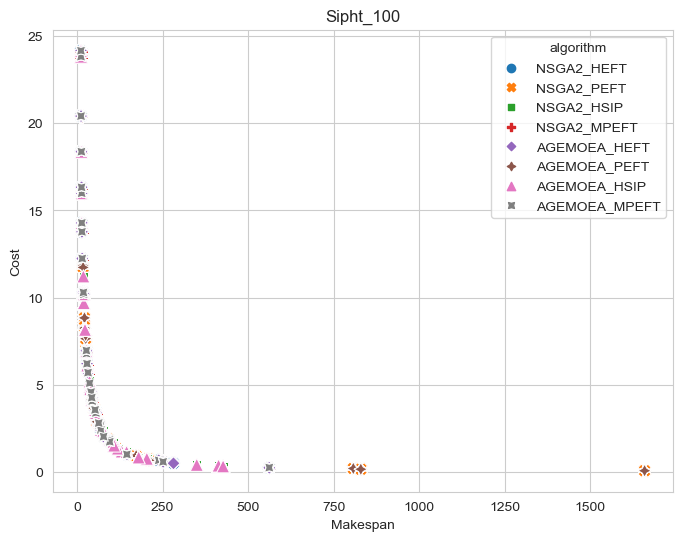

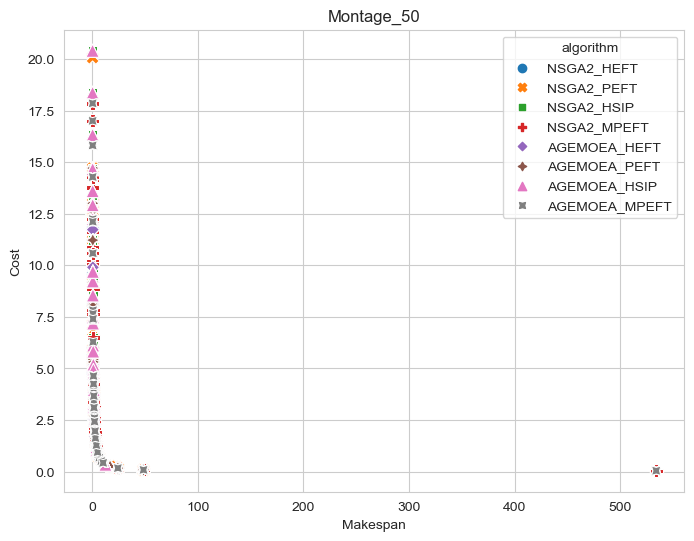

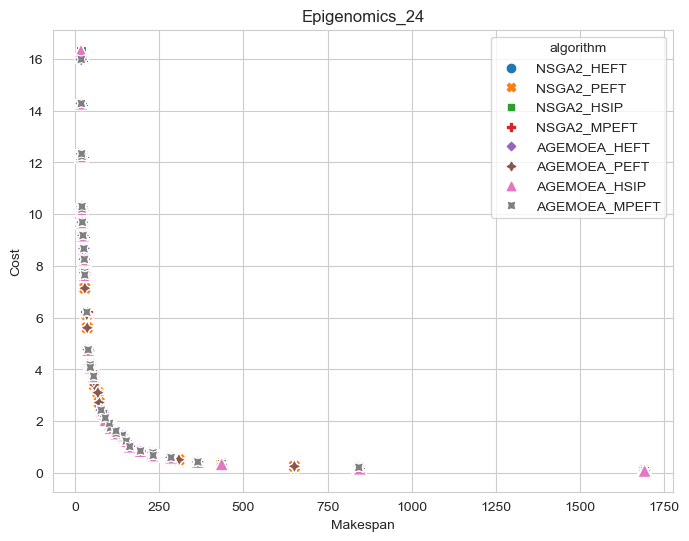

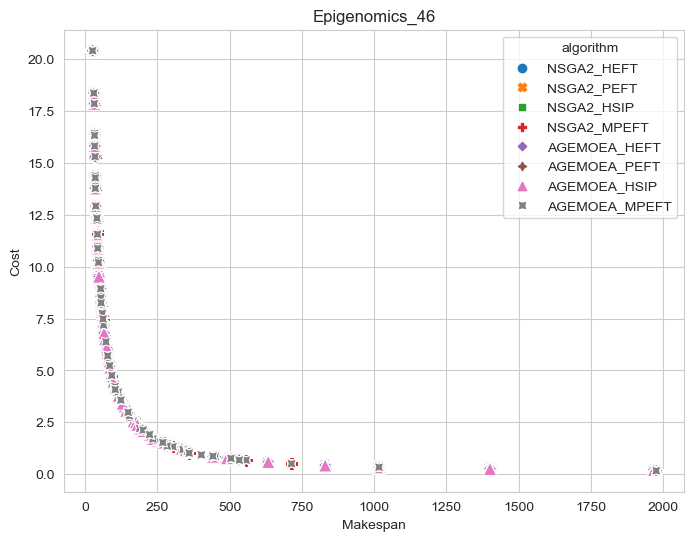

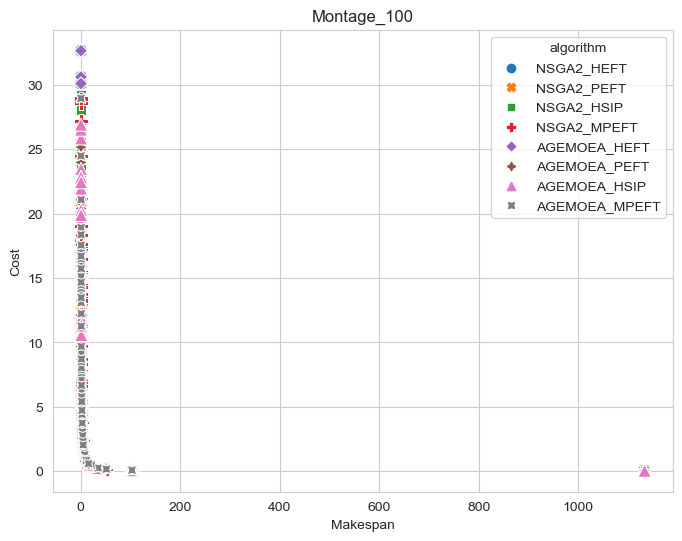

...

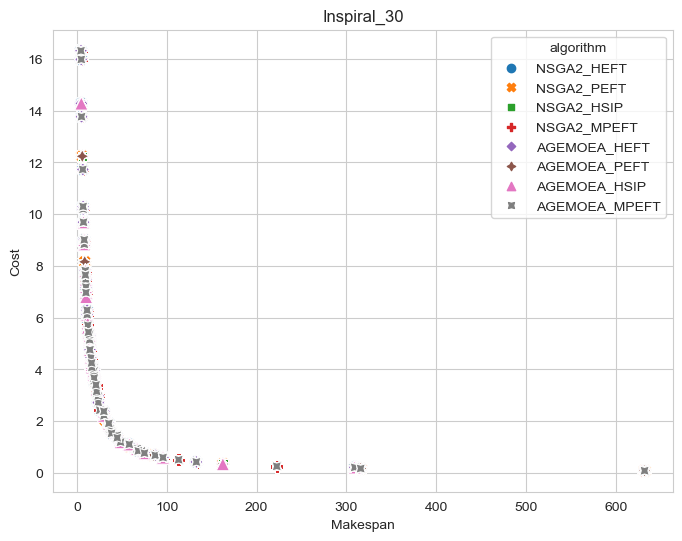

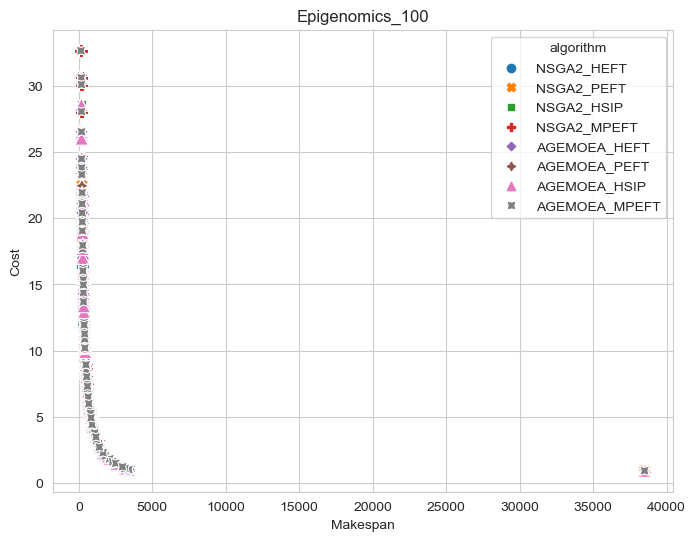

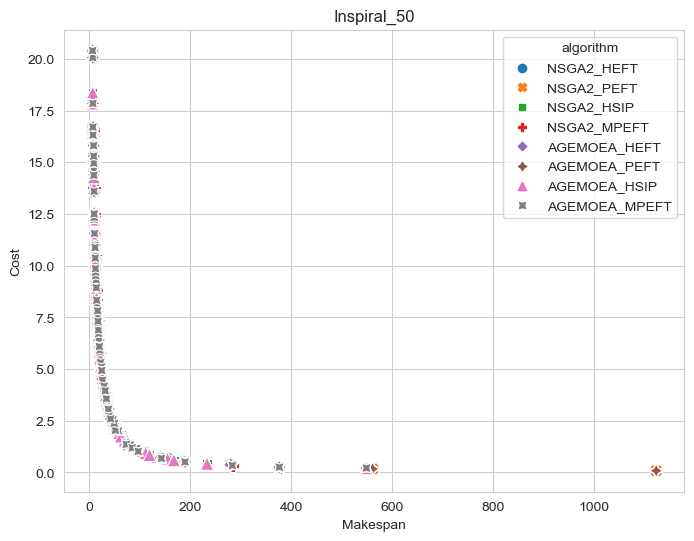

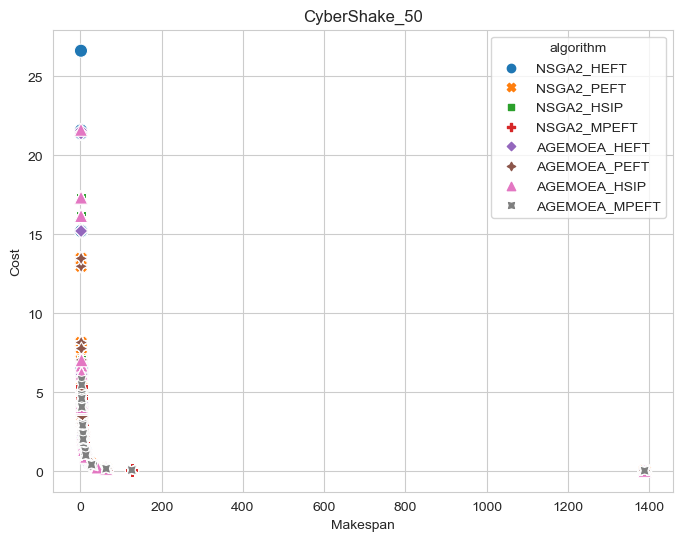

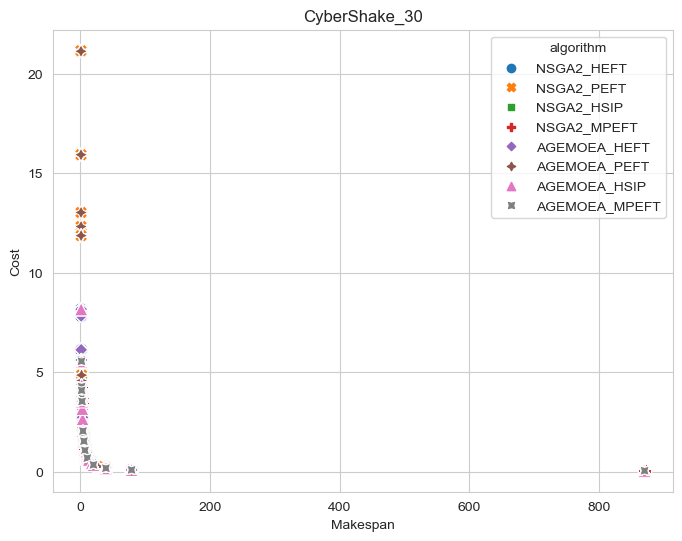

In [126]:
for p in problems:
    plt.figure(figsize=(8, 6))
    sns.set_style("whitegrid")
    sns_plot = sns.scatterplot(df[df['problem']==p], x='obj1', y='obj2', hue='algorithm', style='algorithm', s=90)
    sns_plot.set(xlabel = "Makespan", ylabel = "Cost", title =p)
    sns_plot.figure.savefig("figures/"+p+".png")
    plt.show()

In [244]:
results = pd.DataFrame({'Hypervolume': [], 'problem':[], 'alg':[], 'exec':[], 'igd':[]})
for problem in problems:
    ref_point = np.array([1.00, 1.00])
    ind_hv = HV(ref_point=ref_point)
    sub_data = df[(df.problem==problem)]
    pf = np.array(list(zip(sub_data['obj1'], sub_data['obj2'])))
    ind_igd = IGDPlus(pf)
    for alg in algorithms:
        for execn in execs:
            sub_data = df[(df.problem==problem) & (df.algorithm==alg) & (df.exec==execn)]
            if sub_data.shape[0] > 0:
                sac = sub_data
                A=np.array(list(zip(sac['obj1_n'], sac['obj2_n'])))
                #A=np.array(list(zip(sac['obj1'], sac['obj2'])))
                hv_value= ind_hv(A)
                A=np.array(list(zip(sac['obj1'], sac['obj2'])))
                igd_value= ind_igd(A)
            else:
                hv_value= 0
                igd_value= 1
                #hv_value= None
                #igd_value= None
            #and execn!=15 and execn!=17
            if execn!=13 :
                results = pd.concat([results, pd.DataFrame([{'Hypervolume': hv_value, 'igd':igd_value, 'problem':problem, 'alg':alg, 'exec':execn}])], ignore_index=True)

In [245]:
results

,Hypervolume,problem,alg,exec,igd
0,0.984223,Sipht_100,NSGA2_HEFT,0.0,0.0
1,0.986338,Sipht_100,NSGA2_HEFT,1.0,0.0
2,0.985048,Sipht_100,NSGA2_HEFT,2.0,0.0
3,0.987118,Sipht_100,NSGA2_HEFT,3.0,0.0
4,0.980955,Sipht_100,NSGA2_HEFT,4.0,0.0
...,...,...,...,...,...
1435,0.997980,CyberShake_30,AGEMOEA_MPEFT,7.0,0.0
1436,0.997979,CyberShake_30,AGEMOEA_MPEFT,8.0,0.0
1437,0.997979,CyberShake_30,AGEMOEA_MPEFT,9.0,0.0
1438,0.997979,CyberShake_30,AGEMOEA_MPEFT,10.0,0.0


In [246]:
results=results[(results.exec <= 21) | (results.alg=='NSGA2_Zhu')]

In [247]:
results=results[(results.alg!='NSGA2_Zhu')]

In [248]:
results[results.Hypervolume == 0]

,Hypervolume,problem,alg,exec,igd
780,0.0,Inspiral_100,NSGA2_PEFT,0.0,1.0
781,0.0,Inspiral_100,NSGA2_PEFT,1.0,1.0
782,0.0,Inspiral_100,NSGA2_PEFT,2.0,1.0
783,0.0,Inspiral_100,NSGA2_PEFT,3.0,1.0
784,0.0,Inspiral_100,NSGA2_PEFT,4.0,1.0
785,0.0,Inspiral_100,NSGA2_PEFT,5.0,1.0
786,0.0,Inspiral_100,NSGA2_PEFT,6.0,1.0
788,0.0,Inspiral_100,NSGA2_PEFT,8.0,1.0
789,0.0,Inspiral_100,NSGA2_PEFT,9.0,1.0
791,0.0,Inspiral_100,NSGA2_PEFT,11.0,1.0


In [249]:
results[results.Hypervolume == 0].groupby(['alg', 'problem']).count()

,,Hypervolume,exec,igd
alg,problem,,,
AGEMOEA_PEFT,Inspiral_100,11,11,11
NSGA2_PEFT,Inspiral_100,10,10,10


In [250]:
results[results.Hypervolume == 0].alg.unique()

array(['NSGA2_PEFT', 'AGEMOEA_PEFT'], dtype=object)

In [251]:
grouped_results = results.groupby(['problem', 'alg']).mean().reset_index()

In [252]:
grouped_results

,problem,alg,Hypervolume,exec,igd
0,CyberShake_100,AGEMOEA_HEFT,0.989438,5.5,0.000051
1,CyberShake_100,AGEMOEA_HSIP,0.993861,5.5,0.000000
2,CyberShake_100,AGEMOEA_MPEFT,0.997228,5.5,0.000000
3,CyberShake_100,AGEMOEA_PEFT,0.998137,5.5,0.000000
4,CyberShake_100,NSGA2_HEFT,0.995212,5.5,0.000000
...,...,...,...,...,...
115,Sipht_60,AGEMOEA_PEFT,0.973216,5.5,0.000000
116,Sipht_60,NSGA2_HEFT,0.980498,5.5,0.000000
117,Sipht_60,NSGA2_HSIP,0.976026,5.5,0.000000
118,Sipht_60,NSGA2_MPEFT,0.977312,5.5,0.000000


In [253]:
len(problems)

15

In [254]:
analise=results[(results['problem']=='CyberShake_100') & (results['alg']=='AGEMOEA_PEFT')]

In [255]:
results[(results['alg']=='AGEMOEA_PEFT')]

,Hypervolume,problem,alg,exec,igd
60,0.976503,Sipht_100,AGEMOEA_PEFT,0.0,0.0
61,0.981111,Sipht_100,AGEMOEA_PEFT,1.0,0.0
62,0.981382,Sipht_100,AGEMOEA_PEFT,2.0,0.0
63,0.980024,Sipht_100,AGEMOEA_PEFT,3.0,0.0
64,0.982582,Sipht_100,AGEMOEA_PEFT,4.0,0.0
...,...,...,...,...,...
1411,0.996044,CyberShake_30,AGEMOEA_PEFT,7.0,0.0
1412,0.997219,CyberShake_30,AGEMOEA_PEFT,8.0,0.0
1413,0.996103,CyberShake_30,AGEMOEA_PEFT,9.0,0.0
1414,0.997235,CyberShake_30,AGEMOEA_PEFT,10.0,0.0


In [256]:
analise[analise.Hypervolume>0]

,Hypervolume,problem,alg,exec,igd
540,0.998457,CyberShake_100,AGEMOEA_PEFT,0.0,0.0
541,0.998387,CyberShake_100,AGEMOEA_PEFT,1.0,0.0
542,0.998313,CyberShake_100,AGEMOEA_PEFT,2.0,0.0
543,0.998583,CyberShake_100,AGEMOEA_PEFT,3.0,0.0
544,0.998512,CyberShake_100,AGEMOEA_PEFT,4.0,0.0
545,0.997304,CyberShake_100,AGEMOEA_PEFT,5.0,0.0
546,0.997480,CyberShake_100,AGEMOEA_PEFT,6.0,0.0
547,0.998490,CyberShake_100,AGEMOEA_PEFT,7.0,0.0
548,0.996568,CyberShake_100,AGEMOEA_PEFT,8.0,0.0
549,0.998518,CyberShake_100,AGEMOEA_PEFT,9.0,0.0


In [257]:
grouped_results

,problem,alg,Hypervolume,exec,igd
0,CyberShake_100,AGEMOEA_HEFT,0.989438,5.5,0.000051
1,CyberShake_100,AGEMOEA_HSIP,0.993861,5.5,0.000000
2,CyberShake_100,AGEMOEA_MPEFT,0.997228,5.5,0.000000
3,CyberShake_100,AGEMOEA_PEFT,0.998137,5.5,0.000000
4,CyberShake_100,NSGA2_HEFT,0.995212,5.5,0.000000
...,...,...,...,...,...
115,Sipht_60,AGEMOEA_PEFT,0.973216,5.5,0.000000
116,Sipht_60,NSGA2_HEFT,0.980498,5.5,0.000000
117,Sipht_60,NSGA2_HSIP,0.976026,5.5,0.000000
118,Sipht_60,NSGA2_MPEFT,0.977312,5.5,0.000000


In [258]:
name_algs = list(grouped_results.alg.unique())
name_algs
problems
all_dc_hyp = {}
for alg in name_algs:
    dc_alg = {}
    for p in problems:
        data = grouped_results[(grouped_results['alg']==alg) & (grouped_results['problem']==p)]
        dc_alg[p] = float(data['Hypervolume'].iloc[0])
    
    all_dc_hyp[alg]=dc_alg

In [259]:
hypervolumes=pd.DataFrame(all_dc_hyp)
hypervolumes

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
Sipht_100,0.986206,0.985228,0.985010,0.980122,0.985576,0.983629,0.984091,0.976681
Montage_50,0.982680,0.992008,0.997841,0.997567,0.992252,0.992457,0.997669,0.997679
Epigenomics_24,0.979840,0.982033,0.979047,0.978280,0.979641,0.982069,0.980032,0.978197
Epigenomics_46,0.980736,0.979993,0.979444,0.648835,0.980076,0.977571,0.977849,0.617014
Montage_100,0.978981,0.996582,0.998576,0.979432,0.997593,0.997404,0.997840,0.980918
CyberShake_100,0.989438,0.993861,0.997228,0.998137,0.995212,0.992000,0.997230,0.998115
Sipht_30,0.949885,0.951139,0.949885,0.773644,0.949850,0.951094,0.949830,0.812568
Montage_25,0.996339,0.996078,0.995924,0.996234,0.996353,0.996161,0.995527,0.996130
Inspiral_100,0.990458,0.974438,0.969259,0.077100,0.990150,0.944939,0.984627,0.154201
Sipht_60,0.980490,0.976140,0.977113,0.973216,0.980498,0.976026,0.977312,0.971667


In [260]:
print(hypervolumes.style.format(decimal='.', thousands='', precision=4).to_latex())

\begin{tabular}{lrrrrrrrr}
 & AGEMOEA_HEFT & AGEMOEA_HSIP & AGEMOEA_MPEFT & AGEMOEA_PEFT & NSGA2_HEFT & NSGA2_HSIP & NSGA2_MPEFT & NSGA2_PEFT \\
Sipht_100 & 0.9862 & 0.9852 & 0.9850 & 0.9801 & 0.9856 & 0.9836 & 0.9841 & 0.9767 \\
Montage_50 & 0.9827 & 0.9920 & 0.9978 & 0.9976 & 0.9923 & 0.9925 & 0.9977 & 0.9977 \\
Epigenomics_24 & 0.9798 & 0.9820 & 0.9790 & 0.9783 & 0.9796 & 0.9821 & 0.9800 & 0.9782 \\
Epigenomics_46 & 0.9807 & 0.9800 & 0.9794 & 0.6488 & 0.9801 & 0.9776 & 0.9778 & 0.6170 \\
Montage_100 & 0.9790 & 0.9966 & 0.9986 & 0.9794 & 0.9976 & 0.9974 & 0.9978 & 0.9809 \\
CyberShake_100 & 0.9894 & 0.9939 & 0.9972 & 0.9981 & 0.9952 & 0.9920 & 0.9972 & 0.9981 \\
Sipht_30 & 0.9499 & 0.9511 & 0.9499 & 0.7736 & 0.9499 & 0.9511 & 0.9498 & 0.8126 \\
Montage_25 & 0.9963 & 0.9961 & 0.9959 & 0.9962 & 0.9964 & 0.9962 & 0.9955 & 0.9961 \\
Inspiral_100 & 0.9905 & 0.9744 & 0.9693 & 0.0771 & 0.9902 & 0.9449 & 0.9846 & 0.1542 \\
Sipht_60 & 0.9805 & 0.9761 & 0.9771 & 0.9732 & 0.9805 & 0.9760 & 0.97

In [261]:
name_algs = list(grouped_results.alg.unique())
name_algs
problems
all_dc_igd = {}
for alg in name_algs:
    dc_alg = {}
    for p in problems:
        data = grouped_results[(grouped_results['alg']==alg) & (grouped_results['problem']==p)]
        dc_alg[p] = float(data['igd'].iloc[0])
    
    all_dc_igd[alg]=dc_alg

In [262]:
igds=pd.DataFrame(all_dc_igd)
igds

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
Sipht_100,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Montage_50,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Epigenomics_24,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Epigenomics_46,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Montage_100,0.001037,0.0,0.0,0.000718,0.0,0.000000,0.0,0.001327
CyberShake_100,0.000051,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Sipht_30,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Montage_25,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000
Inspiral_100,0.000000,0.0,0.0,0.916667,0.0,0.000561,0.0,0.833333
Sipht_60,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000


In [265]:
print(igds.style.format(decimal='.', thousands='', precision=8).to_latex())

\begin{tabular}{lrrrrrrrr}
 & AGEMOEA_HEFT & AGEMOEA_HSIP & AGEMOEA_MPEFT & AGEMOEA_PEFT & NSGA2_HEFT & NSGA2_HSIP & NSGA2_MPEFT & NSGA2_PEFT \\
Sipht_100 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Montage_50 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Epigenomics_24 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Epigenomics_46 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Montage_100 & 0.00103738 & 0.00000000 & 0.00000000 & 0.00071753 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00132747 \\
CyberShake_100 & 0.00005114 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Sipht_30 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 & 0.00000000 \\
Montage_25 & 0.0000

In [150]:
import seaborn as sns

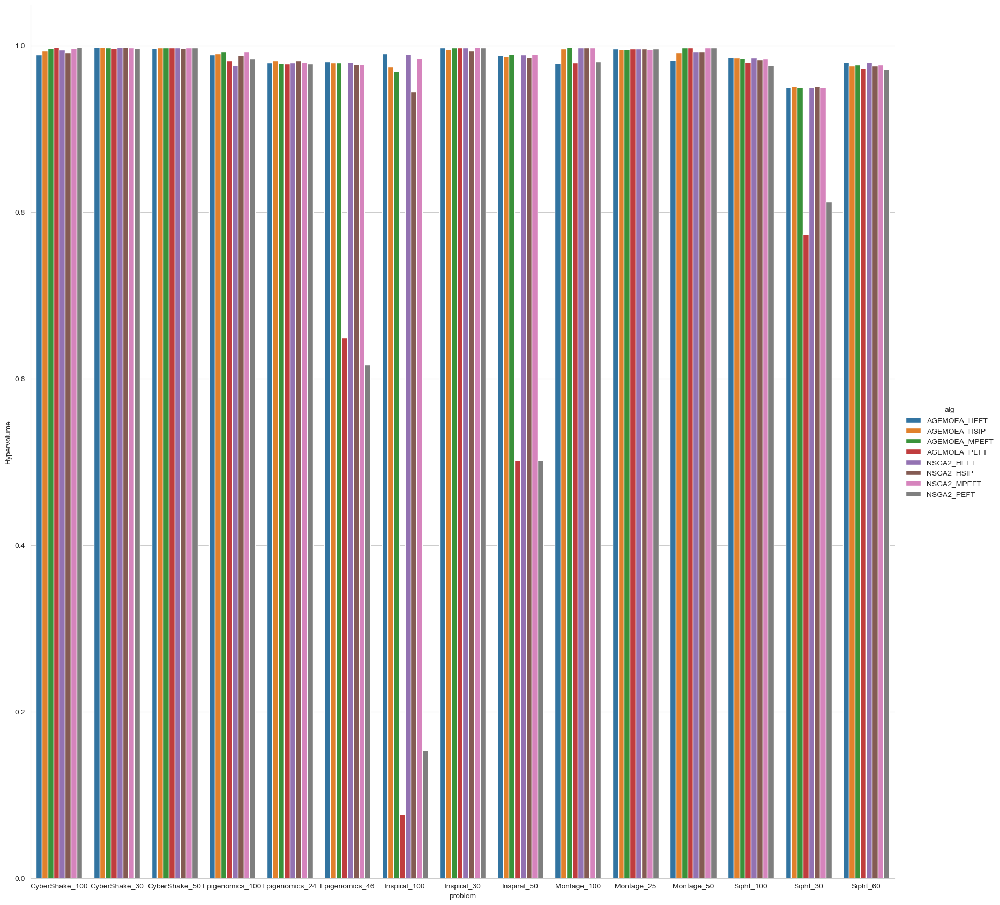

In [151]:
#a4_dims = (11.7, 8.27)
#from matplotlib import pyplot
#fig, ax = pyplot.subplots(figsize=a4_dims)

sns.catplot(x='problem', y='Hypervolume', hue='alg', data=grouped_results, kind='bar', height=17, aspect=1)

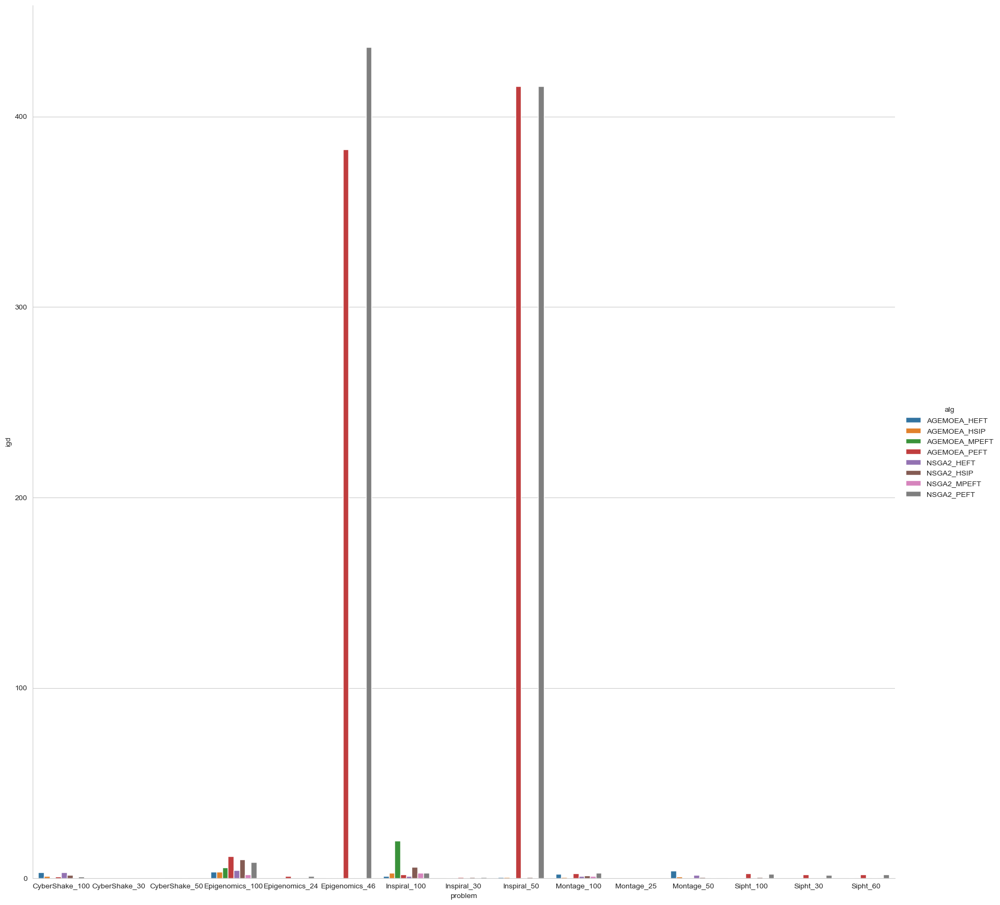

In [152]:
sns.catplot(x='problem', y='igd', hue='alg', data=grouped_results, kind='bar', height=17, aspect=1)

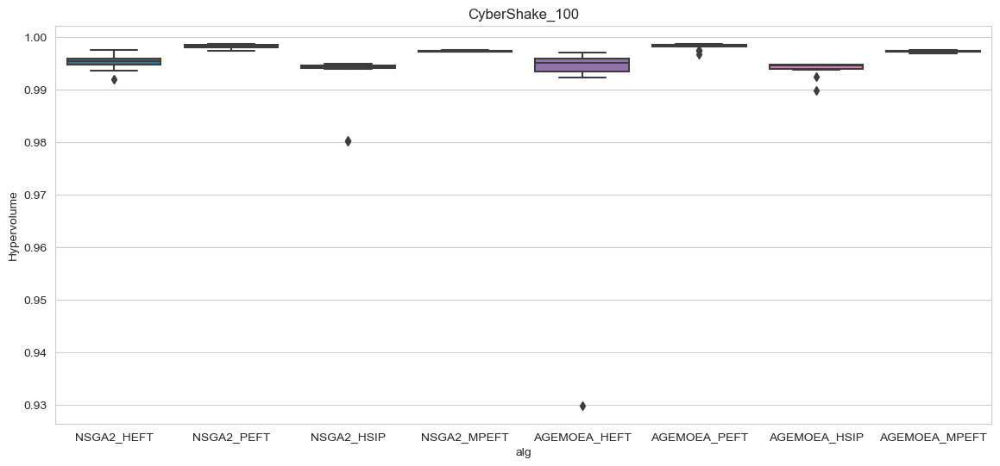

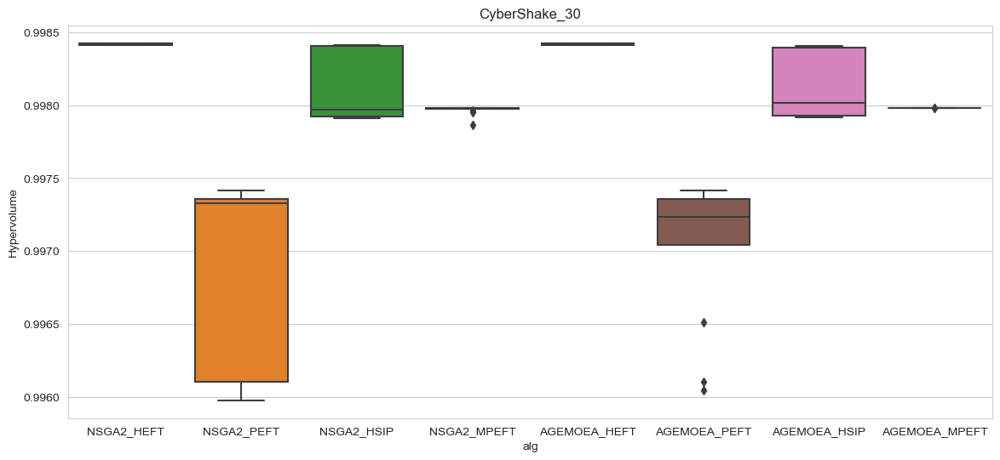

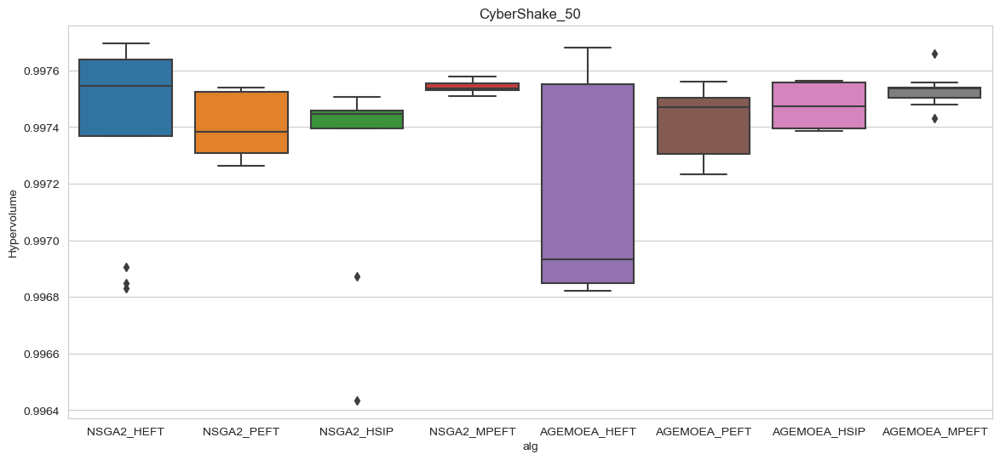

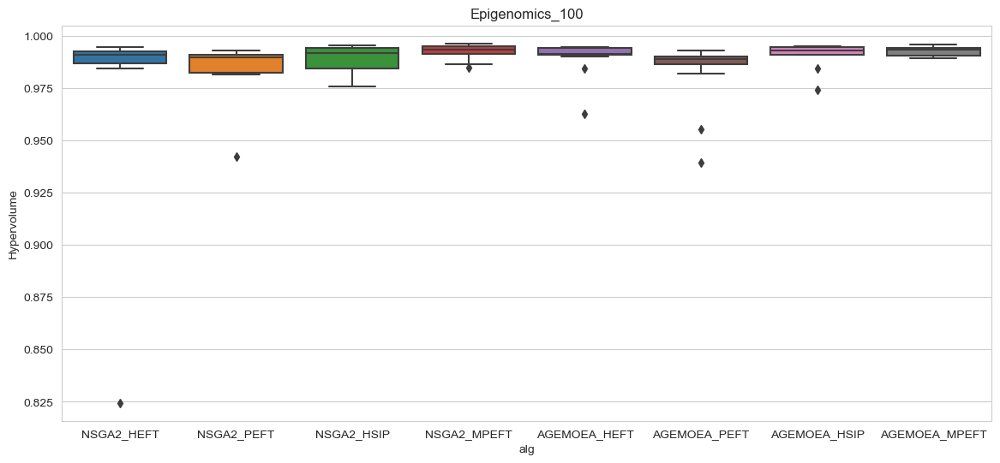

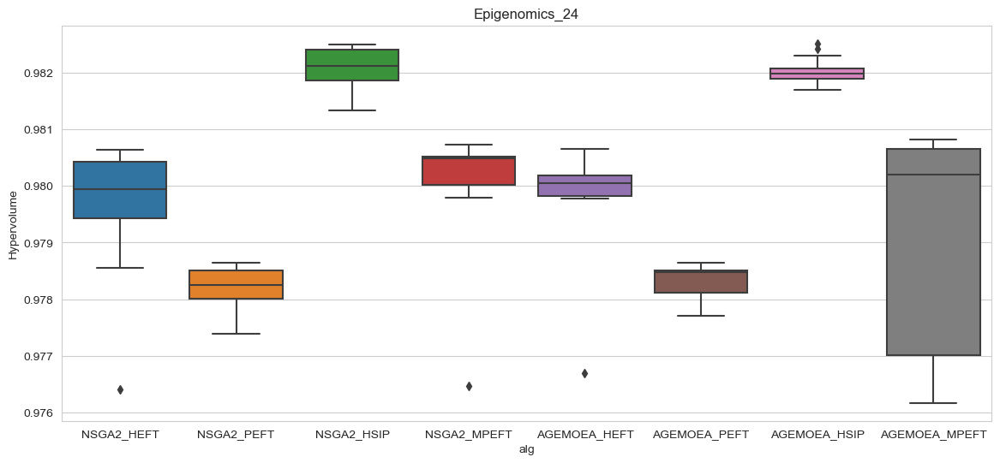

...

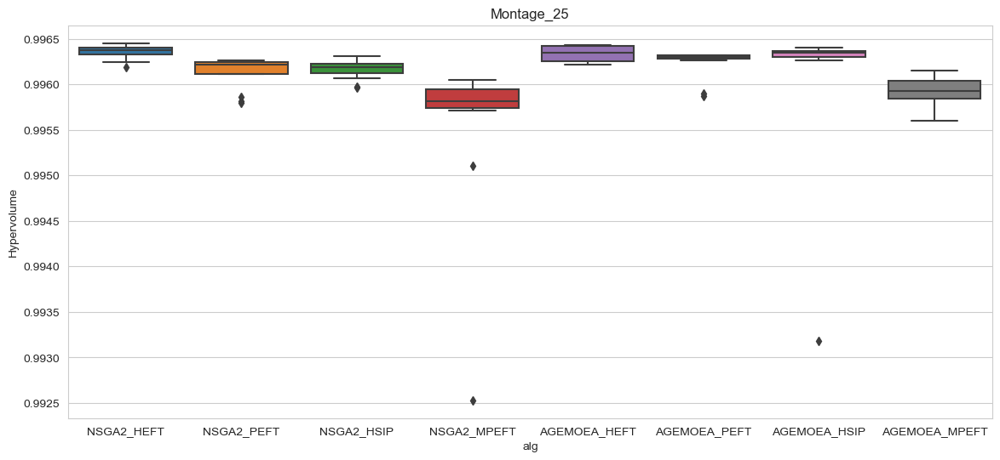

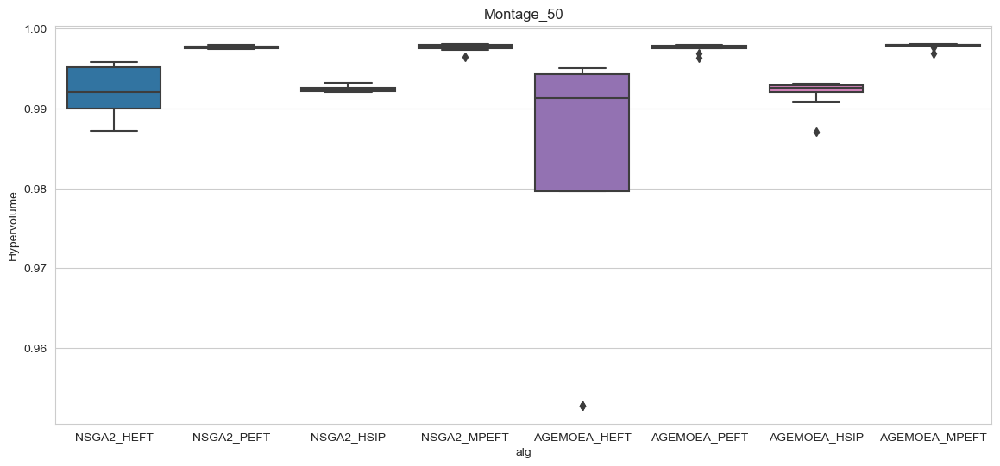

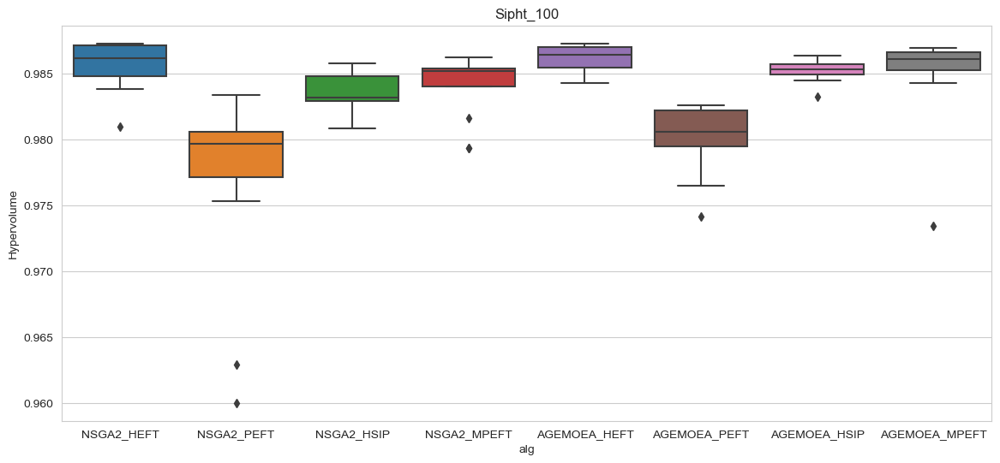

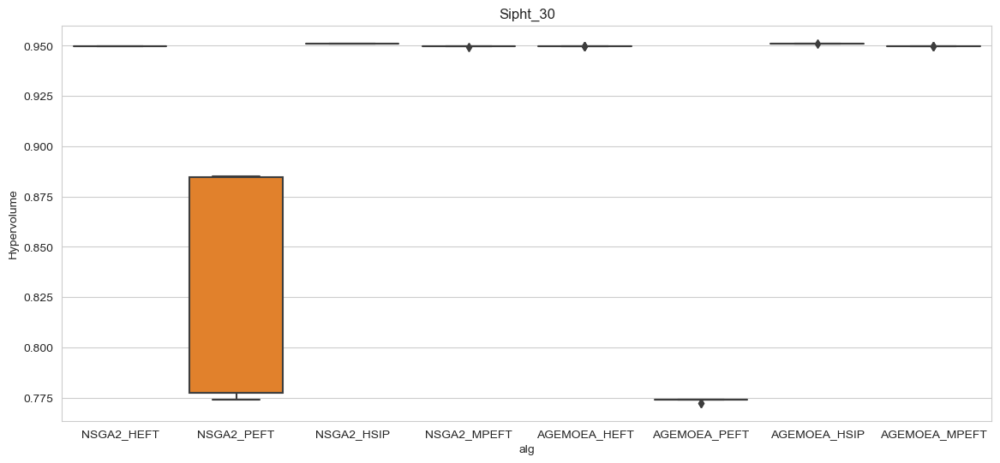

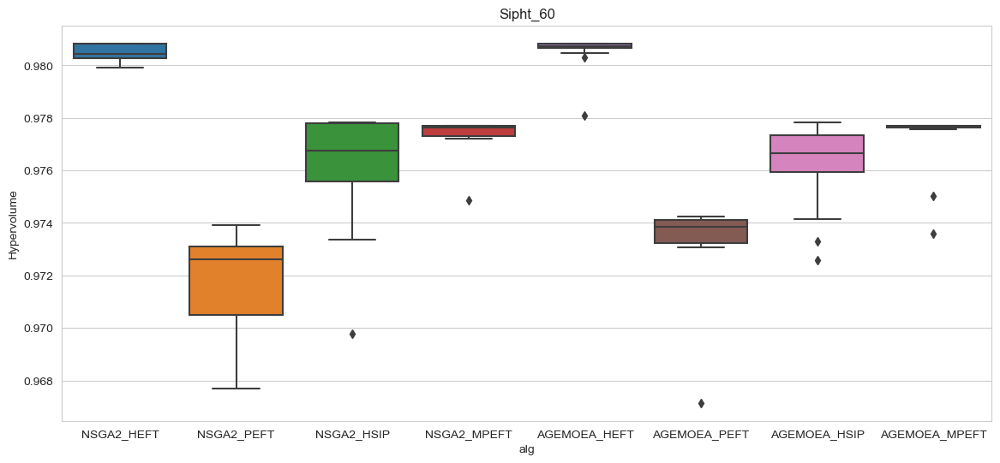

In [156]:
for problem in grouped_results.problem.unique():
    
    sub_ = results[results['problem']==problem]
    #sub_ = sub_[sub_.Hypervolume > 0]
    from pylab import rcParams
    rcParams['figure.figsize'] = 14, 6
    ax=sns.boxplot(data=sub_, y='Hypervolume', x='alg')
    ax.set_title(problem)
    plt.show()

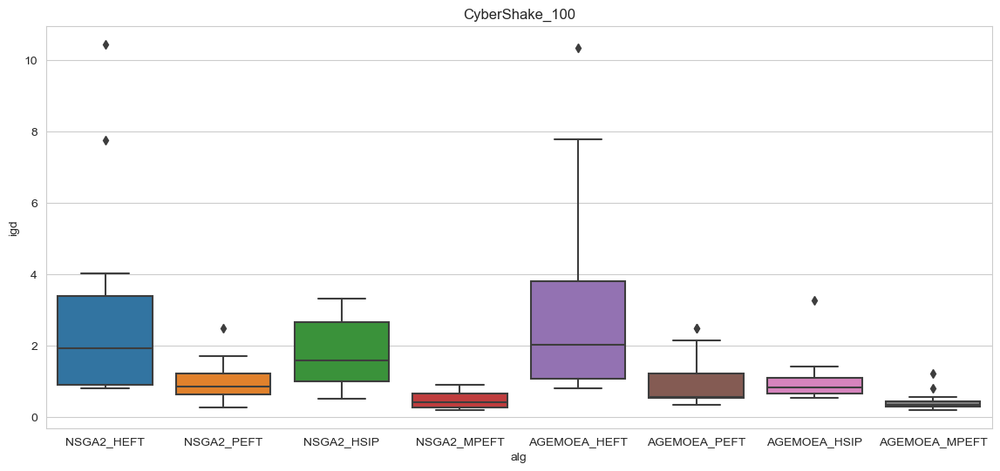

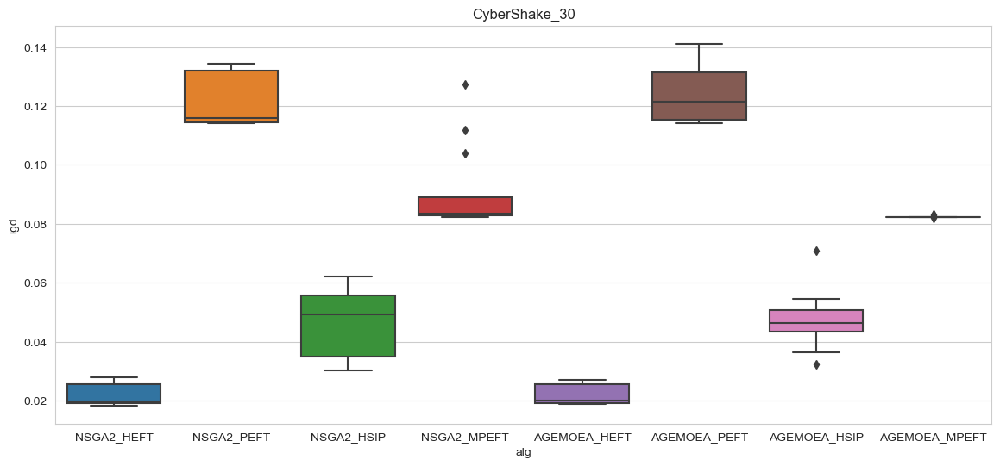

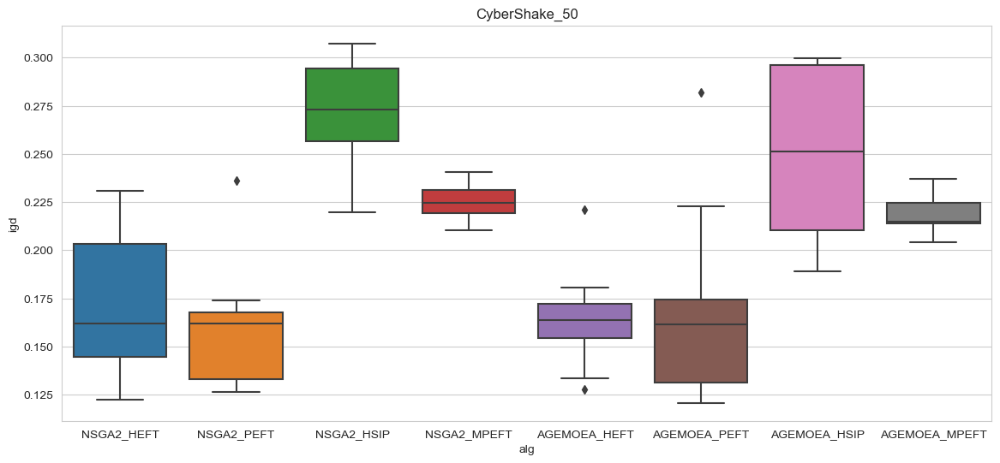

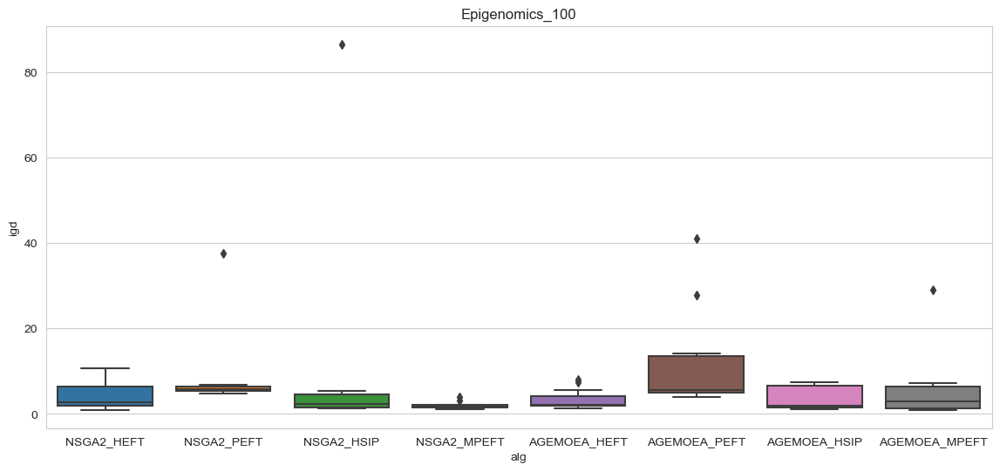

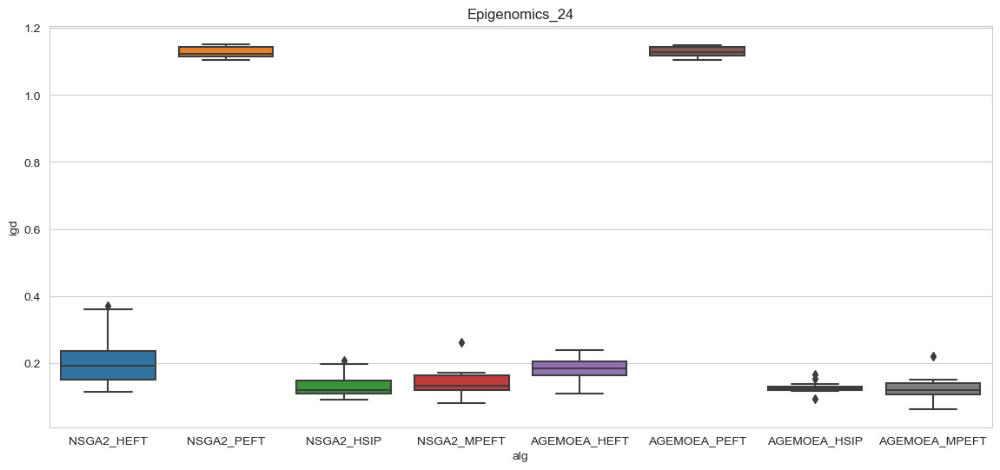

...

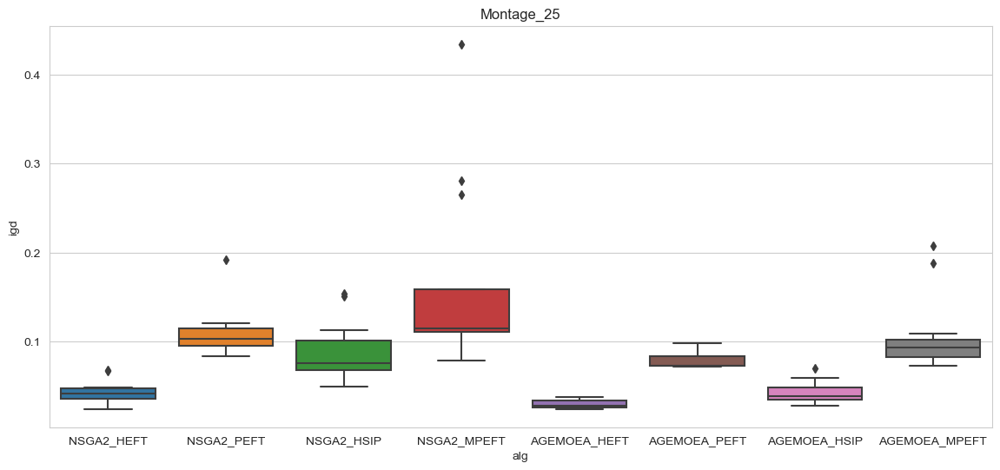

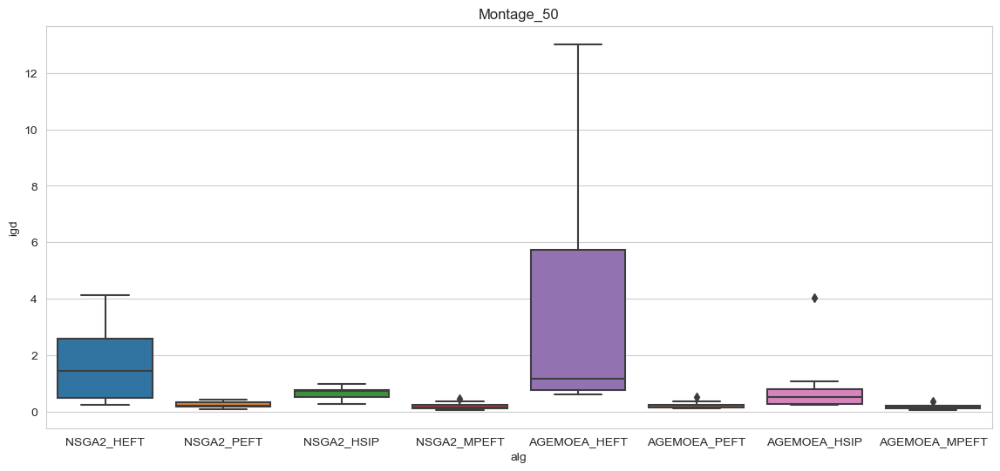

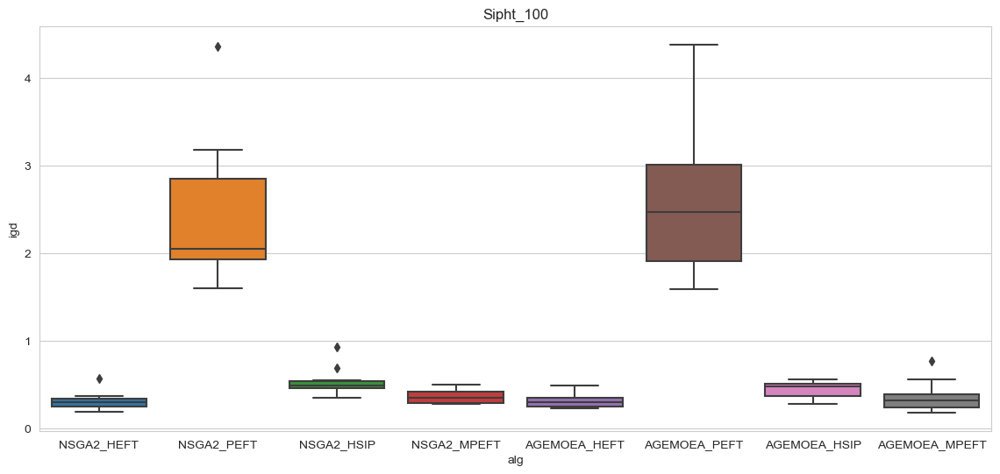

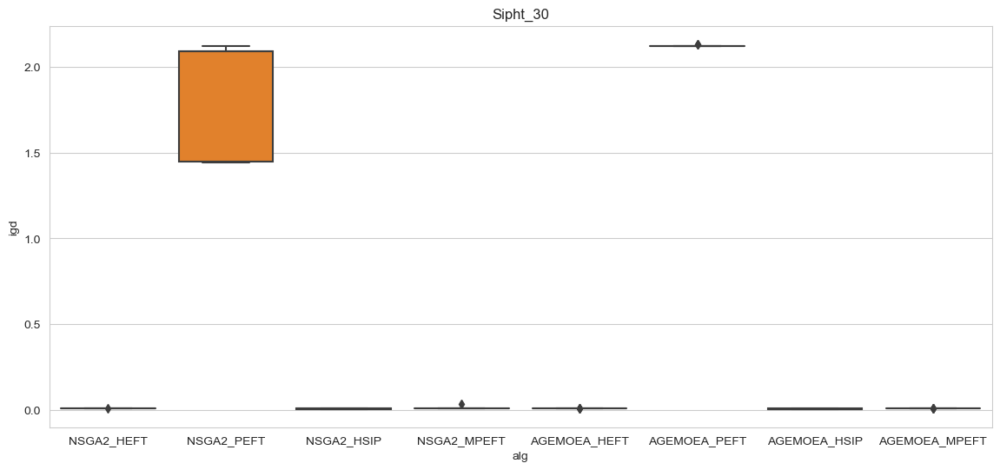

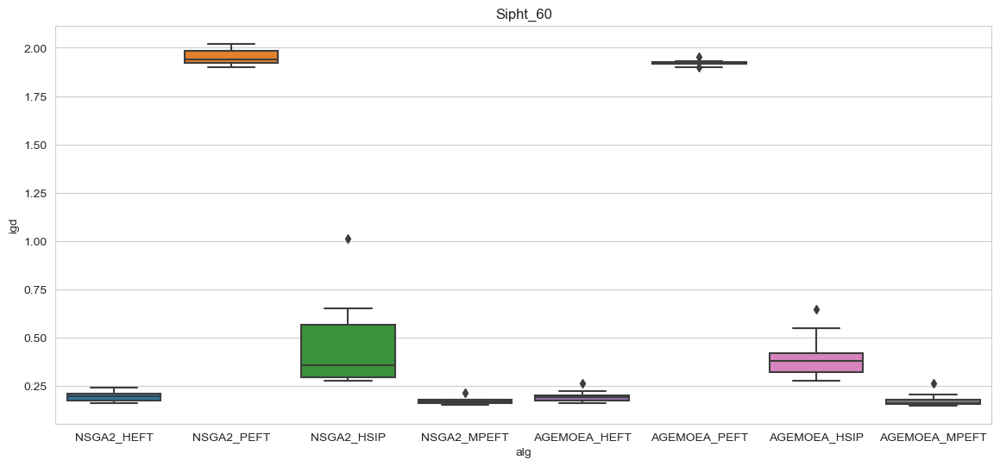

In [157]:
for problem in grouped_results.problem.unique():
    
    sub_ = results[results['problem']==problem]
    #sub_ = sub_[sub_.Hypervolume > 0]
    from pylab import rcParams
    rcParams['figure.figsize'] = 14, 6
    ax=sns.boxplot(data=sub_, y='igd', x='alg')
    ax.set_title(problem)
    plt.show()

In [158]:
sub_

,Hypervolume,problem,alg,exec,igd
864,0.980256,Sipht_60,NSGA2_HEFT,0.0,0.229046
865,0.980486,Sipht_60,NSGA2_HEFT,1.0,0.209653
866,0.980244,Sipht_60,NSGA2_HEFT,2.0,0.240913
867,0.980837,Sipht_60,NSGA2_HEFT,3.0,0.163622
868,0.980283,Sipht_60,NSGA2_HEFT,4.0,0.206687
...,...,...,...,...,...
955,0.977709,Sipht_60,AGEMOEA_MPEFT,7.0,0.149650
956,0.977709,Sipht_60,AGEMOEA_MPEFT,8.0,0.149650
957,0.977702,Sipht_60,AGEMOEA_MPEFT,9.0,0.154465
958,0.977675,Sipht_60,AGEMOEA_MPEFT,10.0,0.180829


,problem,alg,Hypervolume,exec,igd
0,CyberShake_100,AGEMOEA_HEFT,0.989438,5.5,3.244392
1,CyberShake_100,AGEMOEA_HSIP,0.993861,5.5,1.074163
2,CyberShake_100,AGEMOEA_MPEFT,0.997228,5.5,0.443421
3,CyberShake_100,AGEMOEA_PEFT,0.998137,5.5,1.002773
4,CyberShake_100,NSGA2_HEFT,0.995212,5.5,3.092789
...,...,...,...,...,...
115,Sipht_60,AGEMOEA_PEFT,0.973216,5.5,1.920343
116,Sipht_60,NSGA2_HEFT,0.980498,5.5,0.196732
117,Sipht_60,NSGA2_HSIP,0.976026,5.5,0.453008
118,Sipht_60,NSGA2_MPEFT,0.977312,5.5,0.171833


In [159]:
for problem in grouped_results.problem.unique():
    sub_data = grouped_results[grouped_results['problem']==problem]
    print(sub_data[sub_data['Hypervolume']==sub_data['Hypervolume'].max()])

          problem           alg  Hypervolume  exec       igd
3  CyberShake_100  AGEMOEA_PEFT     0.998137   5.5  1.002773
          problem         alg  Hypervolume  exec       igd
12  CyberShake_30  NSGA2_HEFT     0.998421   5.5  0.021745
          problem          alg  Hypervolume  exec       igd
22  CyberShake_50  NSGA2_MPEFT     0.997539   5.5  0.225784
            problem            alg  Hypervolume  exec       igd
26  Epigenomics_100  AGEMOEA_MPEFT     0.992623   5.5  5.590923
           problem         alg  Hypervolume  exec       igd
37  Epigenomics_24  NSGA2_HSIP     0.982069   5.5  0.132844
           problem           alg  Hypervolume  exec       igd
40  Epigenomics_46  AGEMOEA_HEFT     0.980736   5.5  0.357211
         problem           alg  Hypervolume  exec      igd
48  Inspiral_100  AGEMOEA_HEFT     0.990458   5.5  1.12718
        problem          alg  Hypervolume  exec       igd
62  Inspiral_30  NSGA2_MPEFT     0.998086   5.5  0.188434
        problem            alg  Hy

In [161]:
for problem in grouped_results.problem.unique():
    sub_data = grouped_results[grouped_results['problem']==problem]
    print(sub_data[sub_data['igd']==sub_data['igd'].min()])

          problem            alg  Hypervolume  exec       igd
2  CyberShake_100  AGEMOEA_MPEFT     0.997228   5.5  0.443421
          problem         alg  Hypervolume  exec       igd
12  CyberShake_30  NSGA2_HEFT     0.998421   5.5  0.021745
          problem         alg  Hypervolume  exec       igd
23  CyberShake_50  NSGA2_PEFT       0.9974   5.5  0.157446
            problem          alg  Hypervolume  exec       igd
30  Epigenomics_100  NSGA2_MPEFT     0.992301   5.5  1.996465
           problem            alg  Hypervolume  exec       igd
34  Epigenomics_24  AGEMOEA_MPEFT     0.979047   5.5  0.120777
           problem         alg  Hypervolume  exec      igd
44  Epigenomics_46  NSGA2_HEFT     0.980076   5.5  0.33055
         problem           alg  Hypervolume  exec      igd
48  Inspiral_100  AGEMOEA_HEFT     0.990458   5.5  1.12718
        problem          alg  Hypervolume  exec       igd
62  Inspiral_30  NSGA2_MPEFT     0.998086   5.5  0.188434
        problem            alg  Hyperv

In [162]:
for problem in results.problem.unique():
    sub_data = results[results['problem']==problem]
    print(sub_data[sub_data['Hypervolume']==sub_data['Hypervolume'].max()])

    Hypervolume    problem           alg  exec       igd
58     0.987299  Sipht_100  AGEMOEA_HEFT  10.0  0.225003
     Hypervolume     problem            alg  exec       igd
180     0.998117  Montage_50  AGEMOEA_MPEFT   0.0  0.079671
     Hypervolume         problem           alg  exec       igd
265     0.982518  Epigenomics_24  AGEMOEA_HSIP   1.0  0.092224
     Hypervolume         problem           alg  exec       igd
346     0.982528  Epigenomics_46  AGEMOEA_HEFT  10.0  0.177131
     Hypervolume      problem            alg  exec       igd
474      0.99905  Montage_100  AGEMOEA_MPEFT   6.0  0.208943
     Hypervolume         problem         alg  exec       igd
494     0.998656  CyberShake_100  NSGA2_PEFT   2.0  0.256499
     Hypervolume   problem           alg  exec       igd
602     0.951149  Sipht_30    NSGA2_HSIP   2.0  0.005628
609     0.951149  Sipht_30    NSGA2_HSIP   9.0  0.005628
611     0.951149  Sipht_30    NSGA2_HSIP  11.0  0.005628
648     0.951149  Sipht_30  AGEMOEA_HSIP  

In [163]:
from scipy.stats import kruskal, mannwhitneyu
from scikit_posthocs import posthoc_dunn

In [164]:
from autorank import autorank, create_report, plot_stats

In [167]:
hypervolumes2 = hypervolumes.reset_index().drop('index', axis=1)
result = autorank(hypervolumes2, alpha=0.001, verbose=True)
#plot_stats(result)
#plt.show()

Fail to reject null hypothesis that data is normal for column AGEMOEA_HEFT (p=0.004795>=0.000125)
Fail to reject null hypothesis that data is normal for column AGEMOEA_HSIP (p=0.008566>=0.000125)
Fail to reject null hypothesis that data is normal for column AGEMOEA_MPEFT (p=0.004661>=0.000125)
Rejecting null hypothesis that data is normal for column AGEMOEA_PEFT (p=0.000032<0.000125)
Fail to reject null hypothesis that data is normal for column NSGA2_HEFT (p=0.003634>=0.000125)
Fail to reject null hypothesis that data is normal for column NSGA2_HSIP (p=0.003303>=0.000125)
Fail to reject null hypothesis that data is normal for column NSGA2_MPEFT (p=0.001699>=0.000125)
Rejecting null hypothesis that data is normal for column NSGA2_PEFT (p=0.000037<0.000125)
Using Levene's test for homoscedacity of non-normal data.
Fail to reject null hypothesis that all variances are equal (p=0.004551>=0.001000)
Using Friedman test as omnibus test
Fail to reject null hypothesis that there is no differenc

In [168]:
create_report(result)

The statistical analysis was conducted for 8 populations with 15 paired samples.
The family-wise significance level of the tests is alpha=0.001.
We rejected the null hypothesis that the population is normal for the populations AGEMOEA_PEFT (p=0.000) and NSGA2_HSIP (p=0.000). Therefore, we assume that not all populations are normal.
Because we have more than two populations and the populations and some of them are not normal, we use the non-parametric Friedman test as omnibus test to determine if there are any significant differences between the median values of the populations. We use the post-hoc Nemenyi test to infer which differences are significant. We report the median (MD), the median absolute deviation (MAD) and the mean rank (MR) among all populations over the samples. Differences between populations are significant, if the difference of the mean rank is greater than the critical distance CD=3.683 of the Nemenyi test.
We failed to reject the null hypothesis (p=0.001) of the Fri

In [169]:

data = hypervolumes.reset_index().drop('index',axis=1)

In [170]:
data

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
0,0.986206,0.985228,0.985010,0.980122,0.985576,0.983629,0.984091,0.976681
1,0.982680,0.992008,0.997841,0.997567,0.992252,0.992457,0.997669,0.997679
2,0.979840,0.982033,0.979047,0.978280,0.979641,0.982069,0.980032,0.978197
3,0.980736,0.979993,0.979444,0.648835,0.980076,0.977571,0.977849,0.617014
4,0.978981,0.996582,0.998576,0.979432,0.997593,0.997404,0.997840,0.980918
5,0.989438,0.993861,0.997228,0.998137,0.995212,0.992000,0.997230,0.998115
6,0.949885,0.951139,0.949885,0.773644,0.949850,0.951094,0.949830,0.812568
7,0.996339,0.996078,0.995924,0.996234,0.996353,0.996161,0.995527,0.996130
8,0.990458,0.974438,0.969259,0.077100,0.990150,0.944939,0.984627,0.154201
9,0.980490,0.976140,0.977113,0.973216,0.980498,0.976026,0.977312,0.971667


In [171]:
data

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
0,0.986206,0.985228,0.985010,0.980122,0.985576,0.983629,0.984091,0.976681
1,0.982680,0.992008,0.997841,0.997567,0.992252,0.992457,0.997669,0.997679
2,0.979840,0.982033,0.979047,0.978280,0.979641,0.982069,0.980032,0.978197
3,0.980736,0.979993,0.979444,0.648835,0.980076,0.977571,0.977849,0.617014
4,0.978981,0.996582,0.998576,0.979432,0.997593,0.997404,0.997840,0.980918
5,0.989438,0.993861,0.997228,0.998137,0.995212,0.992000,0.997230,0.998115
6,0.949885,0.951139,0.949885,0.773644,0.949850,0.951094,0.949830,0.812568
7,0.996339,0.996078,0.995924,0.996234,0.996353,0.996161,0.995527,0.996130
8,0.990458,0.974438,0.969259,0.077100,0.990150,0.944939,0.984627,0.154201
9,0.980490,0.976140,0.977113,0.973216,0.980498,0.976026,0.977312,0.971667


In [172]:
sub_data

,Hypervolume,problem,alg,exec,igd
1344,0.998425,CyberShake_30,NSGA2_HEFT,0.0,0.019146
1345,0.998414,CyberShake_30,NSGA2_HEFT,1.0,0.025634
1346,0.998425,CyberShake_30,NSGA2_HEFT,2.0,0.019146
1347,0.998412,CyberShake_30,NSGA2_HEFT,3.0,0.027754
1348,0.998414,CyberShake_30,NSGA2_HEFT,4.0,0.025634
...,...,...,...,...,...
1435,0.997980,CyberShake_30,AGEMOEA_MPEFT,7.0,0.081844
1436,0.997979,CyberShake_30,AGEMOEA_MPEFT,8.0,0.082264
1437,0.997979,CyberShake_30,AGEMOEA_MPEFT,9.0,0.082264
1438,0.997979,CyberShake_30,AGEMOEA_MPEFT,10.0,0.082264


In [266]:
hypervolumes.to_csv('hyps.csv')


In [174]:
results

,Hypervolume,problem,alg,exec,igd
0,0.984223,Sipht_100,NSGA2_HEFT,0.0,0.364255
1,0.986338,Sipht_100,NSGA2_HEFT,1.0,0.255655
2,0.985048,Sipht_100,NSGA2_HEFT,2.0,0.311380
3,0.987118,Sipht_100,NSGA2_HEFT,3.0,0.330239
4,0.980955,Sipht_100,NSGA2_HEFT,4.0,0.563660
...,...,...,...,...,...
1435,0.997980,CyberShake_30,AGEMOEA_MPEFT,7.0,0.081844
1436,0.997979,CyberShake_30,AGEMOEA_MPEFT,8.0,0.082264
1437,0.997979,CyberShake_30,AGEMOEA_MPEFT,9.0,0.082264
1438,0.997979,CyberShake_30,AGEMOEA_MPEFT,10.0,0.082264


In [175]:
def mnt_table(name_algs, p, metric, results):
    all_dc_hyp = {}
    for alg in name_algs:
        data = results[(results['alg']==alg) & (results['problem']==p)]
        all_dc_hyp[alg] = list(data[metric].values)
    return pd.DataFrame(all_dc_hyp)
    

In [176]:
mnt_table(name_algs, 'Inspiral_50', 'Hypervolume', results)

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
0,0.990281,0.987632,0.990984,0.502351,0.988972,0.989069,0.990556,0.502351
1,0.990759,0.985431,0.990287,0.502351,0.990372,0.984684,0.987058,0.502351
2,0.989793,0.989341,0.989584,0.502351,0.989630,0.987892,0.990255,0.502351
3,0.987370,0.989283,0.988862,0.502351,0.989509,0.986048,0.990104,0.502351
4,0.989847,0.988376,0.990262,0.502351,0.989884,0.984983,0.988059,0.502351
5,0.982128,0.987371,0.990350,0.502351,0.989730,0.989226,0.990165,0.502351
6,0.989382,0.986009,0.990475,0.502351,0.988959,0.979115,0.989596,0.502351
7,0.988519,0.988912,0.990352,0.502351,0.989221,0.985759,0.990195,0.502351
8,0.990638,0.988856,0.988957,0.502351,0.990118,0.986395,0.990010,0.502351
9,0.986947,0.984757,0.990428,0.502351,0.987030,0.989287,0.990240,0.502351


In [177]:
mnt_table(name_algs, 'Inspiral_50', 'igd', results)

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_MPEFT,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_MPEFT,NSGA2_PEFT
0,0.321947,0.584257,0.191915,415.845922,0.333282,0.378248,0.166688,415.845922
1,0.194173,0.678668,0.314957,415.845922,0.271174,0.864810,0.651880,415.845922
2,0.454334,0.414848,0.604940,415.845922,0.327007,0.411262,0.331309,415.845922
3,0.898199,0.369097,0.424837,415.845922,0.307665,0.498937,0.433067,415.845922
4,0.331157,0.451029,0.340371,415.845922,0.266931,0.934713,0.569704,415.845922
5,1.059240,0.604286,0.418237,415.845922,0.469716,0.346402,0.259321,415.845922
6,0.366820,0.952629,0.252147,415.845922,0.504864,1.698684,0.325809,415.845922
7,0.498542,0.373599,0.253412,415.845922,0.404894,1.108324,0.259734,415.845922
8,0.345086,0.459511,0.453918,415.845922,0.216836,0.614150,0.373669,415.845922
9,0.972249,0.774147,0.228335,415.845922,0.786606,0.328513,0.439876,415.845922


In [178]:
results

,Hypervolume,problem,alg,exec,igd
0,0.984223,Sipht_100,NSGA2_HEFT,0.0,0.364255
1,0.986338,Sipht_100,NSGA2_HEFT,1.0,0.255655
2,0.985048,Sipht_100,NSGA2_HEFT,2.0,0.311380
3,0.987118,Sipht_100,NSGA2_HEFT,3.0,0.330239
4,0.980955,Sipht_100,NSGA2_HEFT,4.0,0.563660
...,...,...,...,...,...
1435,0.997980,CyberShake_30,AGEMOEA_MPEFT,7.0,0.081844
1436,0.997979,CyberShake_30,AGEMOEA_MPEFT,8.0,0.082264
1437,0.997979,CyberShake_30,AGEMOEA_MPEFT,9.0,0.082264
1438,0.997979,CyberShake_30,AGEMOEA_MPEFT,10.0,0.082264


In [179]:
from collections import defaultdict
hypervolumes2 = hypervolumes.reset_index()
confidence = 0.95
sta = defaultdict(dict)
for p in problems:
    sub_data = grouped_results[grouped_results['problem']==p]
    best_data=sub_data[sub_data['Hypervolume']==sub_data['Hypervolume'].max()]
    bestvalue=best_data.iloc[0]['Hypervolume']
    bestname=best_data.iloc[0]['alg']
    datax = mnt_table(name_algs, p, 'Hypervolume', results)
    statistic, p_value = kruskal(*datax)
    
    # Print the results
    print(problem)
    print("Kruskal-Wallis Test")
    print("Statistic:", statistic)
    print("p-value:", p_value)
    print("p-value:", p_value < confidence)
    sta[p]['best'] = bestname
    sta[p][bestname] = {}
    for a in datax.columns:
        if a != bestname:
            statistic, p_value = mannwhitneyu(datax[a], datax[bestname])
            print("Mann", [bestname, a],  statistic, p_value, p_value < confidence)
            statistic, p_value = kruskal(datax[a], datax[bestname])
            
            posthoc_results = posthoc_dunn(datax[[bestname, a]].T.values.tolist(), p_adjust='hommel')
            print("Kruskal", [bestname, a],  statistic, p_value, p_value < confidence, 'posthoc_results=', posthoc_results < (1-confidence))
            sta[p][bestname][a] = posthoc_results[1].values[1] < (1-confidence)
    #print(bestname, bestvalue)
    #print(name_algs)
    #
    #print()

CyberShake_30
Kruskal-Wallis Test
Statistic: 7.0
p-value: 0.42887985755305486
p-value: True
Mann ['AGEMOEA_HEFT', 'AGEMOEA_HSIP'] 35.0 0.03508911609404786 True
Kruskal ['AGEMOEA_HEFT', 'AGEMOEA_HSIP'] 4.563333333333347 0.0326634416849111 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_HEFT', 'AGEMOEA_MPEFT'] 55.0 0.3407786135629546 True
Kruskal ['AGEMOEA_HEFT', 'AGEMOEA_MPEFT'] 0.9633333333333383 0.32634847332206807 True posthoc_results=        1      2
1  False  False
2  False  False
Mann ['AGEMOEA_HEFT', 'AGEMOEA_PEFT'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_HEFT', 'AGEMOEA_PEFT'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_HEFT', 'NSGA2_HEFT'] 62.0 0.5833604667027033 True
Kruskal ['AGEMOEA_HEFT', 'NSGA2_HEFT'] 0.3333333333333428 0.5637028616507676 True posthoc_results=        1      2
1  False  False
2  False  False
Mann ['AGEMOEA_HEFT', 'NSGA2_HSIP'] 13.0 0.000731481991

Kruskal ['NSGA2_MPEFT', 'NSGA2_PEFT'] 10.854477050413859 0.0009855719084696055 True posthoc_results=        1      2
1  False   True
2   True  False
CyberShake_30
Kruskal-Wallis Test
Statistic: 7.0
p-value: 0.42887985755305486
p-value: True
Mann ['AGEMOEA_MPEFT', 'AGEMOEA_HEFT'] 68.0 0.8398599725400034 True
Kruskal ['AGEMOEA_MPEFT', 'AGEMOEA_HEFT'] 0.05333333333332746 0.8173613313851867 True posthoc_results=        1      2
1  False  False
2  False  False
Mann ['AGEMOEA_MPEFT', 'AGEMOEA_HSIP'] 75.0 0.8852339144732017 True
Kruskal ['AGEMOEA_MPEFT', 'AGEMOEA_HSIP'] 0.030000000000001137 0.862490230135919 True posthoc_results=        1      2
1  False  False
2  False  False
Mann ['AGEMOEA_MPEFT', 'AGEMOEA_PEFT'] 17.0 0.0016520394562341636 True
Kruskal ['AGEMOEA_MPEFT', 'AGEMOEA_PEFT'] 10.083333333333343 0.0014961642897455408 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_MPEFT', 'NSGA2_HEFT'] 42.0 0.08853377201422956 True
Kruskal ['AGEMOEA_MPEFT', 'NSG

In [180]:
sta

defaultdict(dict,
            {'Sipht_100': {'best': 'AGEMOEA_HEFT',
              'AGEMOEA_HEFT': {'AGEMOEA_HSIP': True,
               'AGEMOEA_MPEFT': False,
               'AGEMOEA_PEFT': True,
               'NSGA2_HEFT': False,
               'NSGA2_HSIP': True,
               'NSGA2_MPEFT': True,
               'NSGA2_PEFT': True}},
             'Montage_50': {'best': 'AGEMOEA_MPEFT',
              'AGEMOEA_MPEFT': {'AGEMOEA_HEFT': True,
               'AGEMOEA_HSIP': True,
               'AGEMOEA_PEFT': True,
               'NSGA2_HEFT': True,
               'NSGA2_HSIP': True,
               'NSGA2_MPEFT': False,
               'NSGA2_PEFT': True}},
             'Epigenomics_24': {'best': 'NSGA2_HSIP',
              'NSGA2_HSIP': {'AGEMOEA_HEFT': True,
               'AGEMOEA_HSIP': False,
               'AGEMOEA_MPEFT': True,
               'AGEMOEA_PEFT': True,
               'NSGA2_HEFT': True,
               'NSGA2_MPEFT': True,
               'NSGA2_PEFT': True}},
       

In [181]:
from collections import defaultdict
hypervolumes2 = igds.reset_index()
confidence = 0.95
sta2 = defaultdict(dict)
for p in problems:
    sub_data = grouped_results[grouped_results['problem']==p]
    best_data=sub_data[sub_data['igd']==sub_data['igd'].max()]
    bestvalue=best_data.iloc[0]['igd']
    bestname=best_data.iloc[0]['alg']
    datax = mnt_table(name_algs, p, 'igd', results)
    statistic, p_value = kruskal(*datax)
    
    # Print the results
    print(problem)
    print("Kruskal-Wallis Test")
    print("Statistic:", statistic)
    print("p-value:", p_value)
    print("p-value:", p_value < confidence)
    sta2[p]['best'] = bestname
    sta2[p][bestname] = {}
    for a in datax.columns:
        if a != bestname:
            statistic, p_value = mannwhitneyu(datax[a], datax[bestname])
            print("Mann", [bestname, a],  statistic, p_value, p_value < confidence)
            statistic, p_value = kruskal(datax[a], datax[bestname])
            
            posthoc_results = posthoc_dunn(datax[[bestname, a]].T.values.tolist(), p_adjust='hommel')
            print("Kruskal", [bestname, a],  statistic, p_value, p_value < confidence, 'posthoc_results=', posthoc_results < (1-confidence))
            sta2[p][bestname][a] = posthoc_results[1].values[1] < (1-confidence)
    #print(bestname, bestvalue)
    #print(name_algs)
    #
    #print()

CyberShake_30
Kruskal-Wallis Test
Statistic: 7.0
p-value: 0.42887985755305486
p-value: True
Mann ['AGEMOEA_PEFT', 'AGEMOEA_HEFT'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_PEFT', 'AGEMOEA_HEFT'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_PEFT', 'AGEMOEA_HSIP'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_PEFT', 'AGEMOEA_HSIP'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_PEFT', 'AGEMOEA_MPEFT'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_PEFT', 'AGEMOEA_MPEFT'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_PEFT', 'NSGA2_HEFT'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_PEFT', 'NSGA2_HEFT'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['AGEMOEA_PEFT', 'NSGA2_HSIP'] 0.0 3.6584553538971e-05 True
Kruskal ['AGEMOEA_PEF

Kruskal ['NSGA2_PEFT', 'AGEMOEA_HSIP'] 17.28751631143976 3.2129071399323e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['NSGA2_PEFT', 'AGEMOEA_MPEFT'] 0.0 3.629993584104522e-05 True
Kruskal ['NSGA2_PEFT', 'AGEMOEA_MPEFT'] 17.295039164490863 3.200212331959725e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['NSGA2_PEFT', 'AGEMOEA_PEFT'] 34.0 0.0303828219765775 True
Kruskal ['NSGA2_PEFT', 'AGEMOEA_PEFT'] 4.813333333333347 0.028240368733300165 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['NSGA2_PEFT', 'NSGA2_HEFT'] 0.0 3.6584553538971e-05 True
Kruskal ['NSGA2_PEFT', 'NSGA2_HEFT'] 17.28 3.225641456243768e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['NSGA2_PEFT', 'NSGA2_HSIP'] 0.0 3.629993584104522e-05 True
Kruskal ['NSGA2_PEFT', 'NSGA2_HSIP'] 17.295039164490863 3.200212331959725e-05 True posthoc_results=        1      2
1  False   True
2   True  False
Mann ['NSG

ValueError: All numbers are identical in kruskal

In [182]:
sta2

defaultdict(dict,
            {'Sipht_100': {'best': 'AGEMOEA_PEFT',
              'AGEMOEA_PEFT': {'AGEMOEA_HEFT': True,
               'AGEMOEA_HSIP': True,
               'AGEMOEA_MPEFT': True,
               'NSGA2_HEFT': True,
               'NSGA2_HSIP': True,
               'NSGA2_MPEFT': True,
               'NSGA2_PEFT': False}},
             'Montage_50': {'best': 'AGEMOEA_HEFT',
              'AGEMOEA_HEFT': {'AGEMOEA_HSIP': True,
               'AGEMOEA_MPEFT': True,
               'AGEMOEA_PEFT': True,
               'NSGA2_HEFT': False,
               'NSGA2_HSIP': True,
               'NSGA2_MPEFT': True,
               'NSGA2_PEFT': True}},
             'Epigenomics_24': {'best': 'AGEMOEA_PEFT',
              'AGEMOEA_PEFT': {'AGEMOEA_HEFT': True,
               'AGEMOEA_HSIP': True,
               'AGEMOEA_MPEFT': True,
               'NSGA2_HEFT': True,
               'NSGA2_HSIP': True,
               'NSGA2_MPEFT': True,
               'NSGA2_PEFT': False}},
       

In [146]:
p

'Inspiral_50'

In [125]:
data_compare = {}
data_compare["CyberShake_30"] = {}
data_compare["Epigenomics_24"] = {}
data_compare["Epigenomics_100"] = {}

In [126]:
hypervolumes2=hypervolumes.reset_index().drop(['AGEMOEA_PEFT', 'NSGA2_PEFT'], axis=1)
for p in data_compare.keys():
    datax=list(set(list(hypervolumes2[hypervolumes2['index']==p].iloc[0])))
    sub_df = df[df['problem']==p]
    min_max=df[df['problem']==p].agg(['min', 'max'])[['obj1', 'obj2']]
    d={}
    d['min_obj1'] = min_max['obj1'].values[0]
    d['min_obj2'] = min_max['obj2'].values[0]
    d['max_obj1'] = min_max['obj1'].values[1]
    d['max_obj2'] = min_max['obj2'].values[1]
    d['Hypervolume']=datax
    data_compare[p]=d

In [127]:
data_compare

{'CyberShake_30': {'min_obj1': 1.0929198786217025,
  'min_obj2': 0.044,
  'max_obj1': 870.0824999999999,
  'max_obj2': 21.153000000000002,
  'Hypervolume': [0.9981857311200075,
   0.9978296868143476,
   0.9981846133857367,
   0.9978401535468997,
   'CyberShake_30']},
 'Epigenomics_24': {'min_obj1': 17.258059828745452,
  'min_obj2': 0.085,
  'max_obj1': 1691.4689090909092,
  'max_obj2': 16.32,
  'Hypervolume': [0.9801332754438055,
   0.9822227883761334,
   0.9795628011441643,
   0.982140074026899,
   'Epigenomics_24']},
 'Epigenomics_100': {'min_obj1': 143.91407508263637,
  'min_obj2': 0.935,
  'max_obj1': 38506.38327272728,
  'max_obj2': 35.711999999999996,
  'Hypervolume': [0.993449846186342,
   0.9907130530229961,
   0.991667988534436,
   0.9911620596282944,
   'Epigenomics_100']}}

In [283]:
datax

['Epigenomics_100', 0.9785048443374296]

In [260]:
data_compare

{'CyberShake_30': array([['CyberShake_30', 0.9991104646711253, 0.9991104646711253,
         0.9958676358552376, 0.9991104646711253, 0.9991104646711253,
         0.9958676358552376]], dtype=object),
 'Epigenomics_24': array([['Epigenomics_24', 0.9414430018619255, 0.9414430018619255,
         0.9714856520744857, 0.9414430018619255, 0.9414430018619255,
         0.9714856520744857]], dtype=object),
 'Epigenomics_100': array([['Epigenomics_100', 0.9785048443374296, 0.9785048443374296,
         0.685598021307641, 0.9785048443374296, 0.9785048443374296,
         0.9794257447252015]], dtype=object)}

In [290]:
results


,Hypervolume,problem,alg,exec,igd
0,0.980987,Sipht_60,NSGA2_HEFT,0.0,0.333931
1,0.000000,Sipht_60,NSGA2_HEFT,666.0,1.000000
2,0.980987,Sipht_60,NSGA2_HEFT,1.0,0.333931
3,0.980987,Sipht_60,NSGA2_HEFT,2.0,0.333931
4,0.980987,Sipht_60,NSGA2_HEFT,3.0,0.333931
...,...,...,...,...,...
2200,0.951330,Epigenomics_46,AGEMOEA_HSIP,15.0,0.402342
2201,0.951330,Epigenomics_46,AGEMOEA_HSIP,16.0,0.402342
2202,0.951330,Epigenomics_46,AGEMOEA_HSIP,17.0,0.402342
2203,0.951330,Epigenomics_46,AGEMOEA_HSIP,18.0,0.402342


In [299]:
min_max=df[df['problem']=='Sipht_60'].agg(['min', 'max'])[['obj1', 'obj2']]

In [305]:
min_max['obj1']

min      13.175953
max    1113.851052
Name: obj1, dtype: float64

In [308]:
data_compare = {
        'CyberShake_30': {
            'min_obj1': 2.1092812534519965,
            'min_obj2': 0.044,
            'max_obj1': 870.0825,
            'max_obj2': 4.08,
            'Hypervolume': 0.9991104646711253
        },
        'Epigenomics_24': {
            'min_obj1': 14.487439993089797,
            'min_obj2': 0.085,
            'max_obj1': 1691.4689090909092,
            'max_obj2': 48.738,
            'Hypervolume': 0.9414430018619255
        },
        'Epigenomics_100': {
            'min_obj1': 300.03776521539555,
            'min_obj2': 0.935,
            'max_obj1': 38506.38327272728,
            'max_obj2': 202.12100000000004,
            'Hypervolume': 0.9785048443374296
        }
    }

In [309]:
data_compare

{'CyberShake_30': {'min_obj1': 2.1092812534519965,
  'min_obj2': 0.044,
  'max_obj1': 870.0825,
  'max_obj2': 4.08,
  'Hypervolume': 0.9991104646711253},
 'Epigenomics_24': {'min_obj1': 14.487439993089797,
  'min_obj2': 0.085,
  'max_obj1': 1691.4689090909092,
  'max_obj2': 48.738,
  'Hypervolume': 0.9414430018619255},
 'Epigenomics_100': {'min_obj1': 300.03776521539555,
  'min_obj2': 0.935,
  'max_obj1': 38506.38327272728,
  'max_obj2': 202.12100000000004,
  'Hypervolume': 0.9785048443374296}}

In [310]:
hypervolumes

,AGEMOEA_HEFT,AGEMOEA_HSIP,AGEMOEA_PEFT,NSGA2_HEFT,NSGA2_HSIP,NSGA2_PEFT
Sipht_60,0.980987,0.980987,0.979503,0.980987,0.980987,0.979503
CyberShake_30,0.999110,0.999110,0.995868,0.999110,0.999110,0.995868
Montage_25,0.998111,0.998080,0.997622,0.998111,0.998080,0.997622
Inspiral_50,0.971586,0.971974,0.977213,0.971586,0.971974,0.977213
Epigenomics_24,0.941443,0.941443,0.971486,0.941443,0.941443,0.971486
CyberShake_50,0.999467,0.999467,0.999461,0.999467,0.999467,0.999461
Montage_100,0.994605,0.996298,0.998512,0.994605,0.996298,0.998550
Montage_50,0.998424,0.998446,0.998639,0.998424,0.998446,0.998639
Inspiral_30,0.868201,0.868201,0.974731,0.868201,0.868201,0.974731
Inspiral_100,0.719561,0.724137,0.985356,0.719561,0.724137,0.985378


In [155]:
df[(df['problem']=='Inspiral_50') & (df['heu']=='PEFT') & (df['exec']==2)]

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
13985,NSGA2,PEFT,Inspiral_50,2,561.365795,0.170,NSGA2_PEFT,0.496926,0.001437
13986,NSGA2,PEFT,Inspiral_50,2,561.365795,0.170,NSGA2_PEFT,0.496926,0.001437
13987,NSGA2,PEFT,Inspiral_50,2,1122.731591,0.085,NSGA2_PEFT,1.000000,0.000000
13988,NSGA2,PEFT,Inspiral_50,2,561.365795,0.170,NSGA2_PEFT,0.496926,0.001437
13989,NSGA2,PEFT,Inspiral_50,2,1122.731591,0.085,NSGA2_PEFT,1.000000,0.000000
13990,NSGA2,PEFT,Inspiral_50,2,561.365795,0.170,NSGA2_PEFT,0.496926,0.001437
14874,AGEMOEA,PEFT,Inspiral_50,2,561.365795,0.170,AGEMOEA_PEFT,0.496926,0.001437
14875,AGEMOEA,PEFT,Inspiral_50,2,561.365795,0.170,AGEMOEA_PEFT,0.496926,0.001437
14876,AGEMOEA,PEFT,Inspiral_50,2,1122.731591,0.085,AGEMOEA_PEFT,1.000000,0.000000
14877,AGEMOEA,PEFT,Inspiral_50,2,561.365795,0.170,AGEMOEA_PEFT,0.496926,0.001437


In [152]:
df

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
0,NSGA2,HEFT,Inspiral_30,0,315.814705,0.170,NSGA2_HEFT,0.089686,0.001574
1,NSGA2,HEFT,Inspiral_30,0,309.209250,0.214,NSGA2_HEFT,0.087782,0.002388
2,NSGA2,HEFT,Inspiral_30,0,5.119814,14.280,NSGA2_HEFT,0.000130,0.262817
3,NSGA2,HEFT,Inspiral_30,0,315.814705,0.170,NSGA2_HEFT,0.089686,0.001574
4,NSGA2,HEFT,Inspiral_30,0,7.068727,10.296,NSGA2_HEFT,0.000692,0.189054
...,...,...,...,...,...,...,...,...,...
30867,AGEMOEA,HSIP,Sipht_30,19,529.434890,0.085,AGEMOEA_HSIP,1.000000,0.000000
30868,AGEMOEA,HSIP,Sipht_30,19,27.373396,2.125,AGEMOEA_HSIP,0.031166,0.249663
30869,AGEMOEA,HSIP,Sipht_30,19,210.425939,0.255,AGEMOEA_HSIP,0.384405,0.020805
30870,AGEMOEA,HSIP,Sipht_30,19,18.847197,3.528,AGEMOEA_HSIP,0.014713,0.421368


In [267]:
df

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
0,NSGA2,HEFT,Sipht_100,0,40.759668,4.590,NSGA2_HEFT,0.017825,0.098666
1,NSGA2,HEFT,Sipht_100,0,11.577399,20.400,NSGA2_HEFT,0.000113,0.444929
2,NSGA2,HEFT,Sipht_100,0,14.259666,13.770,NSGA2_HEFT,0.001741,0.299722
3,NSGA2,HEFT,Sipht_100,0,12.684489,18.360,NSGA2_HEFT,0.000785,0.400250
4,NSGA2,HEFT,Sipht_100,0,13.066060,16.320,NSGA2_HEFT,0.001017,0.355571
...,...,...,...,...,...,...,...,...,...
40268,AGEMOEA,MPEFT,CyberShake_30,20,20.352807,0.340,AGEMOEA_MPEFT,0.022164,0.004578
40269,AGEMOEA,MPEFT,CyberShake_30,20,39.549205,0.170,AGEMOEA_MPEFT,0.044254,0.001949
40270,AGEMOEA,MPEFT,CyberShake_30,20,4.208380,2.040,AGEMOEA_MPEFT,0.003585,0.030872
40271,AGEMOEA,MPEFT,CyberShake_30,20,1.884431,5.544,AGEMOEA_MPEFT,0.000911,0.085068


In [269]:
df[(df['alg']=='AGEMOEA') & (df['heu']=='MPEFT')]

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
2281,AGEMOEA,MPEFT,Sipht_100,0,40.759668,4.590,AGEMOEA_MPEFT,0.017825,0.098666
2282,AGEMOEA,MPEFT,Sipht_100,0,12.684489,18.360,AGEMOEA_MPEFT,0.000785,0.400250
2283,AGEMOEA,MPEFT,Sipht_100,0,15.093429,12.240,AGEMOEA_MPEFT,0.002247,0.266213
2284,AGEMOEA,MPEFT,Sipht_100,0,11.390830,24.144,AGEMOEA_MPEFT,0.000000,0.526928
2285,AGEMOEA,MPEFT,Sipht_100,0,14.259666,13.770,AGEMOEA_MPEFT,0.001741,0.299722
...,...,...,...,...,...,...,...,...,...
40268,AGEMOEA,MPEFT,CyberShake_30,20,20.352807,0.340,AGEMOEA_MPEFT,0.022164,0.004578
40269,AGEMOEA,MPEFT,CyberShake_30,20,39.549205,0.170,AGEMOEA_MPEFT,0.044254,0.001949
40270,AGEMOEA,MPEFT,CyberShake_30,20,4.208380,2.040,AGEMOEA_MPEFT,0.003585,0.030872
40271,AGEMOEA,MPEFT,CyberShake_30,20,1.884431,5.544,AGEMOEA_MPEFT,0.000911,0.085068


In [270]:
df2=df.copy()

In [271]:
df2['half'] = df2['obj1_n'] * 0.5 + df2['obj2_n']*0.5

In [273]:
age_mpeft=df2[(df2['alg']=='AGEMOEA') & (df2['heu']=='MPEFT')]

In [279]:
obj1_n_min=dict(age_mpeft.groupby(['problem'])['obj1_n'].min())
obj2_n_min=dict(age_mpeft.groupby(['problem'])['obj2_n'].min())
half_min=dict(age_mpeft.groupby(['problem'])['half'].min())

In [307]:
best_solutions=defaultdict(dict)
for problem_name, minval in obj1_n_min.items():
    selected=age_mpeft[(age_mpeft['problem']==problem_name) & (age_mpeft['obj1_n']==minval)].head(1)
    filename = (
        dire
        + 'AGEMOEA'
        + "_"
        + str(int(selected['exec']))
        + "_"
        + problem_name
        + "_"
        + 'MPEFT'
    )
    data = read_json(filename+".json")
    for el in data['population']:
        if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):
            best_solutions[problem_name]['min_1'] = el

/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/1604712971.py:8: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  + str(int(selected['exec']))
/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/1604712971.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):


In [309]:
for problem_name, minval in obj2_n_min.items():
    selected=age_mpeft[(age_mpeft['problem']==problem_name) & (age_mpeft['obj2_n']==minval)].head(1)
    filename = (
        dire
        + 'AGEMOEA'
        + "_"
        + str(int(selected['exec']))
        + "_"
        + problem_name
        + "_"
        + 'MPEFT'
    )
    data = read_json(filename+".json")
    for el in data['population']:
        if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):
            best_solutions[problem_name]['min_2'] = el

/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/1721762967.py:7: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  + str(int(selected['exec']))
/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/1721762967.py:15: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):


In [409]:
best_solutions=defaultdict(dict)
for problem_name, minval in half_min.items():
    selected=age_mpeft[(age_mpeft['problem']==problem_name) & (age_mpeft['half']==minval)].head(1)
    filename = (
        dire
        + 'AGEMOEA'
        + "_"
        + str(int(selected['exec']))
        + "_"
        + problem_name
        + "_"
        + 'MPEFT'
    )
    data = read_json(filename+".json")
    for el in data['population']:
        if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):
            best_solutions[problem_name]['min_2'] = el

/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/607080557.py:8: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  + str(int(selected['exec']))
/var/folders/gm/mf9q_3212qq760gs60q5yl6c0000gn/T/ipykernel_17365/607080557.py:16: FutureWarning: Calling float on a single element Series is deprecated and will raise a TypeError in the future. Use float(ser.iloc[0]) instead
  if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):


In [431]:
from collections import OrderedDict
table = []
for problem_name, datax in best_solutions.items():
    for ty, data in datax.items():
        wa = {}
        wa['problem']=problem_name.replace("_","\_")
        wa['region'] = data['region']
        wa['objectives'] = str(["{:0.2f}".format(el) for el in data['F']])
        x=[]
        
        decision = list()
        for machine_name, tasks in data['x_aws_tasks'].items():
            x.append(data['x_aws_tasks'][machine_name][list(data['x_aws_tasks'][machine_name].keys())[0]]['machine_type'])
            tasks=OrderedDict(sorted(tasks.items(), key=lambda x : x[1]['EST']))
            ll=list(tasks.keys())
            ll2=[]
            for l in ll:
                l=l.replace("ID000", "").replace("oot","").replace("nd","")
                if l!="r" and l!="e":
                    l=int(l)
                ll2.append(l)
            decision.append(ll2)
        wa['allocation'] = decision
        wa['machines'] = x
        #wa['x_simple'] = data['X']
        #wa['kind'] = ty
       
        
        table.append(wa)

In [432]:
dt = pd.DataFrame(table)

In [433]:
dt

,problem,region,objectives,allocation,machines
0,CyberShake\_100,us-west-2,"['27.63', '0.76']","[[r, 50, 86, 45, 33, 35, 56, 43, 39, 76, 11, 6...","[c5.xlarge, c5.2xlarge, c5.large, c5.large, c5..."
1,CyberShake\_30,us-east-2,"['10.84', '0.68']","[[r, 13, 2, 18, 14, 22, 24, 5, 20, 28, 9, 16, ...",[c5.4xlarge]
2,CyberShake\_50,us-east-2,"['13.21', '1.02']","[[r, 26, 23, 28, 21, 37, 45, 18, 10, 47, 0], [...","[c5.xlarge, c5.xlarge, c5.4xlarge]"
3,Epigenomics\_100,us-east-2,"['1205.18', '3.20']","[[r, 0, 7, 31, 55, 79, 76, 95, 85, 81, 98, 99,...","[c5.4xlarge, c5.4xlarge, c5d.large, c5.4xlarge..."
4,Epigenomics\_24,us-east-2,"['104.96', '1.74']","[[r, 0, 5, 10, 15, 20, 3, 8, 13, 18, 21, 22, 2...","[c5.4xlarge, c5.4xlarge, c5d.2xlarge]"
5,Epigenomics\_46,us-east-2,"['154.29', '2.72']","[[r, 5, 15, 25, 2, 12, 22, 32, 6, 16, 26, 8, 1...","[c5.4xlarge, c5.12xlarge]"
6,Inspiral\_100,us-east-2,"['61.62', '3.10']","[[r, 3, 9, 26, 13, 14, 18, 15, 11, 17, 12, 38,...","[c5d.2xlarge, c5.4xlarge, c5.4xlarge, c5.4xlar..."
7,Inspiral\_30,us-west-2,"['68.46', '0.85']","[[r, 4, 3, 11, 20, 27, 18], [0, 7, 1, 6, 5, 8,...","[c5.xlarge, c5.2xlarge, c5.2xlarge]"
8,Inspiral\_50,us-east-2,"['52.04', '2.04']","[[r, 5, 17, 20, 11, 23, 9, 21, 32, 44, 27, 39,...","[c5.4xlarge, c5.4xlarge, c5.4xlarge]"
9,Montage\_100,us-west-2,"['10.40', '0.94']","[[r, 13, 15, 2, 70, 26, 50, 46, 58, 18, 31, 34...","[c5.xlarge, c5.large, c5.2xlarge, c5.xlarge, c..."


In [397]:
str(dt['decision'][0])

"[['r', '47', '48', '84', '72', '94', '76', '60', '62', '66', '92', '93', '00', 'e'], ['86', '15', '56', '17', '64', '26', '04', '24', '77', '81', '32', '18', '01'], ['50', '45', '33', '31', '68', '28', '38', '51', '49', '61', '65', '89', '67'], ['88', '29', '37', '19', '11', '79', '83', '69', '91', '71', '36', '97', '30', '16', '99'], ['54', '39', '07', '35', '82', '10', '59', '87', '63', '55', '20', '53', '46', '57', '85', '06'], ['98', '21', '09', '58', '70', '34', '40', '08', '14', '12', '22', '95', '44', '73'], ['02', '27', '05', '13', '03', '43', '23', '25', '41', '42'], ['78', '96', '52', '80', '90', '74', '75']]"

In [399]:
dt[['x','x_simple']]

,x,x_simple
0,"[m5d.24xlarge, c5n.18xlarge, c5n.18xlarge, c5n...","{'m5d.24xlarge': 2, 'c5n.18xlarge': 6}"
1,"[c5.xlarge, c5.2xlarge, c5.large, c5.large, c5...","{'c5.xlarge': 1, 'c5.2xlarge': 1, 'c5.large': 3}"
2,"[c5.9xlarge, c5.24xlarge]","{'c5.9xlarge': 1, 'c5.24xlarge': 1}"
3,[c5.4xlarge],{'c5.4xlarge': 1}
4,"[c5n.2xlarge, c5n.2xlarge, c5n.2xlarge, c5.24x...","{'c5n.2xlarge': 4, 'c5.24xlarge': 1}"
5,"[c5.xlarge, c5.xlarge, c5.4xlarge]","{'c5.xlarge': 2, 'c5.4xlarge': 1}"
6,"[c5.24xlarge, c5.24xlarge, c5.24xlarge, c5.24x...",{'c5.24xlarge': 8}
7,"[c5.4xlarge, c5.4xlarge, c5d.large, c5.4xlarge...","{'c5.4xlarge': 4, 'c5d.large': 1, 'c5d.2xlarge..."
8,"[c5.24xlarge, c5.24xlarge, c5.24xlarge, h1.16x...","{'c5.24xlarge': 3, 'h1.16xlarge': 1}"
9,"[c5.4xlarge, c5.4xlarge, c5d.2xlarge]","{'c5.4xlarge': 2, 'c5d.2xlarge': 1}"


In [434]:
print(dt.to_latex(index=False))

\begin{tabular}{lllll}
\toprule
problem & region & objectives & allocation & machines \\
\midrule
CyberShake\_100 & us-west-2 & ['27.63', '0.76'] & [['r', 50, 86, 45, 33, 35, 56, 43, 39, 76, 11, 68, 97, 46, 95, 16, 73, 1], [47, 2, 84, 48, 5, 27, 29, 13, 72, 62, 15, 60, 21, 80, 78, 90, 7, 52, 23, 41, 74, 69, 75, 57, 81, 30, 44, 67, 99, 18, 0, 'e'], [88, 94, 17, 25, 70, 82, 10, 59, 79, 87, 28, 40, 42, 71, 14, 12, 61, 65, 85], [54, 3, 37, 58, 66, 92, 83, 34, 63, 38, 26, 91, 51, 4, 49, 53, 77, 89, 6], [98, 9, 19, 96, 31, 64, 55, 8, 93, 20, 36, 24, 22, 32]] & ['c5.xlarge', 'c5.2xlarge', 'c5.large', 'c5.large', 'c5.large'] \\
CyberShake\_30 & us-east-2 & ['10.84', '0.68'] & [['r', 13, 2, 18, 14, 22, 24, 5, 20, 28, 9, 16, 3, 26, 11, 7, 23, 12, 25, 15, 27, 6, 19, 10, 8, 4, 29, 17, 21, 1, 0, 'e']] & ['c5.4xlarge'] \\
CyberShake\_50 & us-east-2 & ['13.21', '1.02'] & [['r', 26, 23, 28, 21, 37, 45, 18, 10, 47, 0], [38, 11, 36, 48, 31, 39, 20, 27], [25, 2, 40, 17, 9, 44, 30, 13, 19, 7, 32, 5, 46, 3

In [408]:
dt.columns

Index(['objs', 'decision', 'x', 'x_simple', 'kind', 'problem', 'region'], dtype='object')

In [435]:
df

,alg,heu,problem,exec,obj1,obj2,algorithm,obj1_n,obj2_n
0,NSGA2,HEFT,Sipht_100,0,40.759668,4.590,NSGA2_HEFT,0.017825,0.098666
1,NSGA2,HEFT,Sipht_100,0,11.577399,20.400,NSGA2_HEFT,0.000113,0.444929
2,NSGA2,HEFT,Sipht_100,0,14.259666,13.770,NSGA2_HEFT,0.001741,0.299722
3,NSGA2,HEFT,Sipht_100,0,12.684489,18.360,NSGA2_HEFT,0.000785,0.400250
4,NSGA2,HEFT,Sipht_100,0,13.066060,16.320,NSGA2_HEFT,0.001017,0.355571
...,...,...,...,...,...,...,...,...,...
40268,AGEMOEA,MPEFT,CyberShake_30,20,20.352807,0.340,AGEMOEA_MPEFT,0.022164,0.004578
40269,AGEMOEA,MPEFT,CyberShake_30,20,39.549205,0.170,AGEMOEA_MPEFT,0.044254,0.001949
40270,AGEMOEA,MPEFT,CyberShake_30,20,4.208380,2.040,AGEMOEA_MPEFT,0.003585,0.030872
40271,AGEMOEA,MPEFT,CyberShake_30,20,1.884431,5.544,AGEMOEA_MPEFT,0.000911,0.085068


In [448]:
perregion = defaultdict(dict)

In [449]:
for problem_name, pop in nds.items():
    for k, f in pop.items():
        n=k.split("_")
        filename = (
            dire
            + n[0]
            + "_"
            + str(int(n[1]))
            + "_"
            + problem_name
            + "_"
            + n[2]
        )
        data = read_json(filename+".json")
        for el in data['population']:
            if el['F'][0]==f[0] and el['F'][1]==f[1]:
                perregion[problem_name][el['region']]=perregion[problem_name].get(el['region'], 0) + 1
        

In [ ]:
best_solutions=defaultdict(dict)
for problem_name, minval in obj1_n_min.items():
    selected=age_mpeft[(age_mpeft['problem']==problem_name) & (age_mpeft['obj1_n']==minval)].head(1)
    filename = (
        dire
        + 'AGEMOEA'
        + "_"
        + str(int(selected['exec']))
        + "_"
        + problem_name
        + "_"
        + 'MPEFT'
    )
    data = read_json(filename+".json")
    for el in data['population']:
        if el['F'][0]==float(selected['obj1']) and el['F'][1]==float(selected['obj2']):
            best_solutions[problem_name]['min_1'] = el

In [446]:
nds

{'Sipht_100': {'NSGA2_0_HEFT_3': [40.75966801963993, 4.59],
  'NSGA2_0_HEFT_7': [11.577398884848487, 20.4],
  'NSGA2_0_HEFT_9': [14.259666264680707, 13.77],
  'NSGA2_0_HEFT_10': [12.684488581818183, 18.36],
  'NSGA2_0_HEFT_11': [13.066059915151516, 16.32],
  'NSGA2_0_HEFT_12': [13.767719114244018, 14.28],
  'NSGA2_0_HEFT_14': [64.27057089273633, 2.72],
  'NSGA2_0_HEFT_16': [15.093428581818184, 12.24],
  'NSGA2_0_HEFT_21': [18.661967054545457, 10.296],
  'NSGA2_0_HEFT_28': [52.67706052385913, 3.5700000000000003],
  'NSGA2_0_HEFT_30': [27.52540321232764, 6.8],
  'NSGA2_0_HEFT_32': [44.23932007272726, 4.08],
  'NSGA2_0_HEFT_34': [29.10753402660217, 6.216],
  'NSGA2_0_HEFT_38': [43.02843129696971, 4.272],
  'NSGA2_0_HEFT_43': [19.604449114714583, 10.2],
  'NSGA2_0_HEFT_45': [561.8245788636369, 0.255],
  'NSGA2_0_HEFT_47': [281.83397704545445, 0.51],
  'NSGA2_0_HEFT_51': [251.57276116959068, 0.595],
  'NSGA2_0_HEFT_61': [561.8245788636369, 0.255],
  'NSGA2_1_HEFT_1': [40.75966801963993, 4.5

In [450]:
perregion

defaultdict(dict,
            {'Sipht_100': {'us-east-1': 258,
              'us-east-2': 1982,
              'us-west-2': 553,
              'ap-south-1': 316},
             'Montage_50': {'us-east-1': 477,
              'us-east-2': 1281,
              'us-west-2': 864,
              'ap-south-1': 653},
             'Epigenomics_24': {'us-east-1': 665,
              'us-east-2': 3277,
              'us-west-2': 852,
              'ap-south-1': 731},
             'Epigenomics_46': {'us-east-1': 370,
              'us-east-2': 2434,
              'us-west-2': 984,
              'ap-south-1': 436},
             'Montage_100': {'us-east-2': 886,
              'us-west-2': 340,
              'ap-south-1': 166,
              'us-east-1': 81,
              'us-west-1': 12},
             'CyberShake_100': {'us-east-1': 238,
              'us-west-2': 479,
              'ap-south-1': 339,
              'af-south-1': 145,
              'us-east-2': 662,
              'ap-southeast-1': 99,
    

In [451]:
todt = []
for problem_name, data in perregion.items():
    for region, qtd in data.items():
        to_add = {}
        to_add['problem'] = problem_name
        to_add['region'] = region
        to_add['qtd'] = qtd
        todt.append(to_add)

In [455]:
dtregion=pd.DataFrame(todt)

<AxesSubplot:>

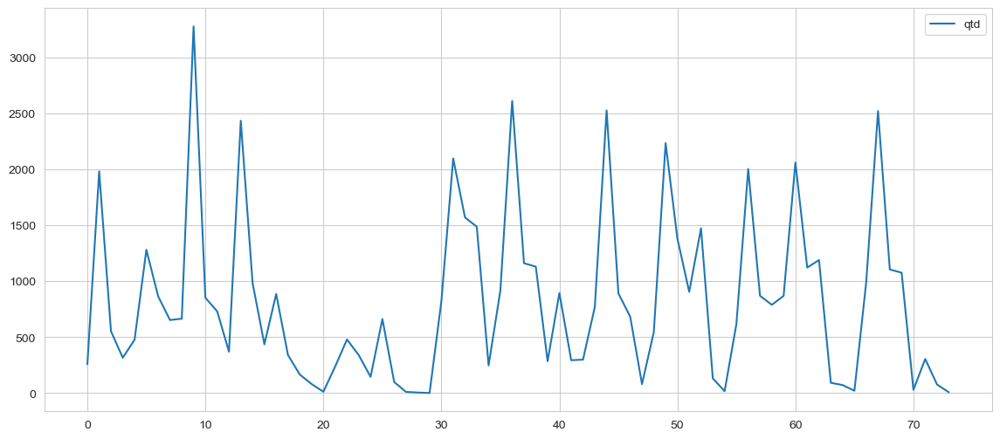

In [456]:
dtregion.plot(stacked=True)

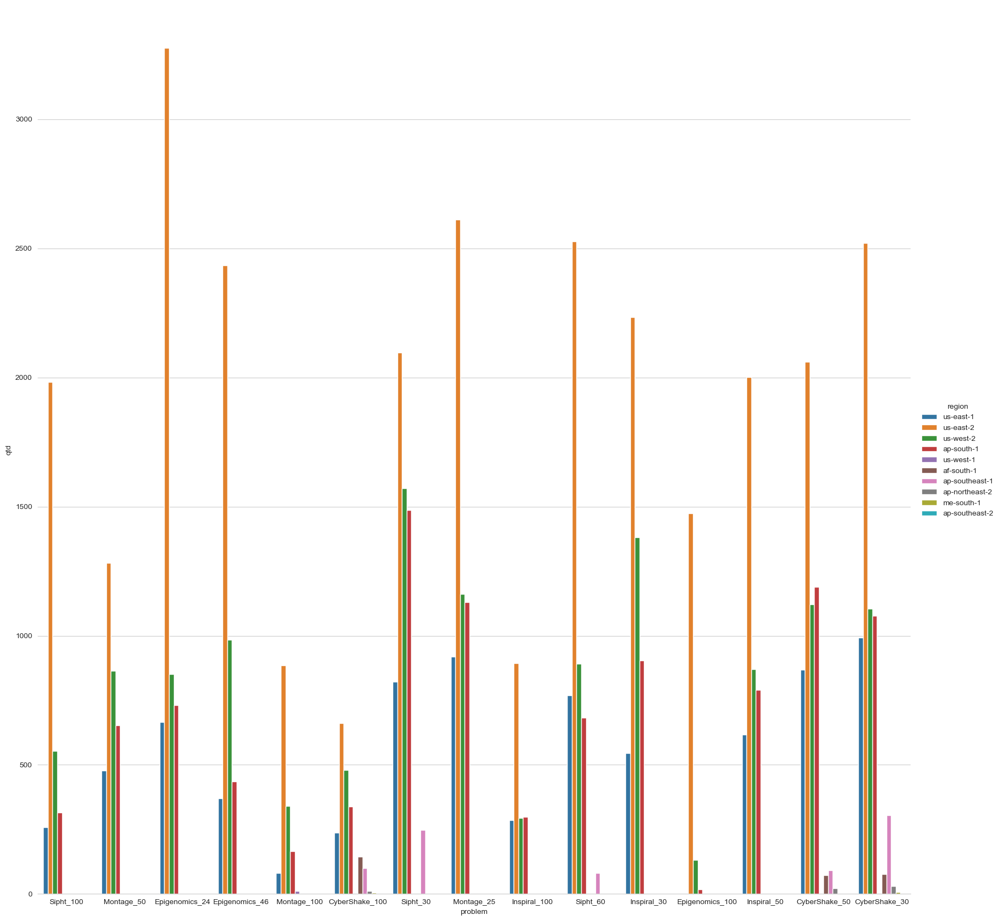

In [495]:
g=sns.catplot(x='problem', y='qtd', hue='region', data=dtregion, kind='bar', height=17, aspect=1)
g.despine(left=True)
g

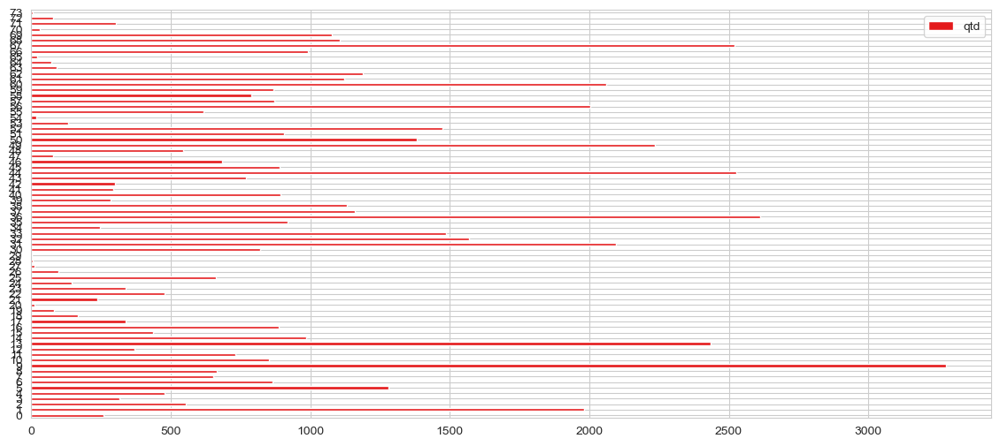

In [471]:
cl=['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#ffff33','#a65628','#f781bf']
["r", "lime", "royalblue", "orange", 'deeppink', 'darkgreen', 'y', 'w']
# create stacked bar chart for monthly temperatures
ax = dtregion

<AxesSubplot:ylabel='problem,region'>

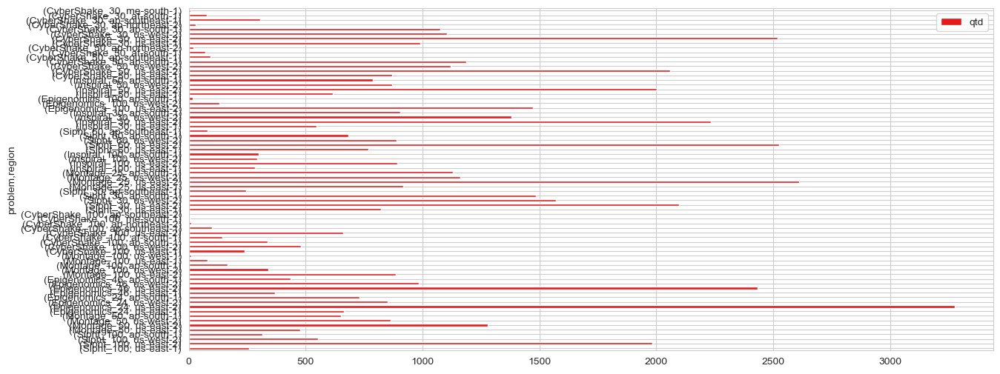

In [496]:
dtregion.set_index(['problem', 'region']).plot(kind='barh', color=cl, stacked=True)

In [476]:
dtregion.T.plot(kind='barh', color=cl)

TypeError: no numeric data to plot

In [497]:
dtregion

,problem,region,qtd
0,Sipht_100,us-east-1,258
1,Sipht_100,us-east-2,1982
2,Sipht_100,us-west-2,553
3,Sipht_100,ap-south-1,316
4,Montage_50,us-east-1,477
...,...,...,...
69,CyberShake_30,ap-south-1,1076
70,CyberShake_30,ap-northeast-2,30
71,CyberShake_30,ap-southeast-1,305
72,CyberShake_30,af-south-1,77


<AxesSubplot:xlabel='problem,region'>

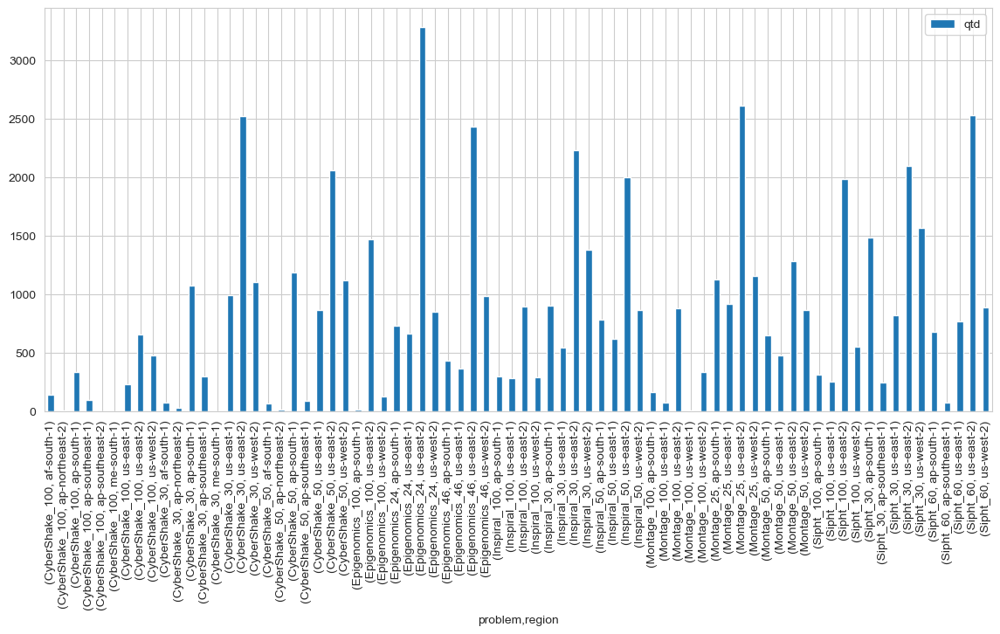

In [502]:
dtregion.groupby(['problem']).sum().plot(kind='bar', stacked=True)

<AxesSubplot:xlabel='problem'>

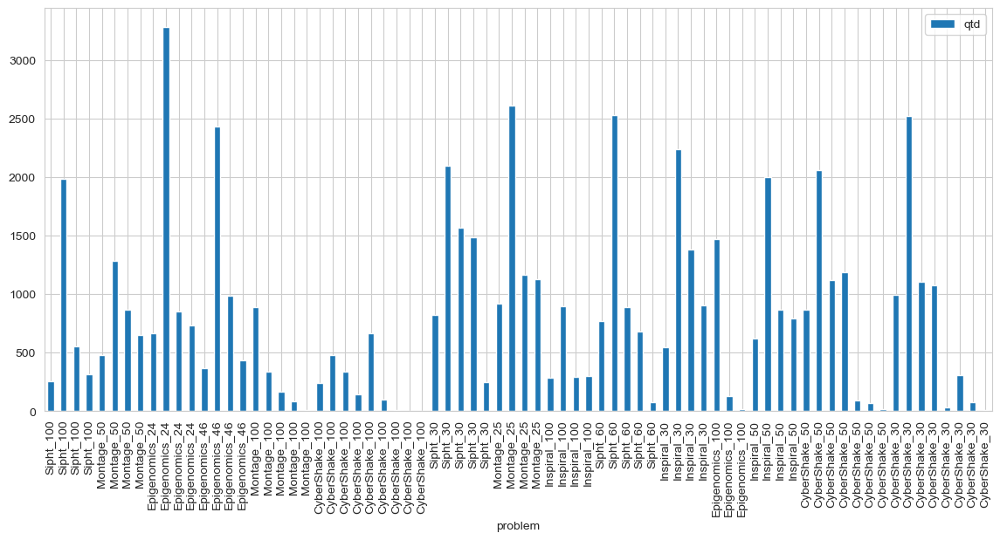

In [503]:
dtregion.set_index(['problem']).plot(kind='bar', stacked=True)

In [507]:
print(dtregion)

          problem          region   qtd
0       Sipht_100       us-east-1   258
1       Sipht_100       us-east-2  1982
2       Sipht_100       us-west-2   553
3       Sipht_100      ap-south-1   316
4      Montage_50       us-east-1   477
..            ...             ...   ...
69  CyberShake_30      ap-south-1  1076
70  CyberShake_30  ap-northeast-2    30
71  CyberShake_30  ap-southeast-1   305
72  CyberShake_30      af-south-1    77
73  CyberShake_30      me-south-1     7

[74 rows x 3 columns]


In [508]:
todt

[{'problem': 'Sipht_100', 'region': 'us-east-1', 'qtd': 258},
 {'problem': 'Sipht_100', 'region': 'us-east-2', 'qtd': 1982},
 {'problem': 'Sipht_100', 'region': 'us-west-2', 'qtd': 553},
 {'problem': 'Sipht_100', 'region': 'ap-south-1', 'qtd': 316},
 {'problem': 'Montage_50', 'region': 'us-east-1', 'qtd': 477},
 {'problem': 'Montage_50', 'region': 'us-east-2', 'qtd': 1281},
 {'problem': 'Montage_50', 'region': 'us-west-2', 'qtd': 864},
 {'problem': 'Montage_50', 'region': 'ap-south-1', 'qtd': 653},
 {'problem': 'Epigenomics_24', 'region': 'us-east-1', 'qtd': 665},
 {'problem': 'Epigenomics_24', 'region': 'us-east-2', 'qtd': 3277},
 {'problem': 'Epigenomics_24', 'region': 'us-west-2', 'qtd': 852},
 {'problem': 'Epigenomics_24', 'region': 'ap-south-1', 'qtd': 731},
 {'problem': 'Epigenomics_46', 'region': 'us-east-1', 'qtd': 370},
 {'problem': 'Epigenomics_46', 'region': 'us-east-2', 'qtd': 2434},
 {'problem': 'Epigenomics_46', 'region': 'us-west-2', 'qtd': 984},
 {'problem': 'Epigenomic

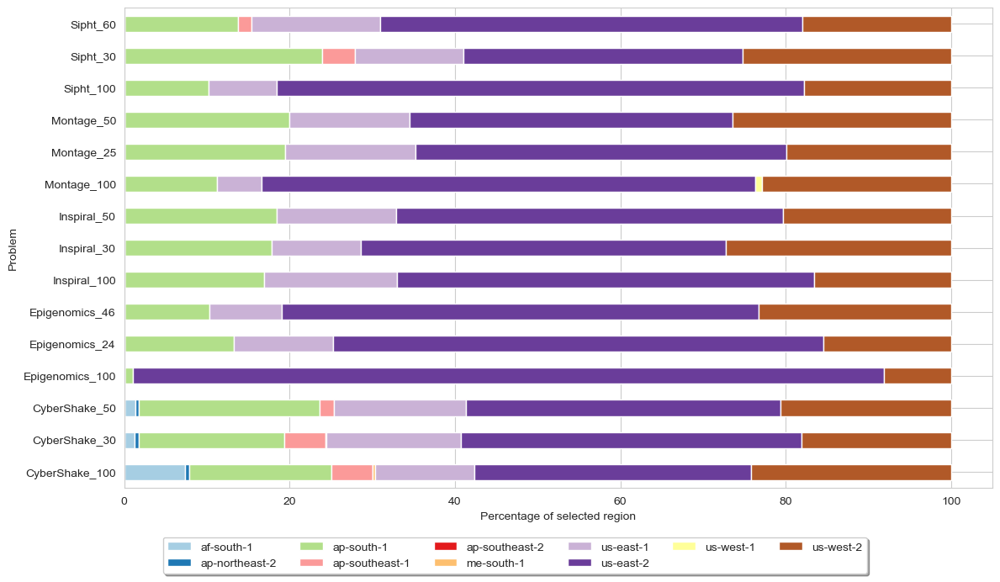

In [588]:
dfx = pd.DataFrame(todt)

pivot_df = dfx.pivot(index='problem', columns='region', values='qtd')

percentages = pivot_df.div(pivot_df.sum(axis=1), axis=0) * 100

# Plotting
ax = percentages.plot(kind='barh', stacked=True, figsize=(12, 7), colormap="Paired")



# Adding labels and title
plt.xlabel('Percentage of selected region')
plt.ylabel('Problem')
#plt.title('Stacked Horizontal Bar Plot (Percentage)')
plt.legend(loc='upper center', bbox_to_anchor=(0.45, -0.09), fancybox=True, shadow=True, ncol=6)

# Show plot
#
plt.tight_layout()
plt.savefig('figures/percentual.png')

<Figure size 1400x600 with 0 Axes>

In [540]:
plt.show()